# Datathon #5: mHealth prediction

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
import warnings
import io
from google.colab import files

from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.model_selection import KFold, train_test_split, GridSearchCV, RandomizedSearchCV, cross_validate
from sklearn.metrics import mean_squared_error, classification_report, confusion_matrix, roc_auc_score, roc_curve

from sklearn.impute import SimpleImputer
from sklearn.metrics import RocCurveDisplay, auc

from sklearn.model_selection import train_test_split
from sklearn.utils import resample

import torch as t
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import StratifiedKFold

from tensorflow.keras.preprocessing.sequence import pad_sequences

import time

warnings.filterwarnings('ignore')


In [2]:
# Choose the dataset to upload
uploaded = files.upload()

Saving mhealth.csv to mhealth.csv


In [3]:
# Read the dataset into a Pandas DataFrame
df = pd.read_csv(io.BytesIO(uploaded['mhealth.csv']))
#df = pd.read_csv('mhealth.csv')

# Inspect the first five rows of the data
df.head()

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject
0,2.1849,-9.6967,0.63077,0.103900,-0.84053,-0.68762,-8.6499,-4.5781,0.187760,-0.44902,-1.0103,0.034483,0,subject1
1,2.3876,-9.5080,0.68389,0.085343,-0.83865,-0.68369,-8.6275,-4.3198,0.023595,-0.44902,-1.0103,0.034483,0,subject1
2,2.4086,-9.5674,0.68113,0.085343,-0.83865,-0.68369,-8.5055,-4.2772,0.275720,-0.44902,-1.0103,0.034483,0,subject1
3,2.1814,-9.4301,0.55031,0.085343,-0.83865,-0.68369,-8.6279,-4.3163,0.367520,-0.45686,-1.0082,0.025862,0,subject1
4,2.4173,-9.3889,0.71098,0.085343,-0.83865,-0.68369,-8.7008,-4.1459,0.407290,-0.45686,-1.0082,0.025862,0,subject1


In [3]:
df = pd.read_csv('mhealth.csv')

# <font color='pink' size=4>Missing Data - None!</font>

In [ ]:
# Calculating the missing threshold based on the sampled data
missing_threshold = 0.5 * len(df)

# Identifying columns with more than 50% missing values
columns_to_drop = df.columns[df.isnull().sum() > missing_threshold] # None missing!

# Calculating the number of missing values in each column of the sampled dataset
missing_values = df.isnull().sum()

missing_values, columns_to_drop

(alx         0
 aly         0
 alz         0
 glx         0
 gly         0
 glz         0
 arx         0
 ary         0
 arz         0
 grx         0
 gry         0
 grz         0
 Activity    0
 subject     0
 dtype: int64,
 Index([], dtype='object'))


# <font color='pink' size=4>Exploratory Data Analysis </font>


Activity count total

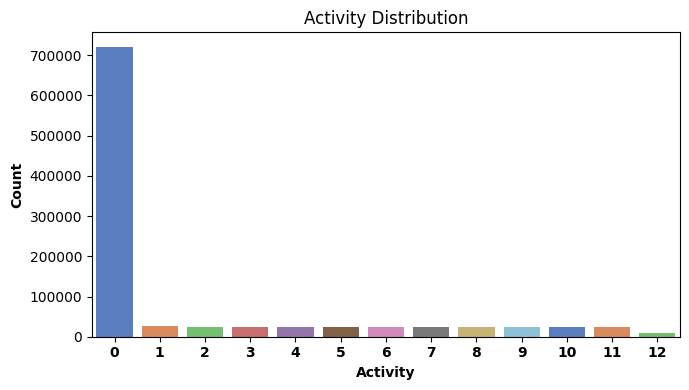

In [ ]:
plt.figure(figsize=(7,4))
sns.countplot(x='Activity', data=df, palette='muted')
plt.title('Activity Distribution')
plt.xlabel('Activity', fontweight='bold')
plt.ylabel('Count', fontweight='bold')
plt.xticks(fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
# Number of samples per activity
df['Activity'].value_counts()

0     720946
1      27648
2      25406
3      24576
4      24576
9      24576
10     24576
11     24576
5      24576
7      23809
8      23501
6      22990
12      8243
Name: Activity, dtype: int64

Activity count across subjects

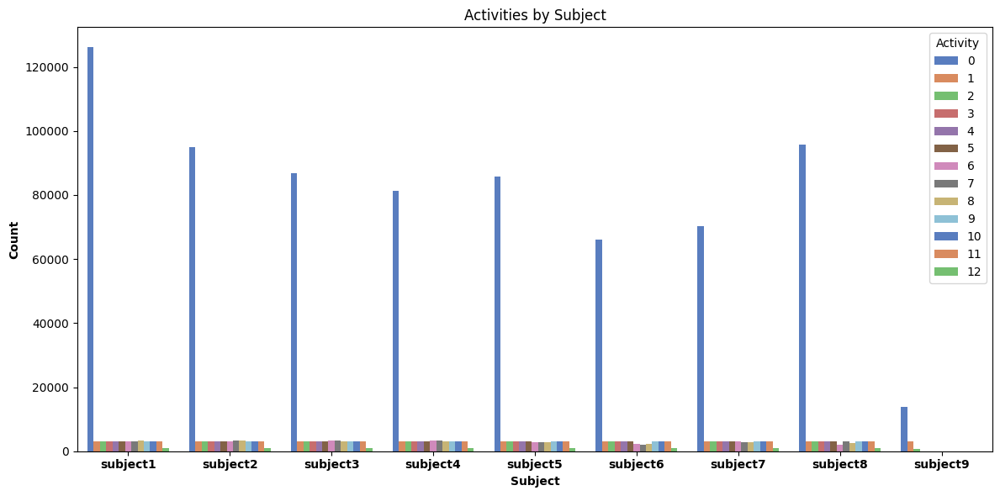

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(data=df,x='subject',hue='Activity',palette='muted')
plt.title('Activities by Subject')
plt.xlabel('Subject', fontweight='bold')
plt.ylabel('Count', fontweight='bold')
plt.xticks(fontweight='bold') #rotation=45,
plt.tight_layout()
plt.show()

In [ ]:
# Number of records per subject
df['subject'].value_counts()

subject1    161280
subject2    130561
subject8    129024
subject3    122112
subject5    119808
subject4    116736
subject7    104448
subject6     98304
subject9     17726
Name: subject, dtype: int64

Filter out activity 0 just to see rest of the distribution more clearly

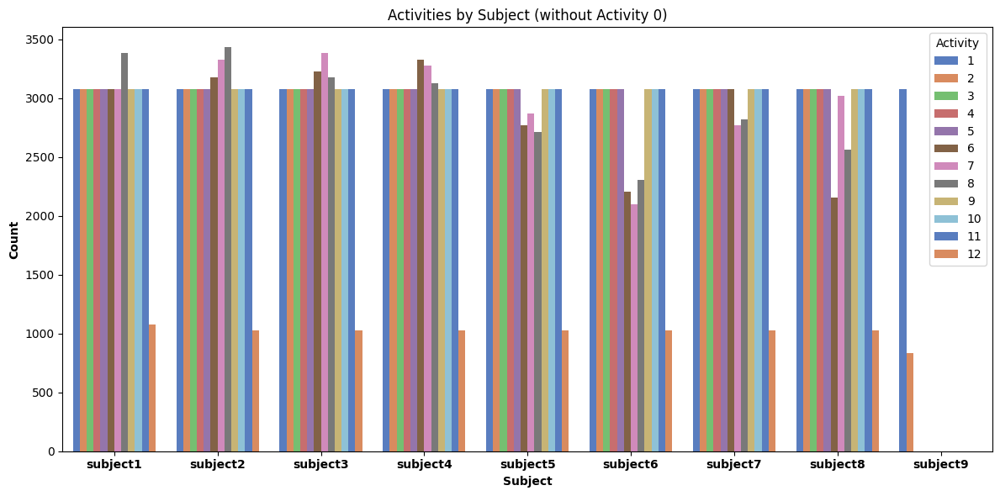

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(data=df[df['Activity']>0],x='subject',hue='Activity',palette='muted')
plt.title('Activities by Subject (without Activity 0)')
plt.xlabel('Subject', fontweight='bold')
plt.ylabel('Count', fontweight='bold')
plt.xticks(fontweight='bold')
#plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# <font color='pink' size=4>Trajectory of different variables over time </font>


# <font color='skyblue' size=3>Activity over time </font>


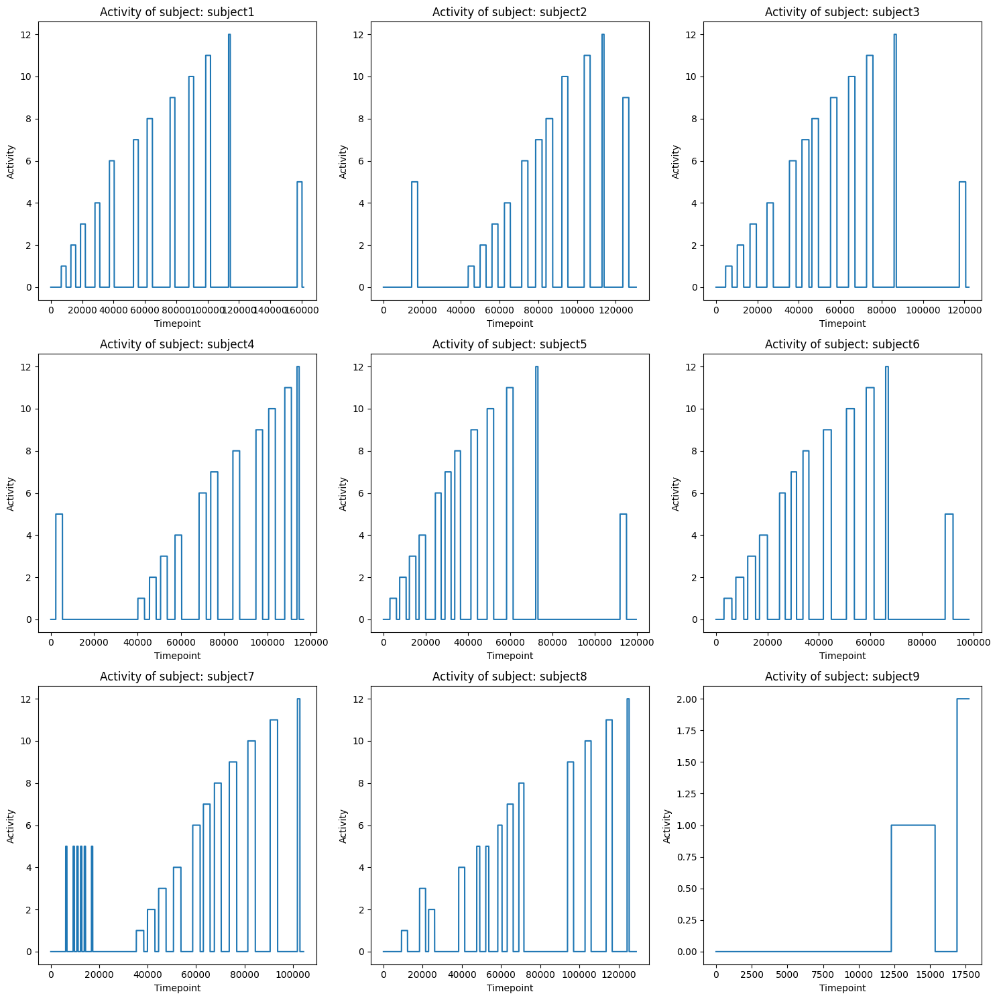

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15,15), sharex=False, sharey=False)
axes = axes.ravel()
subs = df['subject'].unique()

for sub, ax in zip(subs, axes):
  subset=df[df['subject'] == sub]
  x_len=np.arange(0,len(subset)) # we define an arbitrary timescale as the data is sequential
  sns.lineplot(data=subset, y='Activity', x = x_len, ax=ax)
  ax.tick_params(axis='x')
  ax.set(title=f'Activity of subject: {sub}', xlabel='Timepoint')

fig.tight_layout()
plt.show()

# <font color='skyblue' size=3>Acceleration sensor - chest </font>


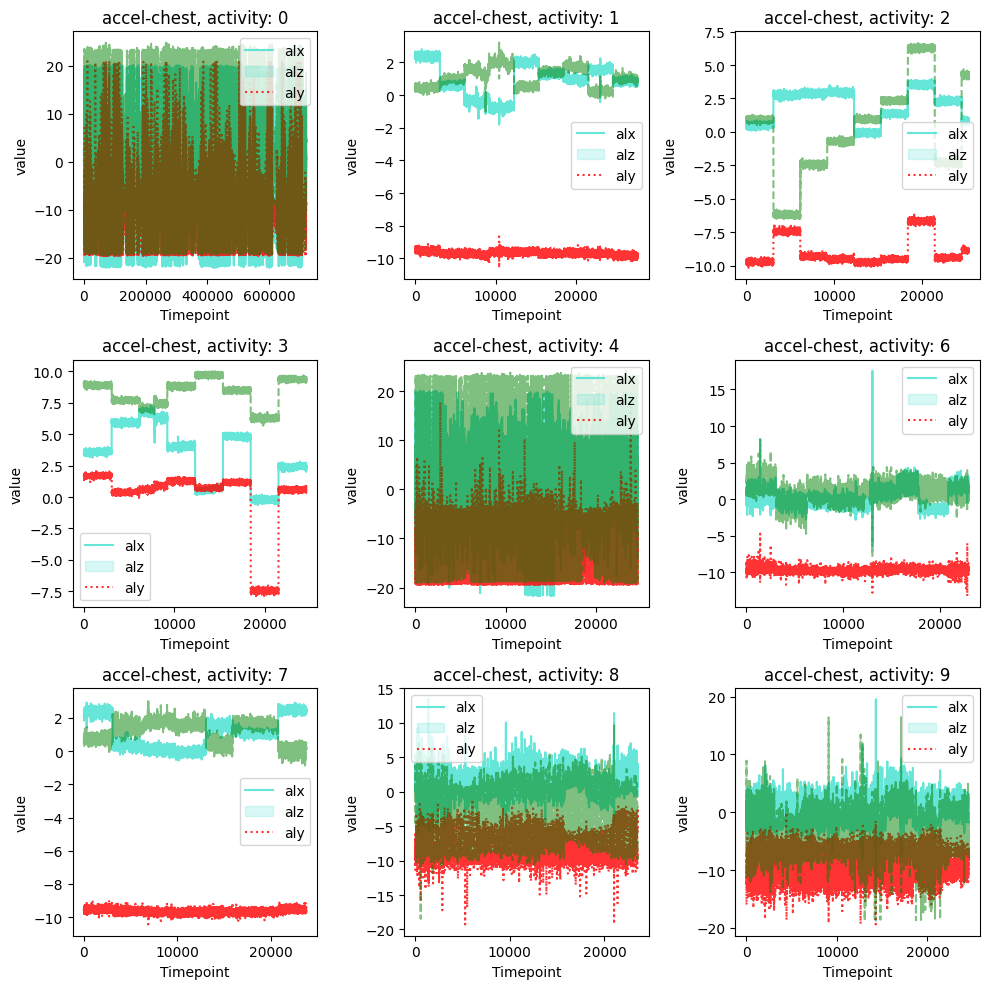

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,10), sharex=False, sharey=False)
axes = axes.ravel()
acts = df['Activity'].unique()

for act, ax in zip(acts, axes):
  subset=df[df['Activity'] == act]
  x_len=np.arange(0,len(subset))
  sns.lineplot(data=subset, y='alx', x=x_len, ax=ax, color='turquoise',alpha=0.8)
  sns.lineplot(data=subset, y='aly', x=x_len, ax=ax, color='red',alpha=0.8,linestyle='dotted')
  sns.lineplot(data=subset, y='alz', x=x_len, ax=ax, color='green', alpha=0.5,linestyle='dashed')
  ax.legend(['alx', 'alz', 'aly']) #for some reason legend in the wrong order so I changed legend
  ax.tick_params(axis='x')
  ax.set(title=f'accel-chest, activity: {act}', xlabel='Timepoint', ylabel='value')

fig.tight_layout()
plt.show()

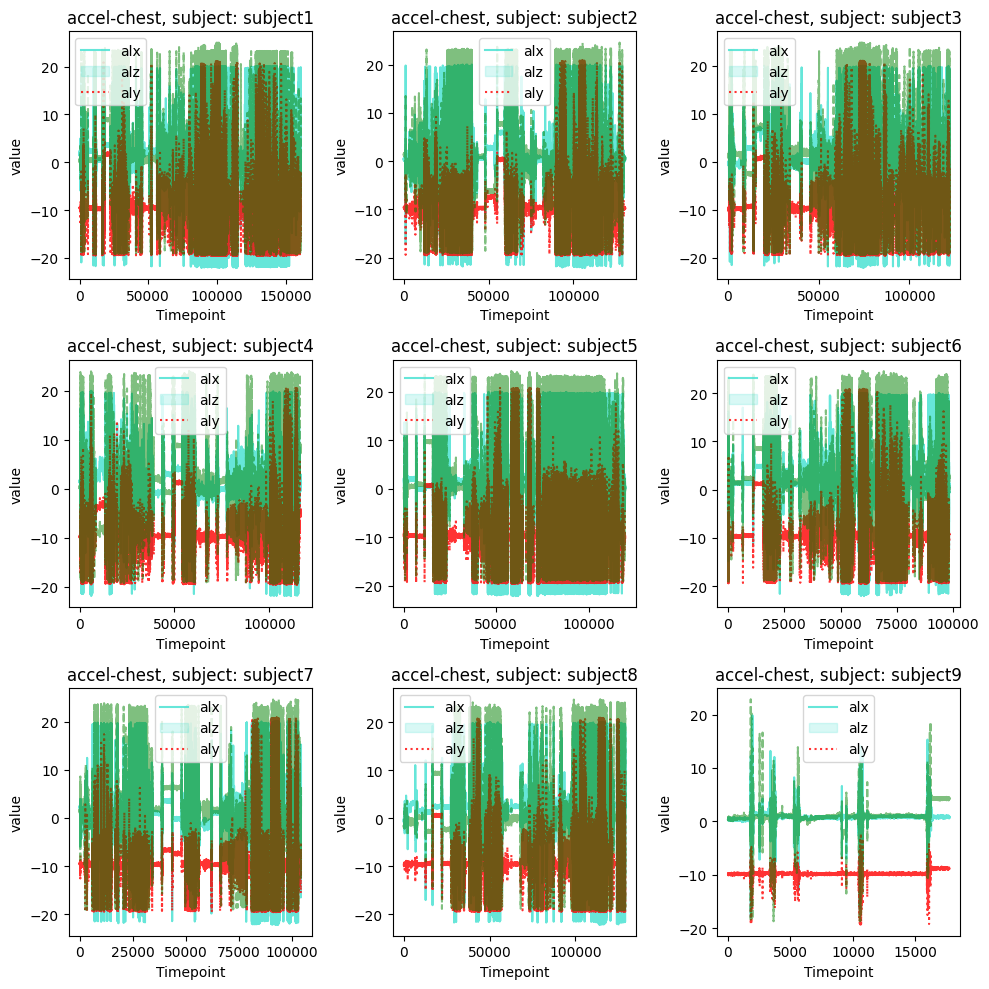

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,10), sharex=False, sharey=False)
axes = axes.ravel()
subs = df['subject'].unique()

for sub, ax in zip(subs, axes):
  subset=df[df['subject'] == sub]
  x_len=np.arange(0,len(subset))
  sns.lineplot(data=subset, y='alx', x=x_len, ax=ax, color='turquoise',alpha=0.8)
  sns.lineplot(data=subset, y='aly', x=x_len, ax=ax, color='red',alpha=0.8,linestyle='dotted')
  sns.lineplot(data=subset, y='alz', x=x_len, ax=ax, color='green', alpha=0.5,linestyle='dashed')
  ax.legend(['alx', 'alz', 'aly']) #for some reason legend in the wrong order so I changed legend
  ax.tick_params(axis='x')
  ax.set(title=f'accel-chest, subject: {sub}', xlabel='Timepoint', ylabel='value')

fig.tight_layout()
plt.show()

# <font color='skyblue' size=3>Gyro left ankle </font>

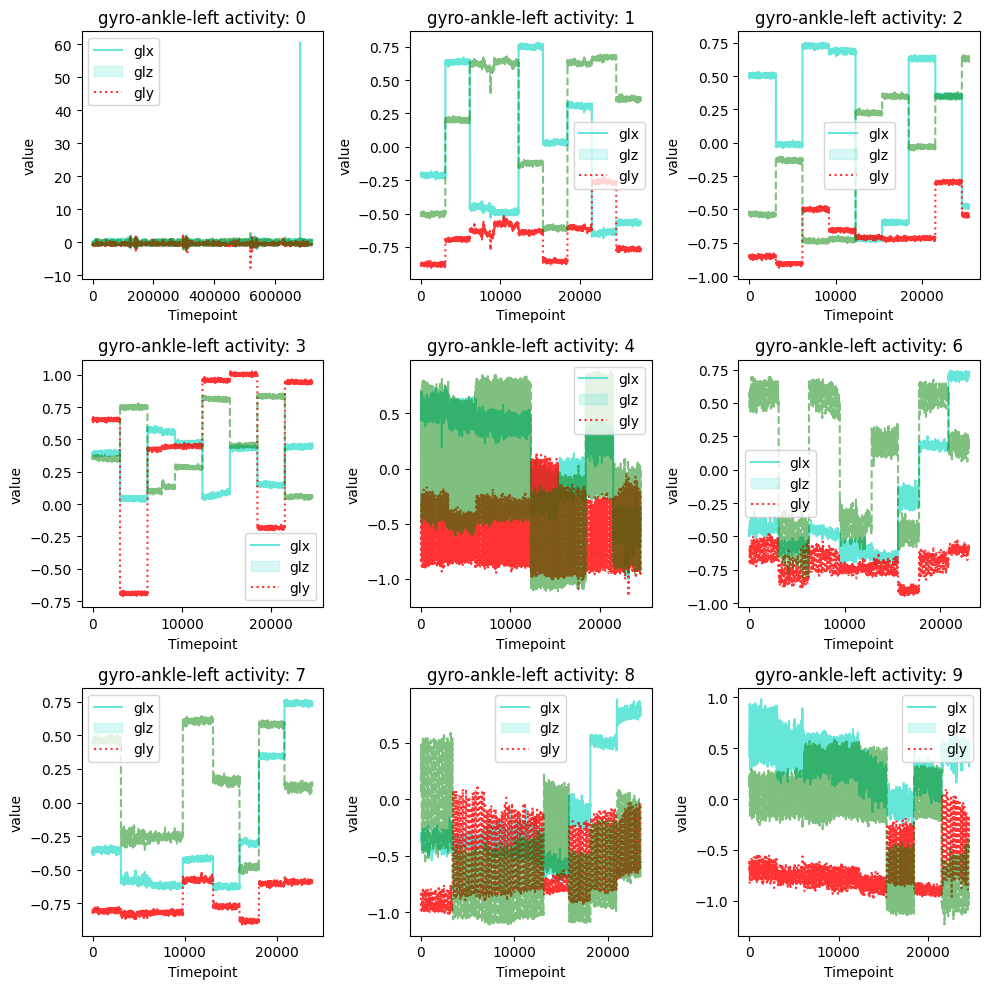

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,10), sharex=False, sharey=False)
axes = axes.ravel()
acts = df['Activity'].unique()

for act, ax in zip(acts, axes):
  subset=df[df['Activity'] == act]
  x_len=np.arange(0,len(subset))
  sns.lineplot(data=subset, y='glx', x=x_len, ax=ax, color='turquoise',alpha=0.8)
  sns.lineplot(data=subset, y='gly', x=x_len, ax=ax, color='red',alpha=0.8,linestyle='dotted')
  sns.lineplot(data=subset, y='glz', x=x_len, ax=ax, color='green', alpha=0.5,linestyle='dashed')
  ax.legend(['glx', 'glz', 'gly']) #for some reason legend in the wrong order so I changed legend
  ax.tick_params(axis='x')
  ax.set(title=f'gyro-ankle-left activity: {act}', xlabel='Timepoint', ylabel='value')

fig.tight_layout()
plt.show()

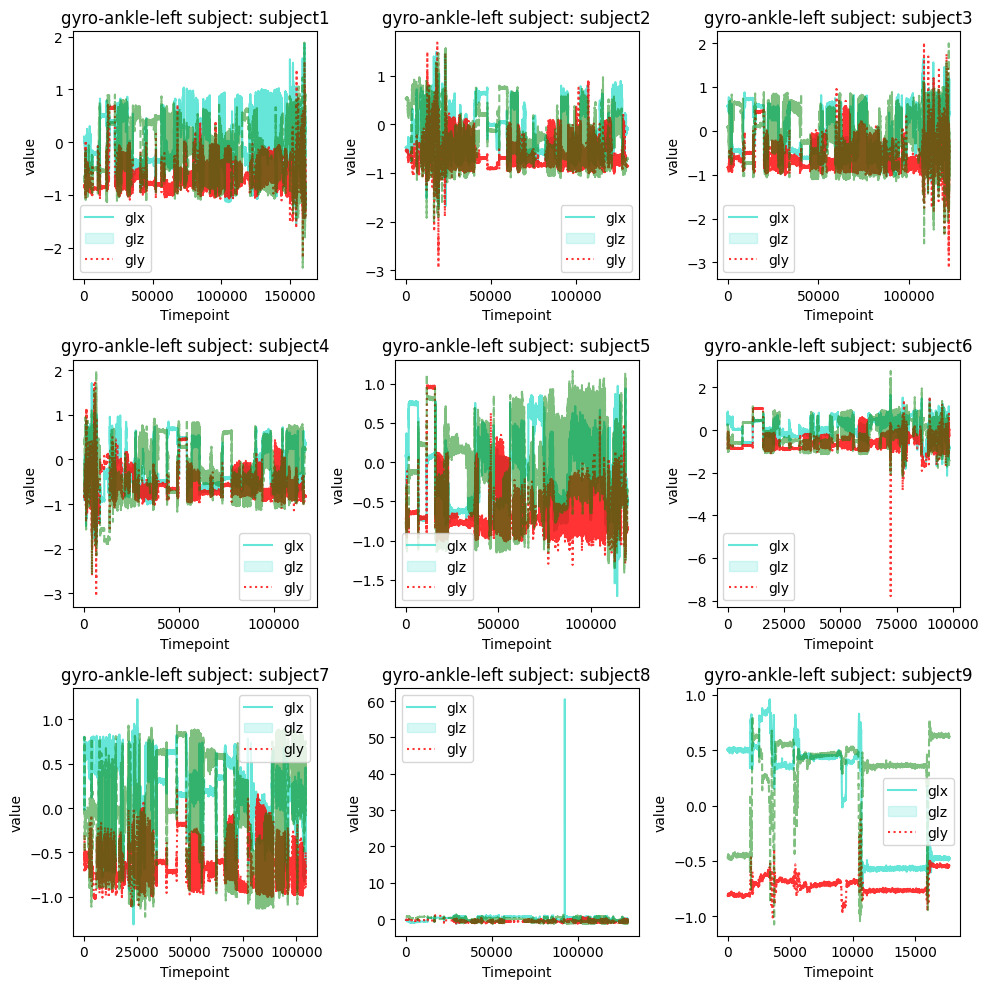

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,10), sharex=False, sharey=False)
axes = axes.ravel()
subs = df['subject'].unique()

for sub, ax in zip(subs, axes):
  subset=df[df['subject'] == sub]
  x_len=np.arange(0,len(subset))
  sns.lineplot(data=subset, y='glx', x=x_len, ax=ax, color='turquoise',alpha=0.8)
  sns.lineplot(data=subset, y='gly', x=x_len, ax=ax, color='red',alpha=0.8,linestyle='dotted')
  sns.lineplot(data=subset, y='glz', x=x_len, ax=ax, color='green', alpha=0.5,linestyle='dashed')
  ax.legend(['glx', 'glz', 'gly']) #for some reason legend in the wrong order so I changed legend
  ax.tick_params(axis='x')
  ax.set(title=f'gyro-ankle-left subject: {sub}', xlabel='Timepoint', ylabel='value')

fig.tight_layout()
plt.show()

# <font color='skyblue' size=3>Acceleration - right lower arm </font>


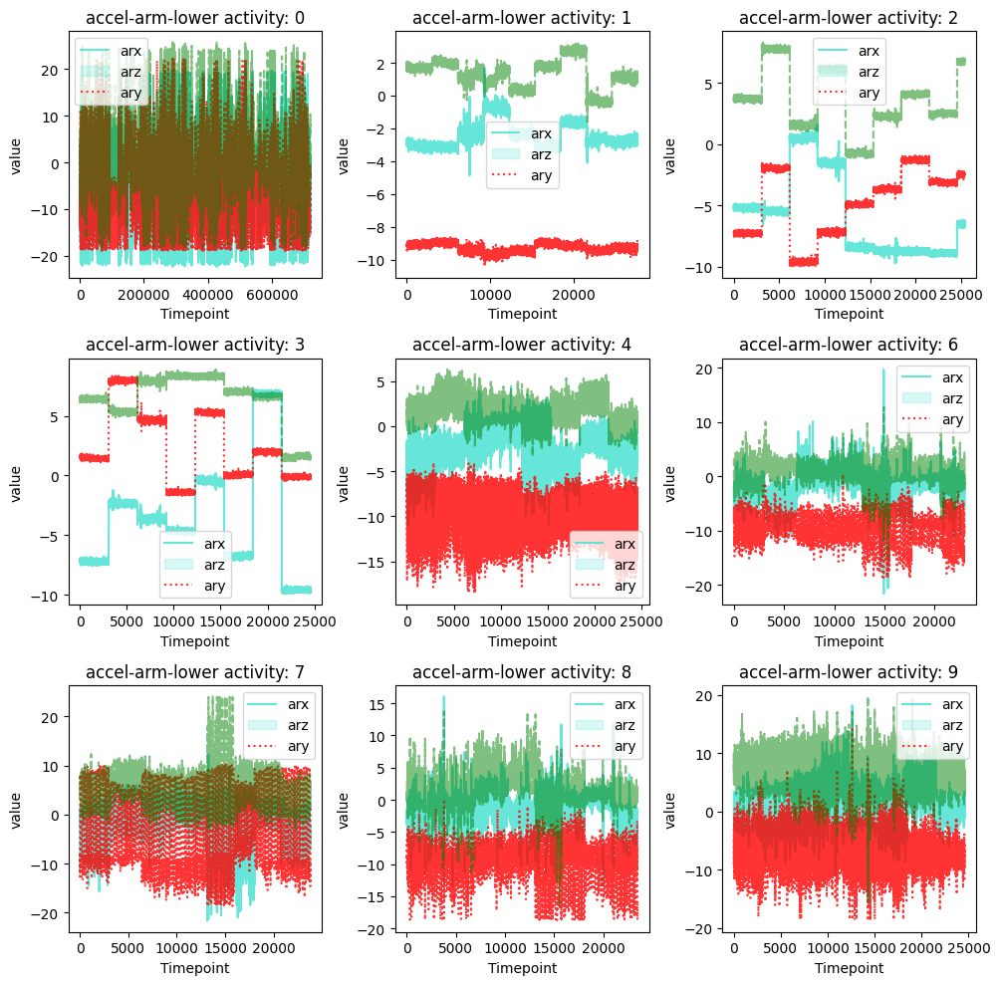

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,10), sharex=False, sharey=False)
axes = axes.ravel()
acts = df['Activity'].unique()

for act, ax in zip(acts, axes):
  subset=df[df['Activity'] == act]
  x_len=np.arange(0,len(subset))
  sns.lineplot(data=subset, y='arx', x=x_len, ax=ax, color='turquoise',alpha=0.8)
  sns.lineplot(data=subset, y='ary', x=x_len, ax=ax, color='red',alpha=0.8,linestyle='dotted')
  sns.lineplot(data=subset, y='arz', x=x_len, ax=ax, color='green', alpha=0.5,linestyle='dashed')
  ax.legend(['arx', 'arz', 'ary']) #for some reason legend in the wrong order so I changed legend
  ax.tick_params(axis='x')
  ax.set(title=f'accel-arm-lower activity: {act}', xlabel='Timepoint', ylabel='value')

fig.tight_layout()
plt.show()

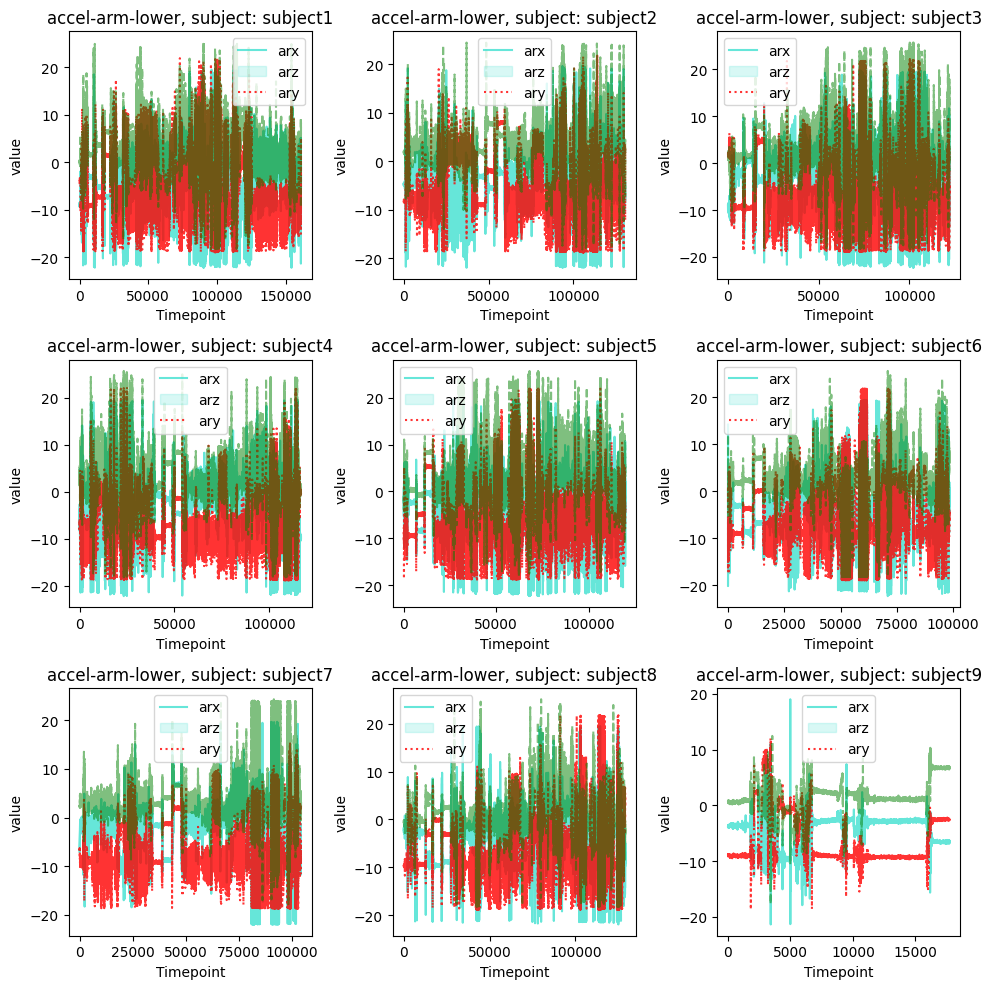

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,10), sharex=False, sharey=False)
axes = axes.ravel()
subs = df['subject'].unique()

for sub, ax in zip(subs, axes):
  subset=df[df['subject'] == sub]
  x_len=np.arange(0,len(subset))
  sns.lineplot(data=subset, y='arx', x=x_len, ax=ax, color='turquoise',alpha=0.8)
  sns.lineplot(data=subset, y='ary', x=x_len, ax=ax, color='red',alpha=0.8,linestyle='dotted')
  sns.lineplot(data=subset, y='arz', x=x_len, ax=ax, color='green', alpha=0.5,linestyle='dashed')
  ax.legend(['arx', 'arz', 'ary']) #for some reason legend in the wrong order so I changed legend
  ax.tick_params(axis='x')
  ax.set(title=f'accel-arm-lower, subject: {sub}', xlabel='Timepoint', ylabel='value')

fig.tight_layout()
plt.show()

# <font color='skyblue' size=3>Gyro - right lower arm </font>

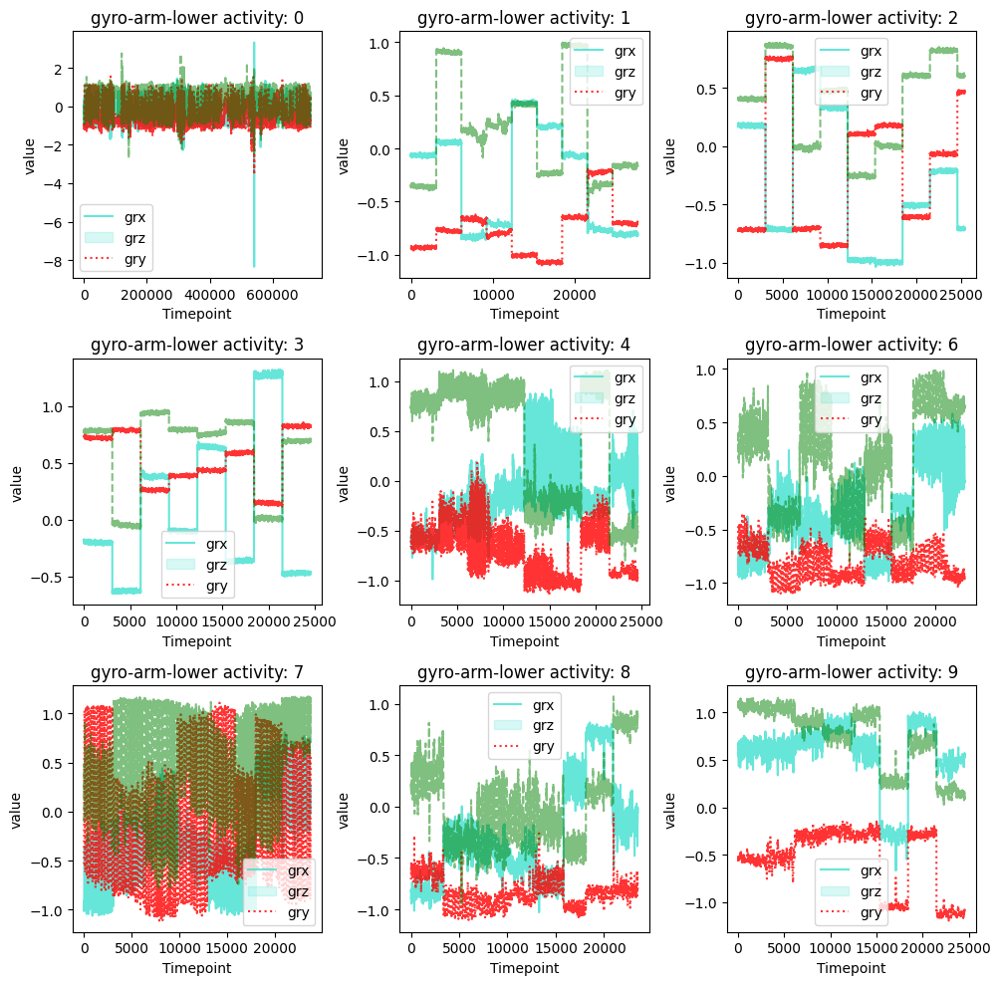

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,10), sharex=False, sharey=False)
axes = axes.ravel()
acts = df['Activity'].unique()

for act, ax in zip(acts, axes):
  subset=df[df['Activity'] == act]
  x_len=np.arange(0,len(subset))
  sns.lineplot(data=subset, y='grx', x=x_len, ax=ax, color='turquoise',alpha=0.8)
  sns.lineplot(data=subset, y='gry', x=x_len, ax=ax, color='red',alpha=0.8,linestyle='dotted')
  sns.lineplot(data=subset, y='grz', x=x_len, ax=ax, color='green', alpha=0.5,linestyle='dashed')
  ax.legend(['grx', 'grz', 'gry']) #for some reason legend in the wrong order so I changed legend
  ax.tick_params(axis='x')
  ax.set(title=f'gyro-arm-lower activity: {act}', xlabel='Timepoint', ylabel='value')

fig.tight_layout()
plt.show()

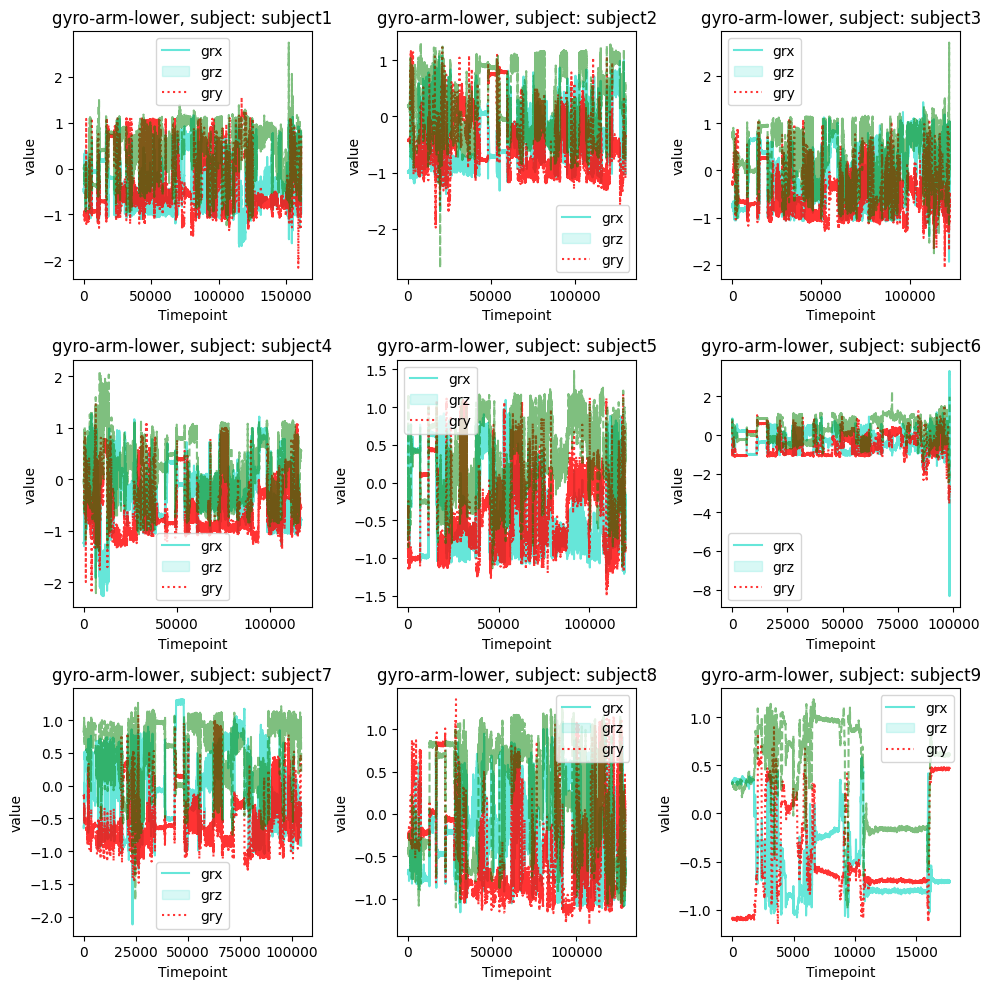

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,10), sharex=False, sharey=False)
axes = axes.ravel()
subs = df['subject'].unique()

for sub, ax in zip(subs, axes):
  subset=df[df['subject'] == sub]
  x_len=np.arange(0,len(subset))
  sns.lineplot(data=subset, y='grx', x=x_len, ax=ax, color='turquoise',alpha=0.8)
  sns.lineplot(data=subset, y='gry', x=x_len, ax=ax, color='red',alpha=0.8,linestyle='dotted')
  sns.lineplot(data=subset, y='grz', x=x_len, ax=ax, color='green', alpha=0.5,linestyle='dashed')
  ax.legend(['grx', 'grz', 'gry']) #for some reason legend in the wrong order so I changed legend
  ax.tick_params(axis='x')
  ax.set(title=f'gyro-arm-lower, subject: {sub}', xlabel='Timepoint', ylabel='value')

fig.tight_layout()
plt.show()

# <font color='pink' size=4>Variable distributions </font>

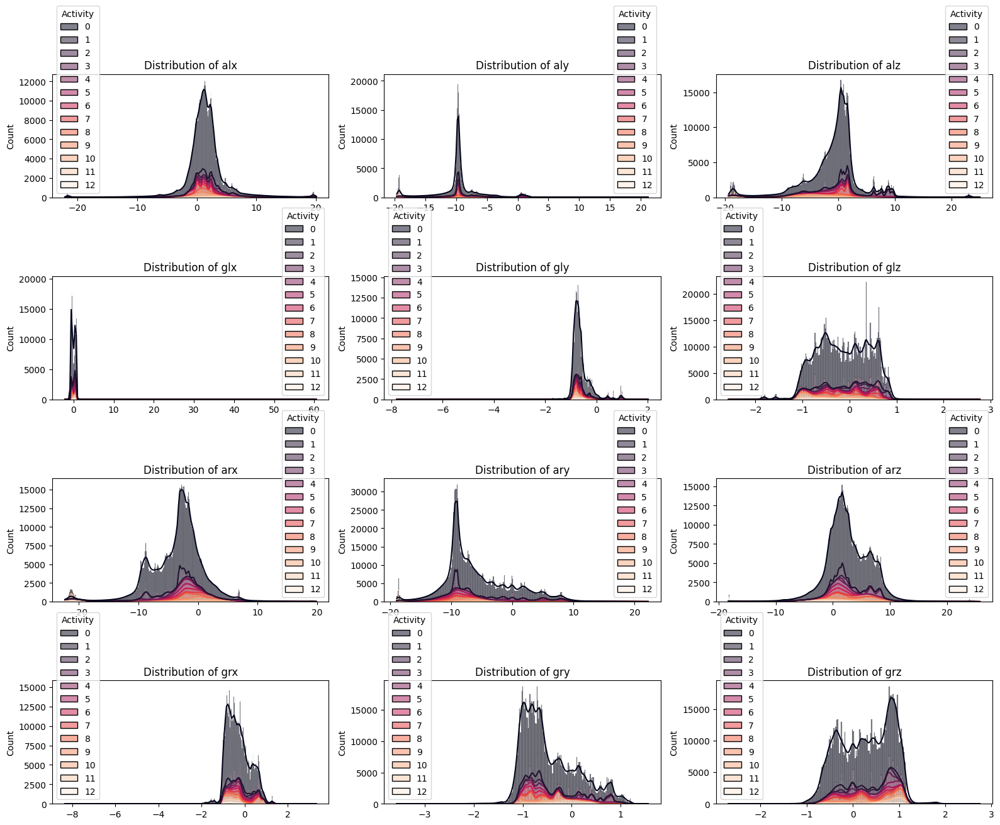

In [ ]:
#Batch process as running this loop on entire dataset causes system to crash

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(16, 13), sharex=False, sharey=False)
axes = axes.ravel()
cols = df.columns[:-2]

for col, ax in zip(cols, axes):
    #sns.histplot(data=df, x=col, fill=True, ax=ax)
    sns.histplot(df, x=col, hue='Activity', kde=True, palette='rocket', ax=ax,
                 multiple='stack')
    #ax.tick_params(axis='x', rotation=90)
    ax.set(title=f'Distribution of {col}', xlabel=None)

#fig.delaxes(axes[5])  # delete the empty subplot
fig.tight_layout()
plt.show()

Distribution of variables without class 0

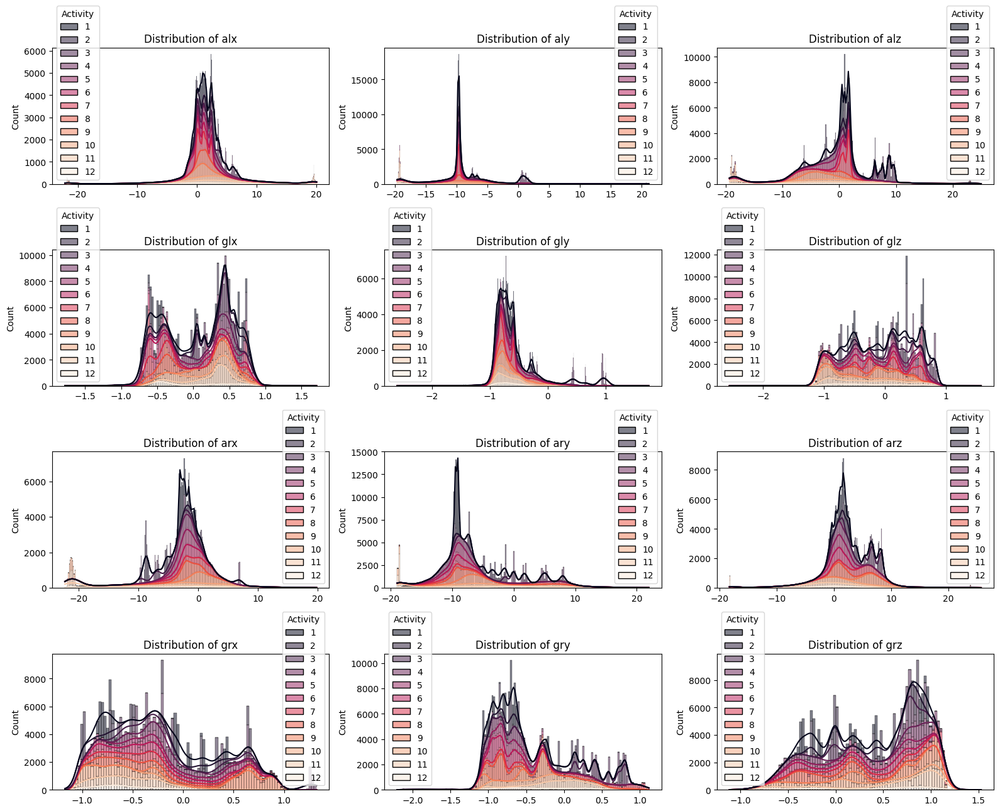

In [ ]:
# WITHOUT CLASS 0

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(16, 13), sharex=False, sharey=False)
axes = axes.ravel()
cols = df.columns[:-2]

for col, ax in zip(cols, axes):
    #sns.histplot(data=df, x=col, fill=True, ax=ax)
    sns.histplot(df[df['Activity']>0], x=col, hue='Activity', kde=True, palette='rocket', ax=ax,
                 multiple='stack')
    #ax.tick_params(axis='x', rotation=90)
    ax.set(title=f'Distribution of {col}', xlabel=None)

#fig.delaxes(axes[5])  # delete the empty subplot
fig.tight_layout()
plt.show()

# <font color='skyblue' size=4>Correlation matrix </font>


Moderate correlation (~0.6) between (ary, gry), (glx, grz)

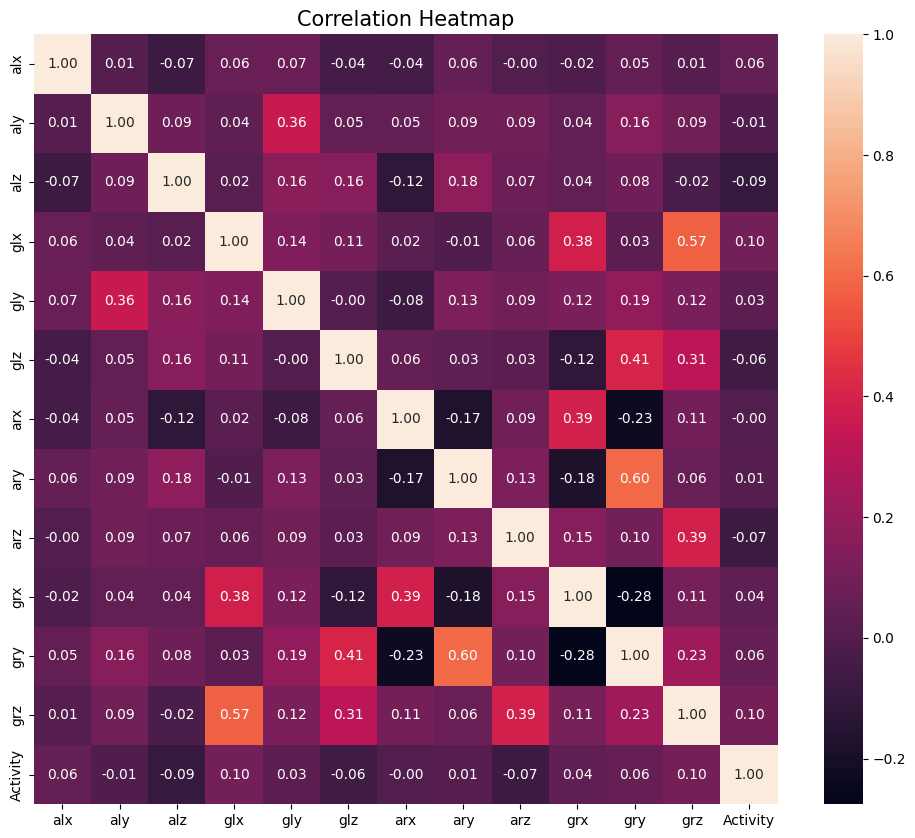

In [ ]:
# Recalculate the correlation matrix without the '_id' columns
correlation_matrix = df.corr() #df[numerical_features].corr()

# Plot the updated correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f")#, cmap='magma')
plt.title('Correlation Heatmap', fontsize=15)
plt.show()

<hr>

# <font color='pink' size=5>Feature Engineering</font>

This code adds a new column to segment each individual activity sequence within each subject.
e.g., rep1 = first repetition of activity, rep2 = second repetition of activity

In [4]:
subjects=df['subject'].unique()
reps_list=[]

for sub in df['subject'].unique():

  print(f'########## SUBJECT {sub} ##########')

  subset=df[df['subject'] == sub]

  base=subset['Activity'].iloc[0]
  print(f'First value: {base}')

  track=1
  rep_tracker={}

  for index, row in subset.iterrows():

    # If current value is equal to the first value seen in this subset
    # Start the track
    if row['Activity']==base and row['Activity'] not in rep_tracker:

      print('########## START THE TRACK #########')
      print(f'Current activity:{row.Activity}')

      rep_tracker[row['Activity']]=track
      reps_list.append(f'rep{track}')

    # If sequence is still ongoing and already recognized
    # Just keep it as whatever the rep track is
    elif row['Activity']==base and row['Activity'] in rep_tracker:
      #print('SEQUENCE ONGOING')
      reps_list.append(f'rep{rep_tracker[row.Activity]}')

    # If value changes, e.g. 0 to 1 and is completely new
    # Change the base to the new value and set new tracker
    elif row['Activity']!=base and row['Activity'] not in rep_tracker:
      print('########## ACTIVITY CHANGED #########')
      track=1
      base=row['Activity'] #new value
      print(f'New activity: {base}')
      rep_tracker[row['Activity']]=track
      reps_list.append(f'rep{track}')

    # If sequence changes back to an already recognized activity
    # Increment track by 1 = they did this activity again
    elif row['Activity']!=base and row['Activity'] in rep_tracker:
      base=row['Activity']
      print(f'######### BACK TO {base} #########')
      track+=1
      rep_tracker[row['Activity']]=rep_tracker[row['Activity']]+1
      reps_list.append(f'rep{track}')

########## SUBJECT subject1 ##########
First value: 0
########## START THE TRACK #########
Current activity:0
########## ACTIVITY CHANGED #########
New activity: 1
######### BACK TO 0 #########
########## ACTIVITY CHANGED #########
New activity: 2
######### BACK TO 0 #########
########## ACTIVITY CHANGED #########
New activity: 3
######### BACK TO 0 #########
########## ACTIVITY CHANGED #########
New activity: 4
######### BACK TO 0 #########
########## ACTIVITY CHANGED #########
New activity: 6
######### BACK TO 0 #########
########## ACTIVITY CHANGED #########
New activity: 7
######### BACK TO 0 #########
########## ACTIVITY CHANGED #########
New activity: 8
######### BACK TO 0 #########
########## ACTIVITY CHANGED #########
New activity: 9
######### BACK TO 0 #########
########## ACTIVITY CHANGED #########
New activity: 10
######### BACK TO 0 #########
########## ACTIVITY CHANGED #########
New activity: 11
######### BACK TO 0 #########
########## ACTIVITY CHANGED #########
New activi

In [ ]:
pd.DataFrame(reps_list)[0].unique()

array(['rep1', 'rep2', 'rep3', 'rep4', 'rep5', 'rep6', 'rep7', 'rep8',
       'rep9', 'rep10', 'rep11', 'rep12', 'rep13', 'rep14', 'rep15',
       'rep16', 'rep17', 'rep18'], dtype=object)

Add repetition to column

In [5]:
df['repetition']=reps_list
df.head()

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject,repetition
0,2.1849,-9.6967,0.63077,0.103900,-0.84053,-0.68762,-8.6499,-4.5781,0.187760,-0.44902,-1.0103,0.034483,0,subject1,rep1
1,2.3876,-9.5080,0.68389,0.085343,-0.83865,-0.68369,-8.6275,-4.3198,0.023595,-0.44902,-1.0103,0.034483,0,subject1,rep1
2,2.4086,-9.5674,0.68113,0.085343,-0.83865,-0.68369,-8.5055,-4.2772,0.275720,-0.44902,-1.0103,0.034483,0,subject1,rep1
3,2.1814,-9.4301,0.55031,0.085343,-0.83865,-0.68369,-8.6279,-4.3163,0.367520,-0.45686,-1.0082,0.025862,0,subject1,rep1
4,2.4173,-9.3889,0.71098,0.085343,-0.83865,-0.68369,-8.7008,-4.1459,0.407290,-0.45686,-1.0082,0.025862,0,subject1,rep1


Total number of repetitions for all subjects across activities - most are repeated only once within a full subject sequence. Except 0, which has been repeated up to 18 times within a subject!

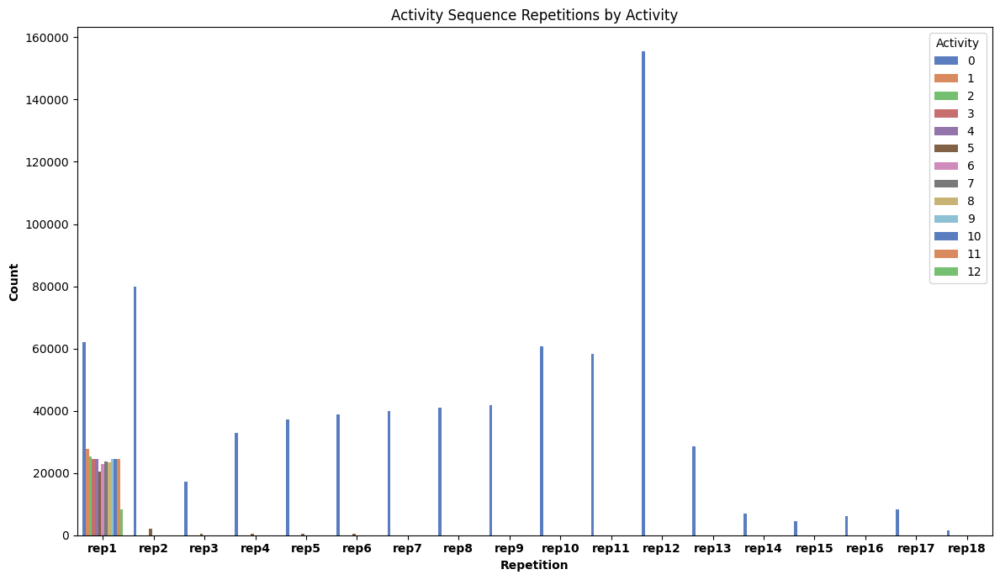

In [ ]:
plt.figure(figsize=(12,7))
sns.countplot(x='repetition', data=df, palette='muted', hue='Activity')
plt.title('Activity Sequence Repetitions by Activity')
plt.xlabel('Repetition', fontweight='bold')
plt.ylabel('Count', fontweight='bold')
plt.xticks(fontweight='bold')
plt.tight_layout()
plt.show()

Chelsea Note: most of the activities are only done once per subject - the repetition was included because there are a disproportionate amount of 0's (resting) and it may be more useful to look at each resting period then treat it as one long continuous rest (which it isn't).

Create specific index for individual activity performed under each subject (e.g. rest periods within a subject are counted separately, not altogether)

In [6]:
# With repetitions - each activity sequence is treated as one separate entity within each subject
df['sequence']=df.apply(lambda x: (str(x['Activity'])+'_'+x['subject']+'_'+x['repetition']), axis=1)

In [ ]:
df.head()

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject,repetition,sequence
0,2.1849,-9.6967,0.63077,0.103900,-0.84053,-0.68762,-8.6499,-4.5781,0.187760,-0.44902,-1.0103,0.034483,0,subject1,rep1,0_subject1_rep1
1,2.3876,-9.5080,0.68389,0.085343,-0.83865,-0.68369,-8.6275,-4.3198,0.023595,-0.44902,-1.0103,0.034483,0,subject1,rep1,0_subject1_rep1
2,2.4086,-9.5674,0.68113,0.085343,-0.83865,-0.68369,-8.5055,-4.2772,0.275720,-0.44902,-1.0103,0.034483,0,subject1,rep1,0_subject1_rep1
3,2.1814,-9.4301,0.55031,0.085343,-0.83865,-0.68369,-8.6279,-4.3163,0.367520,-0.45686,-1.0082,0.025862,0,subject1,rep1,0_subject1_rep1
4,2.4173,-9.3889,0.71098,0.085343,-0.83865,-0.68369,-8.7008,-4.1459,0.407290,-0.45686,-1.0082,0.025862,0,subject1,rep1,0_subject1_rep1


# <font color='pink'> Train-test split </font>

Split data first

In [7]:
# Grouping by subject and creating a list of dataframes, one per group
grouped = df.groupby('subject')
grouped_dfs = [group for _, group in grouped]

# Splitting the groups into training and test sets with an 80:20 ratio
train_groups, test_groups = train_test_split(grouped_dfs, test_size=0.2, random_state=42)

# Reassembling the training and test datasets from the groups
train_df = pd.concat(train_groups)
test_df = pd.concat(test_groups)

# Displaying the shape of the training and test sets
train_df_shape = train_df.shape
test_df_shape = test_df.shape

train_df_shape, test_df_shape

((740414, 16), (259585, 16))

Check which subjects made it to train/test set

In [ ]:
train_df['subject'].unique()

array(['subject6', 'subject1', 'subject9', 'subject3', 'subject5',
       'subject4', 'subject7'], dtype=object)

In [ ]:
test_df['subject'].unique()

array(['subject8', 'subject2'], dtype=object)

Normalization, sequence creation

In [8]:
# Identifying numerical columns (excluding 'activity')
numerical_columns = train_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical_columns.remove('Activity')

# Initializing the StandardScaler
scaler = StandardScaler()

# Fitting the scaler to the training data and transforming both training and test data
train_df[numerical_columns] = scaler.fit_transform(train_df[numerical_columns])
test_df[numerical_columns] = scaler.transform(test_df[numerical_columns])

# Checking the first few rows of the normalized training data
train_df.head()

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject,repetition,sequence
650497,-0.552567,0.055747,-0.810059,0.578981,-0.800349,0.501238,-1.814050,0.678081,-0.577362,-0.556227,2.101663,0.012934,0,subject6,rep1,0_subject6_rep1
650498,-1.531305,0.104970,-0.369903,0.693642,-0.720535,0.533071,-1.213665,0.758524,-0.989728,-0.556227,2.101663,0.012934,0,subject6,rep1,0_subject6_rep1
650499,-1.634742,0.162005,-0.446628,0.693642,-0.720535,0.533071,-0.665509,0.721946,-1.405218,-0.770194,1.968628,-0.202877,0,subject6,rep1,0_subject6_rep1
650500,-1.058302,0.102992,-0.337213,0.693642,-0.720535,0.533071,-0.339275,0.722070,-1.640731,-0.770194,1.968628,-0.202877,0,subject6,rep1,0_subject6_rep1
650501,-1.119704,0.167596,-0.387926,0.601930,-0.704601,0.653347,-0.163938,0.695687,-1.610853,-0.770194,1.968628,-0.202877,0,subject6,rep1,0_subject6_rep1


In [ ]:
train_df.shape

(740414, 16)

<hr>

# <font color='pink' size=5>Addressing Class Imbalance</font>


Activity 0 has the most with 530225, rest is <21k

In [ ]:
# Checking the class distribution in the 'readmitted' column of the training set
train_df.groupby('subject').apply(lambda x : x['Activity']).value_counts()

0     530225
1      21504
2      19262
3      18432
4      18432
9      18432
10     18432
11     18432
5      18432
6      17665
8      17511
7      17460
12      6195
Name: Activity, dtype: int64

# <font color='skyblue' size=4> Organizing groups by subject for resampling </font>


In [9]:
# Grouping the original training data by subject
grouped_by_subject = train_df.groupby('subject')

# Put all group classes in one dictionary
groups_dict = {}
for i in range(13):
  class_name=str('groups_class_'+str(i))

  gdf_list=[]
  for group in grouped_by_subject.groups:
    gdf=(grouped_by_subject.get_group(group))#.unique())
    gdf=gdf[gdf['Activity']==i]
    #gdf['subject']=-1

    #gdf=(grouped_by_subject.get_group(group)['Activity'])#.unique())
    gdf_list.append(gdf)

  groups_dict[class_name] = pd.concat(gdf_list) #gdf_list

Chelsea note: By organizing the data this way, we create subsets of the dataset where each subset is a subject sequence that corresponds to one of the classes in the 'Activity' column.

In [ ]:
# Sample use
groups_dict['groups_class_8']

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject,repetition,sequence
61440,0.422210,0.049399,-0.740629,-0.647840,-1.023772,0.317291,0.310755,-0.541093,-0.730870,-0.977048,-0.466700,-0.151864,8,subject1,rep1,8_subject1_rep1
61441,0.546140,0.306889,-0.643873,-0.647840,-1.023772,0.317291,0.397679,-0.479266,-0.763491,-0.955641,-0.455613,-0.195030,8,subject1,rep1,8_subject1_rep1
61442,0.245832,0.528952,-0.670767,-0.647840,-1.023772,0.317291,0.390421,-0.438308,-0.739385,-0.955641,-0.455613,-0.195030,8,subject1,rep1,8_subject1_rep1
61443,-0.237872,0.711363,-0.585245,-0.647840,-1.023772,0.317291,0.376589,-0.352492,-0.637965,-0.955641,-0.455613,-0.195030,8,subject1,rep1,8_subject1_rep1
61444,-0.189766,0.492743,-0.479974,-0.689885,-0.912061,0.451705,0.335153,-0.268822,-0.589628,-0.977048,-0.437148,-0.191098,8,subject1,rep1,8_subject1_rep1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
819196,-0.509667,-0.203745,0.604484,1.037623,-0.491811,-0.418493,0.497602,-0.476500,-0.623031,1.722665,-0.802993,-0.387287,8,subject7,rep1,8_subject7_rep1
819197,-0.496683,-0.279679,0.541112,1.026149,-0.486480,-0.383113,0.324649,-0.685242,-0.553300,1.722665,-0.802993,-0.387287,8,subject7,rep1,8_subject7_rep1
819198,-0.378725,-0.147344,0.677947,1.026149,-0.486480,-0.383113,0.290843,-0.823967,-0.626758,1.729794,-0.828855,-0.348050,8,subject7,rep1,8_subject7_rep1
819199,-0.247756,0.021540,0.648277,1.026149,-0.486480,-0.383113,0.329653,-0.971130,-0.621421,1.729794,-0.828855,-0.348050,8,subject7,rep1,8_subject7_rep1


# <font color='pink' size=5>Oversampling</font>

Resample all classes to match class 0

In [10]:
# Resample all classes to match class 0
groups_class_1_resampled = resample(groups_dict['groups_class_1'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)
groups_class_2_resampled = resample(groups_dict['groups_class_2'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)
groups_class_3_resampled = resample(groups_dict['groups_class_3'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)
groups_class_4_resampled = resample(groups_dict['groups_class_4'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)
groups_class_5_resampled = resample(groups_dict['groups_class_5'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)
groups_class_6_resampled = resample(groups_dict['groups_class_6'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)
groups_class_7_resampled = resample(groups_dict['groups_class_7'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)
groups_class_8_resampled = resample(groups_dict['groups_class_8'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)
groups_class_9_resampled = resample(groups_dict['groups_class_9'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)
groups_class_10_resampled = resample(groups_dict['groups_class_10'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)
groups_class_11_resampled = resample(groups_dict['groups_class_11'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)
groups_class_12_resampled = resample(groups_dict['groups_class_12'],replace=True, n_samples=len(groups_dict['groups_class_0']), random_state=42)


In [ ]:
groups_class_1_resampled.head()

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject,repetition,sequence
784564,-0.072079,0.002667,0.498407,0.693642,0.040151,1.332526,0.376382,-0.596891,-0.089138,0.442349,-0.385407,1.186097,1,subject7,rep1,1_subject7_rep1
7516,0.236954,0.059629,0.231305,-0.395591,-0.715233,-0.708559,0.071506,-0.603699,-0.301328,0.413817,-0.887993,-1.226952,1,subject1,rep1,1_subject1_rep1
298767,-0.366424,0.003229,0.355608,-0.865686,-0.098156,1.261783,0.292787,-0.650242,-0.365529,-0.994872,-0.422355,-0.379440,1,subject3,rep1,1_subject3_rep1
536509,0.145849,0.013483,0.215191,1.580334,0.013556,-0.015228,0.214423,-0.694480,-0.606891,1.312520,-0.984080,0.205187,1,subject5,rep1,1_subject5_rep1
535829,0.130370,0.008771,0.224664,1.603262,-0.050296,-0.015228,0.209956,-0.646678,-0.616698,1.269742,-1.028442,0.224795,1,subject5,rep1,1_subject5_rep1


In [ ]:
groups_class_1_resampled.shape

(530225, 14)

Concatenate all of the groups

In [11]:
# Concatenate all resampled groups
balanced_groups = pd.concat([groups_dict['groups_class_0'],
                             groups_class_1_resampled,
                             groups_class_2_resampled,
                             groups_class_3_resampled,
                             groups_class_4_resampled,
                             groups_class_5_resampled,
                             groups_class_6_resampled,
                             groups_class_7_resampled,
                             groups_class_8_resampled,
                             groups_class_9_resampled,
                             groups_class_10_resampled,
                             groups_class_11_resampled,
                             groups_class_12_resampled])

# Checking new class distribution
balanced_groups['Activity'].value_counts()

0     530225
1     530225
2     530225
3     530225
4     530225
5     530225
6     530225
7     530225
8     530225
9     530225
10    530225
11    530225
12    530225
Name: Activity, dtype: int64

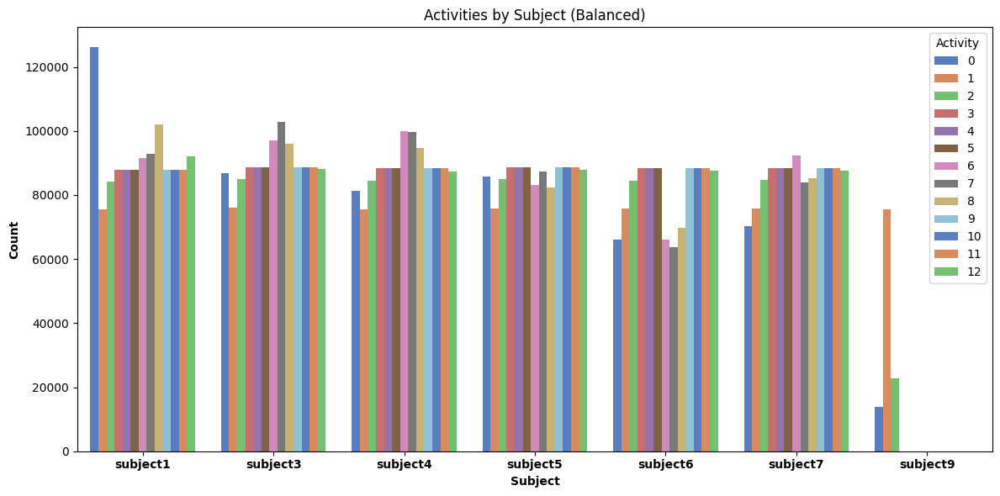

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(data=balanced_groups,x='subject',hue='Activity',palette='muted')
plt.title('Activities by Subject (Balanced)')
plt.xlabel('Subject', fontweight='bold')
plt.ylabel('Count', fontweight='bold')
plt.xticks(fontweight='bold') #rotation=45,
plt.tight_layout()
plt.show()

In [48]:
balanced_groups.shape # ended up with a huge number

(6892925, 16)

<hr>



<font color='pink' size=5>Sequence Generation</font>


# Train

In [12]:
X_train = train_df.drop(['Activity','subject','repetition'],axis=1) #,'sequence'
y_train = train_df['Activity']
X_test = test_df.drop(['Activity','subject','repetition'],axis=1) # drop sequence later
y_test = test_df['Activity']
X_train.shape,y_train.shape,X_test.shape,y_test.shape

((740414, 13), (740414,), (259585, 13), (259585,))

In [13]:
def create_sequences(data, sequence_length):

    """
    Creates sequences while preserving each subject, activity, and repetition.

    Parameters
    ----------
    data (DataFrame): input data.
    sequence_length (int): window size of each sequence.

    Returns
    -------
    (Array): X_train/test sequences
    (Array): y_train/test sequences

    """

  sequences = []
  output = []
  sensor_columns = ['alx', 'aly', 'alz', 'glx', 'gly', 'glz', 'arx', 'ary', 'arz', 'grx',
       'gry', 'grz']

  # Make sure each sequence preserves the same subject/activity
  for seq in data['sequence'].unique():

    subset=data[data['sequence']==seq]

    for i in range(0, len(subset) - sequence_length + 1, sequence_length):
        sequence = subset[i:i + sequence_length]

        # 'Activity' is the target variable and is the same for this repetition
        label = sequence['Activity'].iloc[0]
        sequences.append(sequence[sensor_columns].values)
        output.append(label)

  return np.array(sequences), np.array(output)

# Creating sequences for training and test data
X_train, y_train = create_sequences(balanced_groups, sequence_length=200)
X_test, y_test = create_sequences(test_df, sequence_length=200)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((34385, 200, 12), (34385,), (1275, 200, 12), (1275,))

Balanced set

In [14]:
padded_sequences = pad_sequences(X_train, maxlen=5, padding='post', dtype='float')
padded_sequences.shape

(34385, 5, 12)

In [15]:
padded_sequences_test = pad_sequences(X_test, maxlen=5, padding='post', dtype='float')
padded_sequences_test.shape

(1275, 5, 12)

Unbalanced set

In [16]:
# Creating sequences for training and test data
X_train_unb, y_train_unb = create_sequences(train_df, sequence_length=200)
X_test_unb, y_test_unb = create_sequences(test_df, sequence_length=200)

X_train_unb.shape, y_train_unb.shape, X_test_unb.shape, y_test_unb.shape

((3632, 200, 12), (3632,), (1275, 200, 12), (1275,))

In [17]:
padded_sequences_unb = pad_sequences(X_train_unb, maxlen=5, padding='post', dtype='float')
padded_sequences_unb.shape

(3632, 5, 12)

In [18]:
padded_sequences_test_unb = pad_sequences(X_test_unb, maxlen=5, padding='post', dtype='float')
padded_sequences_test_unb.shape

(1275, 5, 12)

<hr>

# <font color='pink' size=5>LSTM with PyTorch</font>




In [19]:
def get_scores(Y_pred, Y):
    """
    Gets classification scores.

      Parameters
      ----------
      Y_pred (array): list of predictive values.
      Y (array): list of ground truth values.

      Returns
      -------
      conf_matrix (Matrix): confusion matrix for model predictions vs actual.
      class_report (dict): class report for model predictions vs actual.
      auc (float): AUC value for model prediction.

    """
    # Calculate confusion matrix, classification report, ROC AUC
    conf_matrix = confusion_matrix(Y_pred, Y)
    class_report = classification_report(Y_pred, Y, output_dict=True)
    #auc = roc_auc_score(Y_pred, Y)

    # Return the computed scores
    return conf_matrix, class_report #, auc

def print_scores(conf_matrix, class_report, auc):
    """
    Prints scores.

      Parameters
      ----------
      conf_matrix (Matrix): confusion matrix for model predictions vs actual.
      class_report (string): class report for model predictions vs actual.
      auc (float): AUC value of model.

      Returns
      -------
      None

    """
    print('AUC : ', auc)
    print("Confusion Matrix:")
    print(conf_matrix)
    print("\nClassification Report:")
    print(class_report)


def plot_cm(confusion_matrix):
  """
  Plots confusion matrix.

  Parameters
  ----------
  confusion_matrix (Matrix): confusion matrix for model predictions vs actual.

  Returns
  -------
  None

  """

  plt.figure(figsize=(6,6))
  sns.heatmap(confusion_matrix, annot=True, fmt='g', vmin=0)
  #plt.xticks(ticks=np.arange(13) + 0.5, labels=activity_labels.values(), rotation=90)
  #plt.yticks(ticks=np.arange(13) + 0.5, labels=activity_labels.values(), rotation=0)
  plt.xlabel("Predicted")
  plt.ylabel("Actual")
  plt.title("Confusion Matrix")
  plt.show()

# <font color='pink' size=6>Balanced set</font>

# With L2 + no dropout

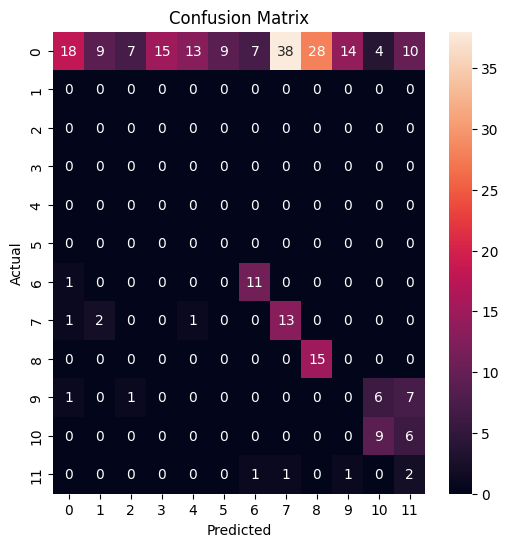

Epoch 0/50 ---> Train Accuracy: 78.87160098880325%, Validation Accuracy: 16.627450980392158%
Epoch 0/50 runtime: 0.41563851833343507 minutes


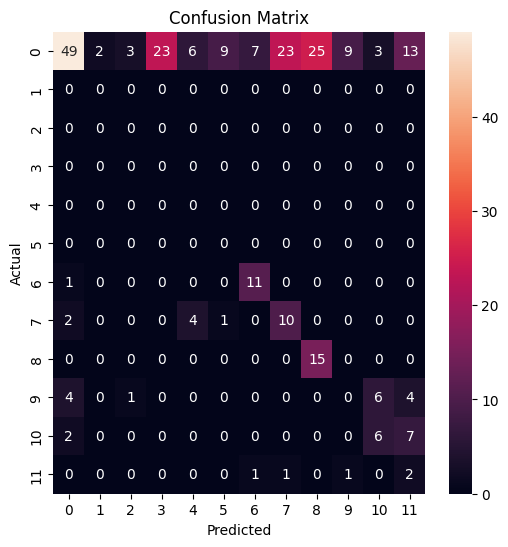

Epoch 1/50 ---> Train Accuracy: 88.70437690853569%, Validation Accuracy: 31.058823529411764%
Epoch 1/50 runtime: 0.33552435239156086 minutes


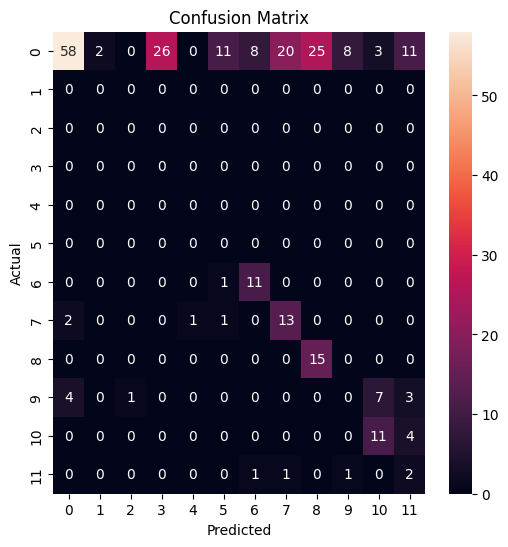

Epoch 2/50 ---> Train Accuracy: 91.87145557655954%, Validation Accuracy: 37.72549019607843%
Epoch 2/50 runtime: 0.4006937026977539 minutes


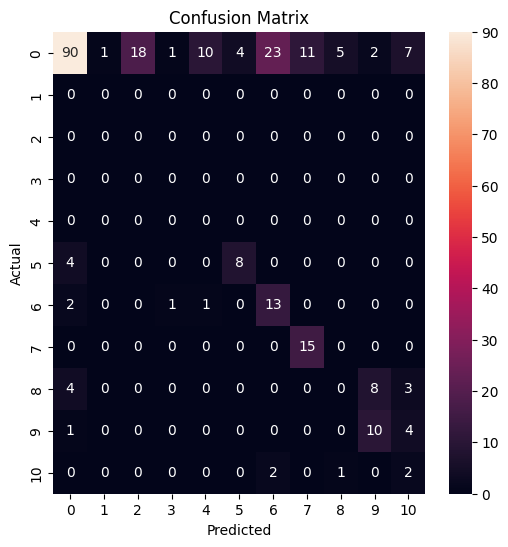

Epoch 3/50 ---> Train Accuracy: 94.05263923222336%, Validation Accuracy: 48.470588235294116%
Epoch 3/50 runtime: 0.25653442144393923 minutes


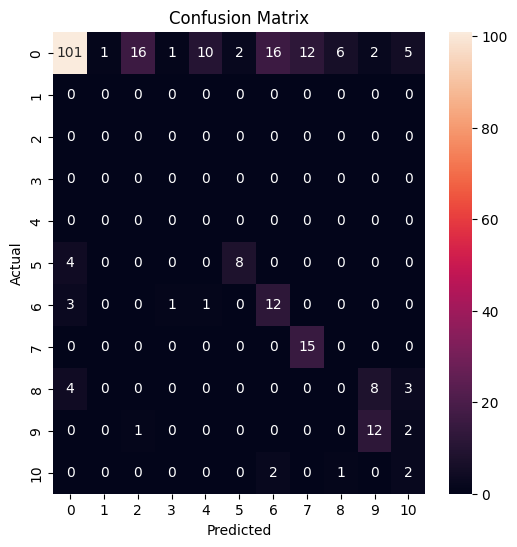

Epoch 4/50 ---> Train Accuracy: 94.6924531045514%, Validation Accuracy: 52.627450980392155%
Epoch 4/50 runtime: 0.22344194253285726 minutes


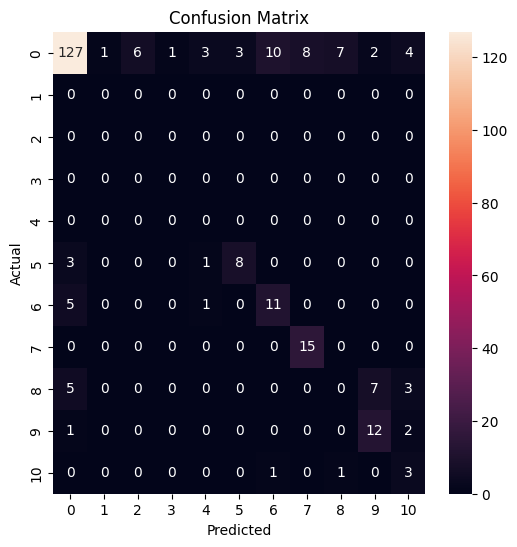

Epoch 5/50 ---> Train Accuracy: 95.42823905772866%, Validation Accuracy: 60.23529411764706%
Epoch 5/50 runtime: 0.22912470499674478 minutes


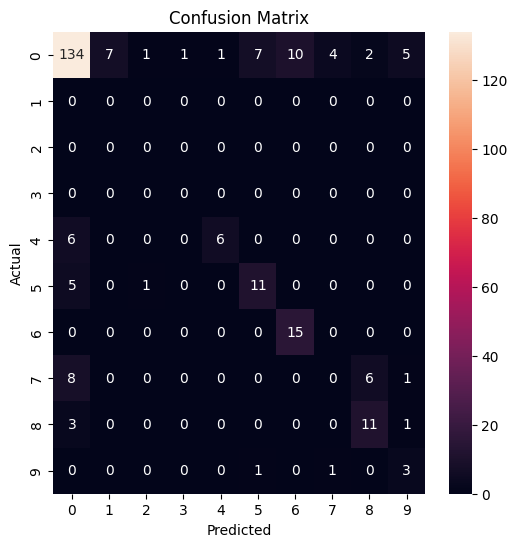

Epoch 6/50 ---> Train Accuracy: 95.98953031845281%, Validation Accuracy: 60.86274509803921%
Epoch 6/50 runtime: 0.22760897477467854 minutes


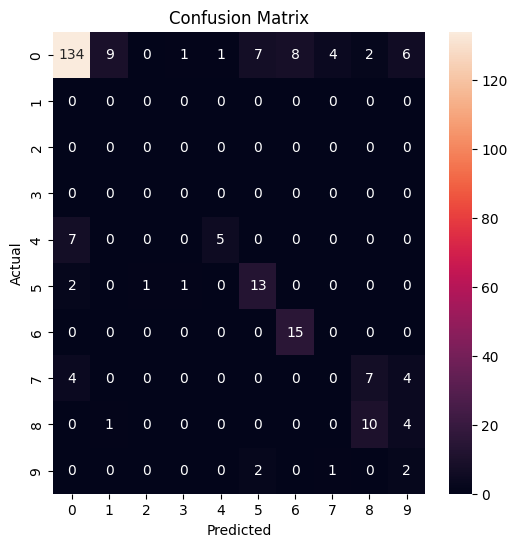

Epoch 7/50 ---> Train Accuracy: 96.15239203140905%, Validation Accuracy: 59.68627450980392%
Epoch 7/50 runtime: 0.23021128575007122 minutes


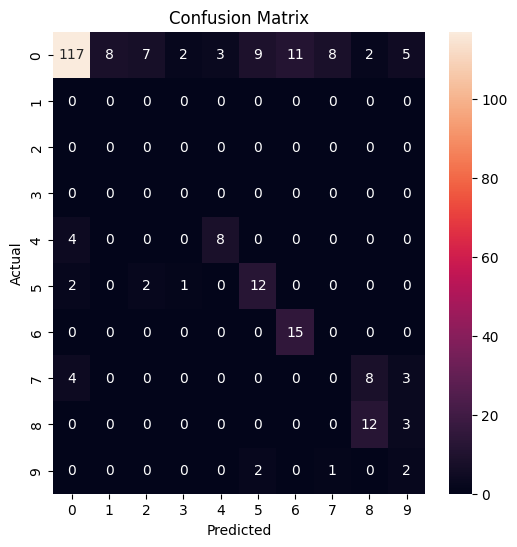

Epoch 8/50 ---> Train Accuracy: 96.36178566235277%, Validation Accuracy: 54.19607843137255%
Epoch 8/50 runtime: 0.21925005912780762 minutes


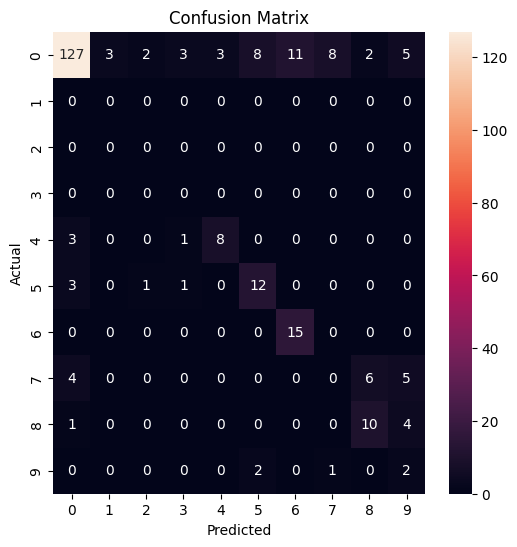

Epoch 9/50 ---> Train Accuracy: 96.2570888468809%, Validation Accuracy: 56.3921568627451%
Epoch 9/50 runtime: 0.22136539220809937 minutes


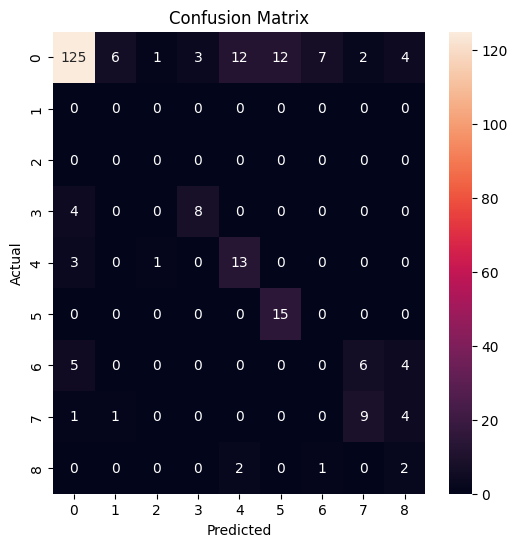

Epoch 10/50 ---> Train Accuracy: 96.32979496873637%, Validation Accuracy: 55.372549019607845%
Epoch 10/50 runtime: 0.22450156211853028 minutes


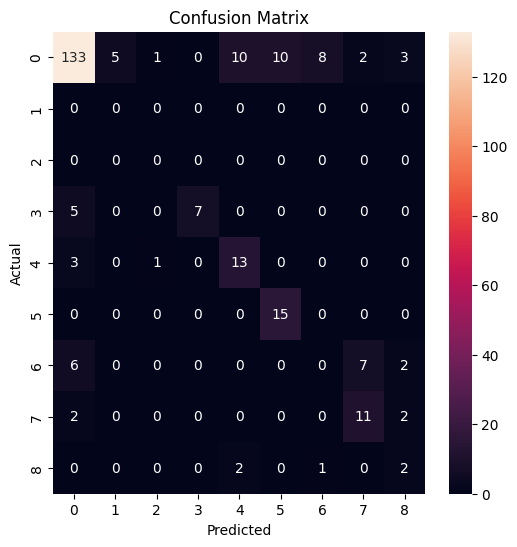

Epoch 11/50 ---> Train Accuracy: 97.09757161553003%, Validation Accuracy: 61.411764705882355%
Epoch 11/50 runtime: 0.23530930280685425 minutes


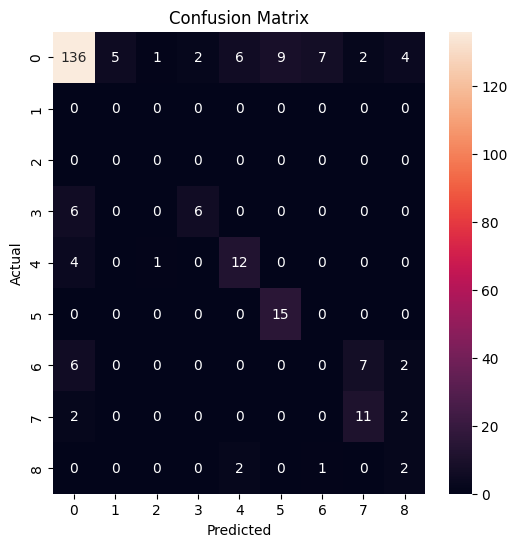

Epoch 12/50 ---> Train Accuracy: 97.37967136832921%, Validation Accuracy: 62.666666666666664%
Epoch 12/50 runtime: 0.22637617985407513 minutes


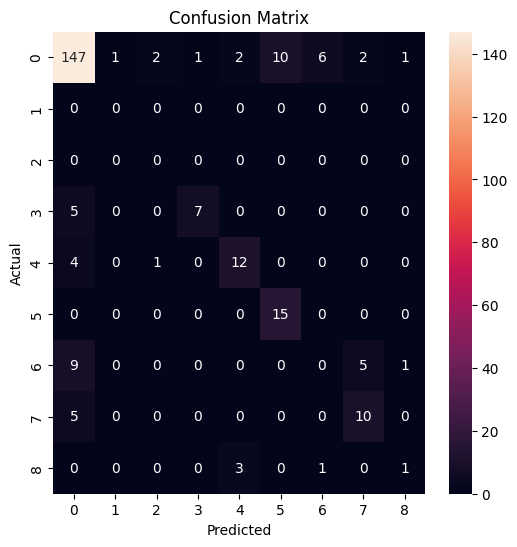

Epoch 13/50 ---> Train Accuracy: 97.29824051185109%, Validation Accuracy: 65.17647058823529%
Epoch 13/50 runtime: 0.22742541233698527 minutes


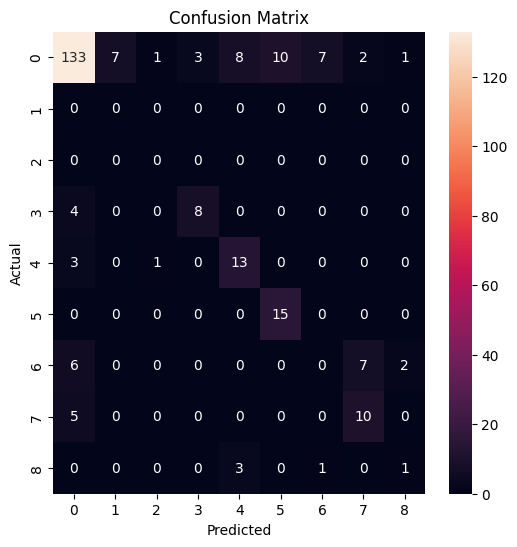

Epoch 14/50 ---> Train Accuracy: 97.15864475788861%, Validation Accuracy: 58.509803921568626%
Epoch 14/50 runtime: 0.22599573930104574 minutes


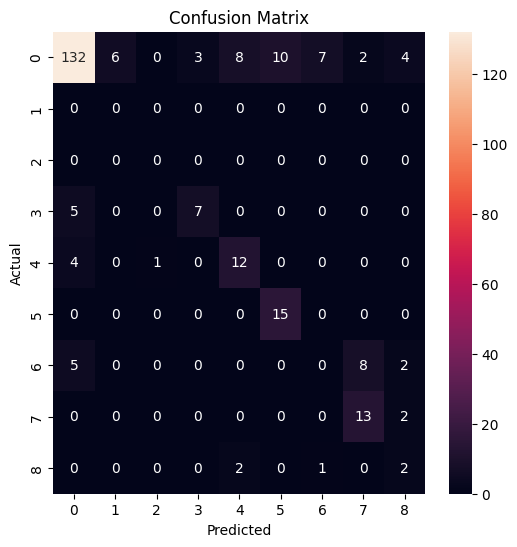

Epoch 15/50 ---> Train Accuracy: 97.26043332848626%, Validation Accuracy: 61.568627450980394%
Epoch 15/50 runtime: 0.22486206293106079 minutes


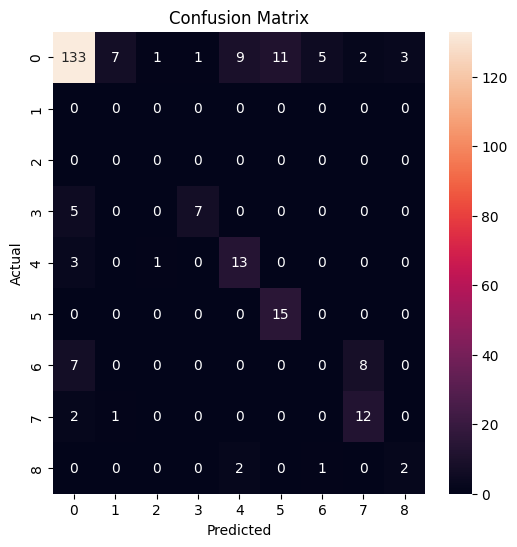

Epoch 16/50 ---> Train Accuracy: 97.35058891958703%, Validation Accuracy: 60.07843137254902%
Epoch 16/50 runtime: 0.223901625474294 minutes


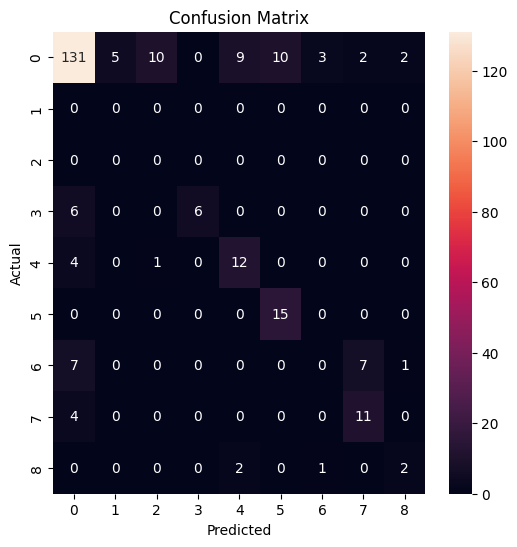

Epoch 17/50 ---> Train Accuracy: 97.35931365420969%, Validation Accuracy: 59.21568627450981%
Epoch 17/50 runtime: 0.23069759607315063 minutes


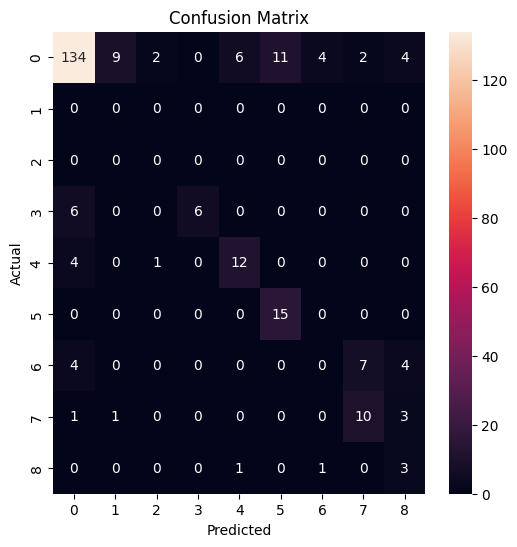

Epoch 18/50 ---> Train Accuracy: 97.30114875672531%, Validation Accuracy: 60.549019607843135%
Epoch 18/50 runtime: 0.22335229714711508 minutes


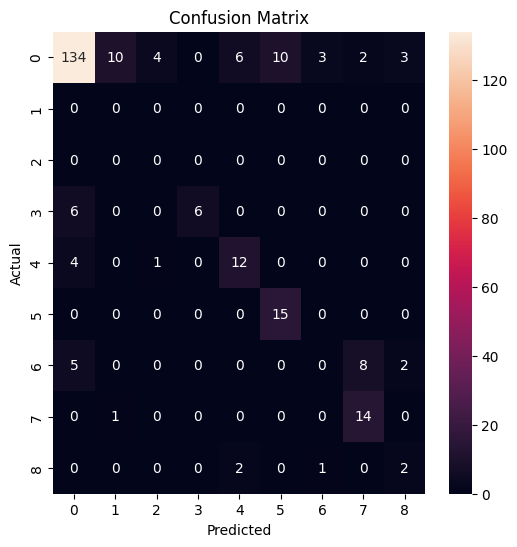

Epoch 19/50 ---> Train Accuracy: 96.9347099025738%, Validation Accuracy: 61.568627450980394%
Epoch 19/50 runtime: 0.22063193718592325 minutes


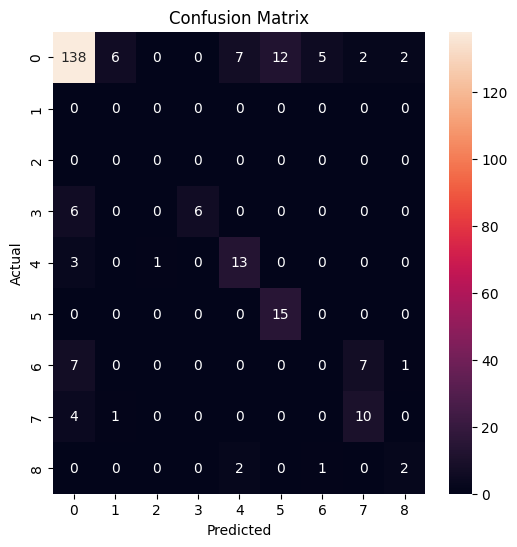

Epoch 20/50 ---> Train Accuracy: 97.47564344917842%, Validation Accuracy: 62.666666666666664%
Epoch 20/50 runtime: 0.21825538476308187 minutes


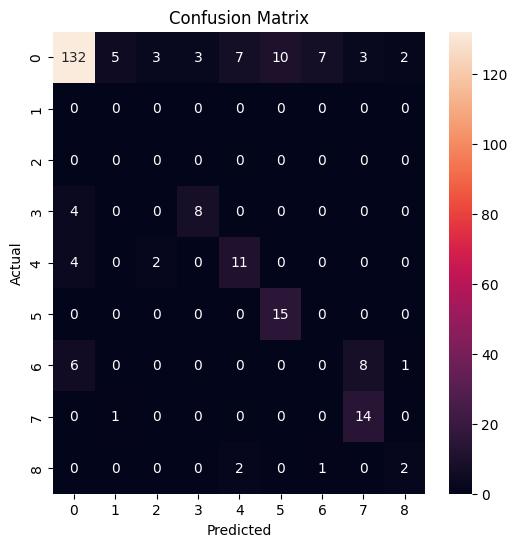

Epoch 21/50 ---> Train Accuracy: 97.20808492075032%, Validation Accuracy: 61.411764705882355%
Epoch 21/50 runtime: 0.22046188513437906 minutes


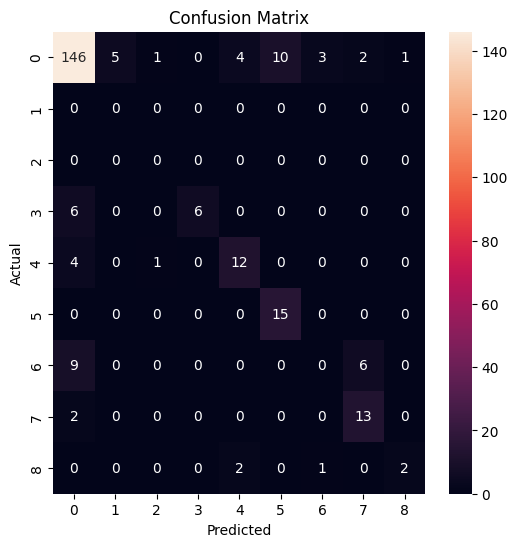

Epoch 22/50 ---> Train Accuracy: 97.7577432019776%, Validation Accuracy: 64.94117647058823%
Epoch 22/50 runtime: 0.23269755442937215 minutes


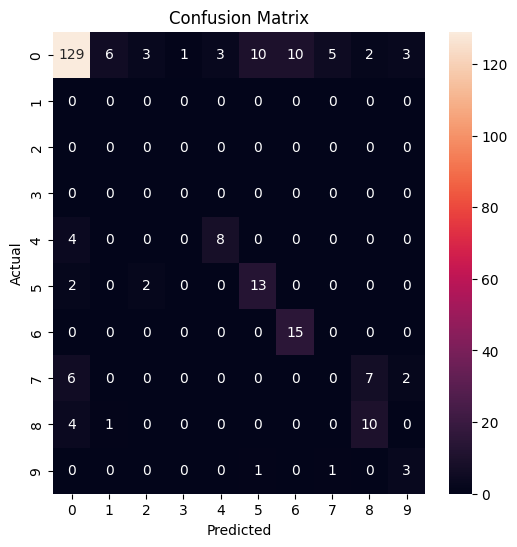

Epoch 23/50 ---> Train Accuracy: 97.46982695942998%, Validation Accuracy: 58.588235294117645%
Epoch 23/50 runtime: 0.23133518695831298 minutes


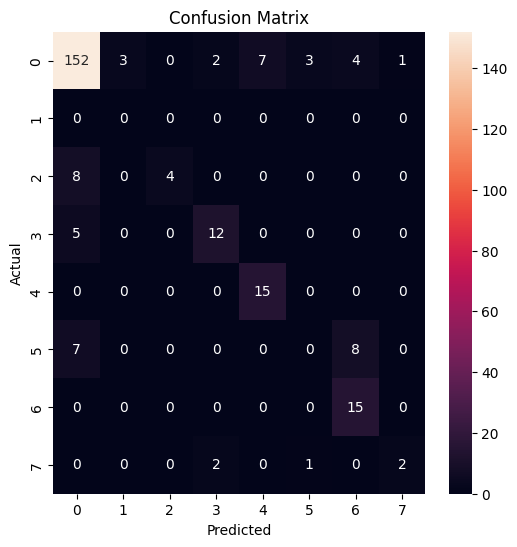

Epoch 24/50 ---> Train Accuracy: 97.44946924531045%, Validation Accuracy: 69.96078431372548%
Epoch 24/50 runtime: 0.23009586334228516 minutes


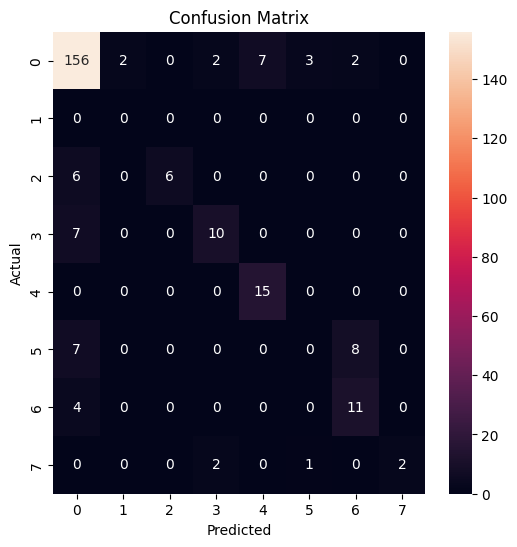

Epoch 25/50 ---> Train Accuracy: 97.37385487858077%, Validation Accuracy: 69.96078431372548%
Epoch 25/50 runtime: 0.22657917340596517 minutes


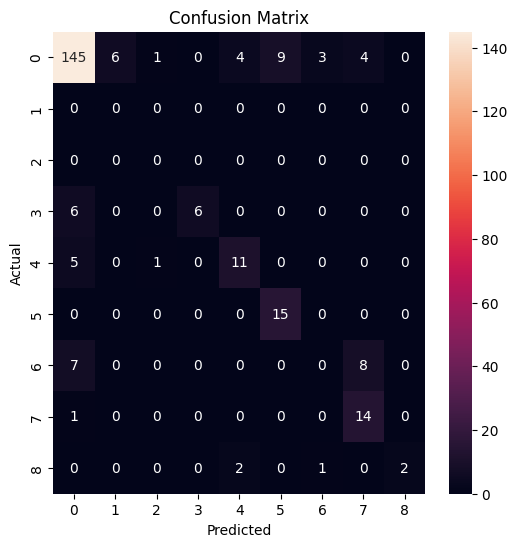

Epoch 26/50 ---> Train Accuracy: 97.83917405845573%, Validation Accuracy: 65.49019607843137%
Epoch 26/50 runtime: 0.23533885876337687 minutes


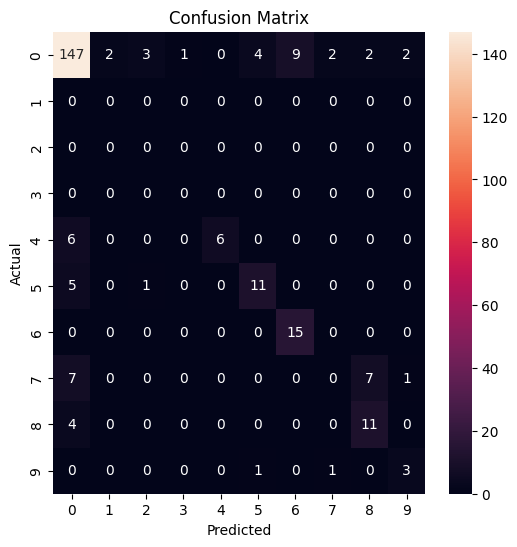

Epoch 27/50 ---> Train Accuracy: 97.97586156754399%, Validation Accuracy: 64.07843137254902%
Epoch 27/50 runtime: 0.23124391237894695 minutes


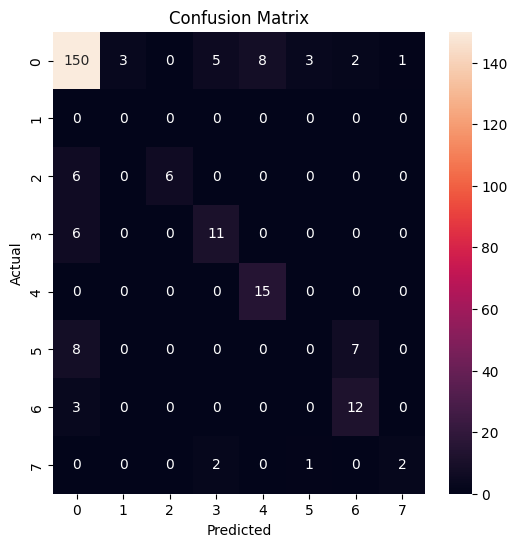

Epoch 28/50 ---> Train Accuracy: 98.12127381125491%, Validation Accuracy: 67.68627450980392%
Epoch 28/50 runtime: 0.2308358391125997 minutes


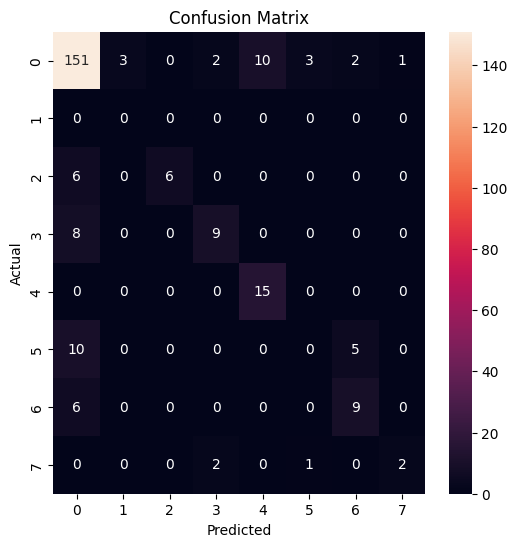

Epoch 29/50 ---> Train Accuracy: 97.67340410062528%, Validation Accuracy: 68.54901960784314%
Epoch 29/50 runtime: 0.23077051639556884 minutes


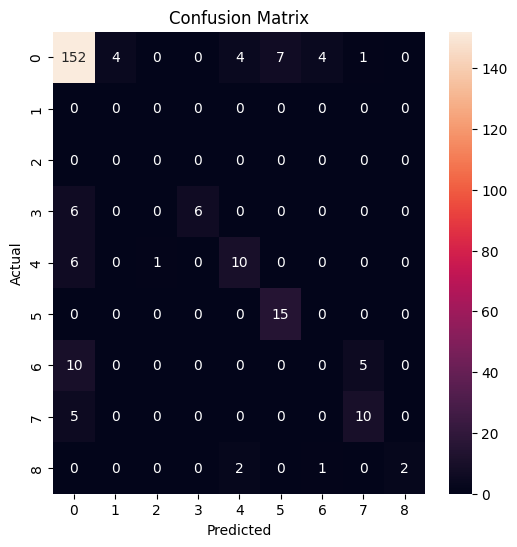

Epoch 30/50 ---> Train Accuracy: 97.96713683292133%, Validation Accuracy: 66.66666666666667%
Epoch 30/50 runtime: 0.23806039492289224 minutes


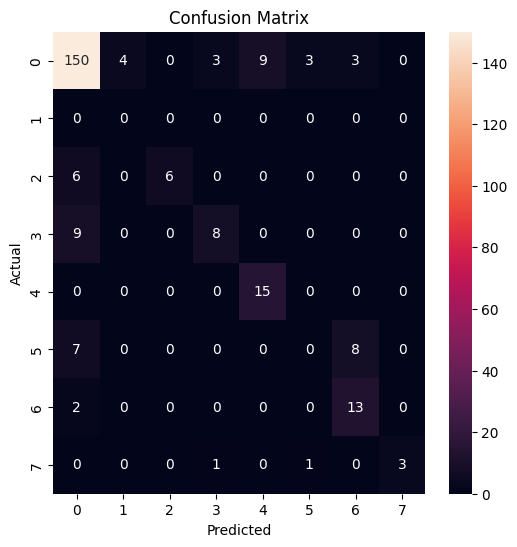

Epoch 31/50 ---> Train Accuracy: 98.14163152537444%, Validation Accuracy: 66.3529411764706%
Epoch 31/50 runtime: 0.22898385524749756 minutes


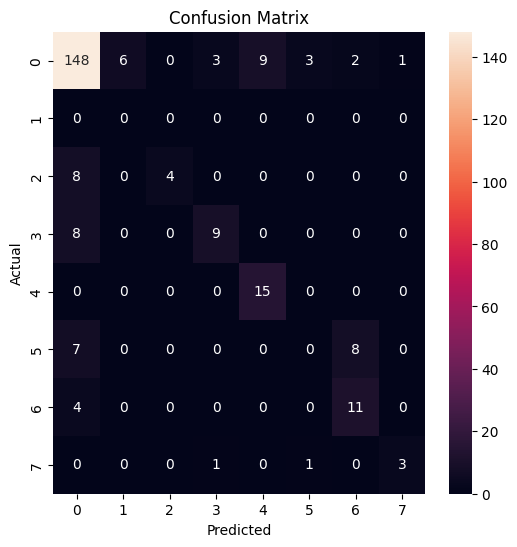

Epoch 32/50 ---> Train Accuracy: 97.89443071106587%, Validation Accuracy: 66.19607843137256%
Epoch 32/50 runtime: 0.22810901403427125 minutes


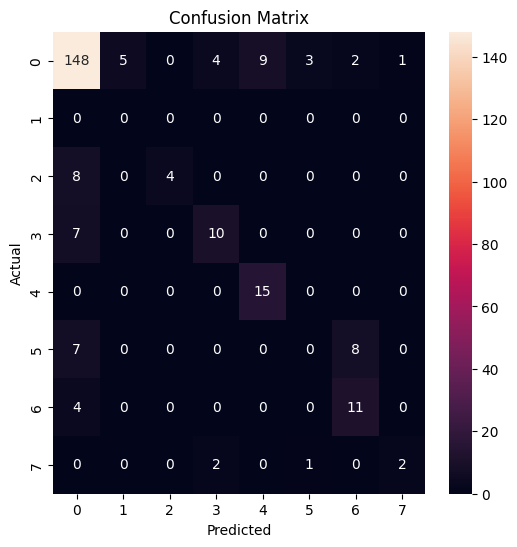

Epoch 33/50 ---> Train Accuracy: 98.18816344336193%, Validation Accuracy: 67.05882352941177%
Epoch 33/50 runtime: 0.2277251164118449 minutes


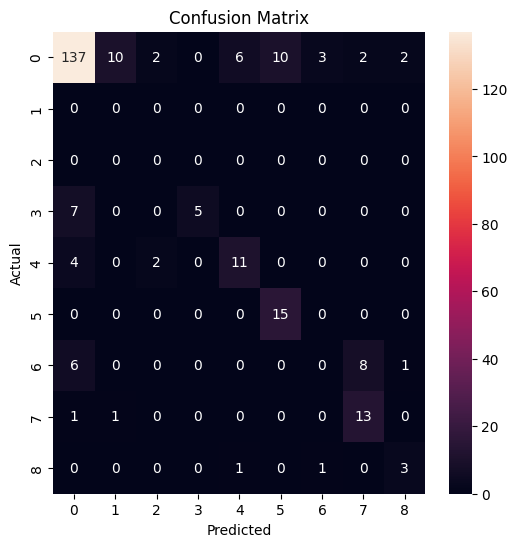

Epoch 34/50 ---> Train Accuracy: 97.68503708012214%, Validation Accuracy: 60.15686274509804%
Epoch 34/50 runtime: 0.23249624967575072 minutes


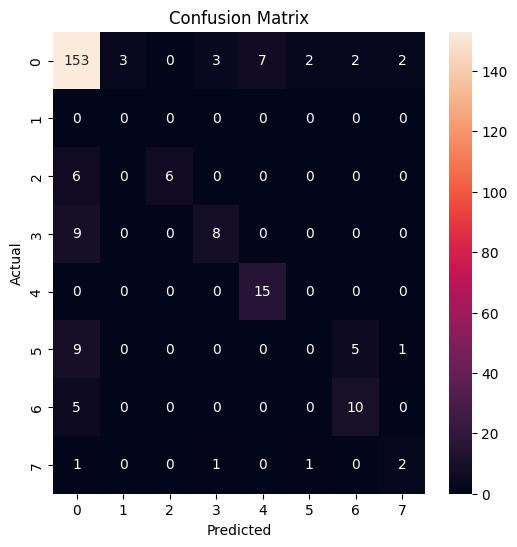

Epoch 35/50 ---> Train Accuracy: 98.12127381125491%, Validation Accuracy: 67.05882352941177%
Epoch 35/50 runtime: 0.21984519561131796 minutes


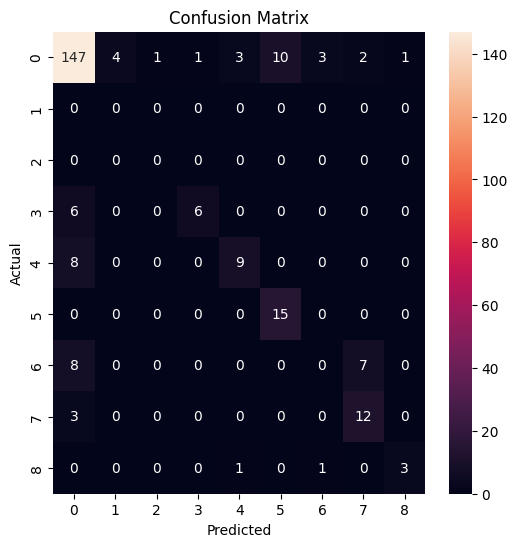

Epoch 36/50 ---> Train Accuracy: 98.21724589210412%, Validation Accuracy: 67.76470588235294%
Epoch 36/50 runtime: 0.2209550619125366 minutes


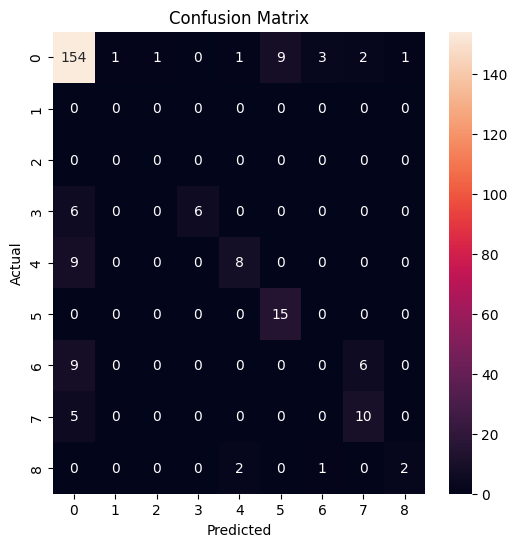

Epoch 37/50 ---> Train Accuracy: 98.11254907663225%, Validation Accuracy: 70.58823529411765%
Epoch 37/50 runtime: 0.2204747200012207 minutes


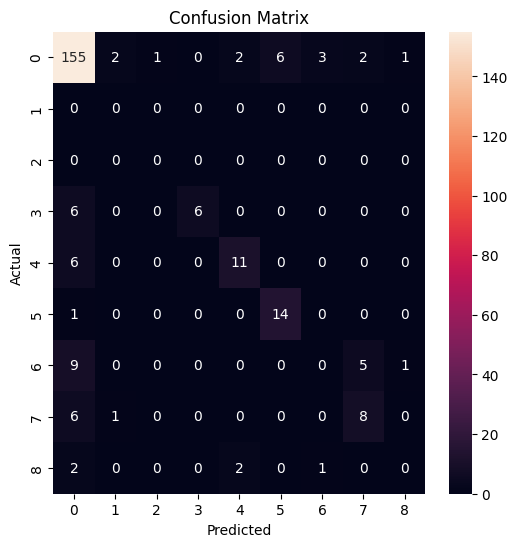

Epoch 38/50 ---> Train Accuracy: 97.84208230332995%, Validation Accuracy: 69.72549019607843%
Epoch 38/50 runtime: 0.234956165154775 minutes


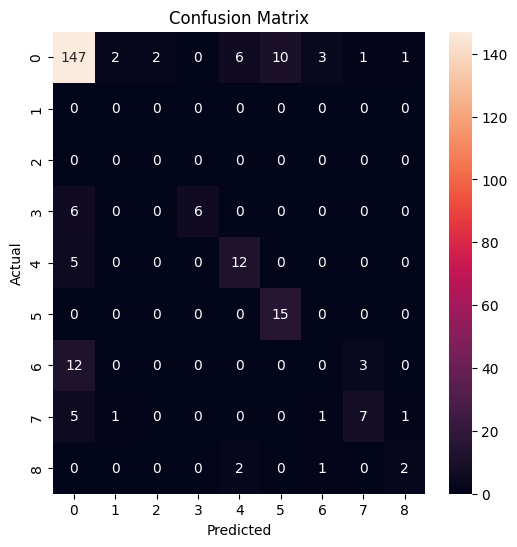

Epoch 39/50 ---> Train Accuracy: 97.97295332266977%, Validation Accuracy: 68.15686274509804%
Epoch 39/50 runtime: 0.22948623895645143 minutes


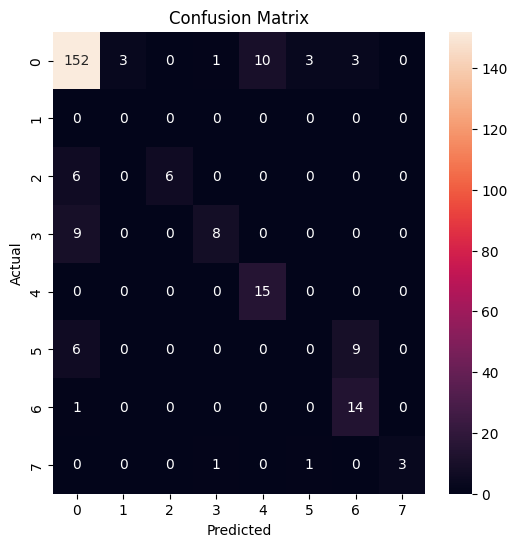

Epoch 40/50 ---> Train Accuracy: 98.19107168823615%, Validation Accuracy: 69.80392156862744%
Epoch 40/50 runtime: 0.22977216641108195 minutes


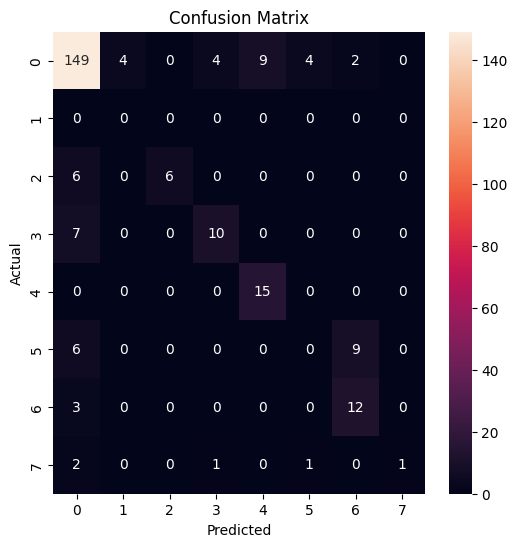

Epoch 41/50 ---> Train Accuracy: 97.92351315980805%, Validation Accuracy: 68.31372549019608%
Epoch 41/50 runtime: 0.2286391536394755 minutes


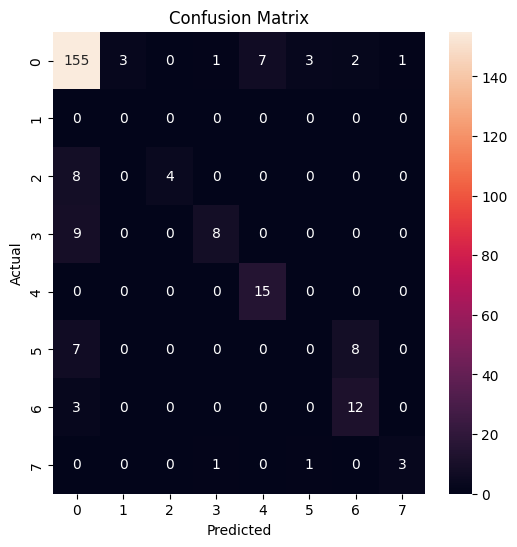

Epoch 42/50 ---> Train Accuracy: 98.14163152537444%, Validation Accuracy: 69.6470588235294%
Epoch 42/50 runtime: 0.2371671477953593 minutes


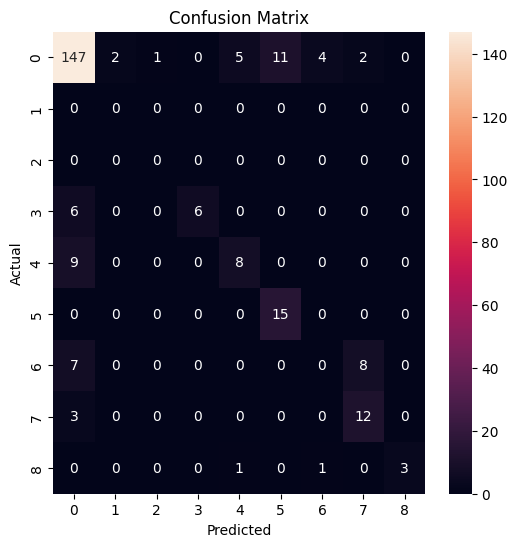

Epoch 43/50 ---> Train Accuracy: 98.388832339683%, Validation Accuracy: 67.13725490196079%
Epoch 43/50 runtime: 0.23299813270568848 minutes


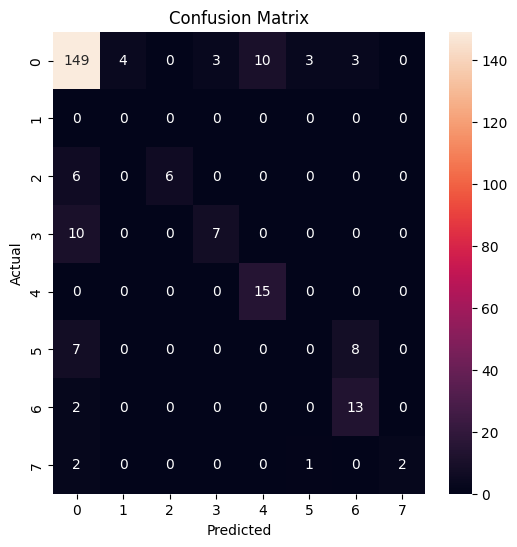

Epoch 44/50 ---> Train Accuracy: 98.23469536134942%, Validation Accuracy: 69.6470588235294%
Epoch 44/50 runtime: 0.2322675625483195 minutes


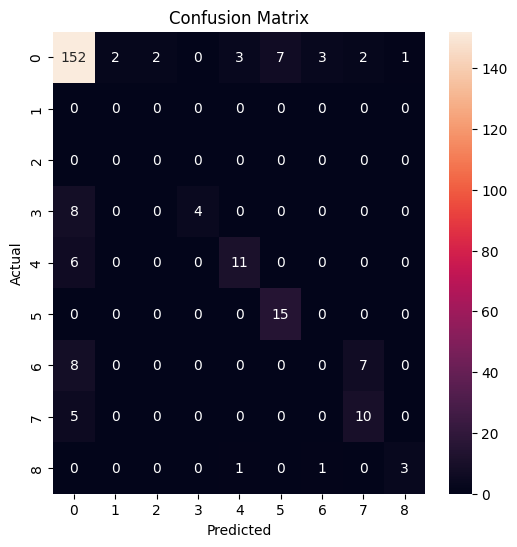

Epoch 45/50 ---> Train Accuracy: 98.388832339683%, Validation Accuracy: 69.56862745098039%
Epoch 45/50 runtime: 0.2314721941947937 minutes


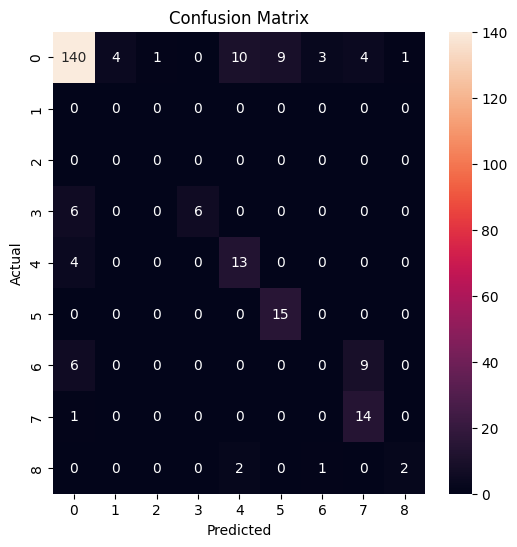

Epoch 46/50 ---> Train Accuracy: 98.03984295477679%, Validation Accuracy: 63.68627450980392%
Epoch 46/50 runtime: 0.2301508069038391 minutes


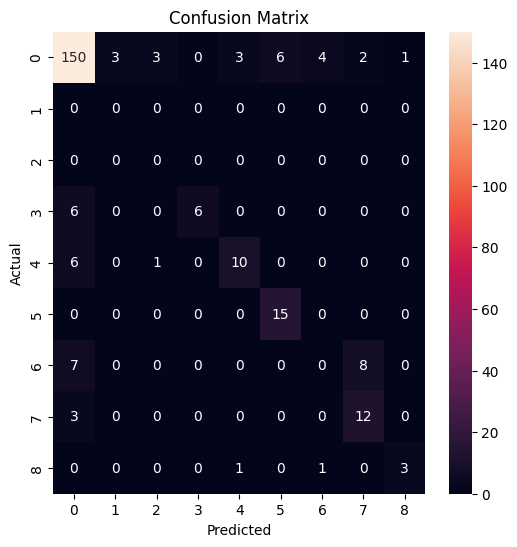

Epoch 47/50 ---> Train Accuracy: 98.39464882943143%, Validation Accuracy: 67.52941176470588%
Epoch 47/50 runtime: 0.23515488306681315 minutes


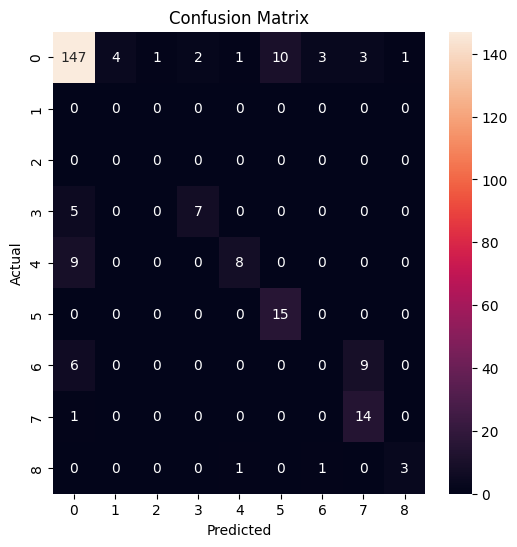

Epoch 48/50 ---> Train Accuracy: 98.30158499345644%, Validation Accuracy: 67.76470588235294%
Epoch 48/50 runtime: 0.22762847741444905 minutes


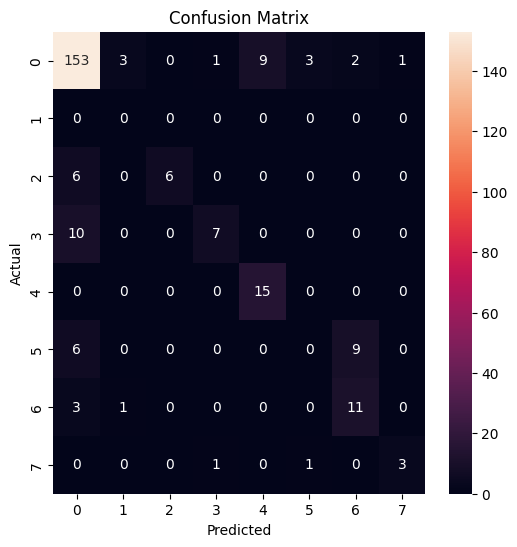

Epoch 49/50 ---> Train Accuracy: 98.2783190344627%, Validation Accuracy: 71.6078431372549%
Epoch 49/50 runtime: 0.22803027232487996 minutes


In [23]:
# Hyperparameters
input_size = X_train.shape[2]
hidden_size = 256  # Number of hidden units in RNN
num_classes = 13  # For classification
epochs = 50
learning_rate = 0.001 #0.01 #
batch_size = 512 #32
landa = 0.001  # Regularization term (lambda)

# Data preparation
train_dataset = TensorDataset(t.tensor(padded_sequences, dtype=t.float32), t.tensor(y_train, dtype=t.long))
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TensorDataset(t.tensor(padded_sequences_test, dtype=t.float32), t.tensor(y_test, dtype=t.long))
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# RNN layers and additional fully connected layer
rnn_layer1 = nn.LSTM(input_size, hidden_size, batch_first=True)
#dropout1 = nn.Dropout(0.3)  # Add dropout between RNN layers, changed to 0.2
# rnn_layer2 = nn.LSTM(hidden_size, hidden_size, batch_first=True)
# dropout2 = nn.Dropout(0.5)  # Add dropout between RNN layers
fc_layer1 = nn.Linear(hidden_size, hidden_size)  # Additional fully connected layer
fc_layer2 = nn.Linear(hidden_size, num_classes)  # Final output layer

# Dropout layer
#dropout_fc = nn.Dropout(0.3)  # Add dropout between fully connected layers

# Activation function
relu = nn.ReLU()

# Loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
# optimizer = Adam(list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)
optimizer = Adam(list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)

# Lists to store accuracies and losses
train_accuracy_list = []
validation_accuracy_list = []
train_loss_list = []

class_report_list = []
conf_matrix_list = []

# To be used inside t.no_grad()
loss_list_train = []
loss_list_val = []

# Training loop
for epoch in range(epochs):

    st = time.time()

    if epoch % 10 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []

    for X, Y in train_data_loader:
        # Forward pass through layers
        out, _ = rnn_layer1(X)
        #out = dropout1(out)  # Apply dropout between RNN layers
        # out, _ = rnn_layer2(out)
        # out = dropout2(out)  # Apply dropout between RNN layers
        out = out[:, -1, :]  # Get the last output of the sequence
        out = relu(fc_layer1(out))  # Apply activation function after first fully connected layer
        #out = dropout_fc(out)  # Apply dropout between fully connected layers
        out = fc_layer2(out)

        # Regularization
        l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())]) # list(rnn_layer2.parameters()) +
        loss = loss_fn(out, Y) + landa * l2_term
        # loss = loss_fn(out, Y)

        per_epoch_loss_list.append(loss.item())

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluation on training and validation data
    rnn_layer1.eval()
    # rnn_layer2.eval()
    fc_layer1.eval()
    fc_layer2.eval()

    with t.no_grad():
        # Training data
        train_correct, train_total = 0, 0
        for X, Y in train_data_loader:
            out, _ = rnn_layer1(X)
            #out = dropout1(out)  # Apply dropout between RNN layers
            # out, _ = rnn_layer2(out)
            # out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            #out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)

            # Regularization
            l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
            loss = loss_fn(out, Y) + landa * l2_term

            loss_list_train.append(loss.item())

            train_total += Y.size(0)
            train_correct += (predicted == Y).sum().item()
        train_accuracy = 100 * train_correct / train_total

        # Validation data
        validation_correct, validation_total = 0, 0
        for X, Y in test_data_loader:
            out, _ = rnn_layer1(X)
            #out = dropout1(out)  # Apply dropout between RNN layers
            # out, _ = rnn_layer2(out)
            # out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            #out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)
            validation_total += Y.size(0)
            validation_correct += (predicted == Y).sum().item()
            #plot_cm(confusion_matrix(Y,predicted))

            # Regularization
            l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
            loss_val = loss_fn(out, Y) + landa * l2_term

            loss_list_val.append(loss_val.item())

            conf_matrix_test, class_report_test=get_scores(Y,predicted)

        plot_cm(conf_matrix_test)

        #plot_cm(confusion_matrix(Y,predicted))
        validation_accuracy = 100 * validation_correct / validation_total

        # Print accuracy for the current epoch
        print(f'Epoch {epoch}/{epochs} ---> Train Accuracy: {train_accuracy}%, Validation Accuracy: {validation_accuracy}%')

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)
        class_report_list.append(class_report_test)
        conf_matrix_list.append(conf_matrix_test)

        et = time.time()

        print(f'Epoch {epoch}/{epochs} runtime:', str((et - st)/60), 'minutes')

    # Calculate and append the average loss for the epoch
    train_loss_list.append(sum(per_epoch_loss_list) / len(per_epoch_loss_list))

    # Set the model back to train mode
    rnn_layer1.train()
    # rnn_layer2.train()
    fc_layer1.train()
    fc_layer2.train()


In [37]:
print(f'Train loss: {np.mean(loss_list_train)}')
print(f'Validation loss: {np.mean(loss_list_val)}')

Train loss: 0.3316035063915393
Validation loss: 1.5373435695966085


In [24]:
class_report_list

[{'0': {'precision': 0.8571428571428571,
   'recall': 0.10465116279069768,
   'f1-score': 0.18652849740932645,
   'support': 172},
  '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '7': {'precision': 0.5789473684210527,
   'recall': 0.9166666666666666,
   'f1-score': 0.7096774193548387,
   'support': 12},
  '8': {'precision': 0.25,
   'recall': 0.7647058823529411,
   'f1-score': 0.37681159420289856,
   'support': 17},
  '9': {'precision': 0.3488372093023256,
   'recall': 1.0,
   'f1-score': 0.5172413793103449,
   'support': 15},
  '10': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15},
  '11': {'precision': 0.47368421052631576,
   'recall': 0.6,
   'f1-score

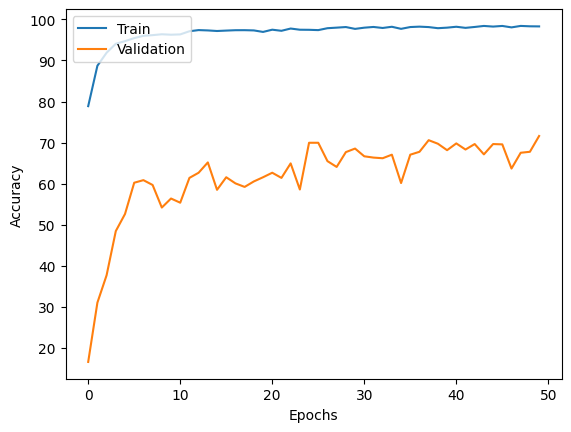

In [25]:
# Plot training and validation accuracy over epochs
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="Train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label="Validation")
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

# With dropout layers

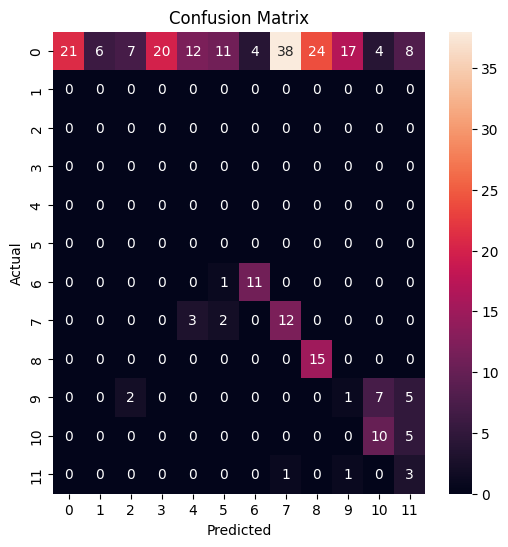

Epoch 0/50 ---> Train Accuracy: 75.87610876835829%, Validation Accuracy: 18.50980392156863%
Epoch 0/50 runtime: 0.3103643417358398 minutes


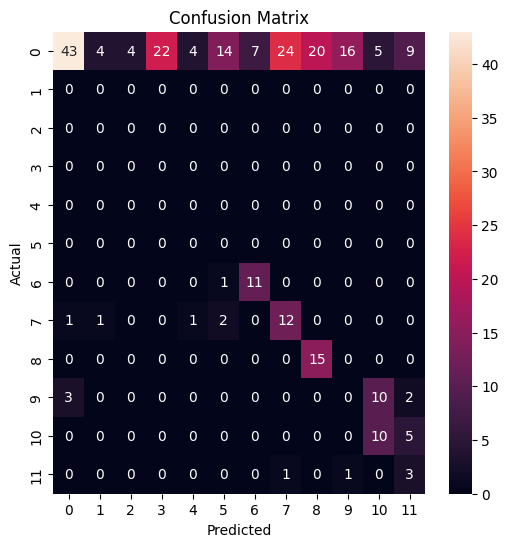

Epoch 1/50 ---> Train Accuracy: 88.49498327759197%, Validation Accuracy: 31.764705882352942%
Epoch 1/50 runtime: 0.4193243900934855 minutes


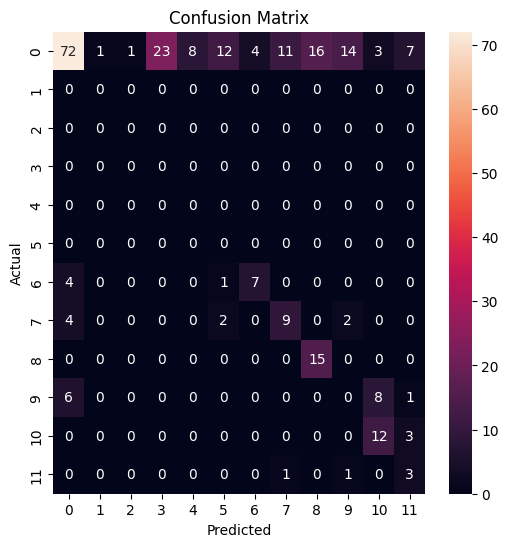

Epoch 2/50 ---> Train Accuracy: 92.60433328486259%, Validation Accuracy: 43.68627450980392%
Epoch 2/50 runtime: 0.3992138067881266 minutes


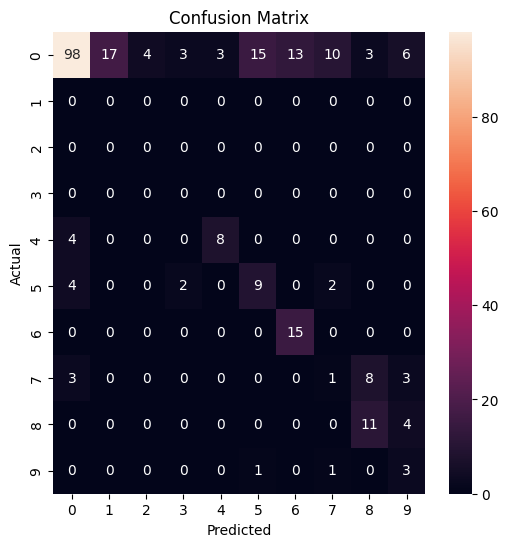

Epoch 3/50 ---> Train Accuracy: 94.01483204885851%, Validation Accuracy: 51.68627450980392%
Epoch 3/50 runtime: 0.5353681723276774 minutes


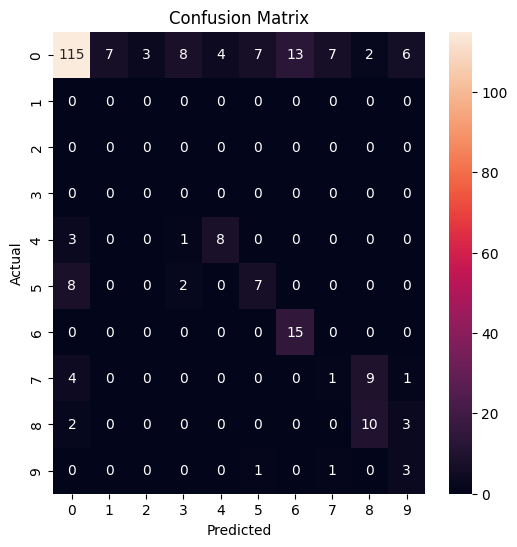

Epoch 4/50 ---> Train Accuracy: 95.68416460665988%, Validation Accuracy: 55.13725490196079%
Epoch 4/50 runtime: 0.36475908756256104 minutes


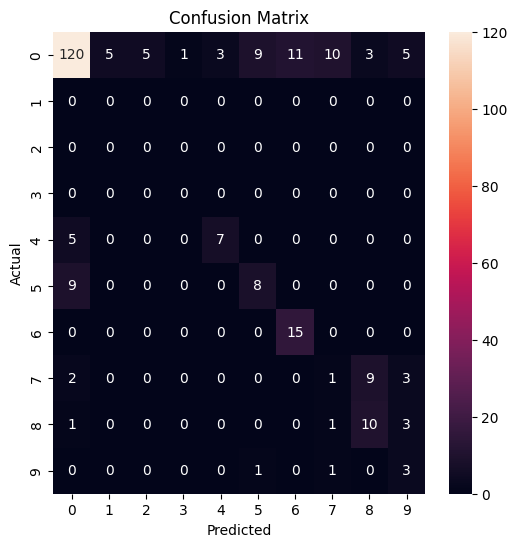

Epoch 5/50 ---> Train Accuracy: 96.35306092773011%, Validation Accuracy: 59.450980392156865%
Epoch 5/50 runtime: 0.3494955619176229 minutes


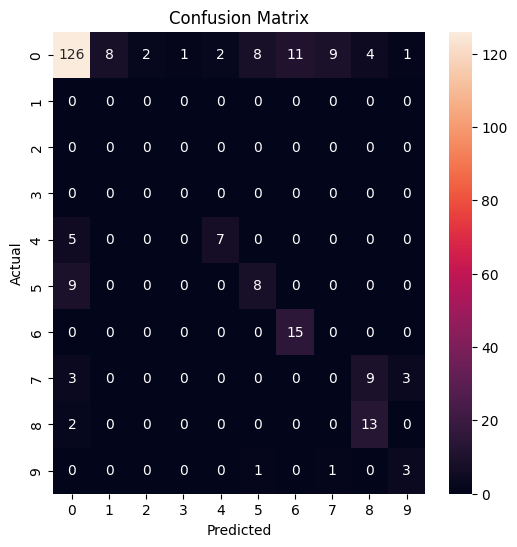

Epoch 6/50 ---> Train Accuracy: 96.83001308710193%, Validation Accuracy: 61.411764705882355%
Epoch 6/50 runtime: 0.371057403087616 minutes


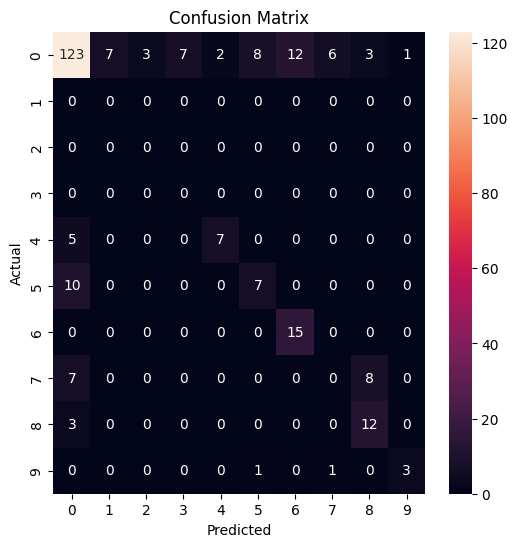

Epoch 7/50 ---> Train Accuracy: 96.67005961901992%, Validation Accuracy: 63.6078431372549%
Epoch 7/50 runtime: 0.3111748774846395 minutes


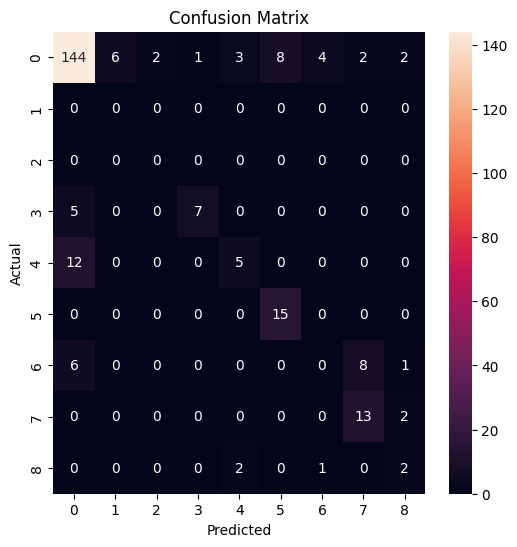

Epoch 8/50 ---> Train Accuracy: 97.58615675439871%, Validation Accuracy: 65.56862745098039%
Epoch 8/50 runtime: 0.2212584098180135 minutes


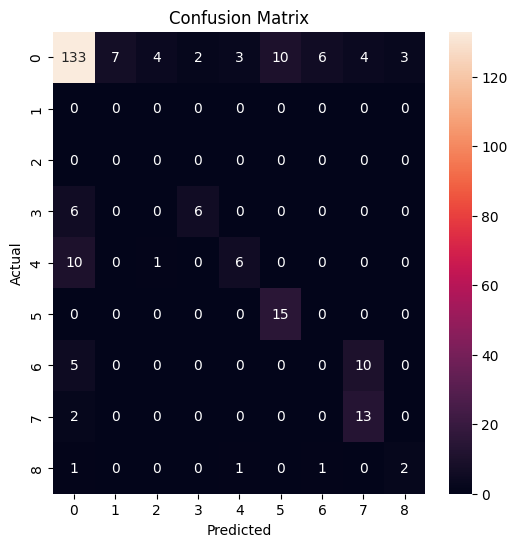

Epoch 9/50 ---> Train Accuracy: 97.69085356987058%, Validation Accuracy: 64.54901960784314%
Epoch 9/50 runtime: 0.2210664391517639 minutes


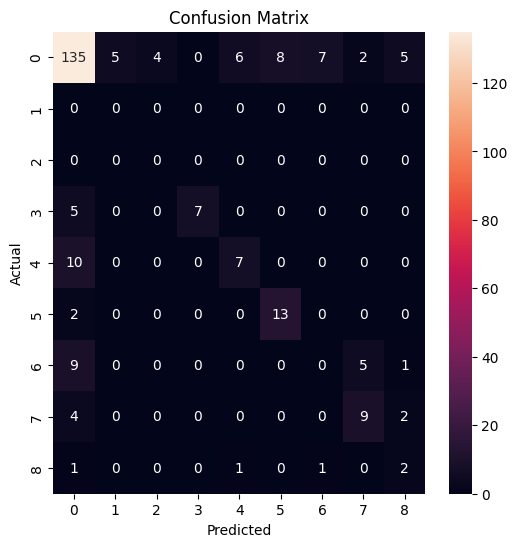

Epoch 10/50 ---> Train Accuracy: 97.80136687509088%, Validation Accuracy: 64.47058823529412%
Epoch 10/50 runtime: 0.21483779350916546 minutes


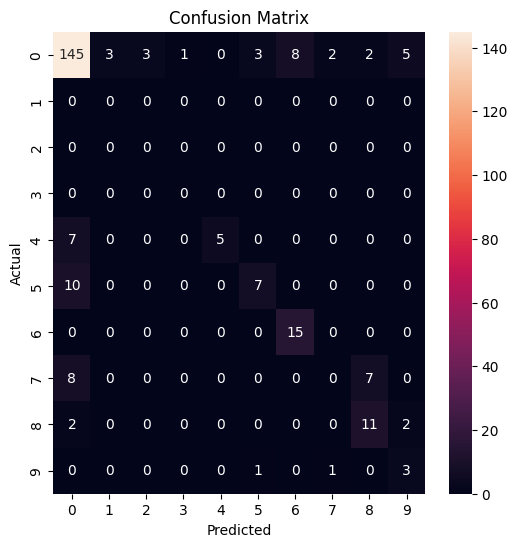

Epoch 11/50 ---> Train Accuracy: 97.93805438417915%, Validation Accuracy: 67.52941176470588%
Epoch 11/50 runtime: 0.20637375513712566 minutes


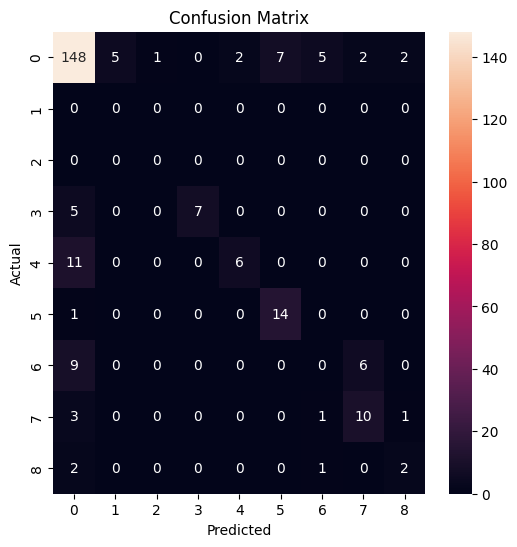

Epoch 12/50 ---> Train Accuracy: 98.20561291260724%, Validation Accuracy: 66.27450980392157%
Epoch 12/50 runtime: 0.2006097157796224 minutes


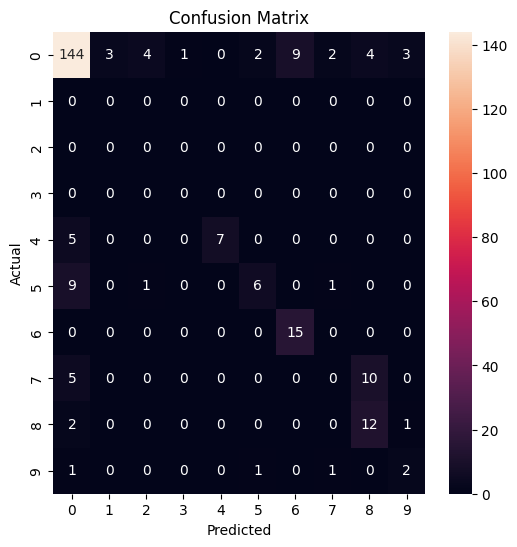

Epoch 13/50 ---> Train Accuracy: 98.33939217682129%, Validation Accuracy: 67.92156862745098%
Epoch 13/50 runtime: 0.20275128682454427 minutes


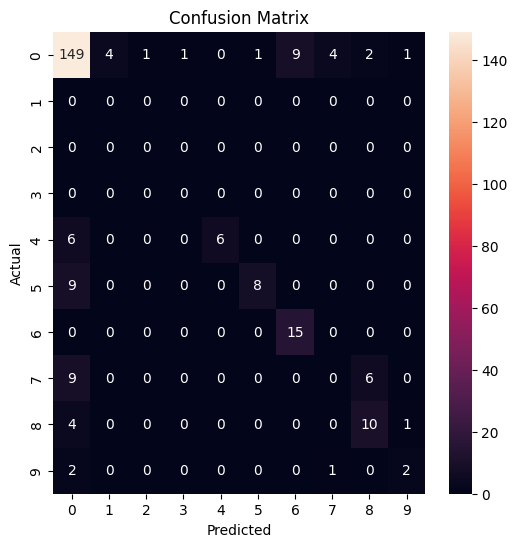

Epoch 14/50 ---> Train Accuracy: 98.34520866656973%, Validation Accuracy: 68.31372549019608%
Epoch 14/50 runtime: 0.2158999562263489 minutes


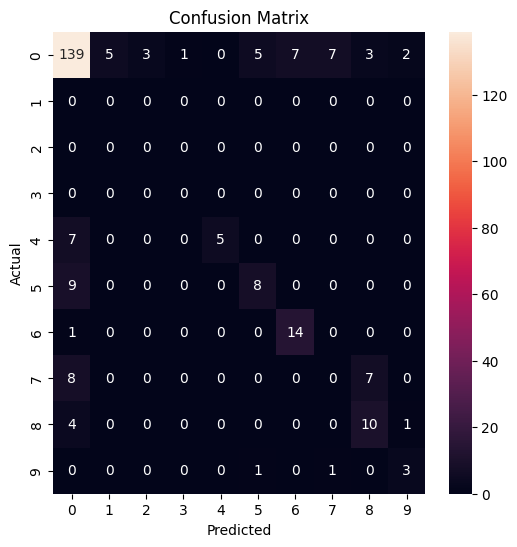

Epoch 15/50 ---> Train Accuracy: 98.1678057292424%, Validation Accuracy: 65.25490196078431%
Epoch 15/50 runtime: 0.20836990276972453 minutes


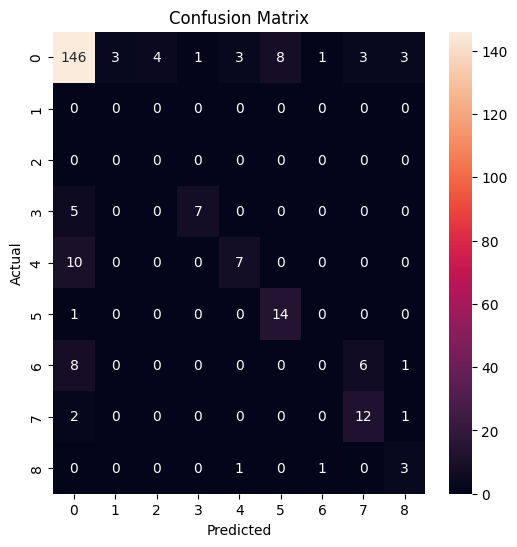

Epoch 16/50 ---> Train Accuracy: 98.31903446270177%, Validation Accuracy: 68.0%
Epoch 16/50 runtime: 0.2086468497912089 minutes


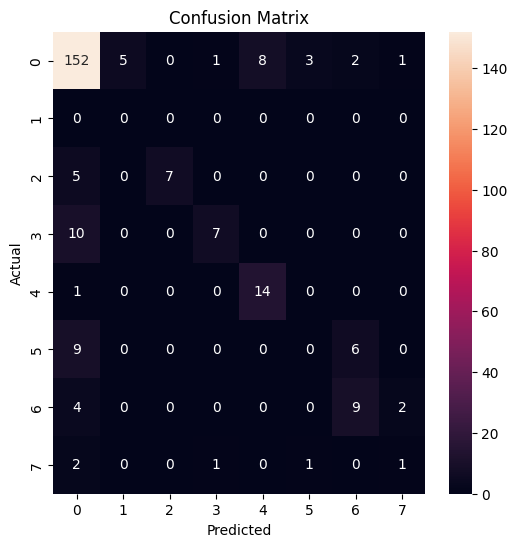

Epoch 17/50 ---> Train Accuracy: 98.65348262323688%, Validation Accuracy: 70.11764705882354%
Epoch 17/50 runtime: 0.20234286387761433 minutes


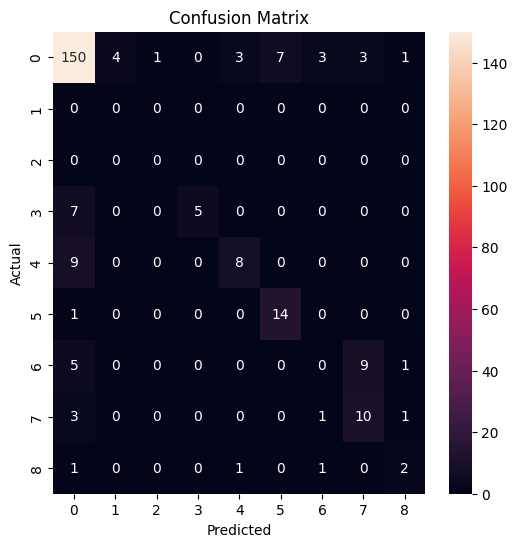

Epoch 18/50 ---> Train Accuracy: 98.66802384760797%, Validation Accuracy: 69.96078431372548%
Epoch 18/50 runtime: 0.20081624190012615 minutes


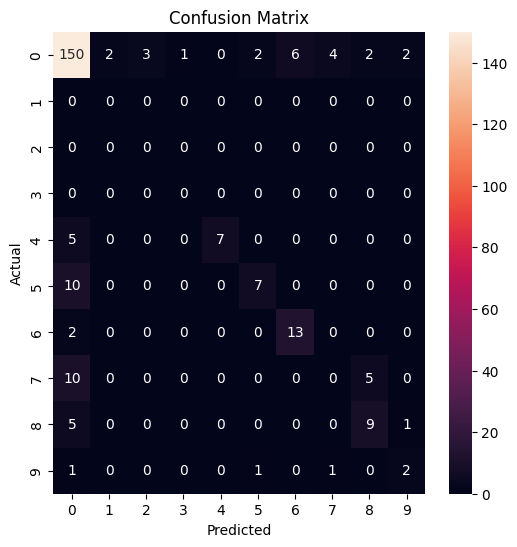

Epoch 19/50 ---> Train Accuracy: 98.70873927584702%, Validation Accuracy: 67.76470588235294%
Epoch 19/50 runtime: 0.20020589828491211 minutes


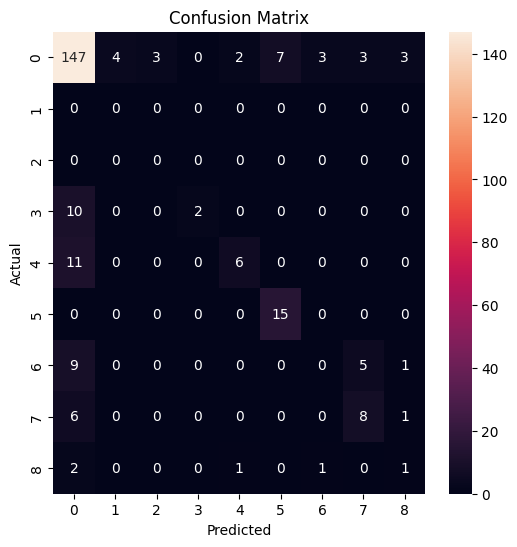

Epoch 20/50 ---> Train Accuracy: 98.67965682710484%, Validation Accuracy: 69.33333333333333%
Epoch 20/50 runtime: 0.18982616662979127 minutes


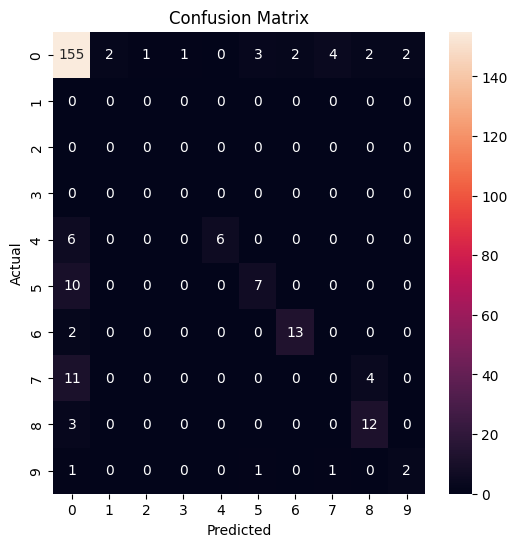

Epoch 21/50 ---> Train Accuracy: 98.84251854006108%, Validation Accuracy: 70.58823529411765%
Epoch 21/50 runtime: 0.206530491511027 minutes


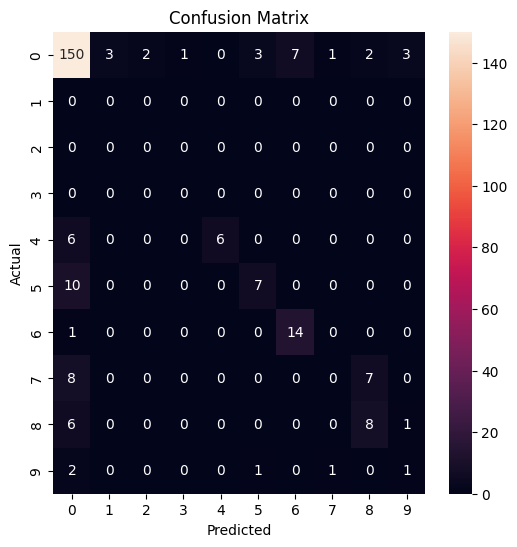

Epoch 22/50 ---> Train Accuracy: 98.8483350298095%, Validation Accuracy: 70.19607843137256%
Epoch 22/50 runtime: 0.21446568568547567 minutes


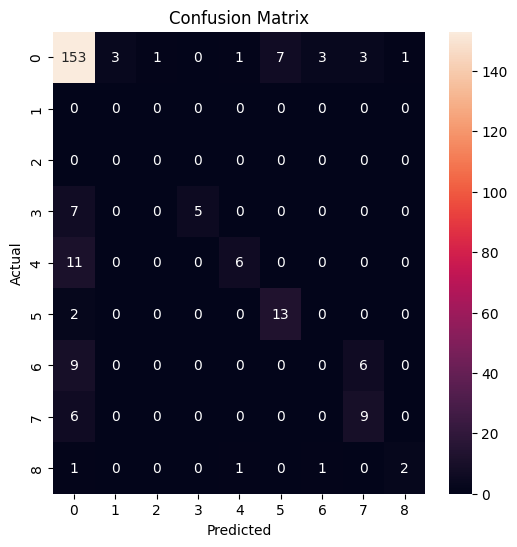

Epoch 23/50 ---> Train Accuracy: 98.87741747855169%, Validation Accuracy: 69.80392156862744%
Epoch 23/50 runtime: 0.22782126665115357 minutes


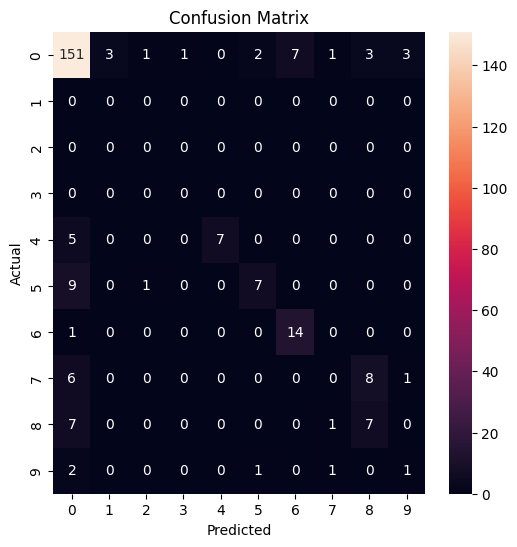

Epoch 24/50 ---> Train Accuracy: 98.92104115166497%, Validation Accuracy: 70.58823529411765%
Epoch 24/50 runtime: 0.21429304679234823 minutes


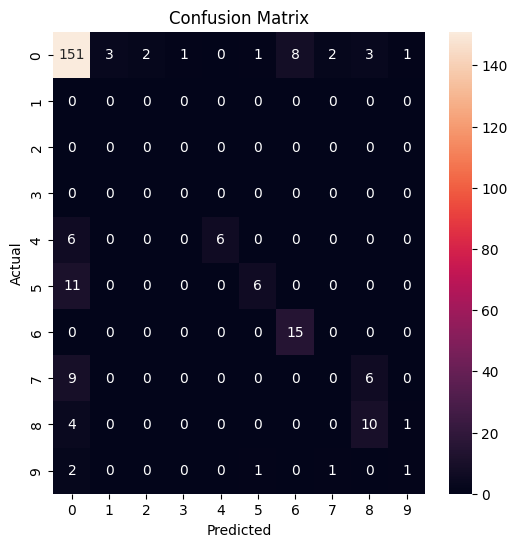

Epoch 25/50 ---> Train Accuracy: 98.94139886578449%, Validation Accuracy: 71.13725490196079%
Epoch 25/50 runtime: 0.2206296404202779 minutes


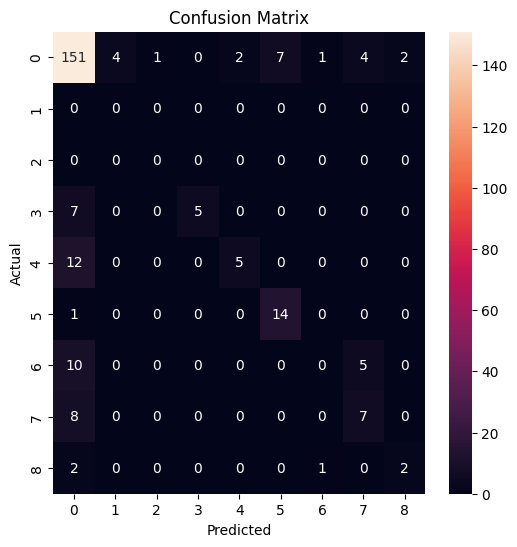

Epoch 26/50 ---> Train Accuracy: 98.88905045804857%, Validation Accuracy: 71.45098039215686%
Epoch 26/50 runtime: 0.21294405062993368 minutes


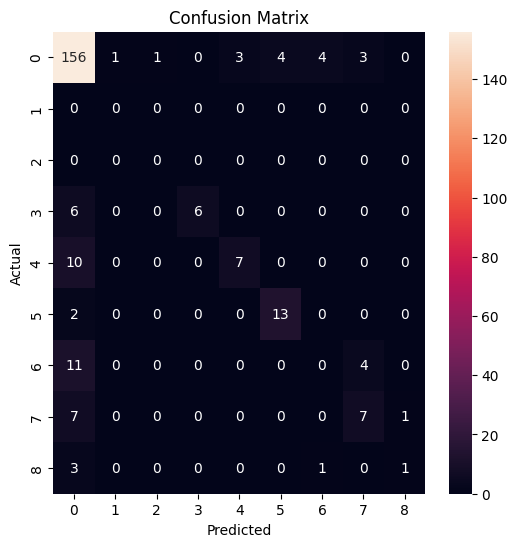

Epoch 27/50 ---> Train Accuracy: 98.96466482477824%, Validation Accuracy: 71.37254901960785%
Epoch 27/50 runtime: 0.19209948778152466 minutes


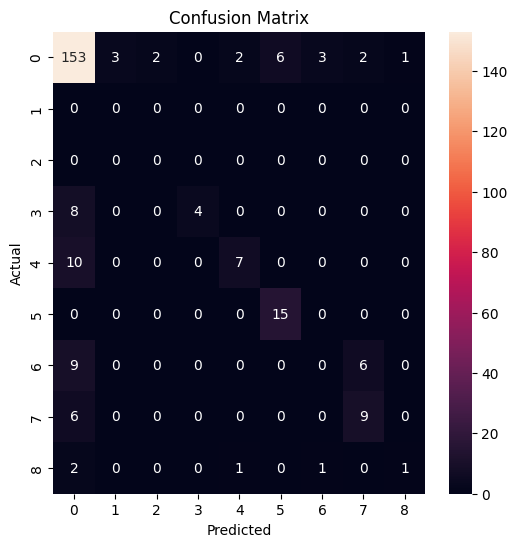

Epoch 28/50 ---> Train Accuracy: 98.79598662207358%, Validation Accuracy: 70.3529411764706%
Epoch 28/50 runtime: 0.20228901704152424 minutes


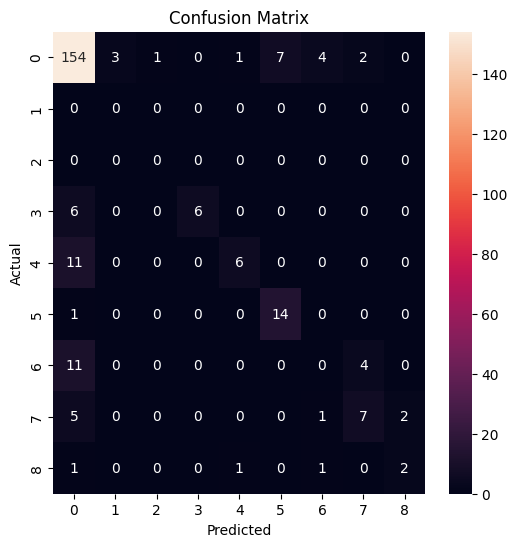

Epoch 29/50 ---> Train Accuracy: 99.11007706848916%, Validation Accuracy: 70.27450980392157%
Epoch 29/50 runtime: 0.22519237597783406 minutes


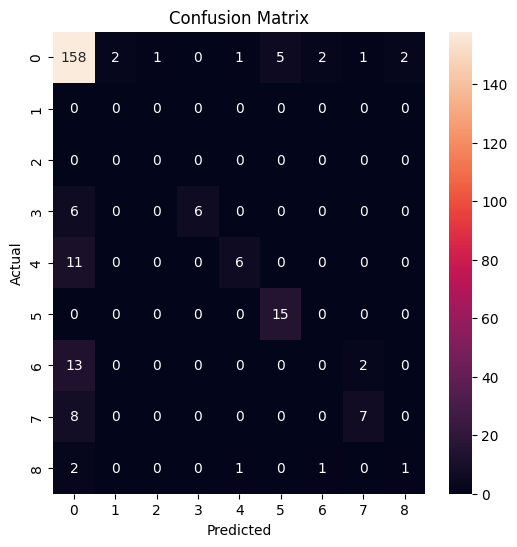

Epoch 30/50 ---> Train Accuracy: 99.0199214773884%, Validation Accuracy: 70.98039215686275%
Epoch 30/50 runtime: 0.21055736541748046 minutes


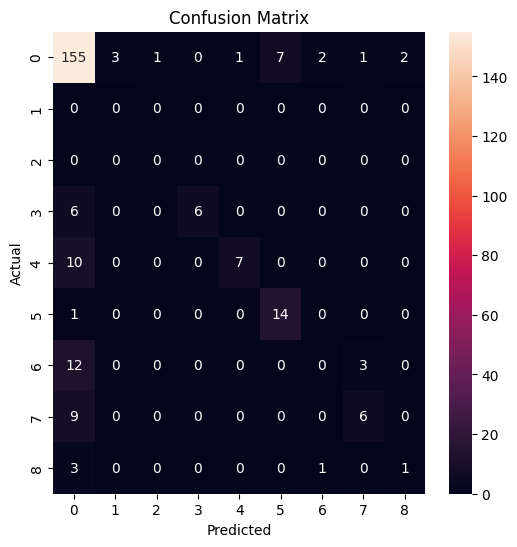

Epoch 31/50 ---> Train Accuracy: 98.87450923367747%, Validation Accuracy: 71.76470588235294%
Epoch 31/50 runtime: 0.2090460459391276 minutes


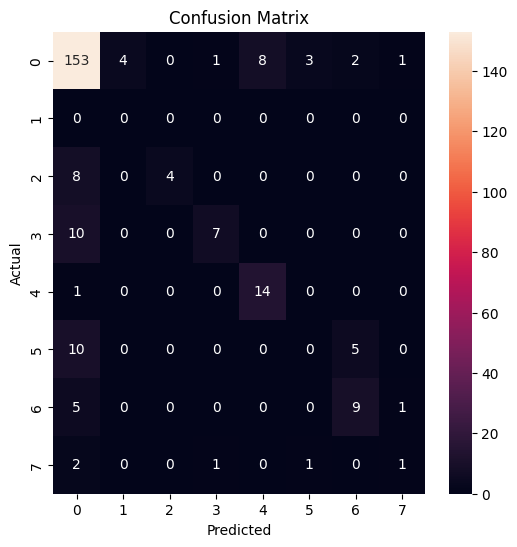

Epoch 32/50 ---> Train Accuracy: 98.93849062091029%, Validation Accuracy: 69.6470588235294%
Epoch 32/50 runtime: 0.21003196239471436 minutes


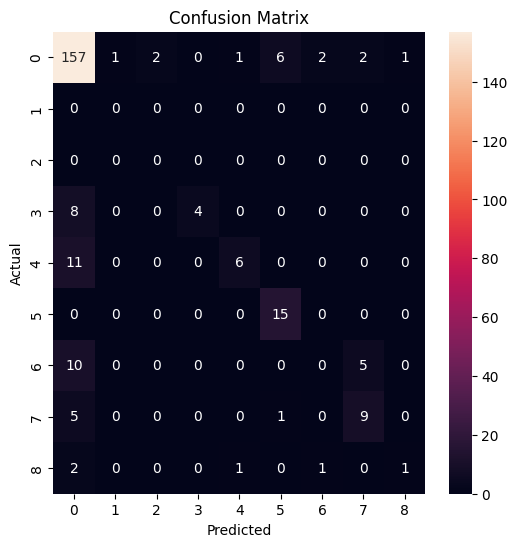

Epoch 33/50 ---> Train Accuracy: 99.14206776210557%, Validation Accuracy: 70.66666666666667%
Epoch 33/50 runtime: 0.21493035952250164 minutes


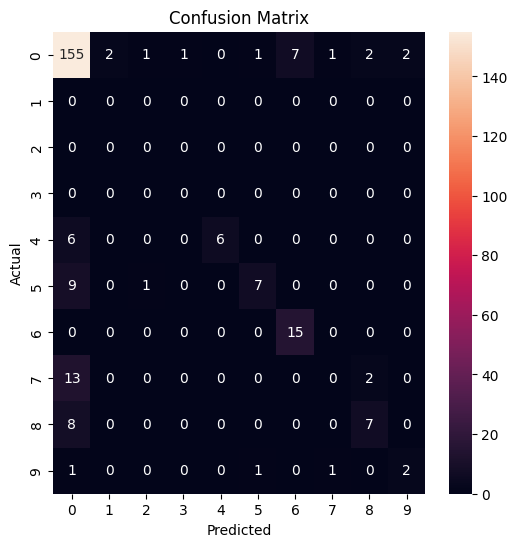

Epoch 34/50 ---> Train Accuracy: 99.08681110949541%, Validation Accuracy: 71.29411764705883%
Epoch 34/50 runtime: 0.20431121587753295 minutes


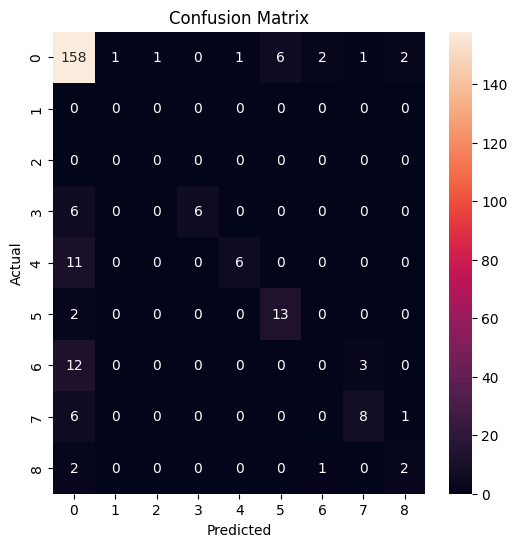

Epoch 35/50 ---> Train Accuracy: 99.15951723135088%, Validation Accuracy: 71.6078431372549%
Epoch 35/50 runtime: 0.18878103892008463 minutes


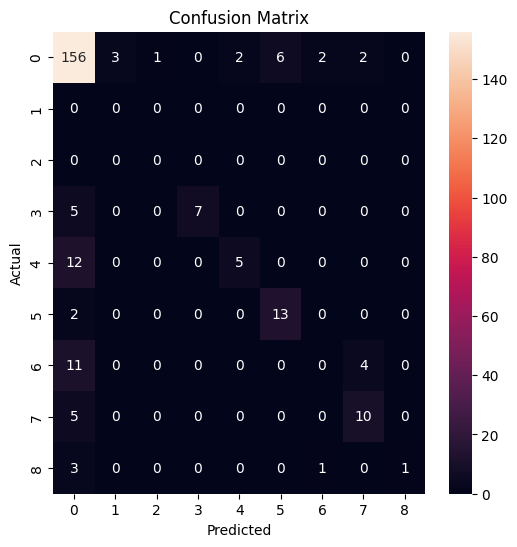

Epoch 36/50 ---> Train Accuracy: 99.15079249672823%, Validation Accuracy: 72.47058823529412%
Epoch 36/50 runtime: 0.19502064784367878 minutes


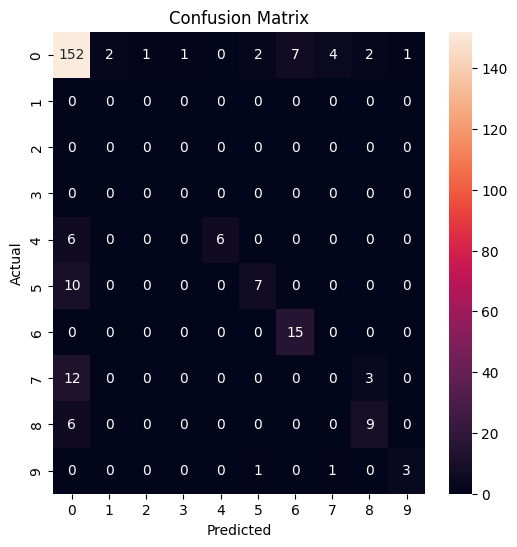

Epoch 37/50 ---> Train Accuracy: 98.97629780427512%, Validation Accuracy: 68.15686274509804%
Epoch 37/50 runtime: 0.21298332611719767 minutes


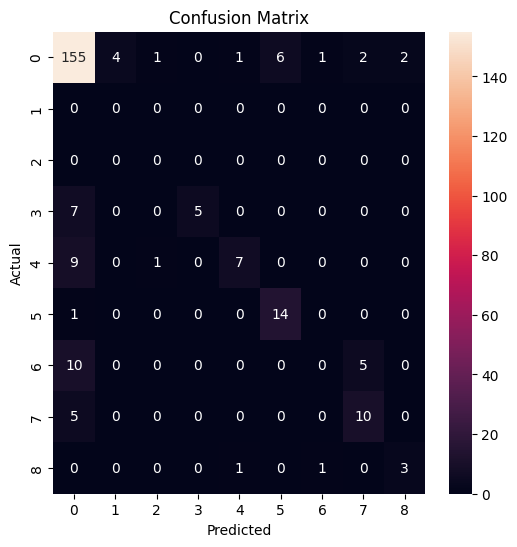

Epoch 38/50 ---> Train Accuracy: 99.16824196597354%, Validation Accuracy: 71.29411764705883%
Epoch 38/50 runtime: 0.20423067410786946 minutes


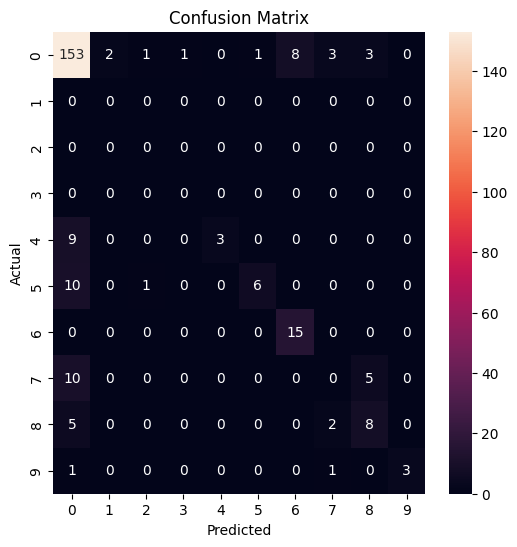

Epoch 39/50 ---> Train Accuracy: 99.14206776210557%, Validation Accuracy: 70.90196078431373%
Epoch 39/50 runtime: 0.2034746766090393 minutes


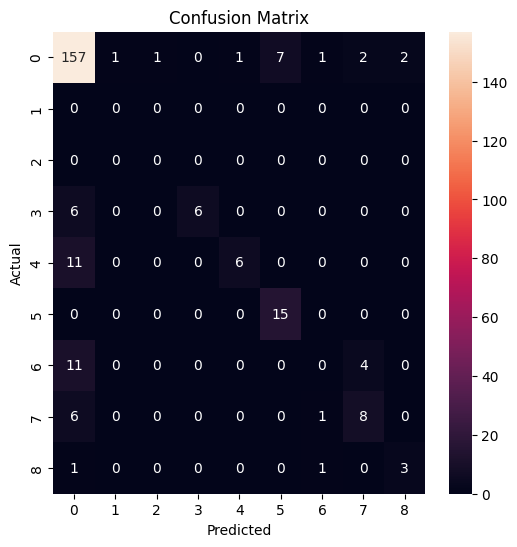

Epoch 40/50 ---> Train Accuracy: 99.26421404682274%, Validation Accuracy: 71.84313725490196%
Epoch 40/50 runtime: 0.1958375096321106 minutes


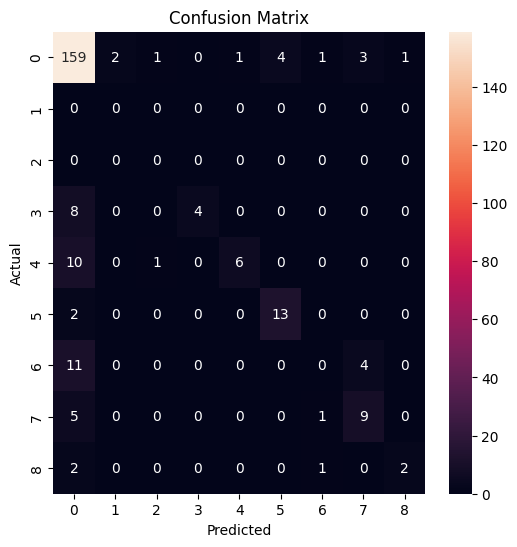

Epoch 41/50 ---> Train Accuracy: 99.31656245455868%, Validation Accuracy: 72.0%
Epoch 41/50 runtime: 0.1868235985438029 minutes


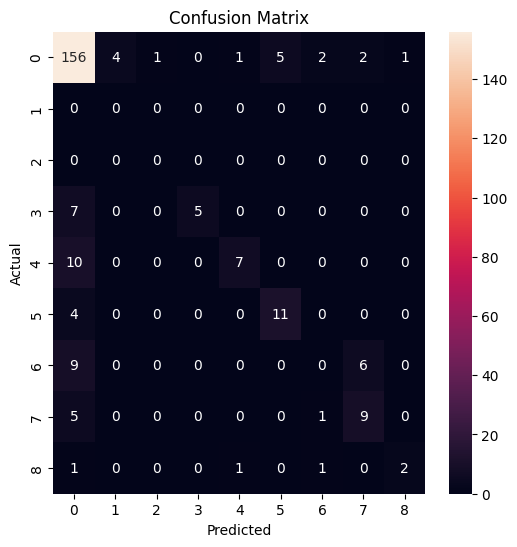

Epoch 42/50 ---> Train Accuracy: 99.33110367892976%, Validation Accuracy: 70.19607843137256%
Epoch 42/50 runtime: 0.18301991621653238 minutes


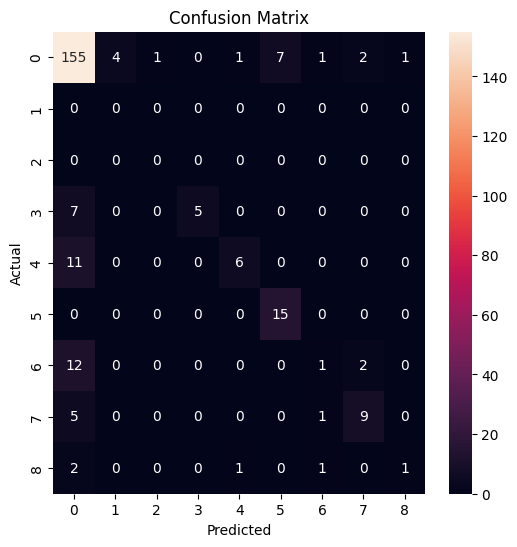

Epoch 43/50 ---> Train Accuracy: 99.16824196597354%, Validation Accuracy: 71.92156862745098%
Epoch 43/50 runtime: 0.20497292677561443 minutes


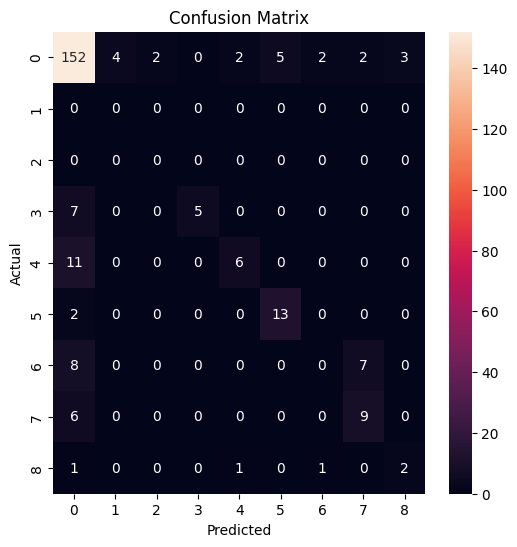

Epoch 44/50 ---> Train Accuracy: 99.2729387814454%, Validation Accuracy: 69.17647058823529%
Epoch 44/50 runtime: 0.20171613693237306 minutes


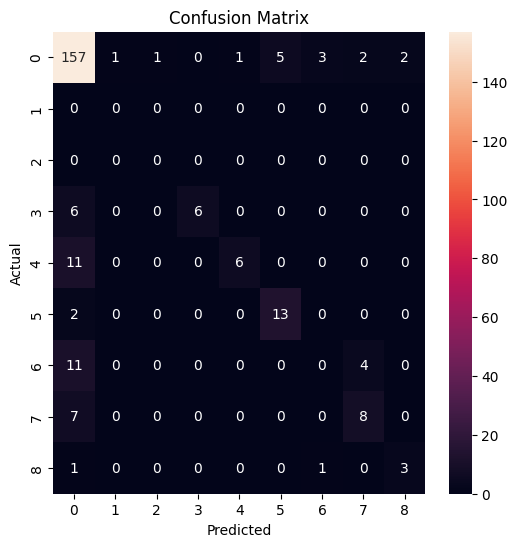

Epoch 45/50 ---> Train Accuracy: 99.21186563908681%, Validation Accuracy: 71.13725490196079%
Epoch 45/50 runtime: 0.20085401932398478 minutes


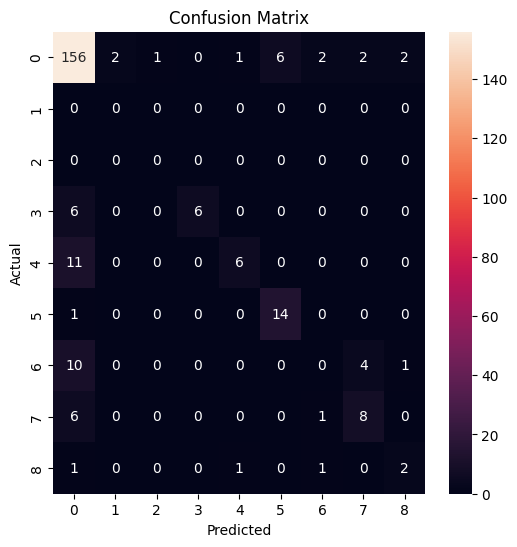

Epoch 46/50 ---> Train Accuracy: 98.09800785226116%, Validation Accuracy: 71.52941176470588%
Epoch 46/50 runtime: 0.19831478595733643 minutes


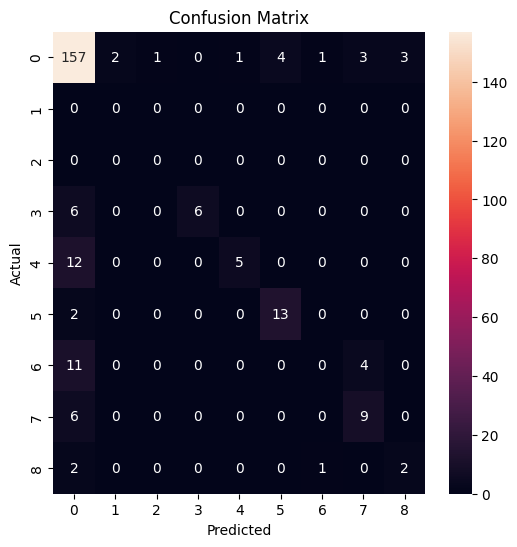

Epoch 47/50 ---> Train Accuracy: 99.28457176094227%, Validation Accuracy: 71.84313725490196%
Epoch 47/50 runtime: 0.1959953228632609 minutes


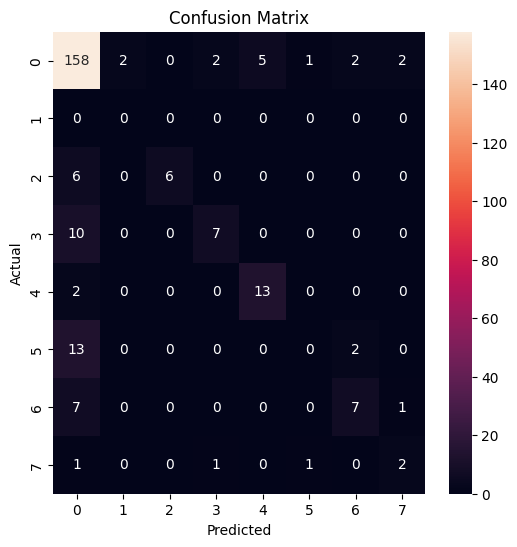

Epoch 48/50 ---> Train Accuracy: 99.28748000581649%, Validation Accuracy: 71.29411764705883%
Epoch 48/50 runtime: 0.18124865690867106 minutes


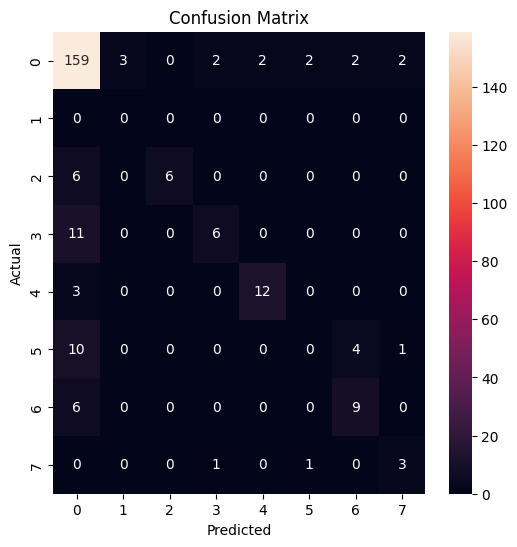

Epoch 49/50 ---> Train Accuracy: 99.35436963792351%, Validation Accuracy: 71.2156862745098%
Epoch 49/50 runtime: 0.19812597433725992 minutes


In [26]:
# Hyperparameters
input_size = X_train.shape[2]
hidden_size = 256  # Number of hidden units in RNN
num_classes = 13  # For classification
epochs = 50
learning_rate = 0.001 #0.01 #
batch_size = 512 #32
landa = 0.001  # Regularization term (lambda)

# Data preparation
train_dataset = TensorDataset(t.tensor(padded_sequences, dtype=t.float32), t.tensor(y_train, dtype=t.long))
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TensorDataset(t.tensor(padded_sequences_test, dtype=t.float32), t.tensor(y_test, dtype=t.long))
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# RNN layers and additional fully connected layer
rnn_layer1 = nn.LSTM(input_size, hidden_size, batch_first=True)
dropout1 = nn.Dropout(0.3)  # Add dropout between RNN layers, changed to 0.2
# rnn_layer2 = nn.LSTM(hidden_size, hidden_size, batch_first=True)
# dropout2 = nn.Dropout(0.5)  # Add dropout between RNN layers
fc_layer1 = nn.Linear(hidden_size, hidden_size)  # Additional fully connected layer
fc_layer2 = nn.Linear(hidden_size, num_classes)  # Final output layer

# Dropout layer
dropout_fc = nn.Dropout(0.3)  # Add dropout between fully connected layers

# Activation function
relu = nn.ReLU()

# Loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
# optimizer = Adam(list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)
optimizer = Adam(list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)

# Lists to store accuracies and losses
train_accuracy_list = []
validation_accuracy_list = []
train_loss_list = []

# To be used inside t.no_grad()
loss_list_train = []
loss_list_val = []

class_report_list = []
conf_matrix_list = []

# Training loop
for epoch in range(epochs):

    st = time.time()

    if epoch % 10 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []

    for X, Y in train_data_loader:
        # Forward pass through layers
        out, _ = rnn_layer1(X)
        out = dropout1(out)  # Apply dropout between RNN layers
        # out, _ = rnn_layer2(out)
        # out = dropout2(out)  # Apply dropout between RNN layers
        out = out[:, -1, :]  # Get the last output of the sequence
        out = relu(fc_layer1(out))  # Apply activation function after first fully connected layer
        out = dropout_fc(out)  # Apply dropout between fully connected layers
        out = fc_layer2(out)

        # Regularization
        # l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
        # loss = loss_fn(out, Y) + landa * l2_term
        loss = loss_fn(out, Y)

        per_epoch_loss_list.append(loss.item())

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluation on training and validation data
    rnn_layer1.eval()
    # rnn_layer2.eval()
    fc_layer1.eval()
    fc_layer2.eval()

    with t.no_grad():
        # Training data
        train_correct, train_total = 0, 0
        for X, Y in train_data_loader:
            out, _ = rnn_layer1(X)
            out = dropout1(out)  # Apply dropout between RNN layers
            # out, _ = rnn_layer2(out)
            # out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)
            train_total += Y.size(0)
            train_correct += (predicted == Y).sum().item()

            loss = loss_fn(out, Y)
            loss_list_train.append(loss.item())

        train_accuracy = 100 * train_correct / train_total

        # Validation data
        validation_correct, validation_total = 0, 0
        for X, Y in test_data_loader:
            out, _ = rnn_layer1(X)
            out = dropout1(out)  # Apply dropout between RNN layers
            # out, _ = rnn_layer2(out)
            # out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)
            validation_total += Y.size(0)
            validation_correct += (predicted == Y).sum().item()
            #plot_cm(confusion_matrix(Y,predicted))

            loss_val = loss_fn(out, Y)
            loss_list_val.append(loss_val.item())

            conf_matrix_test, class_report_test=get_scores(Y,predicted)

        plot_cm(conf_matrix_test)

        #plot_cm(confusion_matrix(Y,predicted))
        validation_accuracy = 100 * validation_correct / validation_total

        # Print accuracy for the current epoch
        print(f'Epoch {epoch}/{epochs} ---> Train Accuracy: {train_accuracy}%, Validation Accuracy: {validation_accuracy}%')

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)
        class_report_list.append(class_report_test)
        conf_matrix_list.append(conf_matrix_test)

        et = time.time()

        print(f'Epoch {epoch}/{epochs} runtime:', str((et - st)/60), 'minutes')

    # Calculate and append the average loss for the epoch
    train_loss_list.append(sum(per_epoch_loss_list) / len(per_epoch_loss_list))

    # Set the model back to train mode
    rnn_layer1.train()
    # rnn_layer2.train()
    fc_layer1.train()
    fc_layer2.train()


In [23]:
print(f'Train loss: {np.mean(loss_list_train)}')
print(f'Validation loss: {np.mean(loss_list_val)}')

Train loss: 0.07753036520690383
Validation loss: 2.559147965113322


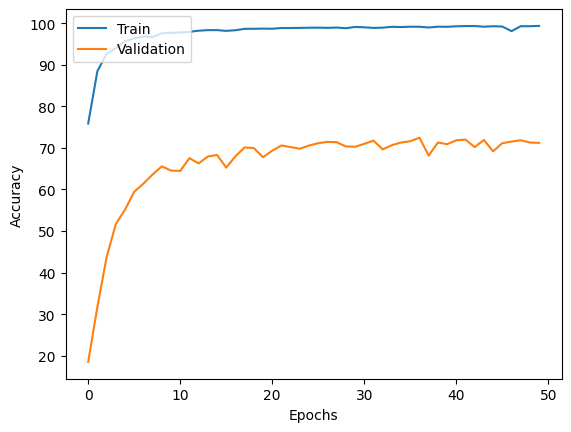

In [27]:
# Plot training and validation accuracy over epochs
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="Train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label="Validation")
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

In [28]:
class_report_list

[{'0': {'precision': 1.0,
   'recall': 0.12209302325581395,
   'f1-score': 0.21761658031088082,
   'support': 172},
  '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '7': {'precision': 0.7333333333333333,
   'recall': 0.9166666666666666,
   'f1-score': 0.8148148148148148,
   'support': 12},
  '8': {'precision': 0.23529411764705882,
   'recall': 0.7058823529411765,
   'f1-score': 0.35294117647058826,
   'support': 17},
  '9': {'precision': 0.38461538461538464,
   'recall': 1.0,
   'f1-score': 0.5555555555555556,
   'support': 15},
  '10': {'precision': 0.05263157894736842,
   'recall': 0.06666666666666667,
   'f1-score': 0.058823529411764705,
   'support': 15},
  '11': {'prec

# Full - second RNN layer, L2 and dropout layers between RNN and FC

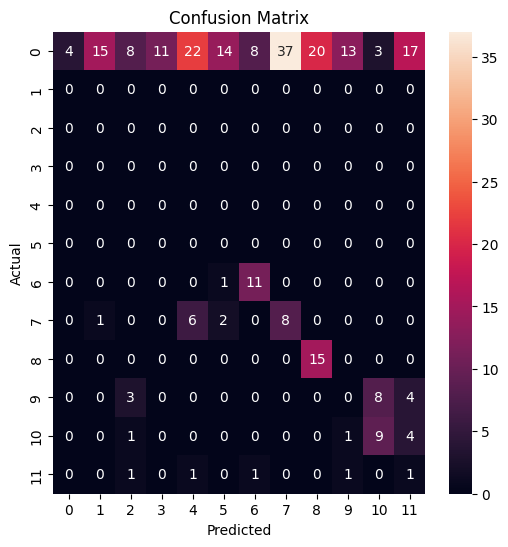

Epoch 0/50 ---> Train Accuracy: 65.39479424167514%, Validation Accuracy: 10.666666666666666%
Epoch 0/50 runtime: 0.7670609037081401 minutes


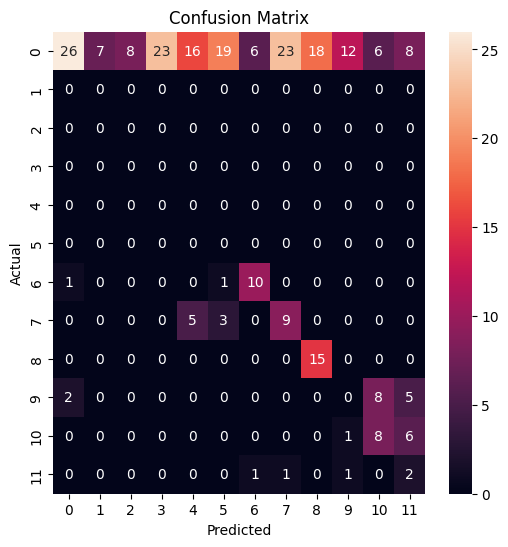

Epoch 1/50 ---> Train Accuracy: 79.63356114584847%, Validation Accuracy: 19.372549019607842%
Epoch 1/50 runtime: 0.7494006911913554 minutes


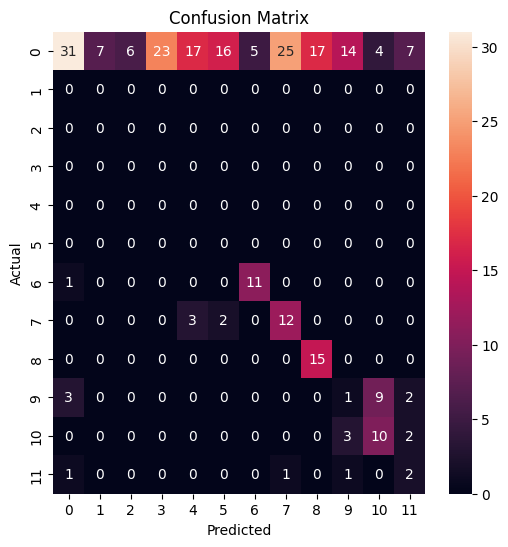

Epoch 2/50 ---> Train Accuracy: 86.37778100916097%, Validation Accuracy: 27.058823529411764%
Epoch 2/50 runtime: 0.5004642764727275 minutes


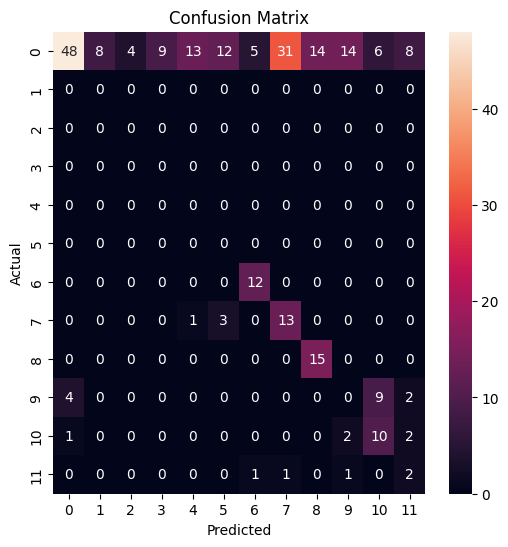

Epoch 3/50 ---> Train Accuracy: 88.7189181329068%, Validation Accuracy: 29.96078431372549%
Epoch 3/50 runtime: 0.4853699207305908 minutes


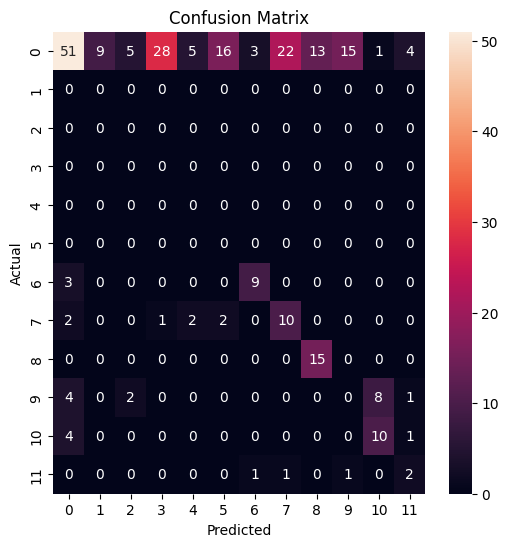

Epoch 4/50 ---> Train Accuracy: 90.9960738694198%, Validation Accuracy: 36.0%
Epoch 4/50 runtime: 0.4949599305788676 minutes


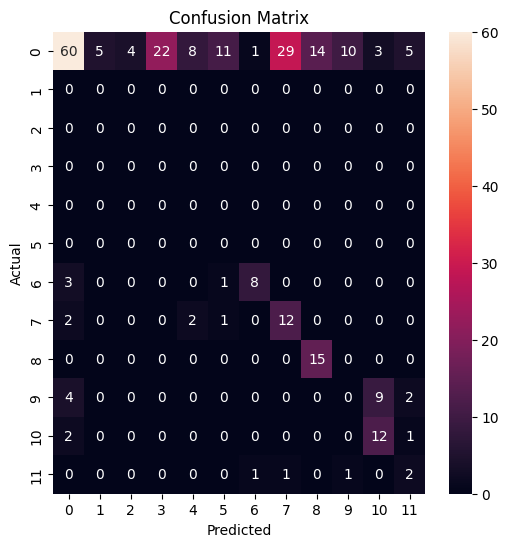

Epoch 5/50 ---> Train Accuracy: 91.85982259706267%, Validation Accuracy: 37.01960784313726%
Epoch 5/50 runtime: 0.788259478410085 minutes


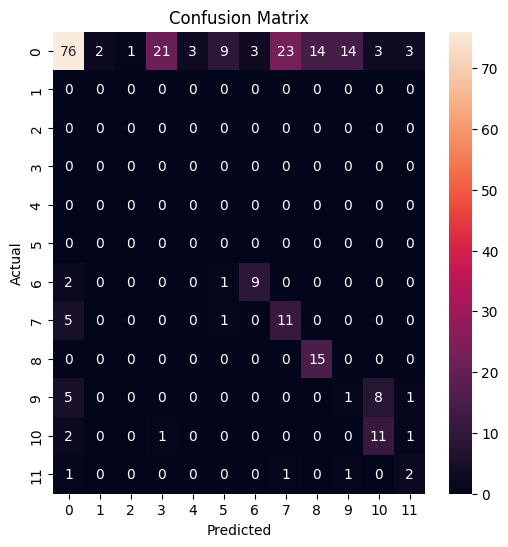

Epoch 6/50 ---> Train Accuracy: 92.61887450923368%, Validation Accuracy: 42.98039215686274%
Epoch 6/50 runtime: 0.5034372846285502 minutes


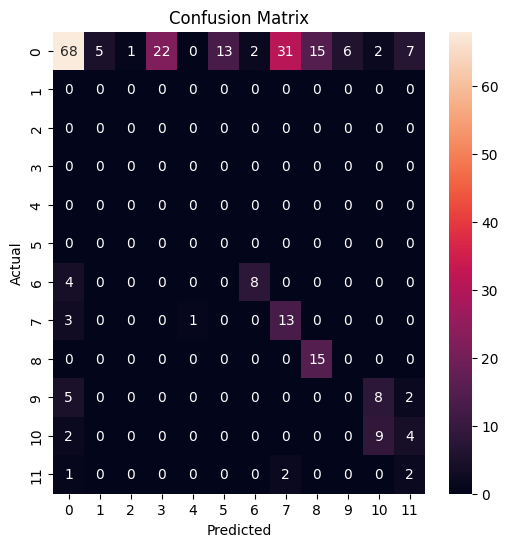

Epoch 7/50 ---> Train Accuracy: 92.3687654500509%, Validation Accuracy: 47.21568627450981%
Epoch 7/50 runtime: 0.47986716429392495 minutes


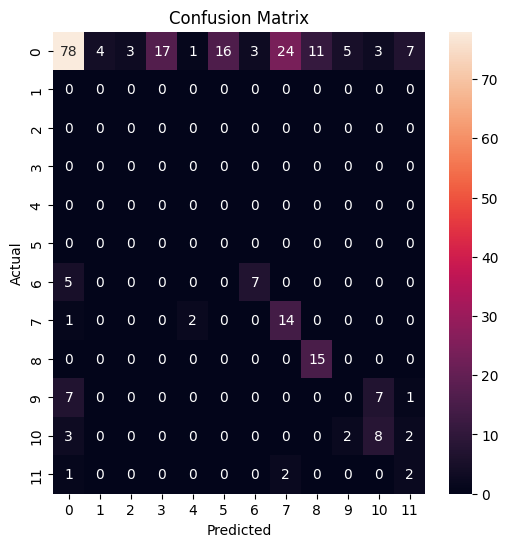

Epoch 8/50 ---> Train Accuracy: 93.26450487131017%, Validation Accuracy: 45.80392156862745%
Epoch 8/50 runtime: 0.5179525136947631 minutes


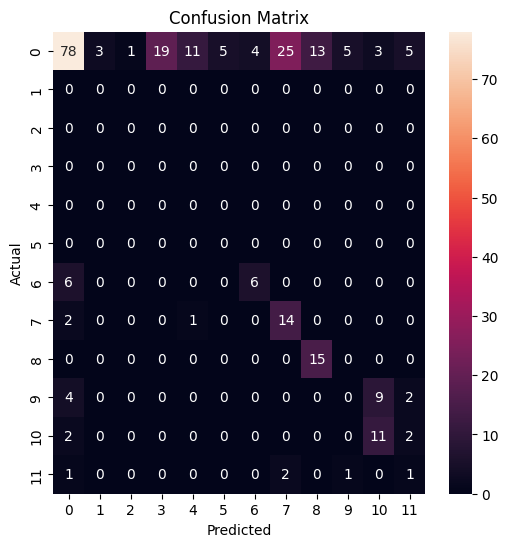

Epoch 9/50 ---> Train Accuracy: 93.70946633706558%, Validation Accuracy: 45.64705882352941%
Epoch 9/50 runtime: 0.5552686134974162 minutes


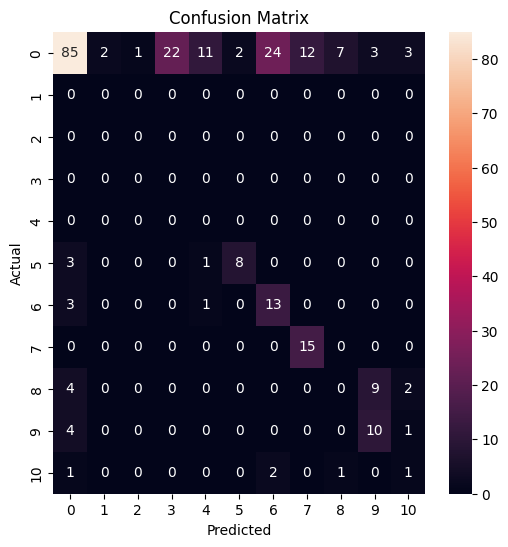

Epoch 10/50 ---> Train Accuracy: 93.26450487131017%, Validation Accuracy: 47.294117647058826%
Epoch 10/50 runtime: 0.5384768644968668 minutes


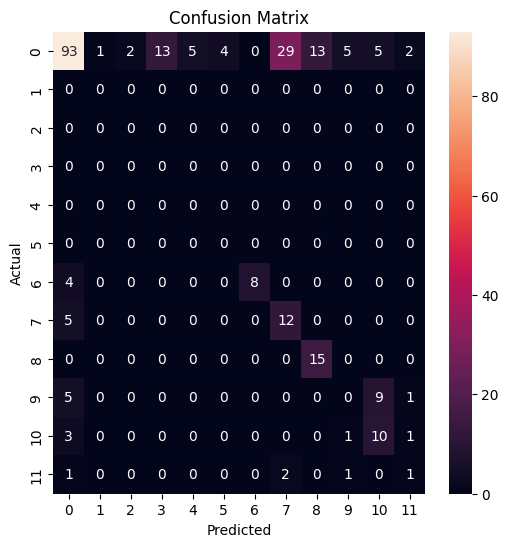

Epoch 11/50 ---> Train Accuracy: 94.7389850225389%, Validation Accuracy: 49.01960784313726%
Epoch 11/50 runtime: 0.5402714331944783 minutes


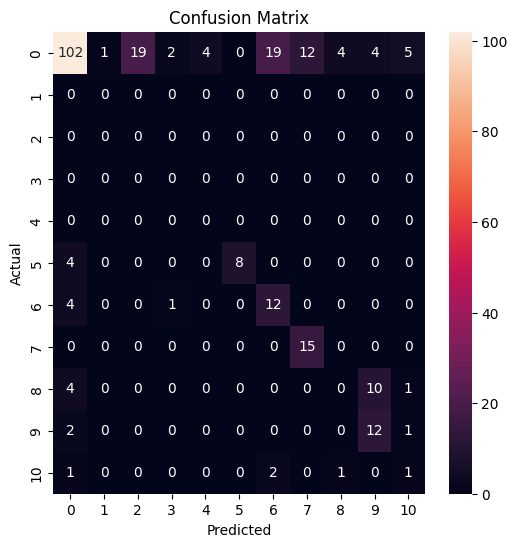

Epoch 12/50 ---> Train Accuracy: 94.31728951577723%, Validation Accuracy: 51.05882352941177%
Epoch 12/50 runtime: 0.5411226948102316 minutes


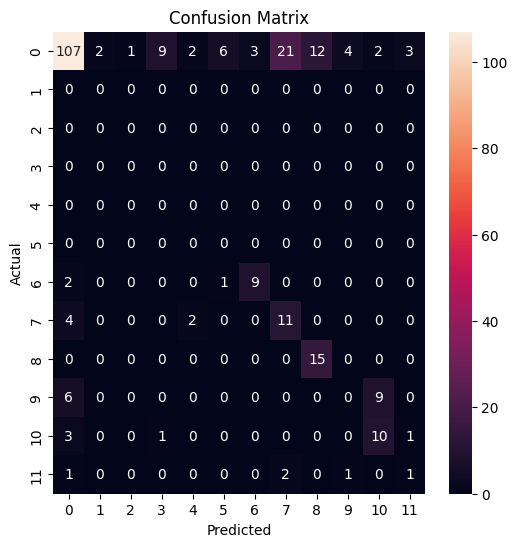

Epoch 13/50 ---> Train Accuracy: 93.95957539624837%, Validation Accuracy: 52.705882352941174%
Epoch 13/50 runtime: 0.5732518951098124 minutes


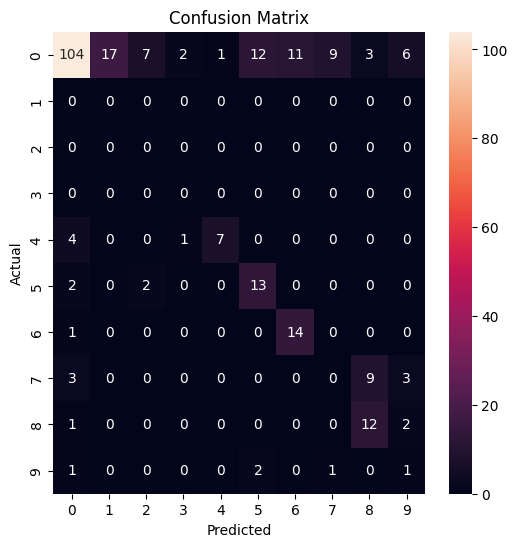

Epoch 14/50 ---> Train Accuracy: 95.16358877417478%, Validation Accuracy: 49.411764705882355%
Epoch 14/50 runtime: 0.5609729091326395 minutes


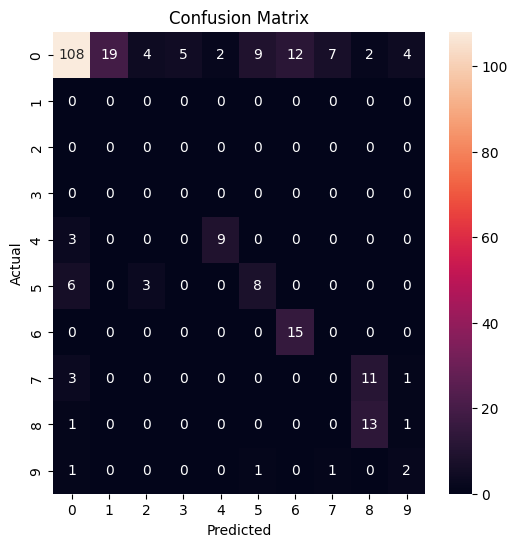

Epoch 15/50 ---> Train Accuracy: 95.06761669332558%, Validation Accuracy: 49.88235294117647%
Epoch 15/50 runtime: 0.5795116782188415 minutes


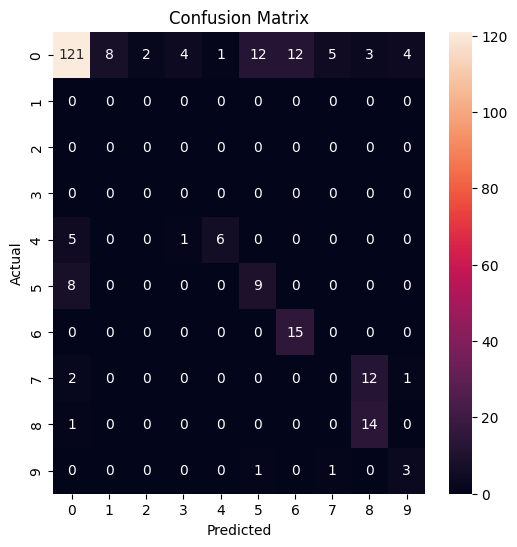

Epoch 16/50 ---> Train Accuracy: 95.41369783335757%, Validation Accuracy: 54.27450980392157%
Epoch 16/50 runtime: 0.5927792509396871 minutes


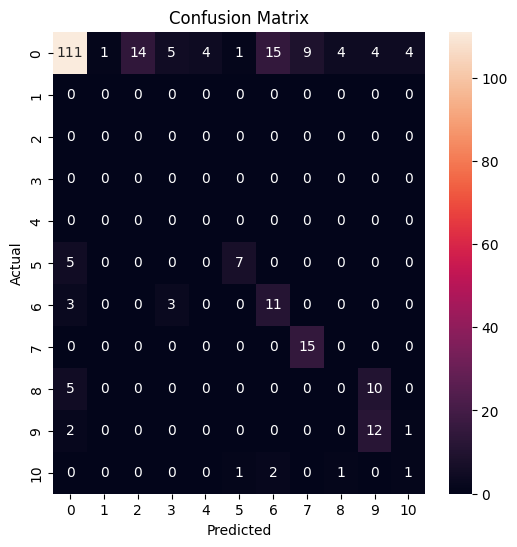

Epoch 17/50 ---> Train Accuracy: 95.53293587320053%, Validation Accuracy: 54.27450980392157%
Epoch 17/50 runtime: 0.556492825349172 minutes


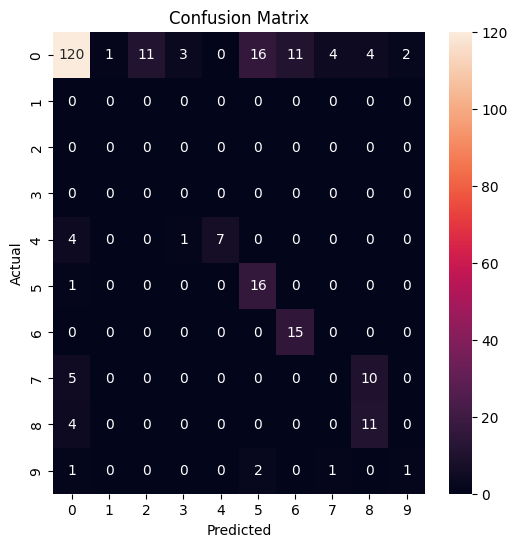

Epoch 18/50 ---> Train Accuracy: 95.44859677184819%, Validation Accuracy: 55.450980392156865%
Epoch 18/50 runtime: 0.5454402248064677 minutes


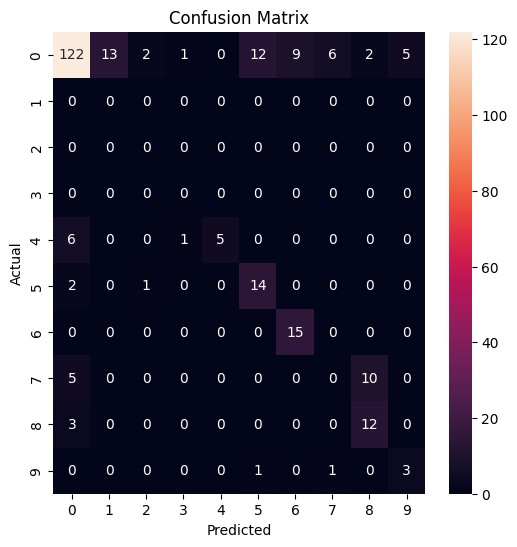

Epoch 19/50 ---> Train Accuracy: 95.56783481169114%, Validation Accuracy: 55.13725490196079%
Epoch 19/50 runtime: 0.5417135198911031 minutes


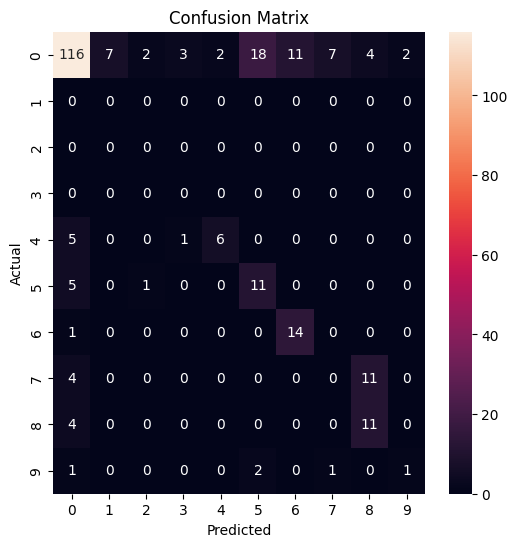

Epoch 20/50 ---> Train Accuracy: 95.63763268867238%, Validation Accuracy: 54.431372549019606%
Epoch 20/50 runtime: 0.5626816074053447 minutes


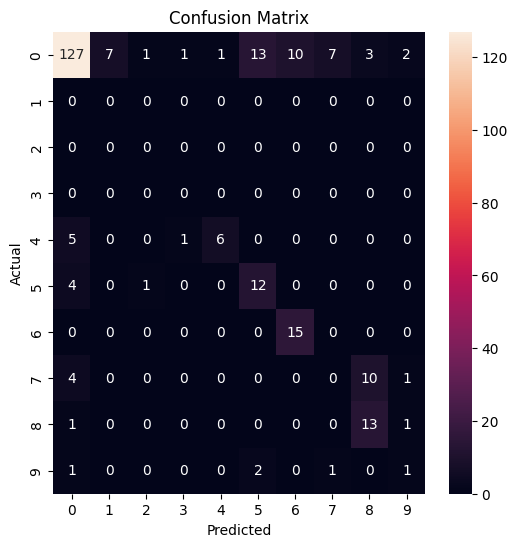

Epoch 21/50 ---> Train Accuracy: 95.75977897338956%, Validation Accuracy: 54.27450980392157%
Epoch 21/50 runtime: 0.5574160178502401 minutes


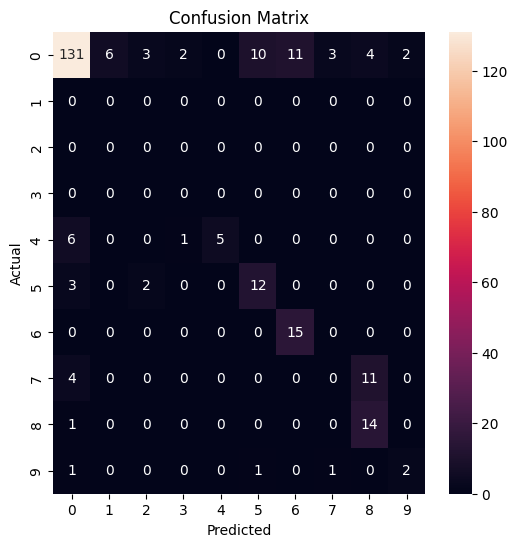

Epoch 22/50 ---> Train Accuracy: 95.65508215791769%, Validation Accuracy: 57.568627450980394%
Epoch 22/50 runtime: 0.544887638092041 minutes


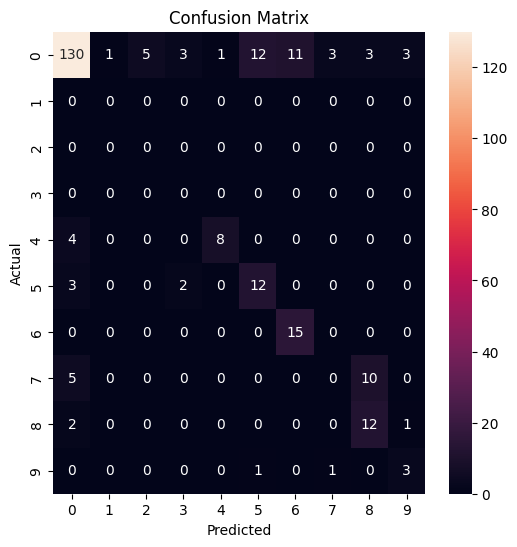

Epoch 23/50 ---> Train Accuracy: 95.74523774901847%, Validation Accuracy: 53.411764705882355%
Epoch 23/50 runtime: 0.5396701415379842 minutes


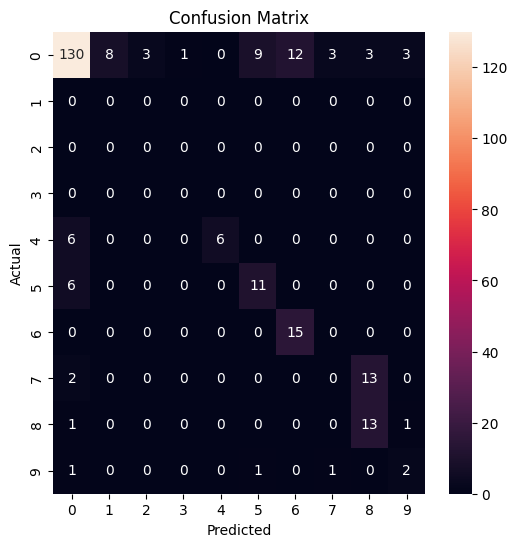

Epoch 24/50 ---> Train Accuracy: 96.271630071252%, Validation Accuracy: 57.09803921568628%
Epoch 24/50 runtime: 0.5435592611630757 minutes


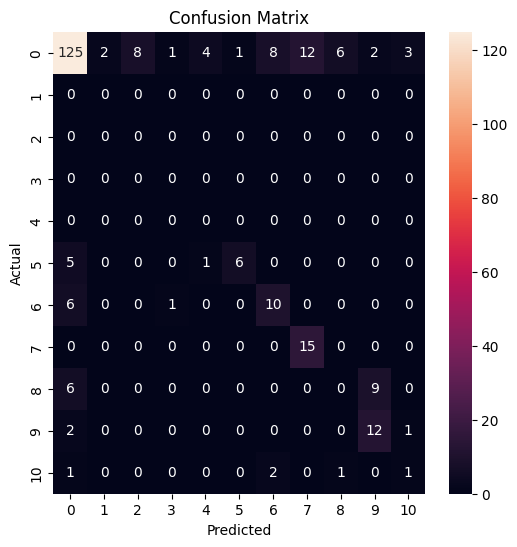

Epoch 25/50 ---> Train Accuracy: 96.10876835829576%, Validation Accuracy: 53.254901960784316%
Epoch 25/50 runtime: 0.5717644929885864 minutes


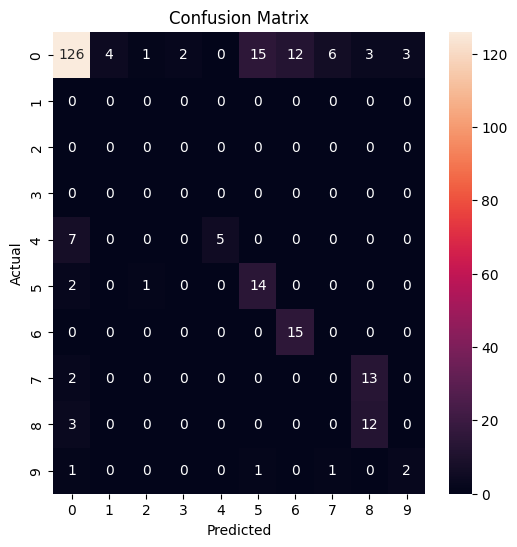

Epoch 26/50 ---> Train Accuracy: 95.92845717609423%, Validation Accuracy: 57.490196078431374%
Epoch 26/50 runtime: 0.5312164068222046 minutes


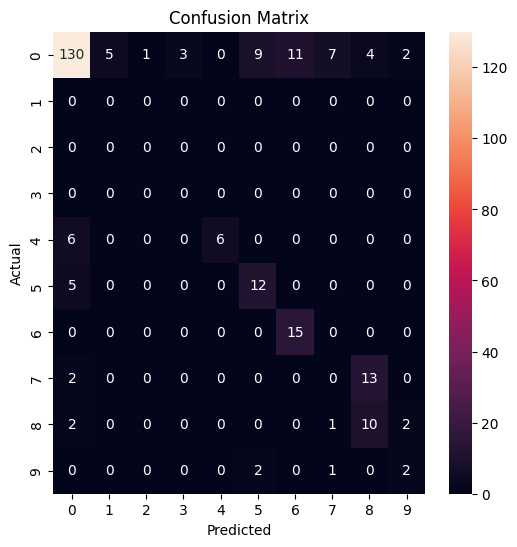

Epoch 27/50 ---> Train Accuracy: 96.30652900974262%, Validation Accuracy: 55.84313725490196%
Epoch 27/50 runtime: 0.5311582207679748 minutes


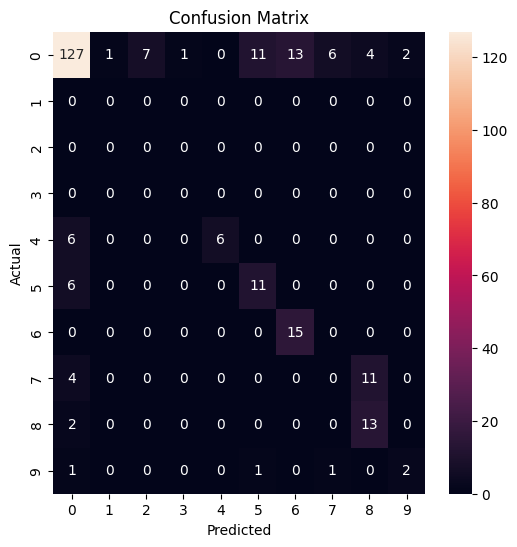

Epoch 28/50 ---> Train Accuracy: 96.25127235713246%, Validation Accuracy: 60.3921568627451%
Epoch 28/50 runtime: 0.5273335655530293 minutes


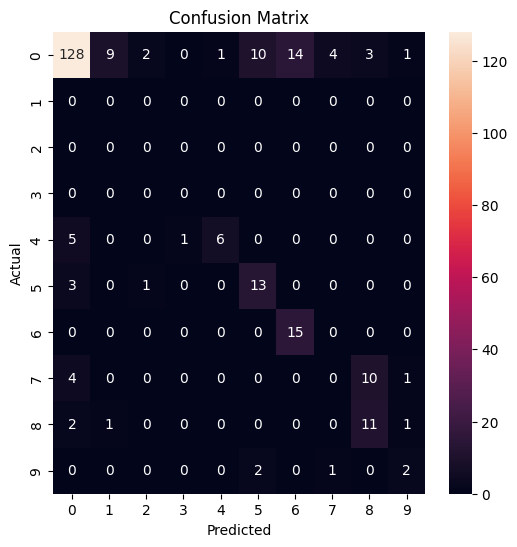

Epoch 29/50 ---> Train Accuracy: 96.01570452232077%, Validation Accuracy: 56.0%
Epoch 29/50 runtime: 0.5447525223096211 minutes


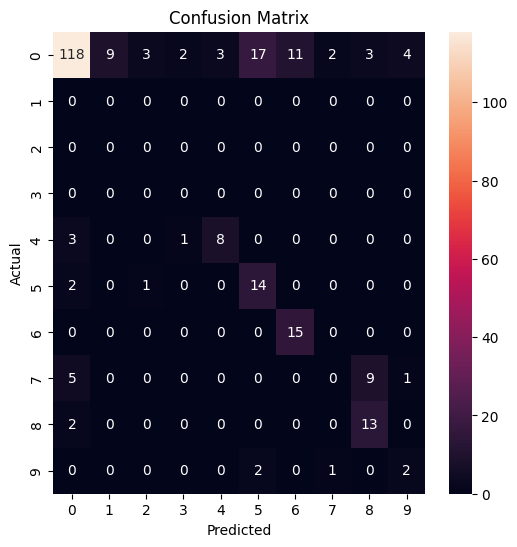

Epoch 30/50 ---> Train Accuracy: 95.96626435945906%, Validation Accuracy: 54.588235294117645%
Epoch 30/50 runtime: 0.5553415815035502 minutes


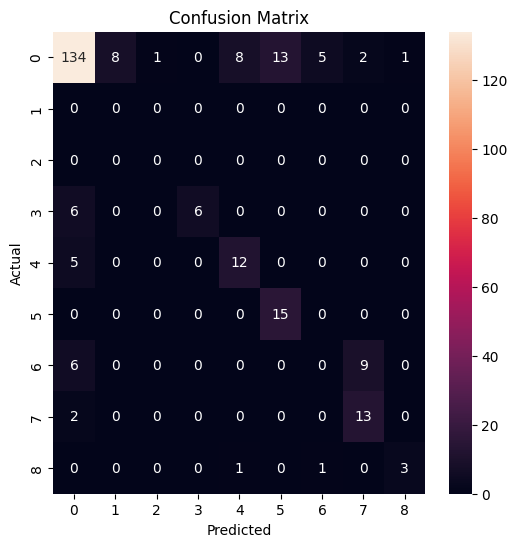

Epoch 31/50 ---> Train Accuracy: 95.88774174785517%, Validation Accuracy: 59.05882352941177%
Epoch 31/50 runtime: 0.5347859859466553 minutes


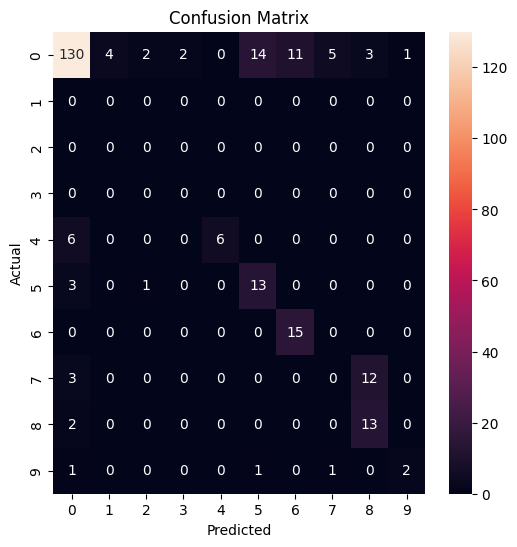

Epoch 32/50 ---> Train Accuracy: 96.15820852115748%, Validation Accuracy: 58.90196078431372%
Epoch 32/50 runtime: 0.5268859346707662 minutes


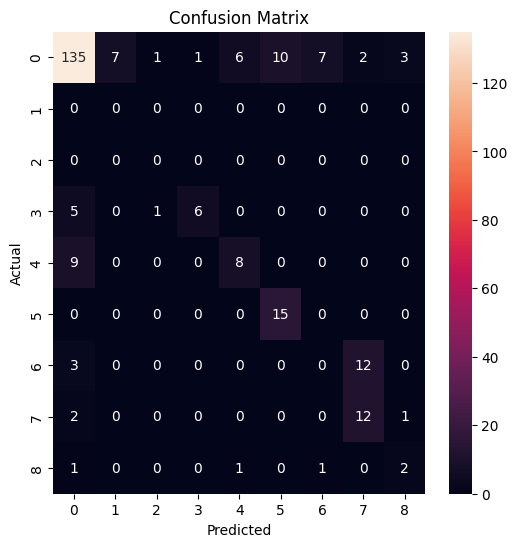

Epoch 33/50 ---> Train Accuracy: 96.31234549949106%, Validation Accuracy: 63.6078431372549%
Epoch 33/50 runtime: 0.5351551413536072 minutes


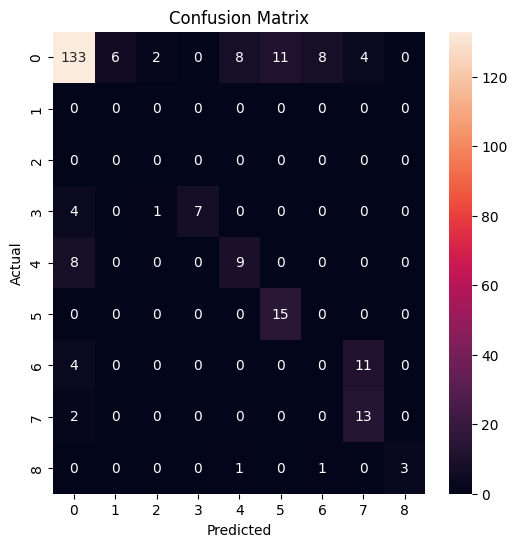

Epoch 34/50 ---> Train Accuracy: 96.62061945615821%, Validation Accuracy: 60.15686274509804%
Epoch 34/50 runtime: 0.5395556966463725 minutes


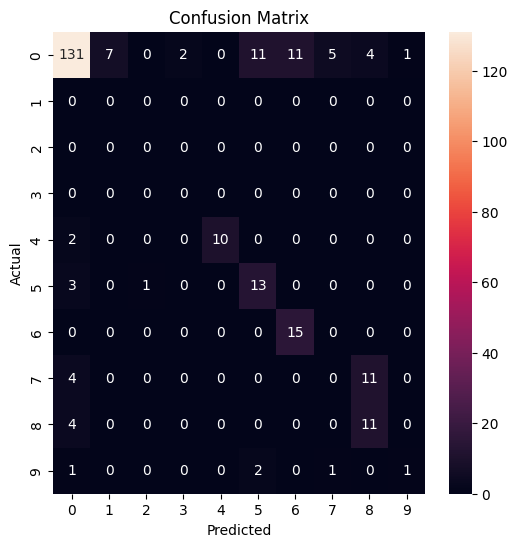

Epoch 35/50 ---> Train Accuracy: 96.41995055983713%, Validation Accuracy: 59.05882352941177%
Epoch 35/50 runtime: 0.5876461545626323 minutes


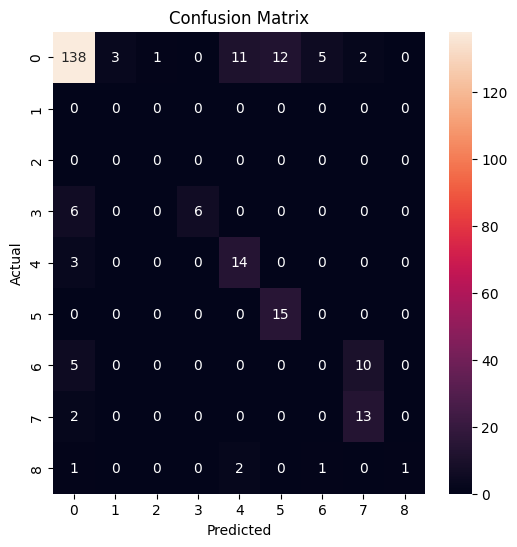

Epoch 36/50 ---> Train Accuracy: 96.60026174203868%, Validation Accuracy: 60.78431372549019%
Epoch 36/50 runtime: 0.5434366663297018 minutes


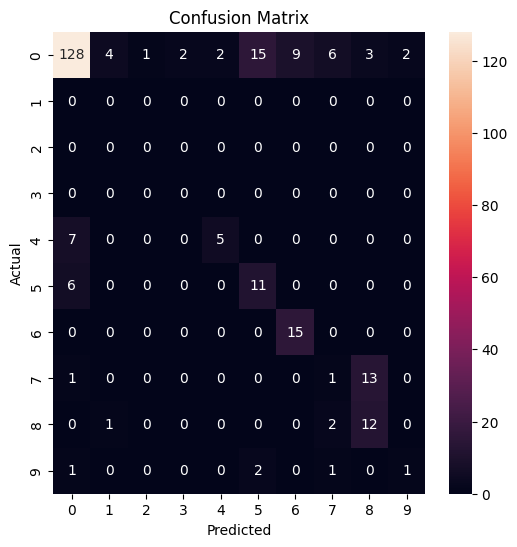

Epoch 37/50 ---> Train Accuracy: 96.23382288788716%, Validation Accuracy: 54.8235294117647%
Epoch 37/50 runtime: 0.535820742448171 minutes


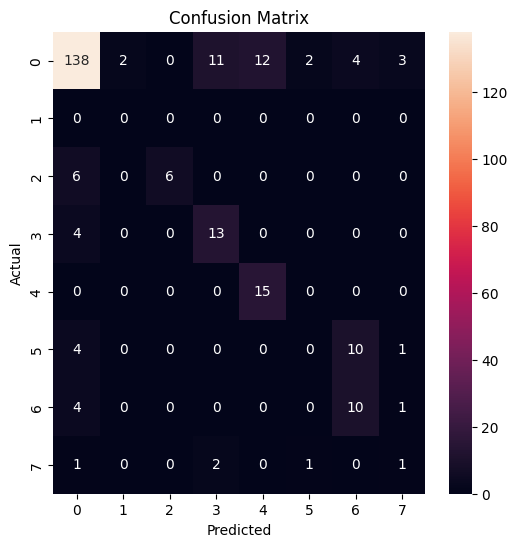

Epoch 38/50 ---> Train Accuracy: 96.3181619892395%, Validation Accuracy: 62.27450980392157%
Epoch 38/50 runtime: 0.5381684899330139 minutes


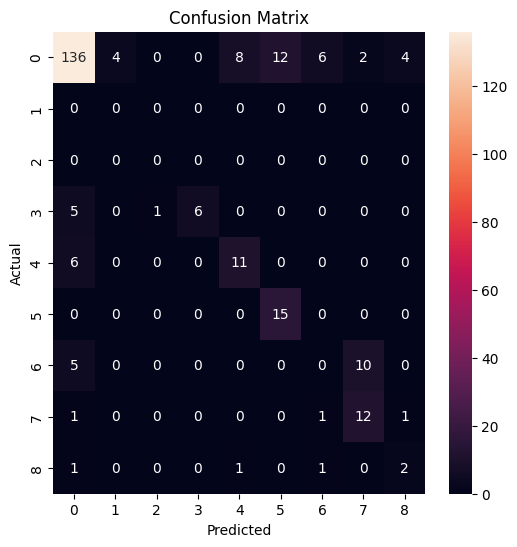

Epoch 39/50 ---> Train Accuracy: 96.46939072269885%, Validation Accuracy: 60.07843137254902%
Epoch 39/50 runtime: 0.5353304545084635 minutes


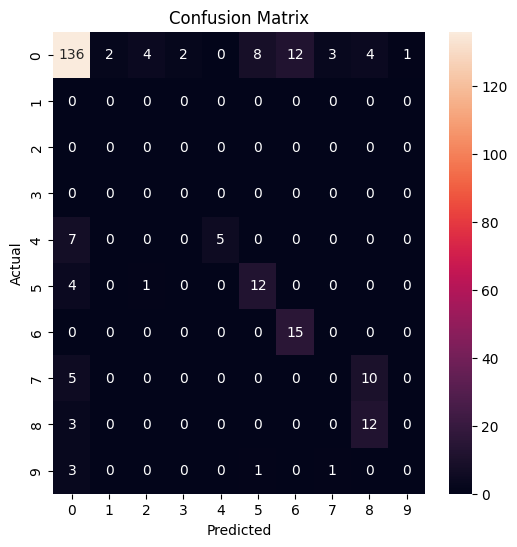

Epoch 40/50 ---> Train Accuracy: 96.28326305074887%, Validation Accuracy: 61.09803921568628%
Epoch 40/50 runtime: 0.5765262802441915 minutes


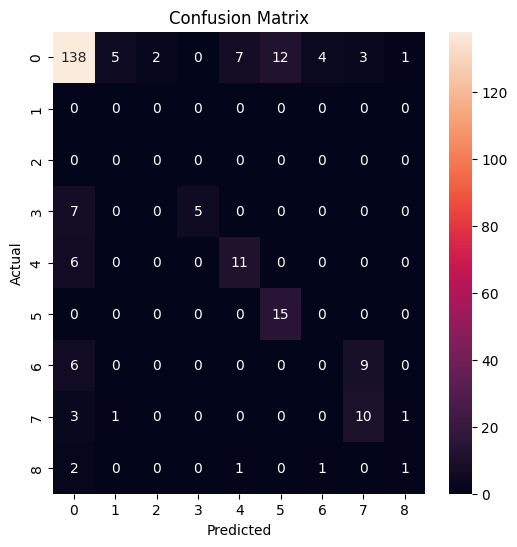

Epoch 41/50 ---> Train Accuracy: 96.40250109059183%, Validation Accuracy: 63.294117647058826%
Epoch 41/50 runtime: 0.5347495516141255 minutes


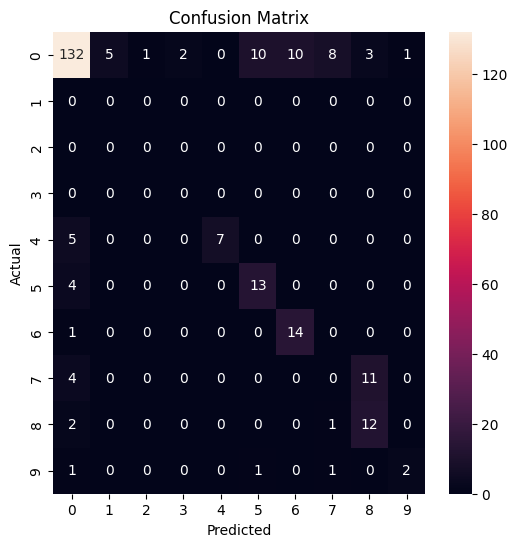

Epoch 42/50 ---> Train Accuracy: 96.61771121128399%, Validation Accuracy: 59.529411764705884%
Epoch 42/50 runtime: 0.5432542006174723 minutes


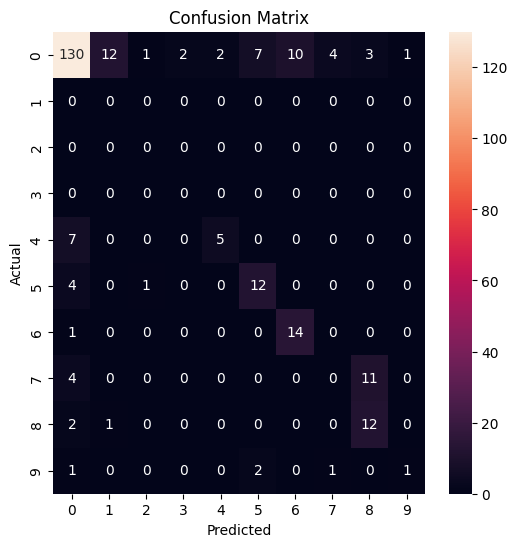

Epoch 43/50 ---> Train Accuracy: 96.4461247637051%, Validation Accuracy: 58.98039215686274%
Epoch 43/50 runtime: 0.5470195055007935 minutes


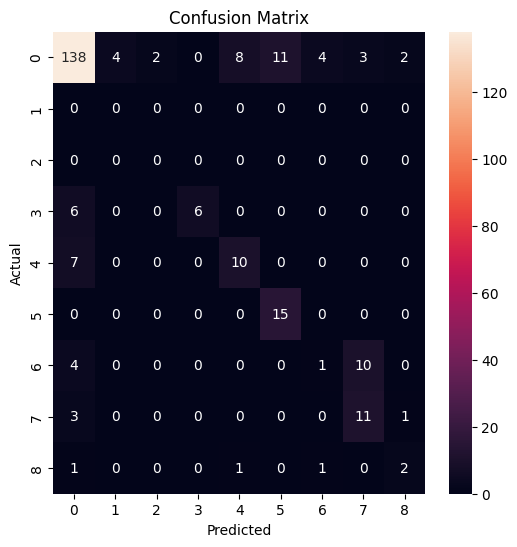

Epoch 44/50 ---> Train Accuracy: 96.5886287625418%, Validation Accuracy: 61.88235294117647%
Epoch 44/50 runtime: 0.5641712307929992 minutes


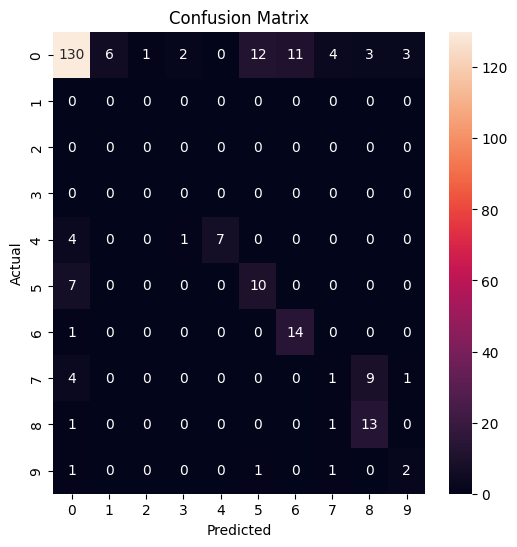

Epoch 45/50 ---> Train Accuracy: 96.61771121128399%, Validation Accuracy: 59.84313725490196%
Epoch 45/50 runtime: 0.8386317610740661 minutes


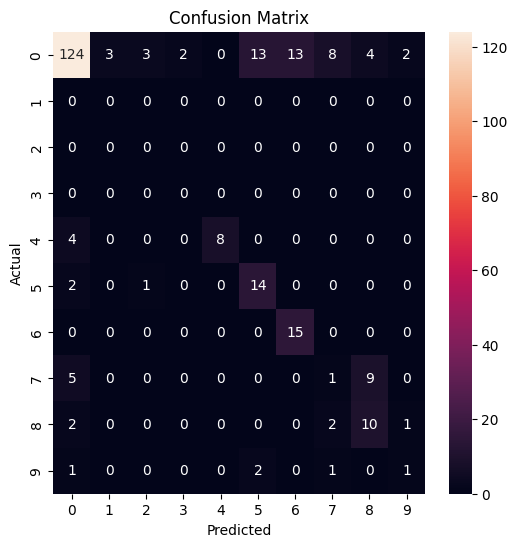

Epoch 46/50 ---> Train Accuracy: 96.33851970335903%, Validation Accuracy: 55.76470588235294%
Epoch 46/50 runtime: 0.8856611490249634 minutes


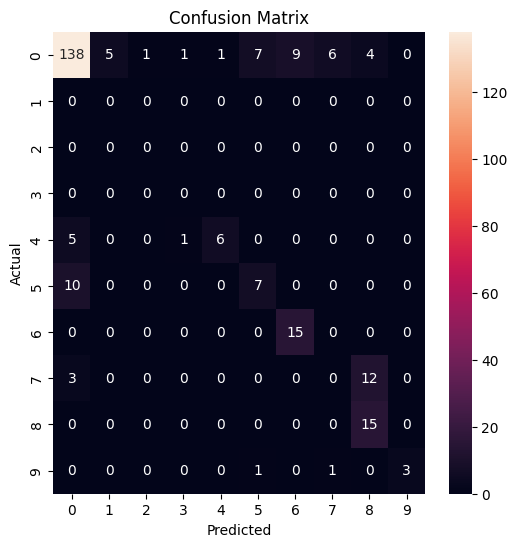

Epoch 47/50 ---> Train Accuracy: 95.65508215791769%, Validation Accuracy: 63.68627450980392%
Epoch 47/50 runtime: 0.6647234837214152 minutes


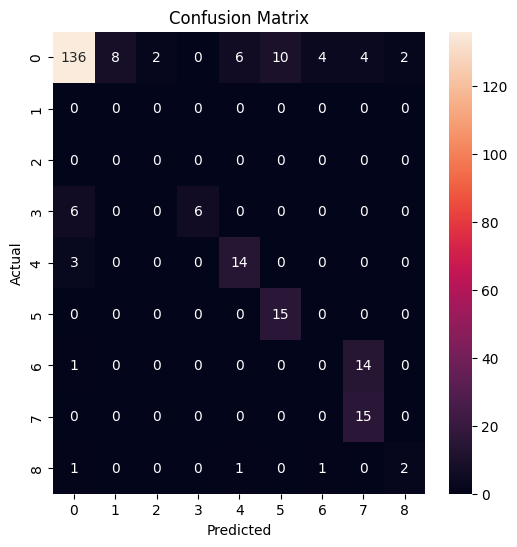

Epoch 48/50 ---> Train Accuracy: 96.55372982405119%, Validation Accuracy: 61.254901960784316%
Epoch 48/50 runtime: 0.5759593566258748 minutes


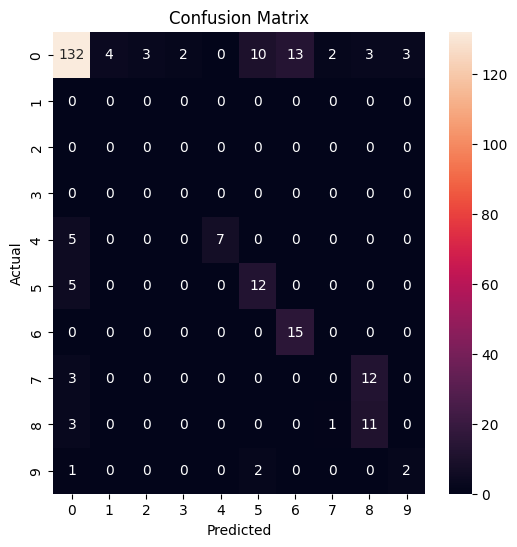

Epoch 49/50 ---> Train Accuracy: 96.68750908826523%, Validation Accuracy: 60.31372549019608%
Epoch 49/50 runtime: 0.5580537716547648 minutes


In [63]:
# Hyperparameters
input_size = X_train.shape[2]
hidden_size = 256  # Number of hidden units in RNN
num_classes = 13  # For classification
epochs = 50
learning_rate = 0.001 #0.01 #
batch_size = 512 #32
landa = 0.001  # Regularization term (lambda)

# Data preparation
train_dataset = TensorDataset(t.tensor(padded_sequences, dtype=t.float32), t.tensor(y_train, dtype=t.long))
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TensorDataset(t.tensor(padded_sequences_test, dtype=t.float32), t.tensor(y_test, dtype=t.long))
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# RNN layers and additional fully connected layer
rnn_layer1 = nn.LSTM(input_size, hidden_size, batch_first=True)
dropout1 = nn.Dropout(0.3)  # Add dropout between RNN layers, changed to 0.3
rnn_layer2 = nn.LSTM(hidden_size, hidden_size, batch_first=True)
dropout2 = nn.Dropout(0.3)  # Add dropout between RNN layers
fc_layer1 = nn.Linear(hidden_size, hidden_size)  # Additional fully connected layer
fc_layer2 = nn.Linear(hidden_size, num_classes)  # Final output layer

# Dropout layer
dropout_fc = nn.Dropout(0.3)  # Add dropout between fully connected layers

# Activation function
relu = nn.ReLU()

# Loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)
#optimizer = Adam(list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)

# Lists to store accuracies and losses
train_accuracy_list = []
validation_accuracy_list = []
train_loss_list = []

class_report_list = []
conf_matrix_list = []

# To be used inside t.no_grad()
loss_list_train = []
loss_list_val = []

# Training loop
for epoch in range(epochs):

    st = time.time()

    if epoch % 10 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []

    for X, Y in train_data_loader:
        # Forward pass through layers
        out, _ = rnn_layer1(X)
        out = dropout1(out)  # Apply dropout between RNN layers
        out, _ = rnn_layer2(out)
        out = dropout2(out)  # Apply dropout between RNN layers
        out = out[:, -1, :]  # Get the last output of the sequence
        out = relu(fc_layer1(out))  # Apply activation function after first fully connected layer
        out = dropout_fc(out)  # Apply dropout between fully connected layers
        out = fc_layer2(out)

        # Regularization
        l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
        loss = loss_fn(out, Y) + landa * l2_term
        #loss = loss_fn(out, Y)

        per_epoch_loss_list.append(loss.item())

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluation on training and validation data
    rnn_layer1.eval()
    # rnn_layer2.eval()
    fc_layer1.eval()
    fc_layer2.eval()

    with t.no_grad():
        # Training data
        train_correct, train_total = 0, 0
        for X, Y in train_data_loader:
            out, _ = rnn_layer1(X)
            out = dropout1(out)  # Apply dropout between RNN layers
            out, _ = rnn_layer2(out)
            out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)

            l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
            loss = loss_fn(out, Y) + landa * l2_term
            #loss = loss_fn(out, Y)

            loss_list_train.append(loss.item())

            train_total += Y.size(0)
            train_correct += (predicted == Y).sum().item()
        train_accuracy = 100 * train_correct / train_total

        # Validation data
        validation_correct, validation_total = 0, 0
        for X, Y in test_data_loader:
            out, _ = rnn_layer1(X)
            out = dropout1(out)  # Apply dropout between RNN layers
            out, _ = rnn_layer2(out)
            out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)
            validation_total += Y.size(0)
            validation_correct += (predicted == Y).sum().item()

            # Regularization
            l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
            loss_val = loss_fn(out, Y) + landa * l2_term

            loss_list_val.append(loss_val.item())

            conf_matrix_test, class_report_test=get_scores(Y,predicted)

        plot_cm(conf_matrix_test)

        validation_accuracy = 100 * validation_correct / validation_total

        # Print accuracy for the current epoch
        print(f'Epoch {epoch}/{epochs} ---> Train Accuracy: {train_accuracy}%, Validation Accuracy: {validation_accuracy}%')

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)
        class_report_list.append(class_report_test)
        conf_matrix_list.append(conf_matrix_test)

        et = time.time()

        print(f'Epoch {epoch}/{epochs} runtime:', str((et - st)/60), 'minutes')

    # Calculate and append the average loss for the epoch
    train_loss_list.append(sum(per_epoch_loss_list) / len(per_epoch_loss_list))

    # Set the model back to train mode
    rnn_layer1.train()
    rnn_layer2.train()
    fc_layer1.train()
    fc_layer2.train()


In [35]:
print(f'Train loss: {np.mean(loss_list_train)}')
print(f'Validation loss: {np.mean(loss_list_val)}')

Train loss: 0.4430481663083329
Validation loss: 1.8663570404052734


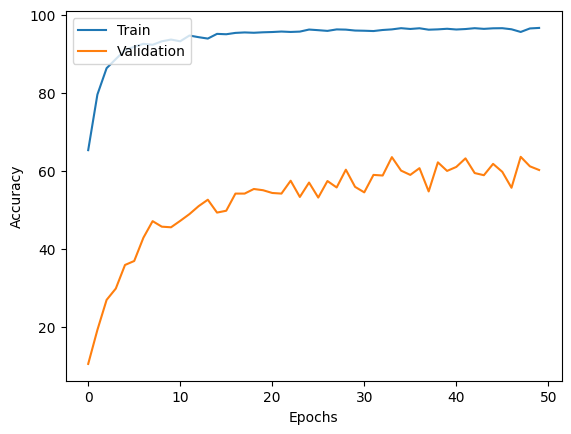

In [64]:
# Plot training and validation accuracy over epochs
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="Train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label="Validation")
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

In [65]:
class_report_list

[{'0': {'precision': 1.0,
   'recall': 0.023255813953488372,
   'f1-score': 0.04545454545454545,
   'support': 172},
  '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '7': {'precision': 0.55,
   'recall': 0.9166666666666666,
   'f1-score': 0.6874999999999999,
   'support': 12},
  '8': {'precision': 0.17777777777777778,
   'recall': 0.47058823529411764,
   'f1-score': 0.25806451612903225,
   'support': 17},
  '9': {'precision': 0.42857142857142855,
   'recall': 1.0,
   'f1-score': 0.6,
   'support': 15},
  '10': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15},
  '11': {'precision': 0.45,
   'recall': 0.6,
   'f1-score': 0.5142857142857143,
   'support': 15},

# <font color='pink' size=6>Unbalanced set</font>

# With L2 + no dropout

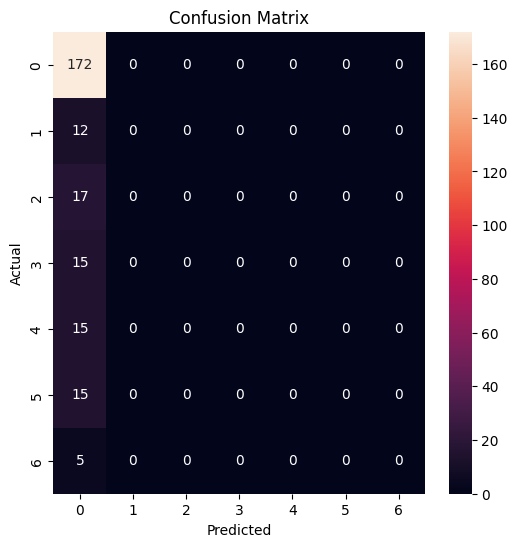

Epoch 0/50 ---> Train Accuracy: 71.91629955947137%, Validation Accuracy: 73.80392156862744%
Epoch 0/50 runtime: 0.04828081130981445 minutes


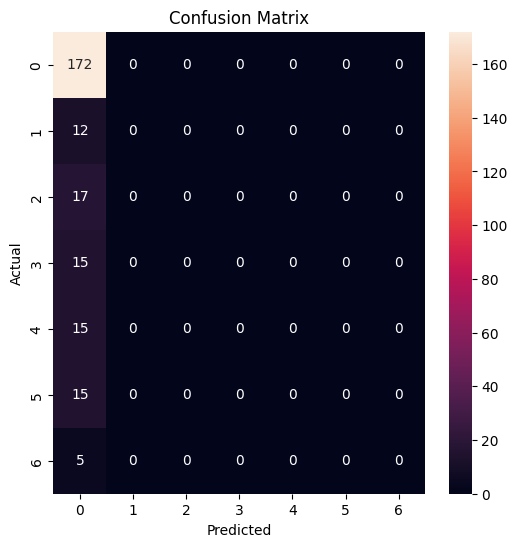

Epoch 1/50 ---> Train Accuracy: 71.91629955947137%, Validation Accuracy: 73.80392156862744%
Epoch 1/50 runtime: 0.06843129396438599 minutes


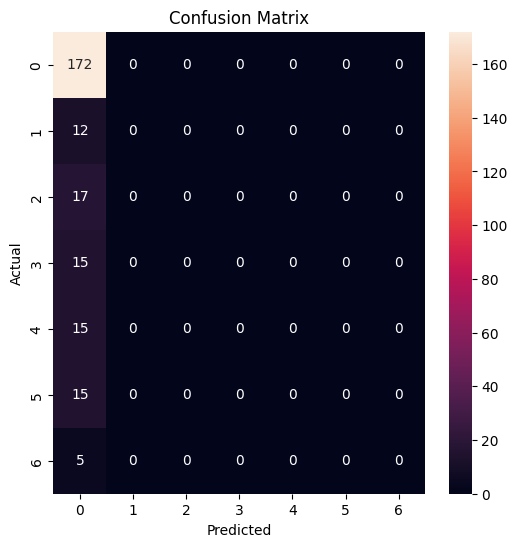

Epoch 2/50 ---> Train Accuracy: 71.91629955947137%, Validation Accuracy: 73.80392156862744%
Epoch 2/50 runtime: 0.04076402982076009 minutes


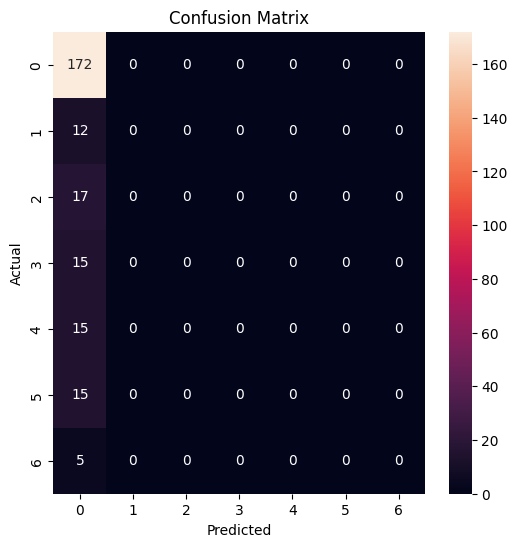

Epoch 3/50 ---> Train Accuracy: 73.10022026431719%, Validation Accuracy: 74.11764705882354%
Epoch 3/50 runtime: 0.04667514165242513 minutes


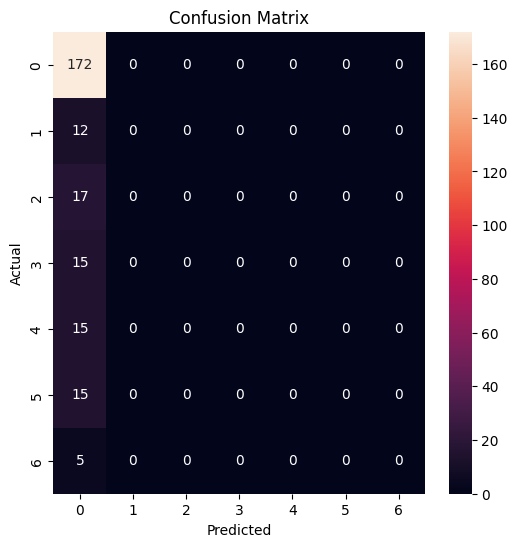

Epoch 4/50 ---> Train Accuracy: 73.23788546255507%, Validation Accuracy: 74.19607843137256%
Epoch 4/50 runtime: 0.03951057990392049 minutes


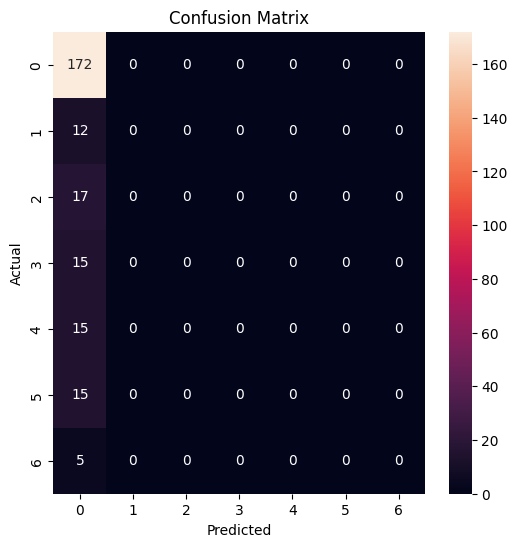

Epoch 5/50 ---> Train Accuracy: 73.15528634361233%, Validation Accuracy: 74.11764705882354%
Epoch 5/50 runtime: 0.03955863316853841 minutes


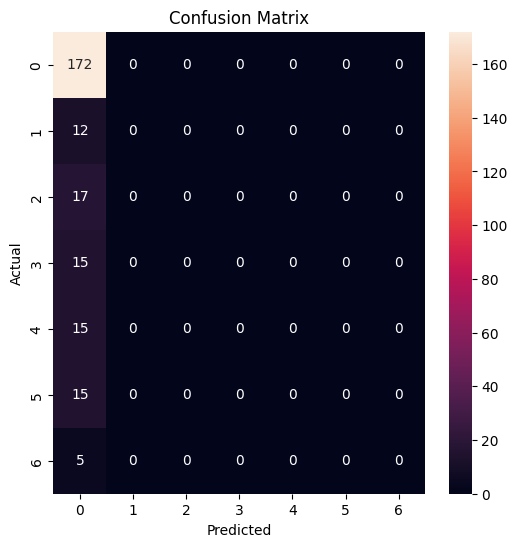

Epoch 6/50 ---> Train Accuracy: 73.54074889867842%, Validation Accuracy: 74.19607843137256%
Epoch 6/50 runtime: 0.06403706471125285 minutes


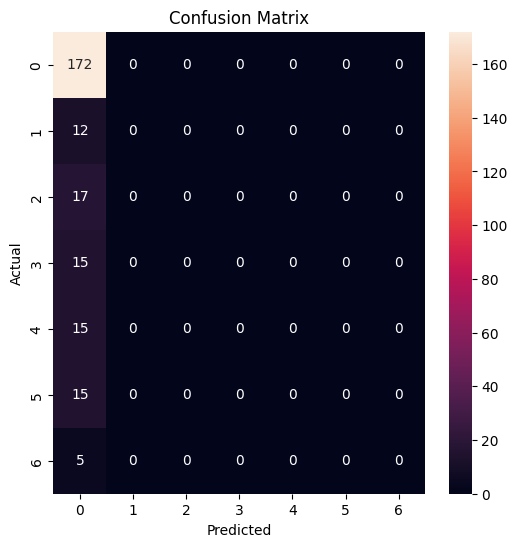

Epoch 7/50 ---> Train Accuracy: 73.51321585903084%, Validation Accuracy: 74.19607843137256%
Epoch 7/50 runtime: 0.05270982583363851 minutes


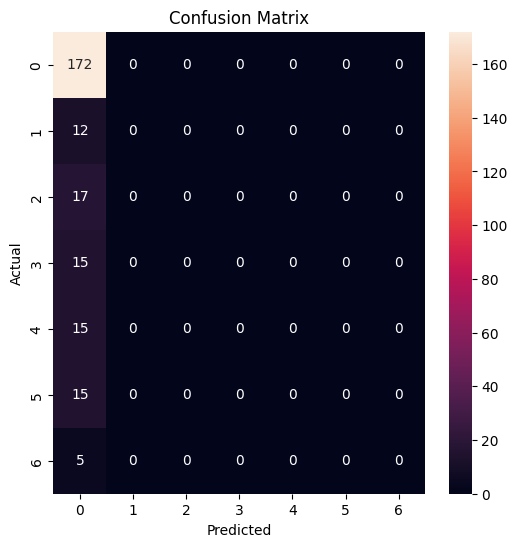

Epoch 8/50 ---> Train Accuracy: 73.51321585903084%, Validation Accuracy: 74.19607843137256%
Epoch 8/50 runtime: 0.03890894651412964 minutes


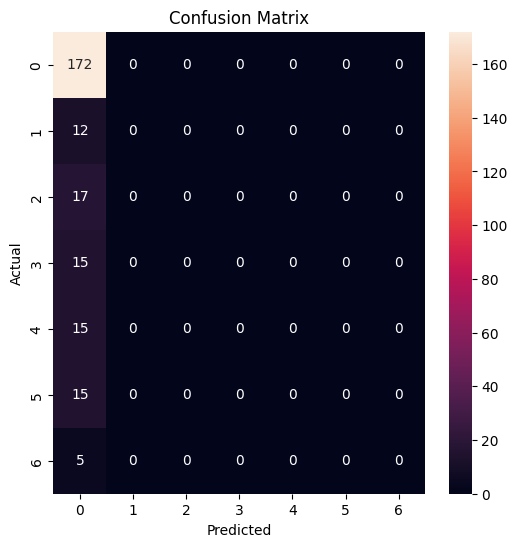

Epoch 9/50 ---> Train Accuracy: 74.09140969162996%, Validation Accuracy: 74.27450980392157%
Epoch 9/50 runtime: 0.04864412546157837 minutes


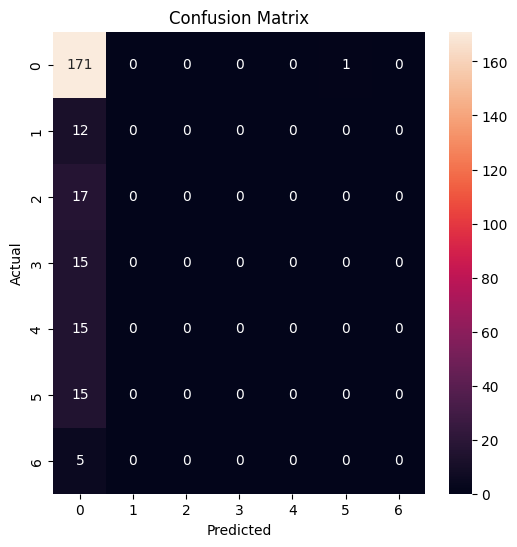

Epoch 10/50 ---> Train Accuracy: 74.14647577092511%, Validation Accuracy: 74.50980392156863%
Epoch 10/50 runtime: 0.043468034267425536 minutes


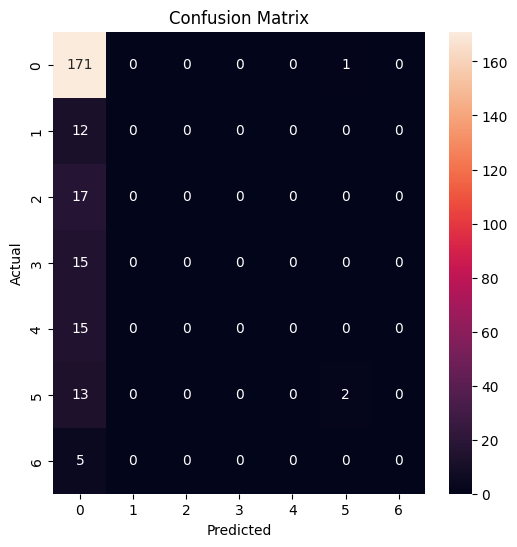

Epoch 11/50 ---> Train Accuracy: 74.66960352422907%, Validation Accuracy: 73.56862745098039%
Epoch 11/50 runtime: 0.0439057985941569 minutes


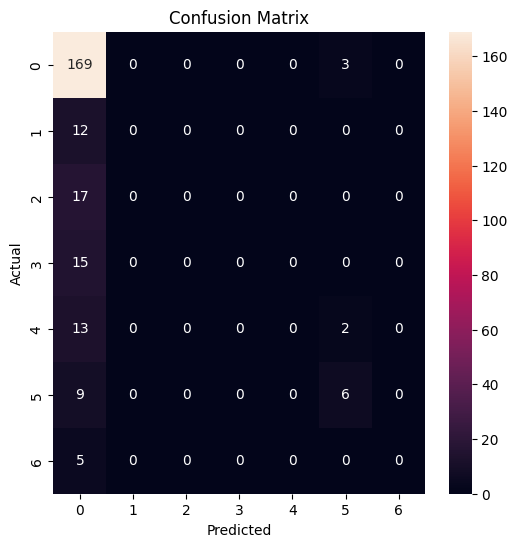

Epoch 12/50 ---> Train Accuracy: 74.91740088105728%, Validation Accuracy: 75.05882352941177%
Epoch 12/50 runtime: 0.04864020744959514 minutes


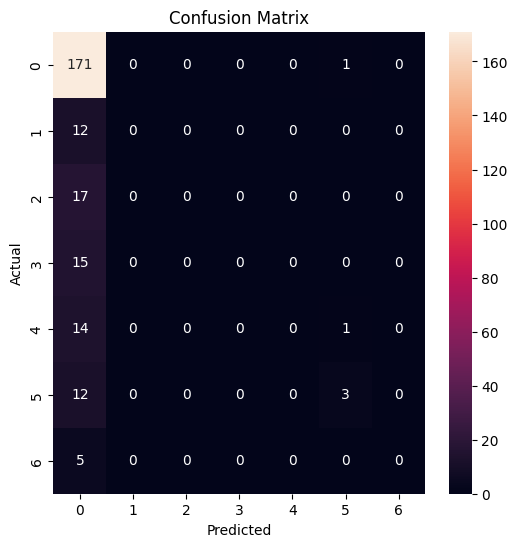

Epoch 13/50 ---> Train Accuracy: 74.6420704845815%, Validation Accuracy: 74.03921568627452%
Epoch 13/50 runtime: 0.03806058168411255 minutes


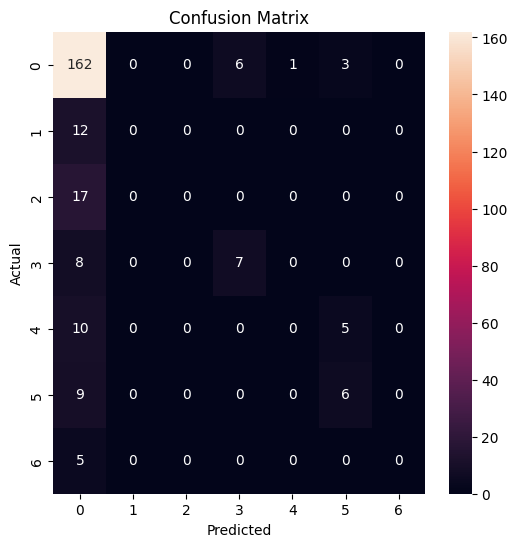

Epoch 14/50 ---> Train Accuracy: 75.74339207048457%, Validation Accuracy: 73.96078431372548%
Epoch 14/50 runtime: 0.040536129474639894 minutes


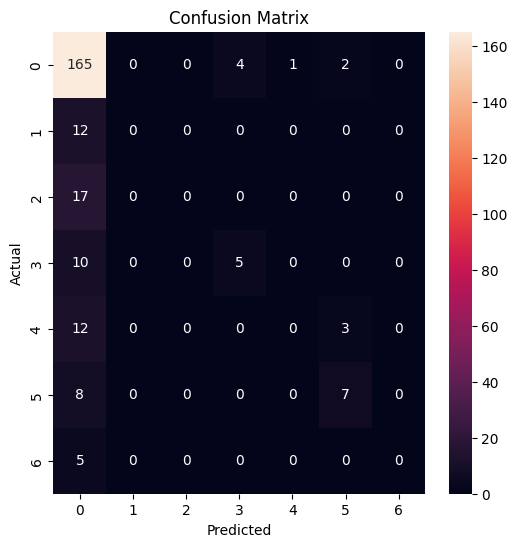

Epoch 15/50 ---> Train Accuracy: 75.33039647577093%, Validation Accuracy: 73.6470588235294%
Epoch 15/50 runtime: 0.06014384428660075 minutes


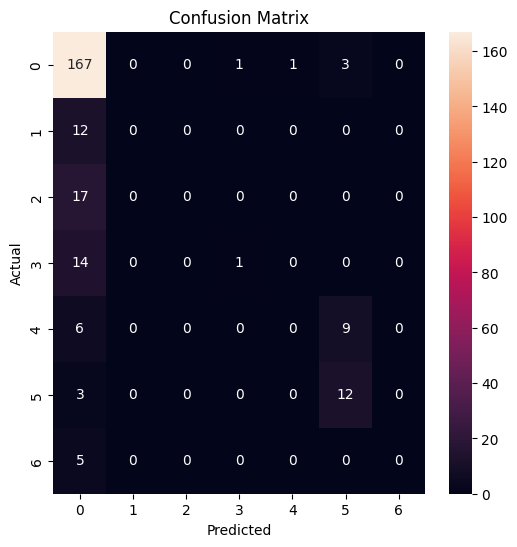

Epoch 16/50 ---> Train Accuracy: 75.79845814977973%, Validation Accuracy: 74.66666666666667%
Epoch 16/50 runtime: 0.07311548391977946 minutes


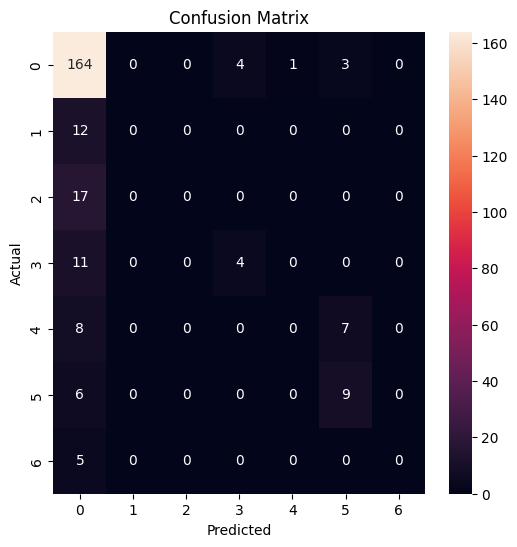

Epoch 17/50 ---> Train Accuracy: 76.10132158590308%, Validation Accuracy: 74.3529411764706%
Epoch 17/50 runtime: 0.046776457627614336 minutes


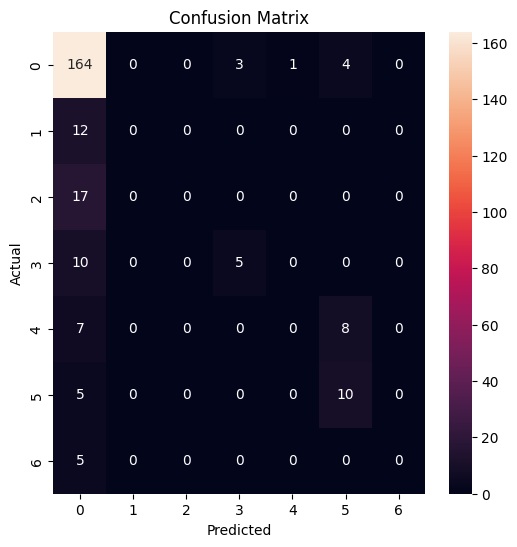

Epoch 18/50 ---> Train Accuracy: 75.88105726872247%, Validation Accuracy: 74.58823529411765%
Epoch 18/50 runtime: 0.03850495417912801 minutes


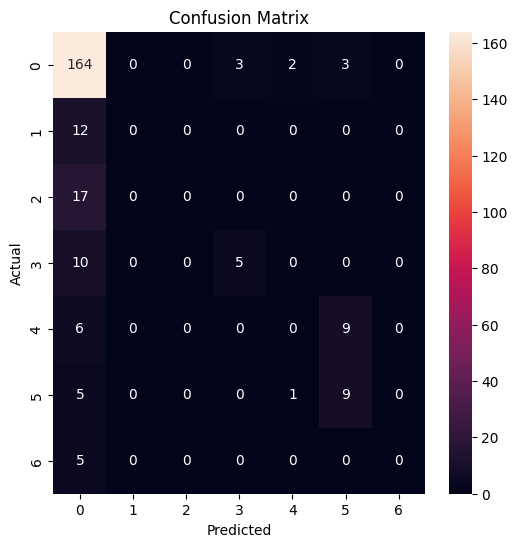

Epoch 19/50 ---> Train Accuracy: 75.93612334801762%, Validation Accuracy: 74.11764705882354%
Epoch 19/50 runtime: 0.039367143313090006 minutes


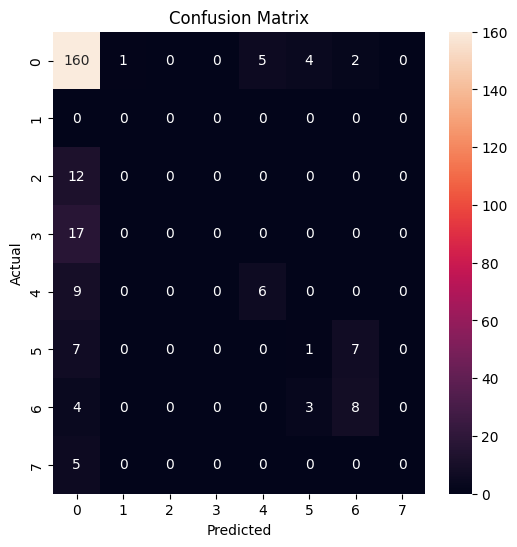

Epoch 20/50 ---> Train Accuracy: 76.51431718061674%, Validation Accuracy: 74.27450980392157%
Epoch 20/50 runtime: 0.040192830562591556 minutes


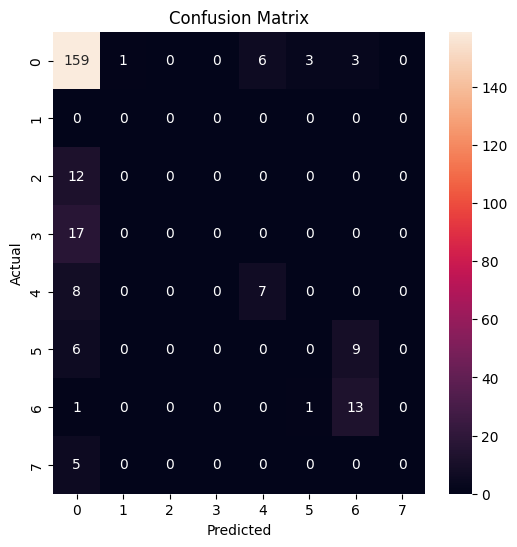

Epoch 21/50 ---> Train Accuracy: 76.81718061674009%, Validation Accuracy: 74.27450980392157%
Epoch 21/50 runtime: 0.07510976791381836 minutes


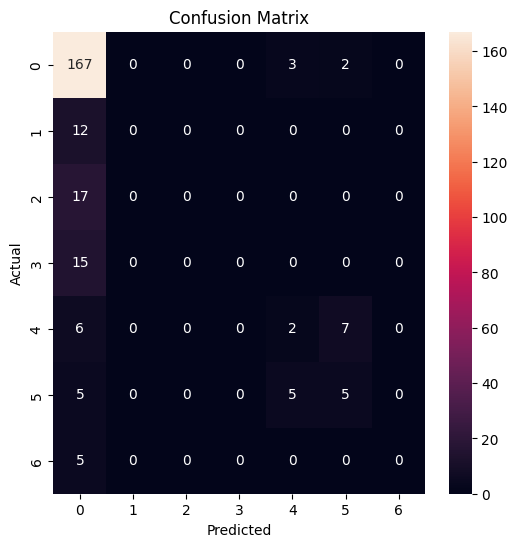

Epoch 22/50 ---> Train Accuracy: 76.15638766519824%, Validation Accuracy: 74.27450980392157%
Epoch 22/50 runtime: 0.05469644467035929 minutes


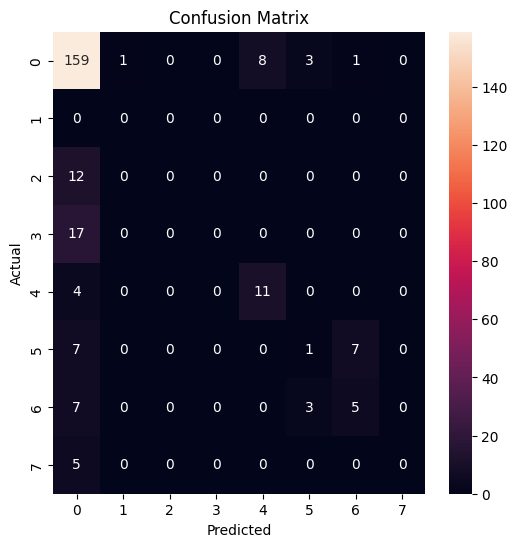

Epoch 23/50 ---> Train Accuracy: 77.23017621145374%, Validation Accuracy: 73.80392156862744%
Epoch 23/50 runtime: 0.04768902858098348 minutes


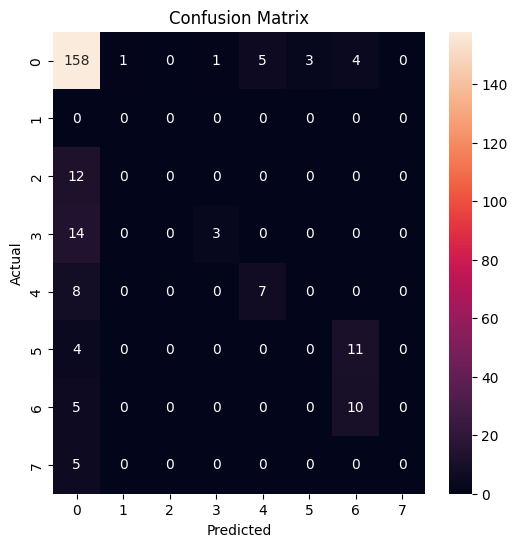

Epoch 24/50 ---> Train Accuracy: 77.06497797356828%, Validation Accuracy: 74.50980392156863%
Epoch 24/50 runtime: 0.04610542853673299 minutes


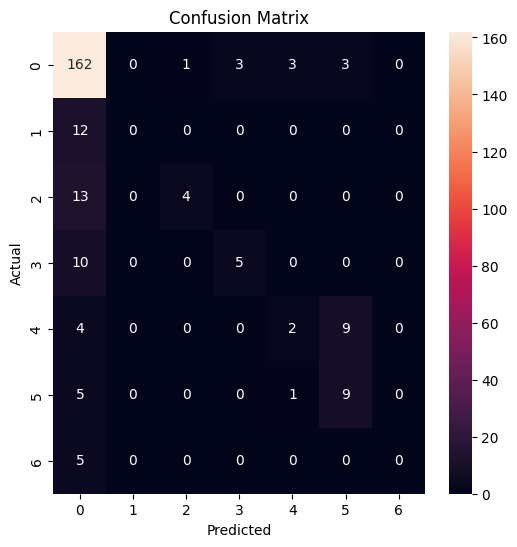

Epoch 25/50 ---> Train Accuracy: 77.09251101321586%, Validation Accuracy: 74.82352941176471%
Epoch 25/50 runtime: 0.07897516886393229 minutes


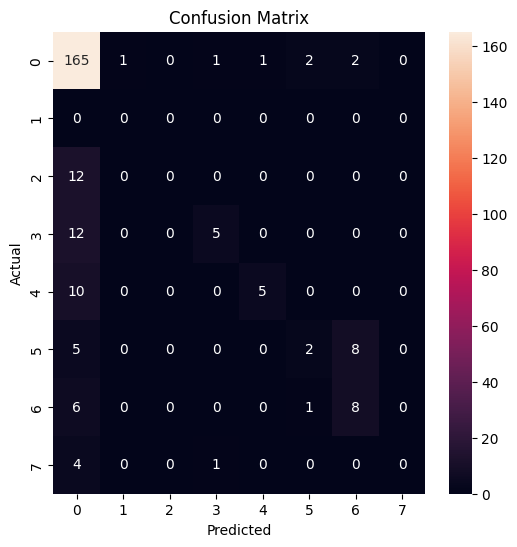

Epoch 26/50 ---> Train Accuracy: 77.36784140969164%, Validation Accuracy: 74.19607843137256%
Epoch 26/50 runtime: 0.0645698626836141 minutes


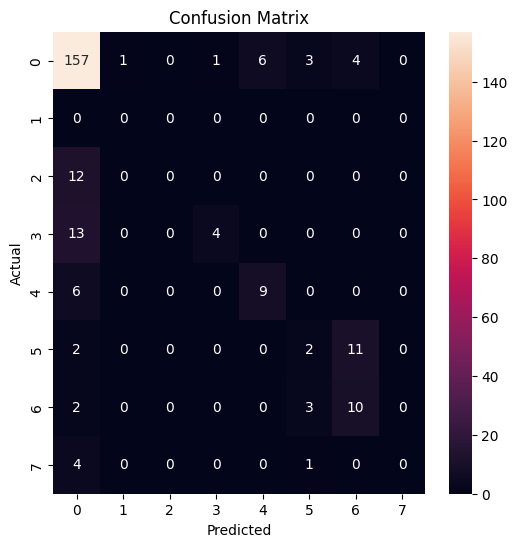

Epoch 27/50 ---> Train Accuracy: 77.97356828193833%, Validation Accuracy: 73.88235294117646%
Epoch 27/50 runtime: 0.040637346108754475 minutes


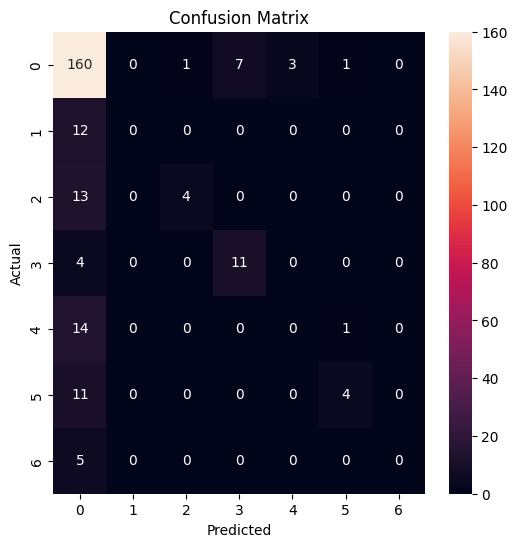

Epoch 28/50 ---> Train Accuracy: 76.62444933920705%, Validation Accuracy: 74.3529411764706%
Epoch 28/50 runtime: 0.03816151221593221 minutes


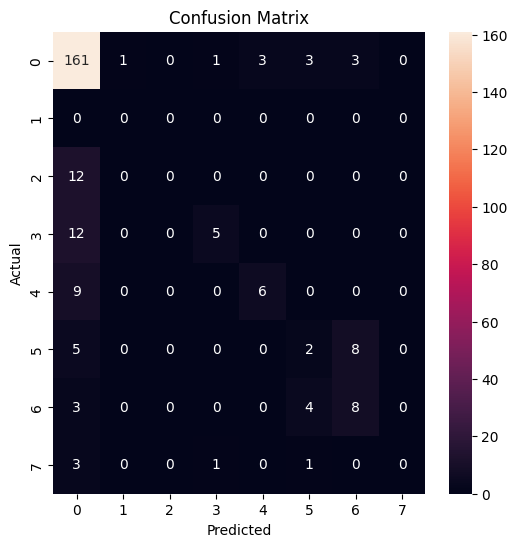

Epoch 29/50 ---> Train Accuracy: 77.61563876651982%, Validation Accuracy: 74.90196078431373%
Epoch 29/50 runtime: 0.06205505132675171 minutes


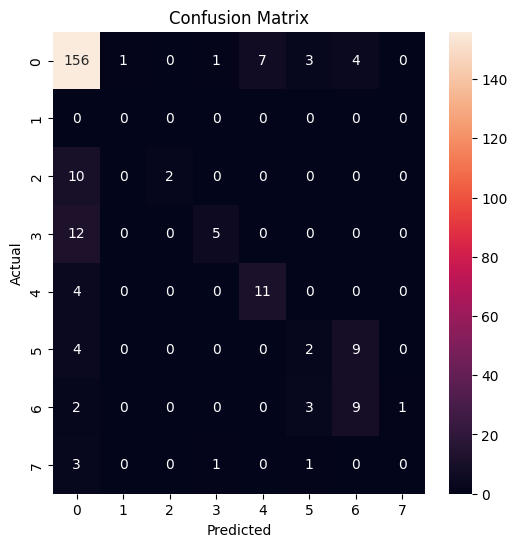

Epoch 30/50 ---> Train Accuracy: 78.57929515418502%, Validation Accuracy: 74.90196078431373%
Epoch 30/50 runtime: 0.06209980646769206 minutes


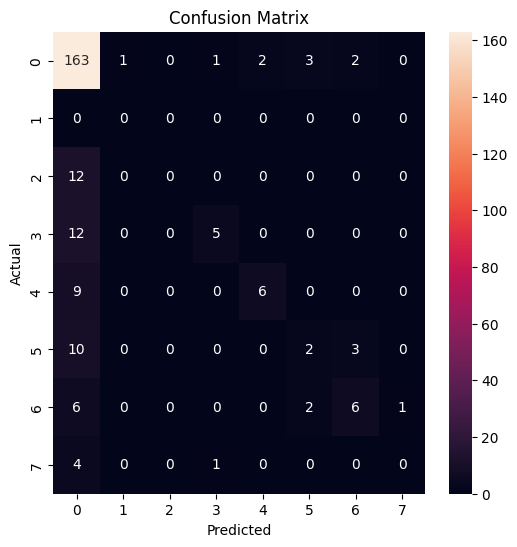

Epoch 31/50 ---> Train Accuracy: 77.94603524229075%, Validation Accuracy: 74.98039215686275%
Epoch 31/50 runtime: 0.050722920894622804 minutes


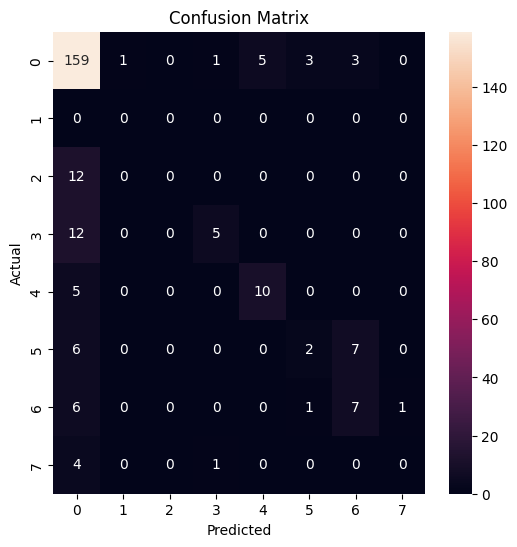

Epoch 32/50 ---> Train Accuracy: 78.0011013215859%, Validation Accuracy: 75.37254901960785%
Epoch 32/50 runtime: 0.04227541287740071 minutes


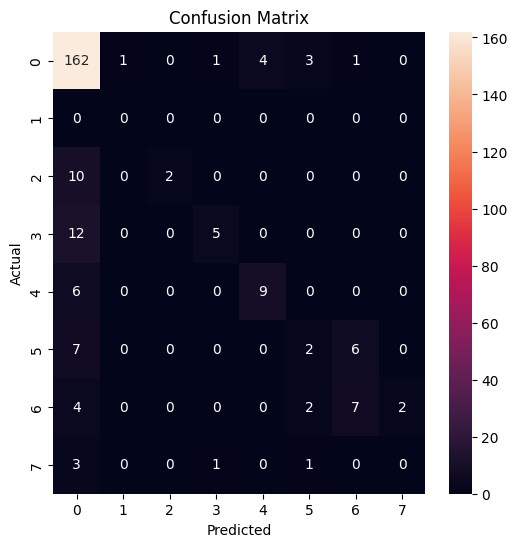

Epoch 33/50 ---> Train Accuracy: 78.08370044052863%, Validation Accuracy: 74.66666666666667%
Epoch 33/50 runtime: 0.05220148960749308 minutes


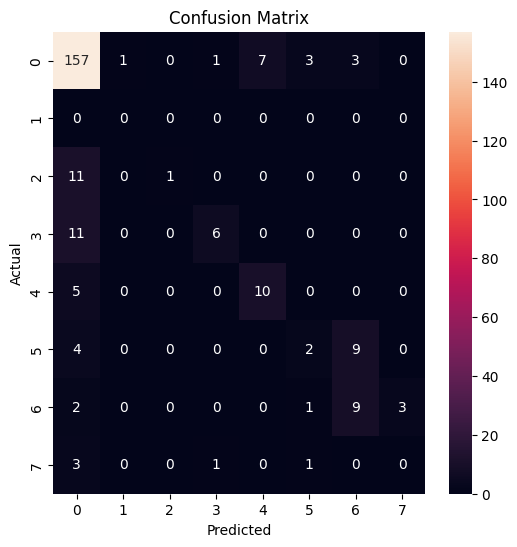

Epoch 34/50 ---> Train Accuracy: 78.6068281938326%, Validation Accuracy: 74.50980392156863%
Epoch 34/50 runtime: 0.040391902128855385 minutes


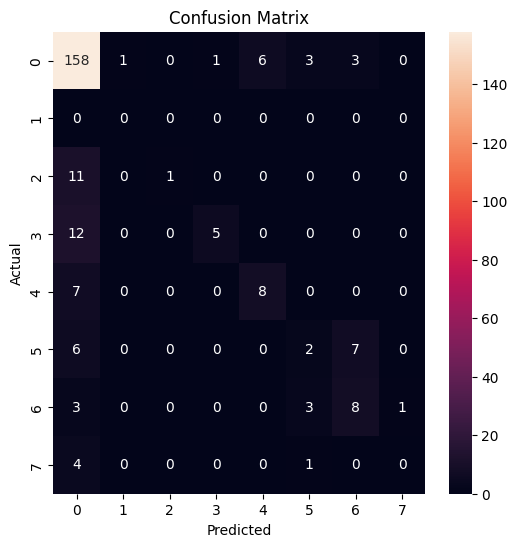

Epoch 35/50 ---> Train Accuracy: 78.82709251101322%, Validation Accuracy: 74.3529411764706%
Epoch 35/50 runtime: 0.06258337100346884 minutes


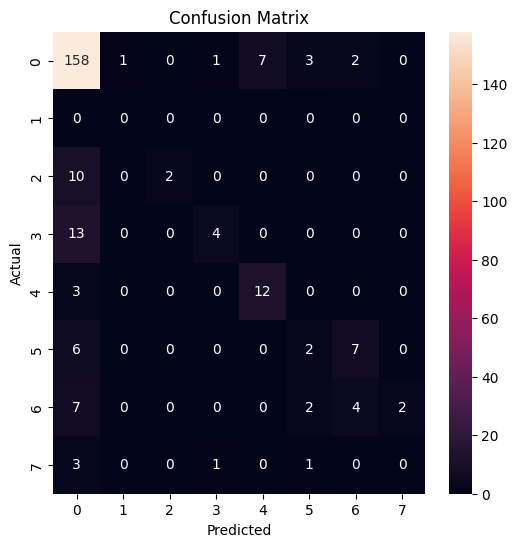

Epoch 36/50 ---> Train Accuracy: 78.66189427312776%, Validation Accuracy: 73.80392156862744%
Epoch 36/50 runtime: 0.0516027291615804 minutes


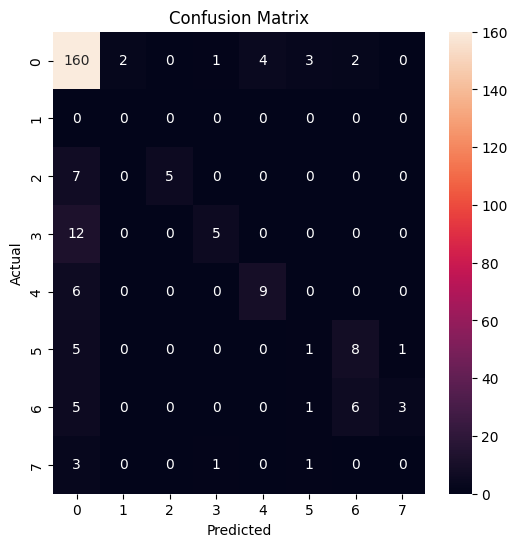

Epoch 37/50 ---> Train Accuracy: 78.77202643171806%, Validation Accuracy: 74.74509803921569%
Epoch 37/50 runtime: 0.041185577710469566 minutes


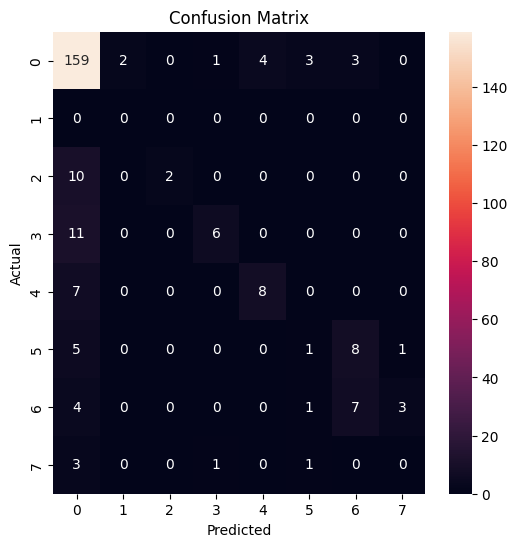

Epoch 38/50 ---> Train Accuracy: 79.37775330396475%, Validation Accuracy: 74.27450980392157%
Epoch 38/50 runtime: 0.039053682486216226 minutes


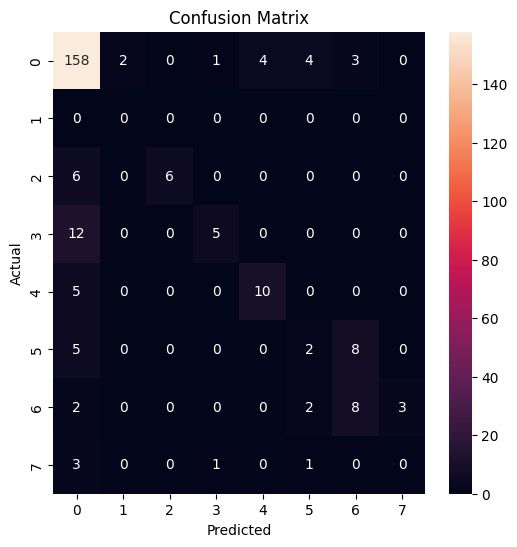

Epoch 39/50 ---> Train Accuracy: 79.48788546255507%, Validation Accuracy: 74.90196078431373%
Epoch 39/50 runtime: 0.0387184739112854 minutes


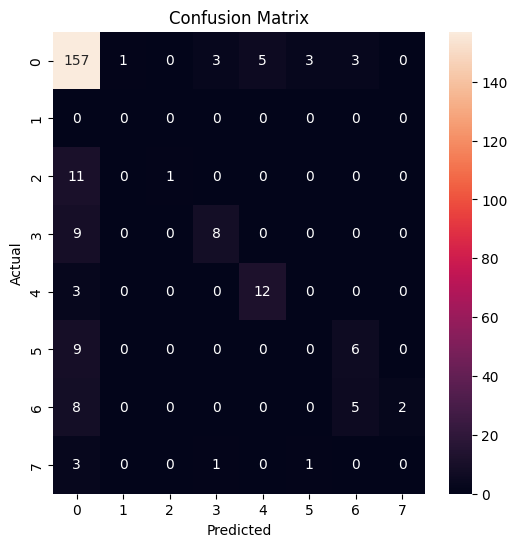

Epoch 40/50 ---> Train Accuracy: 80.12114537444934%, Validation Accuracy: 73.56862745098039%
Epoch 40/50 runtime: 0.04429295063018799 minutes


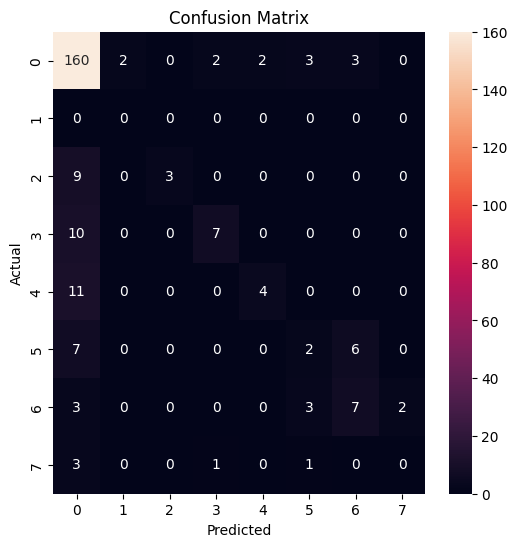

Epoch 41/50 ---> Train Accuracy: 79.48788546255507%, Validation Accuracy: 74.43137254901961%
Epoch 41/50 runtime: 0.06469642321268718 minutes


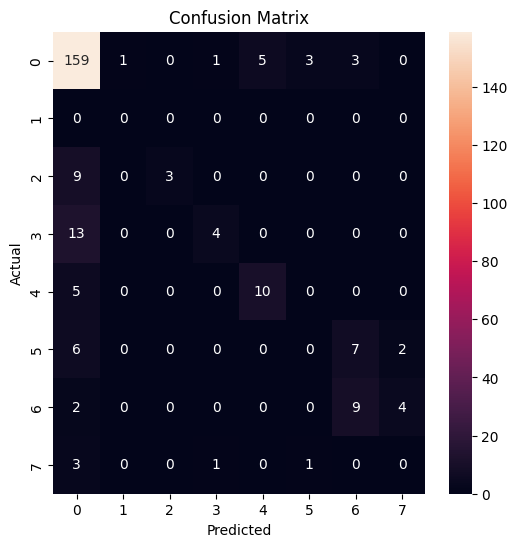

Epoch 42/50 ---> Train Accuracy: 79.51541850220265%, Validation Accuracy: 74.50980392156863%
Epoch 42/50 runtime: 0.038662453492482506 minutes


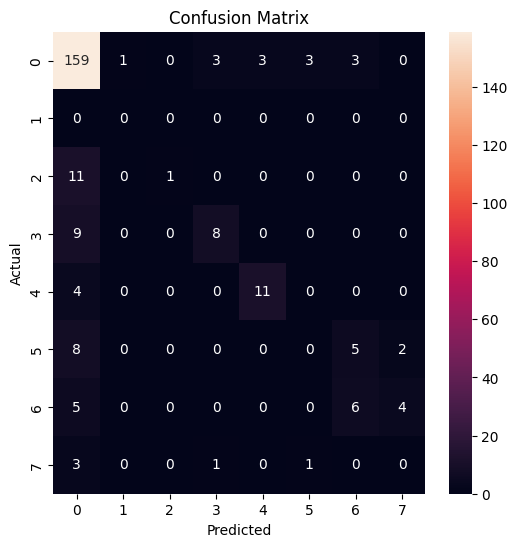

Epoch 43/50 ---> Train Accuracy: 79.84581497797357%, Validation Accuracy: 74.43137254901961%
Epoch 43/50 runtime: 0.04746335744857788 minutes


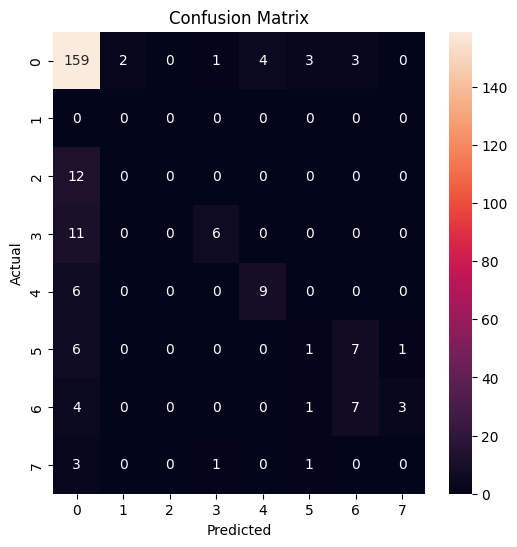

Epoch 44/50 ---> Train Accuracy: 79.5704845814978%, Validation Accuracy: 74.11764705882354%
Epoch 44/50 runtime: 0.039558847745259605 minutes


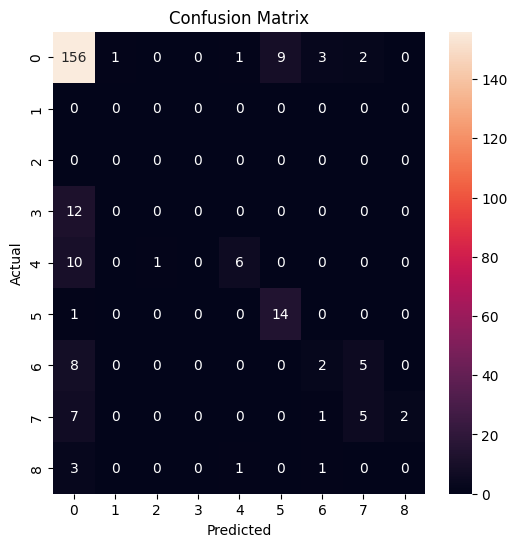

Epoch 45/50 ---> Train Accuracy: 79.9284140969163%, Validation Accuracy: 74.11764705882354%
Epoch 45/50 runtime: 0.03874005476633708 minutes


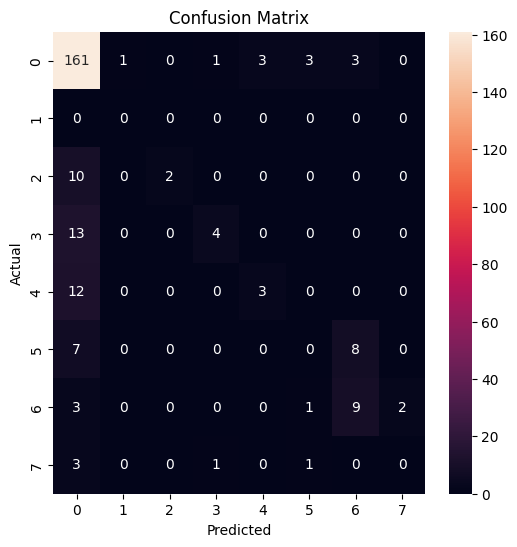

Epoch 46/50 ---> Train Accuracy: 78.77202643171806%, Validation Accuracy: 73.88235294117646%
Epoch 46/50 runtime: 0.06831399997075399 minutes


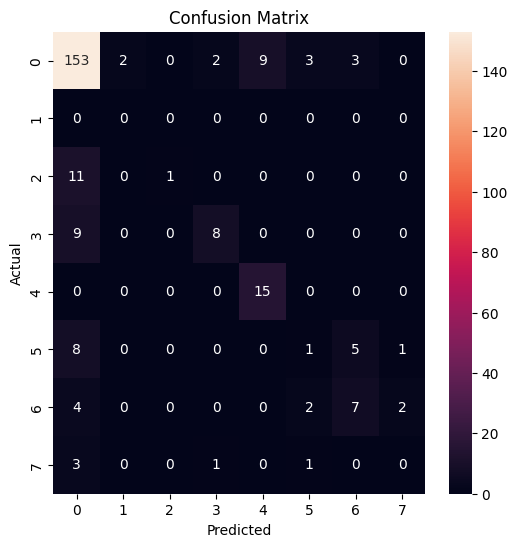

Epoch 47/50 ---> Train Accuracy: 80.2863436123348%, Validation Accuracy: 73.6470588235294%
Epoch 47/50 runtime: 0.0433089812596639 minutes


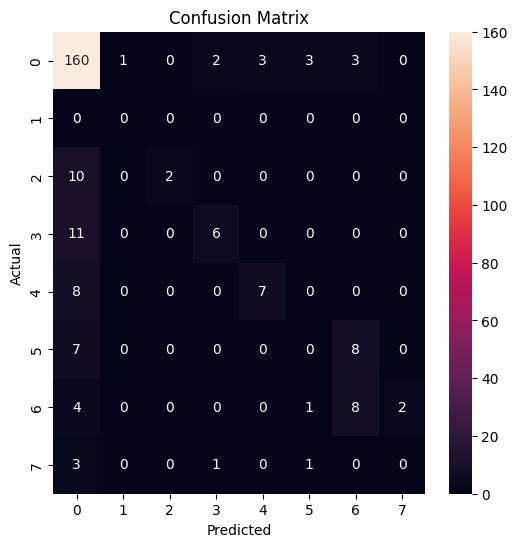

Epoch 48/50 ---> Train Accuracy: 79.98348017621146%, Validation Accuracy: 74.98039215686275%
Epoch 48/50 runtime: 0.03925719261169434 minutes


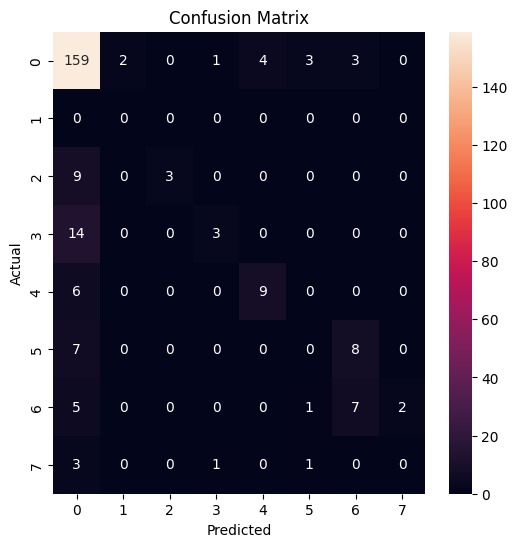

Epoch 49/50 ---> Train Accuracy: 80.2863436123348%, Validation Accuracy: 74.3529411764706%
Epoch 49/50 runtime: 0.03941920200983683 minutes


In [35]:
# Hyperparameters
input_size = X_train_unb.shape[2]
hidden_size = 256  # Number of hidden units in RNN
num_classes = 13  # For classification
epochs = 50
learning_rate = 0.001 #0.01 #
batch_size = 512 #32
landa = 0.001  # Regularization term (lambda)


# Data preparation
train_dataset = TensorDataset(t.tensor(padded_sequences_unb, dtype=t.float32), t.tensor(y_train_unb, dtype=t.long))
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TensorDataset(t.tensor(padded_sequences_test_unb, dtype=t.float32), t.tensor(y_test_unb, dtype=t.long))
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# RNN layers and additional fully connected layer
rnn_layer1 = nn.LSTM(input_size, hidden_size, batch_first=True)
#dropout1 = nn.Dropout(0.3)  # Add dropout between RNN layers, changed to 0.2
# rnn_layer2 = nn.LSTM(hidden_size, hidden_size, batch_first=True)
# dropout2 = nn.Dropout(0.5)  # Add dropout between RNN layers
fc_layer1 = nn.Linear(hidden_size, hidden_size)  # Additional fully connected layer
fc_layer2 = nn.Linear(hidden_size, num_classes)  # Final output layer

# Dropout layer
#dropout_fc = nn.Dropout(0.3)  # Add dropout between fully connected layers

# Activation function
relu = nn.ReLU()

# Loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
# optimizer = Adam(list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)
optimizer = Adam(list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)

# Lists to store accuracies and losses
train_accuracy_list = []
validation_accuracy_list = []
train_loss_list = []

class_report_list = []
conf_matrix_list = []

# To be used inside t.no_grad()
loss_list_train = []
loss_list_val = []

# Training loop
for epoch in range(epochs):

    st = time.time()

    if epoch % 10 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []
    for X, Y in train_data_loader:
        # Forward pass through layers
        out, _ = rnn_layer1(X)
        #out = dropout1(out)  # Apply dropout between RNN layers
        # out, _ = rnn_layer2(out)
        # out = dropout2(out)  # Apply dropout between RNN layers
        out = out[:, -1, :]  # Get the last output of the sequence
        out = relu(fc_layer1(out))  # Apply activation function after first fully connected layer
        #out = dropout_fc(out)  # Apply dropout between fully connected layers
        out = fc_layer2(out)

        # Regularization
        l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())]) # list(rnn_layer2.parameters()) +
        loss = loss_fn(out, Y) + landa * l2_term
        # loss = loss_fn(out, Y)

        per_epoch_loss_list.append(loss.item())

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluation on training and validation data
    rnn_layer1.eval()
    # rnn_layer2.eval()
    fc_layer1.eval()
    fc_layer2.eval()

    with t.no_grad():
        # Training data
        train_correct, train_total = 0, 0
        for X, Y in train_data_loader:
            out, _ = rnn_layer1(X)
            #out = dropout1(out)  # Apply dropout between RNN layers
            # out, _ = rnn_layer2(out)
            # out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            #out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)

            # Regularization
            l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())]) # list(rnn_layer2.parameters()) +
            loss = loss_fn(out, Y) + landa * l2_term

            loss_list_train.append(loss.item())

            train_total += Y.size(0)
            train_correct += (predicted == Y).sum().item()
        train_accuracy = 100 * train_correct / train_total

        # Validation data
        validation_correct, validation_total = 0, 0
        for X, Y in test_data_loader:
            out, _ = rnn_layer1(X)
            #out = dropout1(out)  # Apply dropout between RNN layers
            # out, _ = rnn_layer2(out)
            # out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            #out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)

            # Regularization
            l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())]) # list(rnn_layer2.parameters()) +
            loss_val = loss_fn(out, Y) + landa * l2_term

            loss_list_val.append(loss_val.item())

            validation_total += Y.size(0)
            validation_correct += (predicted == Y).sum().item()
            #plot_cm(confusion_matrix(Y,predicted))

            conf_matrix_test, class_report_test=get_scores(Y,predicted)

        plot_cm(conf_matrix_test)

        #plot_cm(confusion_matrix(Y,predicted))
        validation_accuracy = 100 * validation_correct / validation_total

        # Print accuracy for the current epoch
        print(f'Epoch {epoch}/{epochs} ---> Train Accuracy: {train_accuracy}%, Validation Accuracy: {validation_accuracy}%')

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)
        class_report_list.append(class_report_test)
        conf_matrix_list.append(conf_matrix_test)

        et = time.time()

        print(f'Epoch {epoch}/{epochs} runtime:', str((et - st)/60), 'minutes')

    # Calculate and append the average loss for the epoch
    train_loss_list.append(sum(per_epoch_loss_list) / len(per_epoch_loss_list))

    # Set the model back to train mode
    rnn_layer1.train()
    # rnn_layer2.train()
    fc_layer1.train()
    fc_layer2.train()


In [26]:
print(f'Train loss: {np.mean(loss_list_train)}')
print(f'Validation loss: {np.mean(loss_list_val)}')

Train loss: 0.9196214480698108
Validation loss: 1.172950351635615


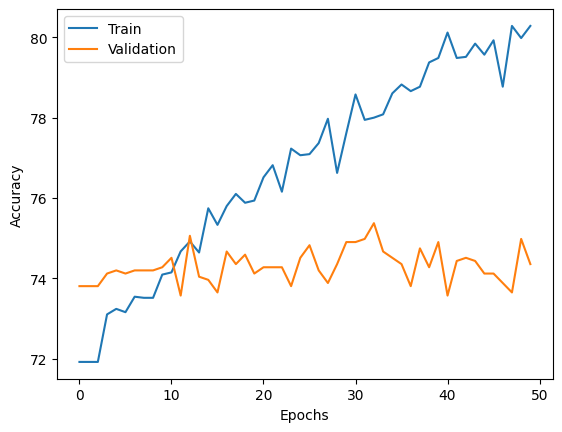

In [36]:
# Plot training and validation accuracy over epochs
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="Train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label="Validation")
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

In [37]:
class_report_list

[{'0': {'precision': 0.6852589641434262,
   'recall': 1.0,
   'f1-score': 0.8132387706855793,
   'support': 172},
  '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 12},
  '8': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 17},
  '9': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15},
  '10': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15},
  '11': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15},
  '12': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 5},
  'accuracy': 0.6852589641434262,
  'macro avg': {'precision': 0.09789413773477518,
   'recall': 0.14285714285714285,
   'f1-score': 0.11617696724079704,
   'support': 251},
  'weighted avg': {'precision': 0.4695798479389216,
   'recall': 0.6852589641434262,
   'f1-score': 0.5572791576012734,
   'support': 251}},
 {'0': {'precision': 0.6852589641434262,
   'recall': 1.0,
   'f1-score': 0.8132387706855793,
   'support': 172},
  '7': {'pr

# With dropout layers

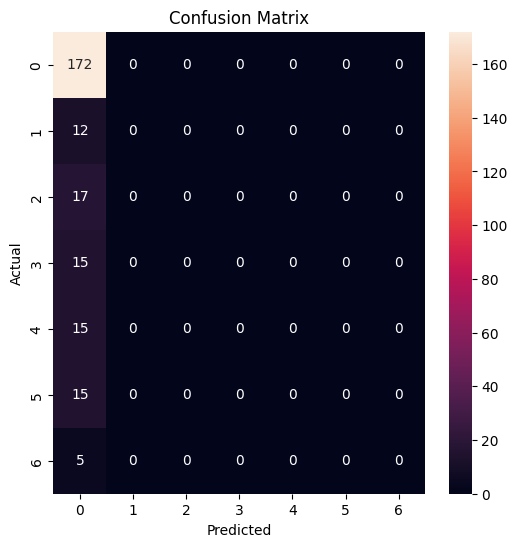

Epoch 0/50 ---> Train Accuracy: 71.91629955947137%, Validation Accuracy: 73.80392156862744%
Epoch 0/50 runtime: 0.06526941061019897 minutes


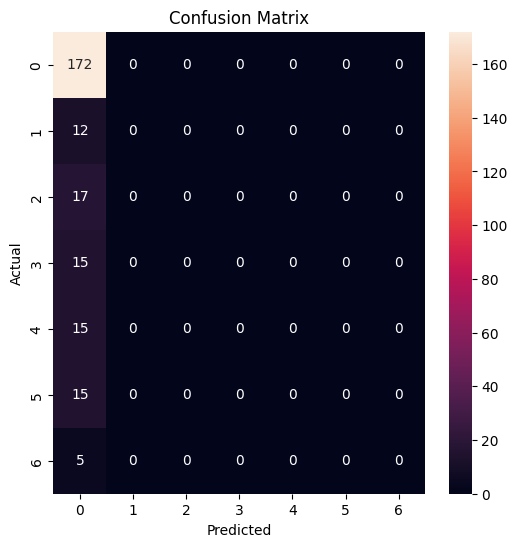

Epoch 1/50 ---> Train Accuracy: 71.91629955947137%, Validation Accuracy: 73.80392156862744%
Epoch 1/50 runtime: 0.04380444288253784 minutes


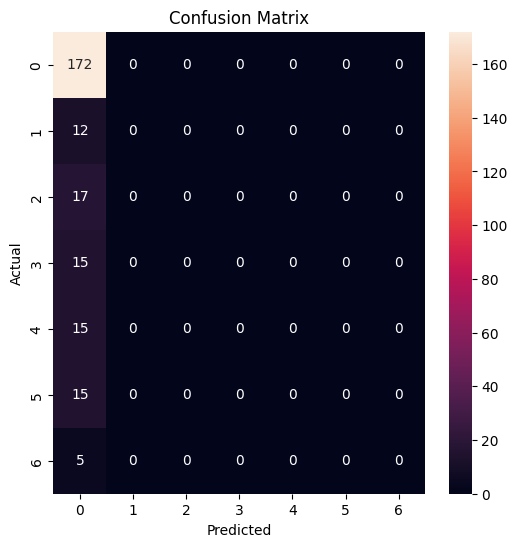

Epoch 2/50 ---> Train Accuracy: 71.91629955947137%, Validation Accuracy: 73.80392156862744%
Epoch 2/50 runtime: 0.04443815549214681 minutes


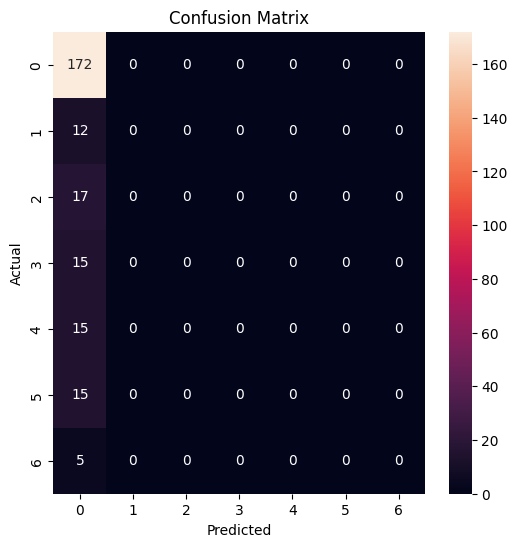

Epoch 3/50 ---> Train Accuracy: 73.12775330396475%, Validation Accuracy: 74.11764705882354%
Epoch 3/50 runtime: 0.07112684647242228 minutes


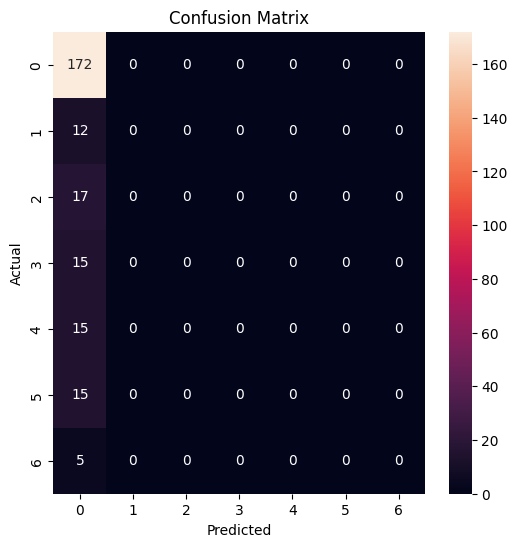

Epoch 4/50 ---> Train Accuracy: 73.26541850220265%, Validation Accuracy: 74.03921568627452%
Epoch 4/50 runtime: 0.039324454466501874 minutes


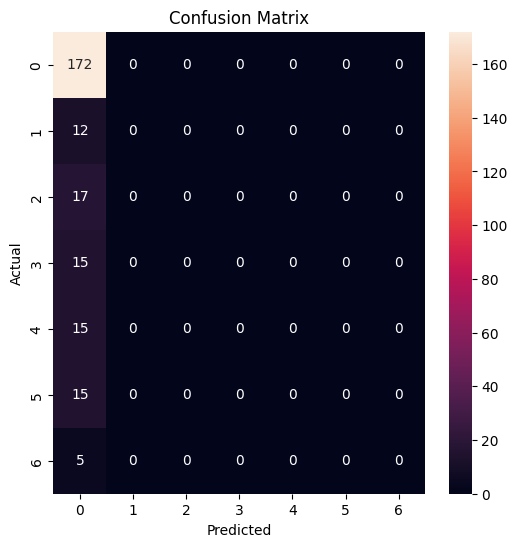

Epoch 5/50 ---> Train Accuracy: 73.3204845814978%, Validation Accuracy: 74.27450980392157%
Epoch 5/50 runtime: 0.04447714487711588 minutes


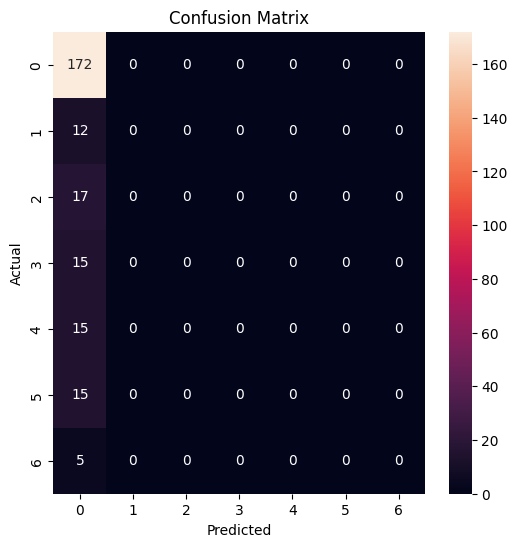

Epoch 6/50 ---> Train Accuracy: 73.12775330396475%, Validation Accuracy: 74.11764705882354%
Epoch 6/50 runtime: 0.04150584141413371 minutes


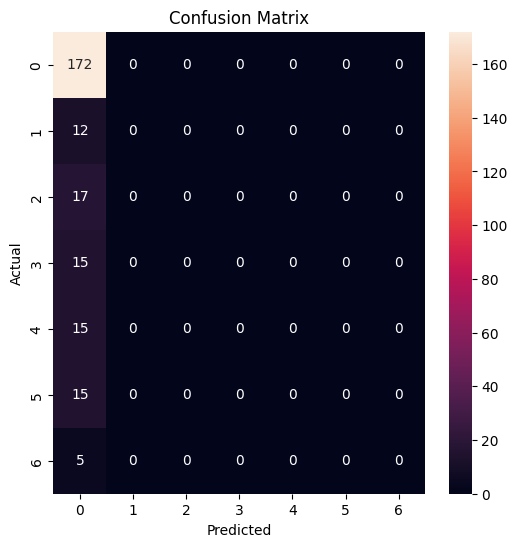

Epoch 7/50 ---> Train Accuracy: 73.62334801762114%, Validation Accuracy: 74.43137254901961%
Epoch 7/50 runtime: 0.03979182243347168 minutes


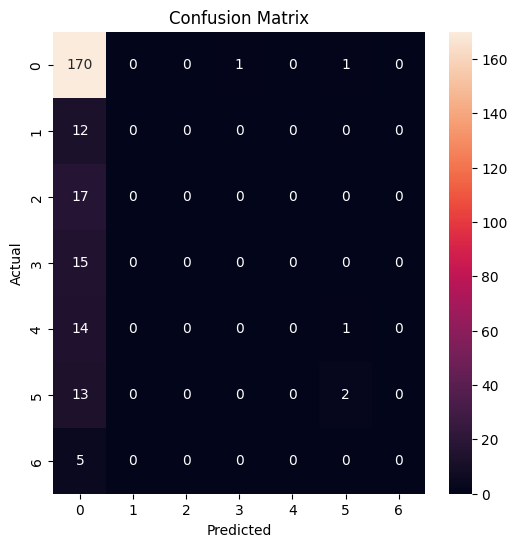

Epoch 8/50 ---> Train Accuracy: 74.36674008810573%, Validation Accuracy: 73.96078431372548%
Epoch 8/50 runtime: 0.09397370417912801 minutes


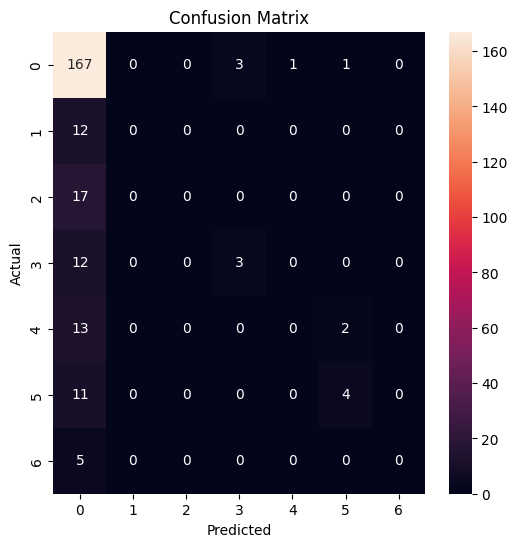

Epoch 9/50 ---> Train Accuracy: 74.42180616740089%, Validation Accuracy: 74.43137254901961%
Epoch 9/50 runtime: 0.08253592252731323 minutes


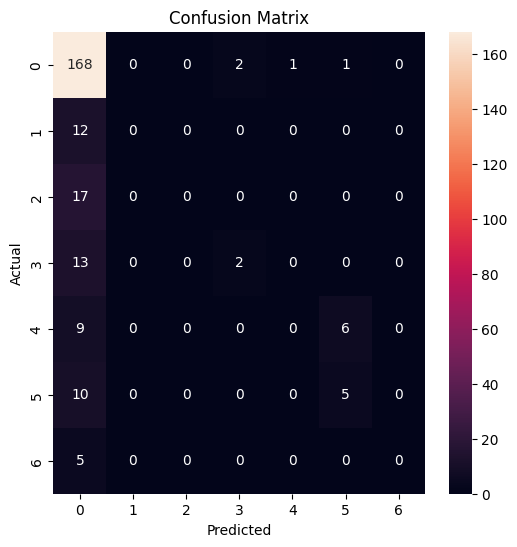

Epoch 10/50 ---> Train Accuracy: 74.91740088105728%, Validation Accuracy: 74.50980392156863%
Epoch 10/50 runtime: 0.04192867676417033 minutes


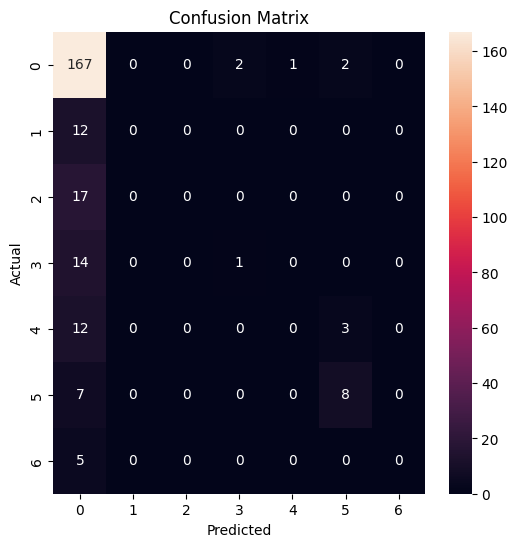

Epoch 11/50 ---> Train Accuracy: 75.02753303964758%, Validation Accuracy: 74.66666666666667%
Epoch 11/50 runtime: 0.046406471729278566 minutes


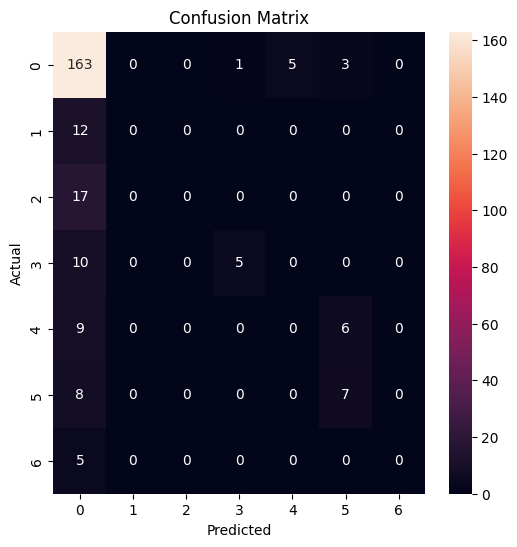

Epoch 12/50 ---> Train Accuracy: 75.02753303964758%, Validation Accuracy: 74.27450980392157%
Epoch 12/50 runtime: 0.08906497955322265 minutes


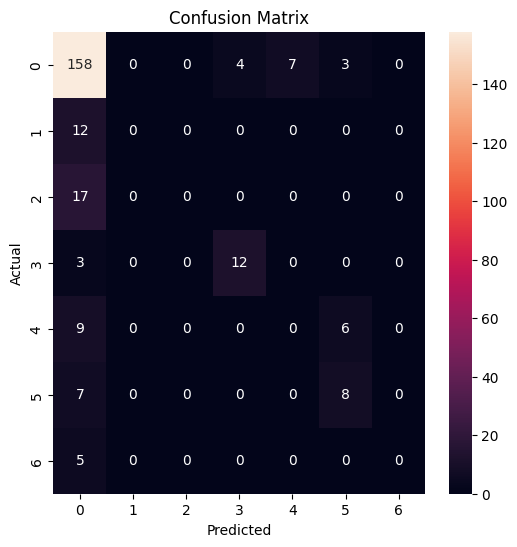

Epoch 13/50 ---> Train Accuracy: 75.66079295154185%, Validation Accuracy: 74.3529411764706%
Epoch 13/50 runtime: 0.06987390915552776 minutes


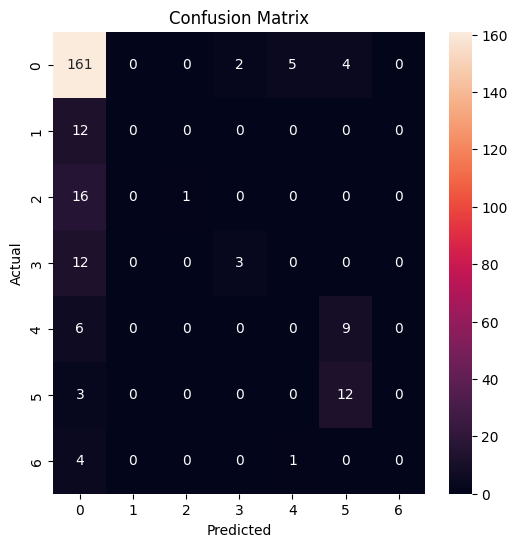

Epoch 14/50 ---> Train Accuracy: 75.68832599118943%, Validation Accuracy: 74.11764705882354%
Epoch 14/50 runtime: 0.07343156735102335 minutes


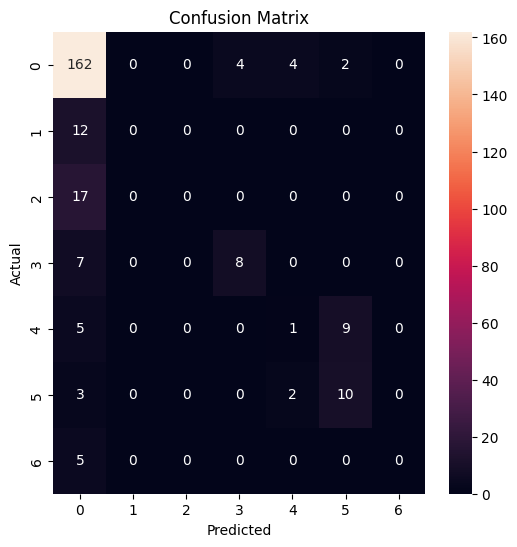

Epoch 15/50 ---> Train Accuracy: 75.79845814977973%, Validation Accuracy: 74.74509803921569%
Epoch 15/50 runtime: 0.07743792136510214 minutes


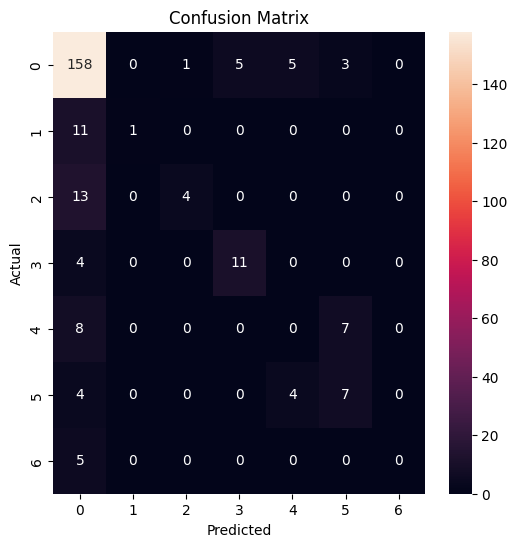

Epoch 16/50 ---> Train Accuracy: 76.15638766519824%, Validation Accuracy: 73.96078431372548%
Epoch 16/50 runtime: 0.04977436065673828 minutes


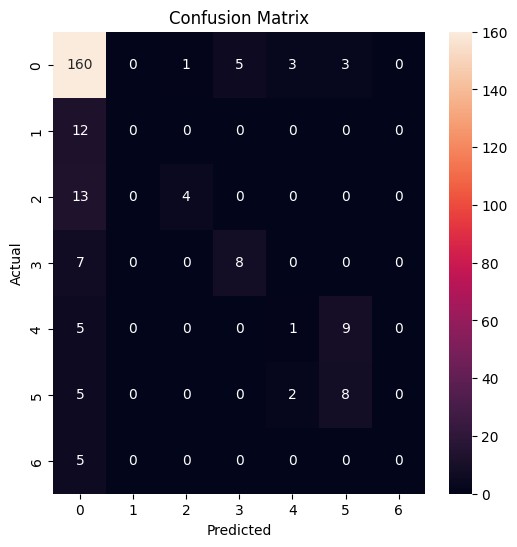

Epoch 17/50 ---> Train Accuracy: 76.01872246696036%, Validation Accuracy: 74.27450980392157%
Epoch 17/50 runtime: 0.05143043597539266 minutes


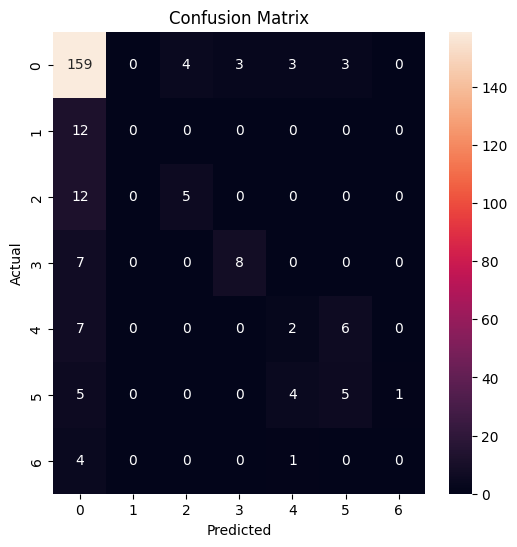

Epoch 18/50 ---> Train Accuracy: 76.62444933920705%, Validation Accuracy: 73.96078431372548%
Epoch 18/50 runtime: 0.040626529852549234 minutes


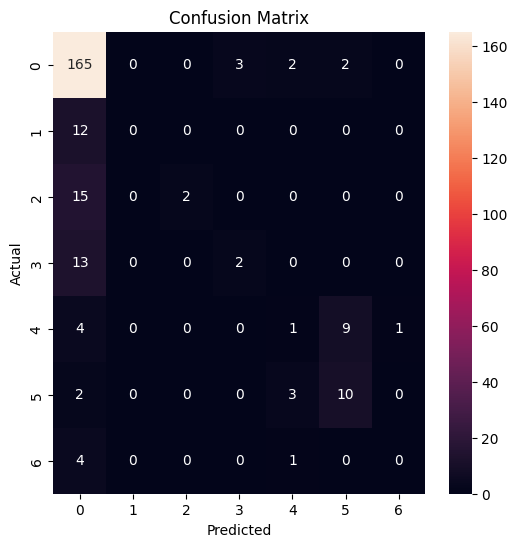

Epoch 19/50 ---> Train Accuracy: 76.62444933920705%, Validation Accuracy: 73.80392156862744%
Epoch 19/50 runtime: 0.06208794116973877 minutes


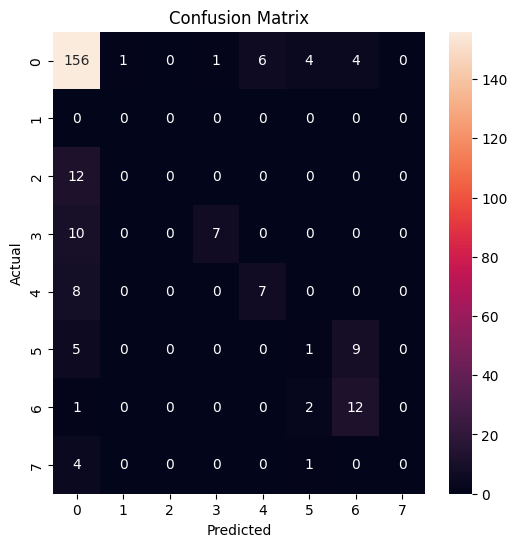

Epoch 20/50 ---> Train Accuracy: 76.92731277533039%, Validation Accuracy: 73.56862745098039%
Epoch 20/50 runtime: 0.08285047610600789 minutes


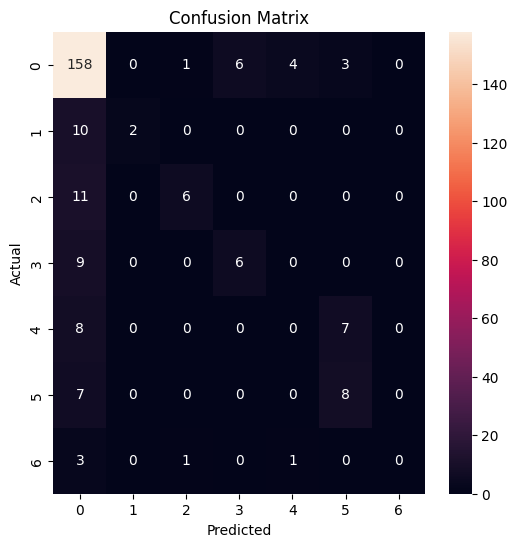

Epoch 21/50 ---> Train Accuracy: 77.34030837004406%, Validation Accuracy: 74.03921568627452%
Epoch 21/50 runtime: 0.040441652139027916 minutes


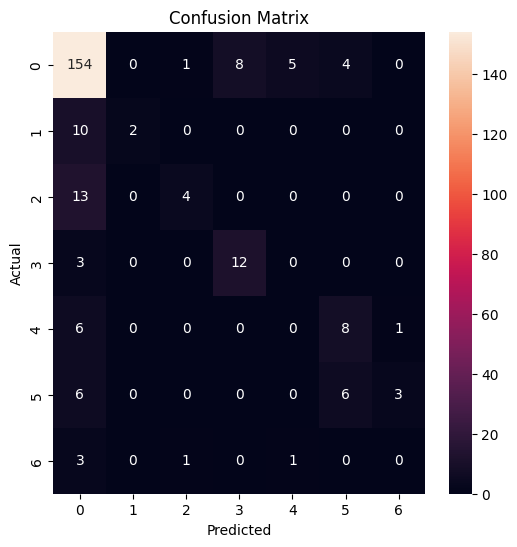

Epoch 22/50 ---> Train Accuracy: 77.67070484581498%, Validation Accuracy: 72.94117647058823%
Epoch 22/50 runtime: 0.03816373348236084 minutes


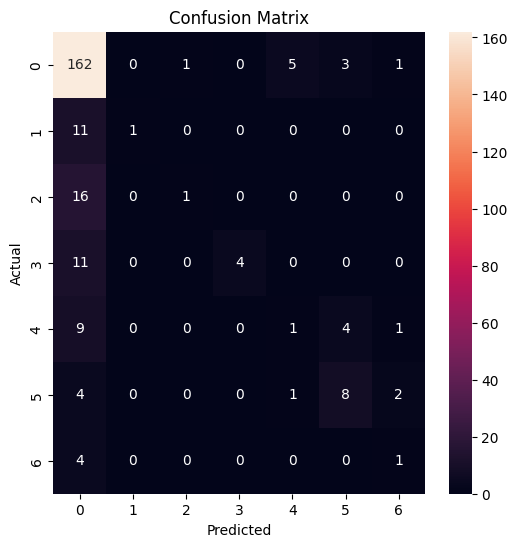

Epoch 23/50 ---> Train Accuracy: 77.5330396475771%, Validation Accuracy: 74.19607843137256%
Epoch 23/50 runtime: 0.0385771910349528 minutes


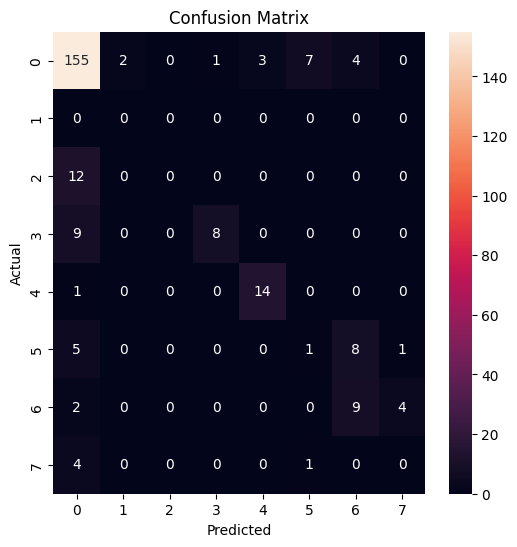

Epoch 24/50 ---> Train Accuracy: 78.44162995594714%, Validation Accuracy: 72.94117647058823%
Epoch 24/50 runtime: 0.06220240990320842 minutes


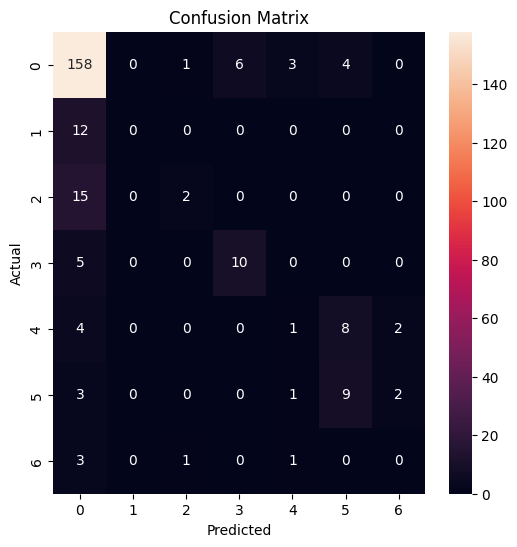

Epoch 25/50 ---> Train Accuracy: 77.67070484581498%, Validation Accuracy: 74.43137254901961%
Epoch 25/50 runtime: 0.04764130115509033 minutes


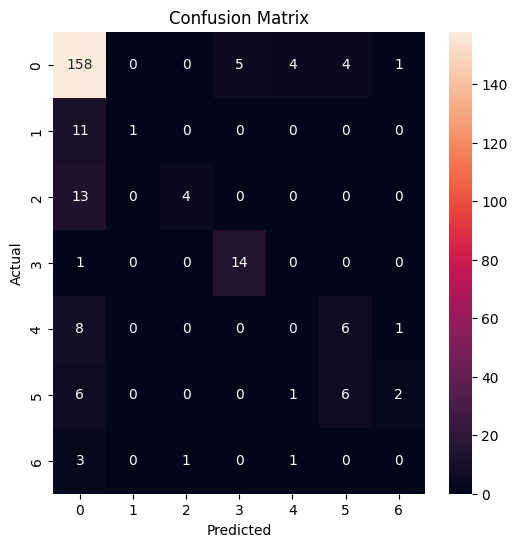

Epoch 26/50 ---> Train Accuracy: 78.57929515418502%, Validation Accuracy: 74.50980392156863%
Epoch 26/50 runtime: 0.03941008647282918 minutes


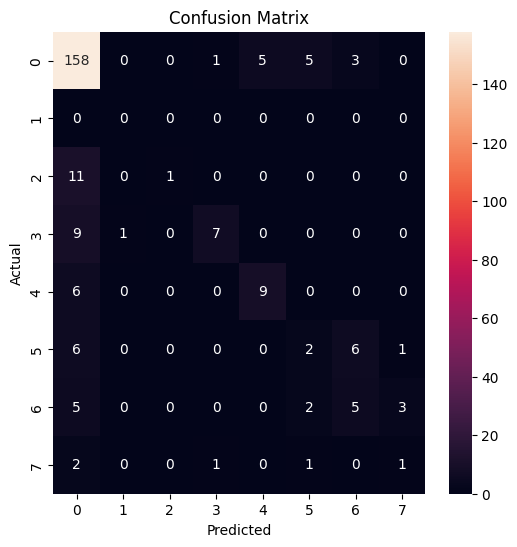

Epoch 27/50 ---> Train Accuracy: 78.55176211453744%, Validation Accuracy: 74.03921568627452%
Epoch 27/50 runtime: 0.03995246887207031 minutes


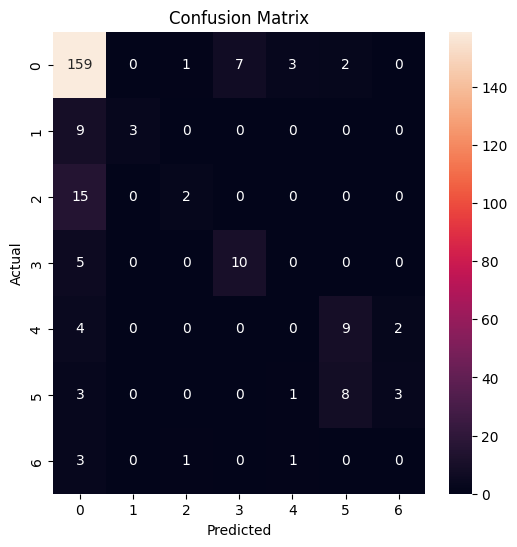

Epoch 28/50 ---> Train Accuracy: 78.55176211453744%, Validation Accuracy: 73.33333333333333%
Epoch 28/50 runtime: 0.038829835255940755 minutes


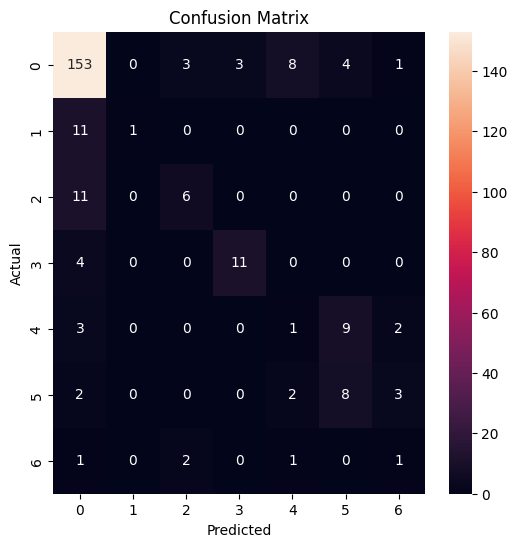

Epoch 29/50 ---> Train Accuracy: 78.99229074889868%, Validation Accuracy: 72.3921568627451%
Epoch 29/50 runtime: 0.042514967918396 minutes


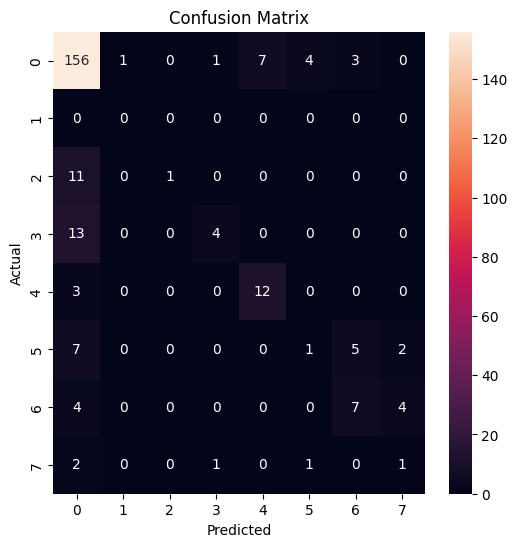

Epoch 30/50 ---> Train Accuracy: 79.24008810572687%, Validation Accuracy: 74.03921568627452%
Epoch 30/50 runtime: 0.06700697739919027 minutes


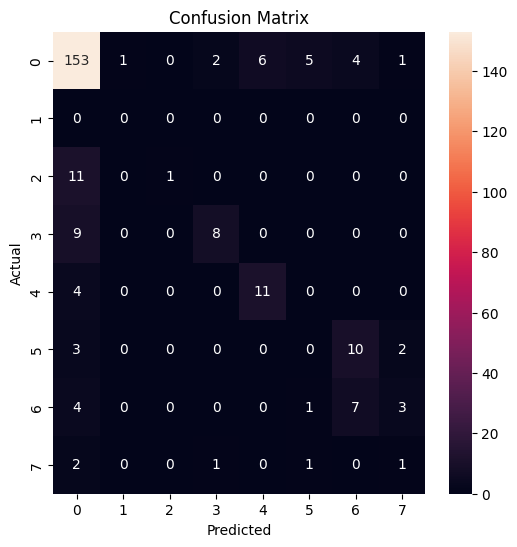

Epoch 31/50 ---> Train Accuracy: 79.65308370044053%, Validation Accuracy: 72.62745098039215%
Epoch 31/50 runtime: 0.041566777229309085 minutes


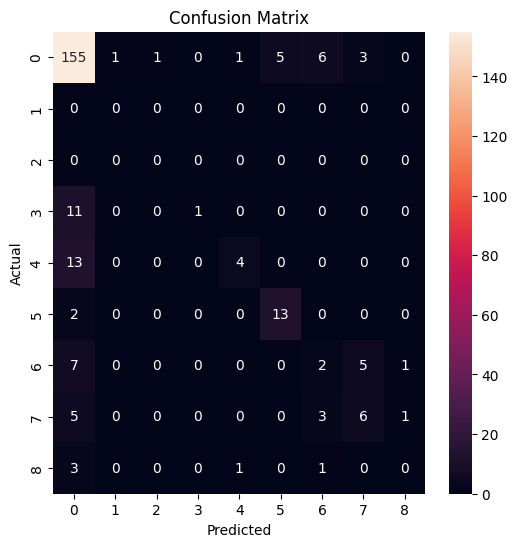

Epoch 32/50 ---> Train Accuracy: 80.0385462555066%, Validation Accuracy: 73.96078431372548%
Epoch 32/50 runtime: 0.04091428120930989 minutes


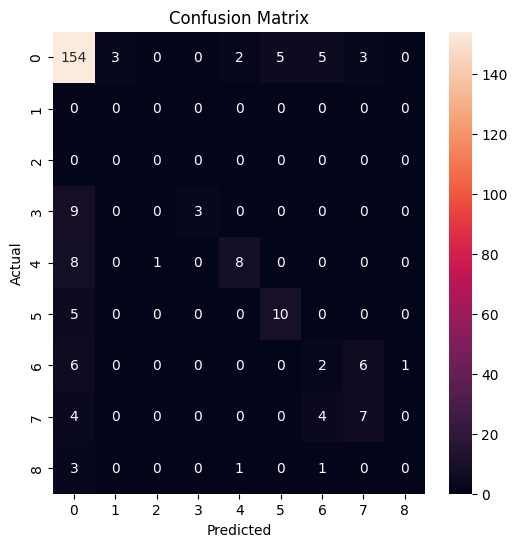

Epoch 33/50 ---> Train Accuracy: 79.79074889867842%, Validation Accuracy: 72.47058823529412%
Epoch 33/50 runtime: 0.04947980642318726 minutes


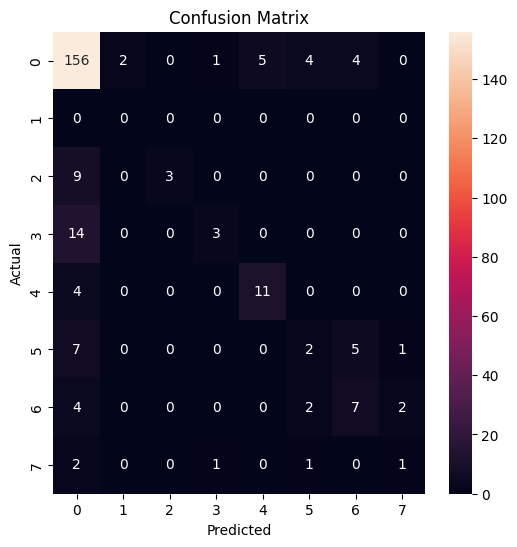

Epoch 34/50 ---> Train Accuracy: 79.79074889867842%, Validation Accuracy: 74.27450980392157%
Epoch 34/50 runtime: 0.039906636873881025 minutes


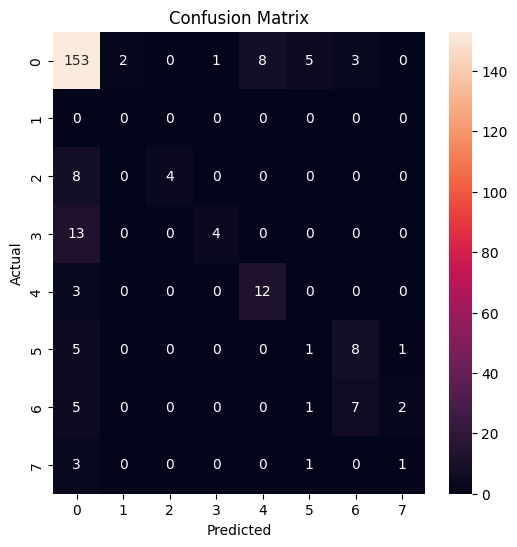

Epoch 35/50 ---> Train Accuracy: 79.98348017621146%, Validation Accuracy: 73.56862745098039%
Epoch 35/50 runtime: 0.07365374167760214 minutes


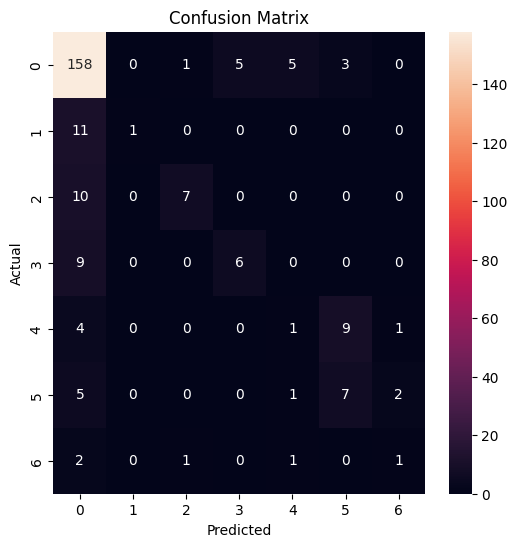

Epoch 36/50 ---> Train Accuracy: 80.69933920704845%, Validation Accuracy: 73.72549019607843%
Epoch 36/50 runtime: 0.04295650323232015 minutes


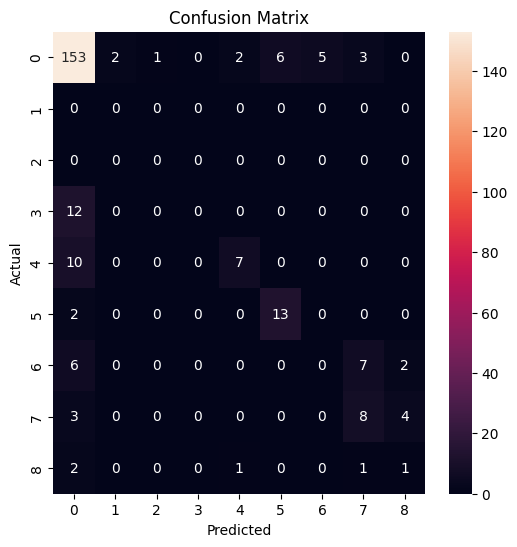

Epoch 37/50 ---> Train Accuracy: 80.53414096916299%, Validation Accuracy: 73.33333333333333%
Epoch 37/50 runtime: 0.041866032282511394 minutes


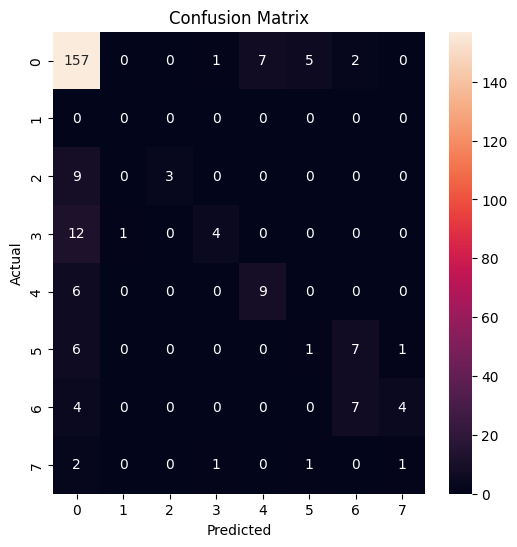

Epoch 38/50 ---> Train Accuracy: 81.05726872246696%, Validation Accuracy: 74.19607843137256%
Epoch 38/50 runtime: 0.039494240283966066 minutes


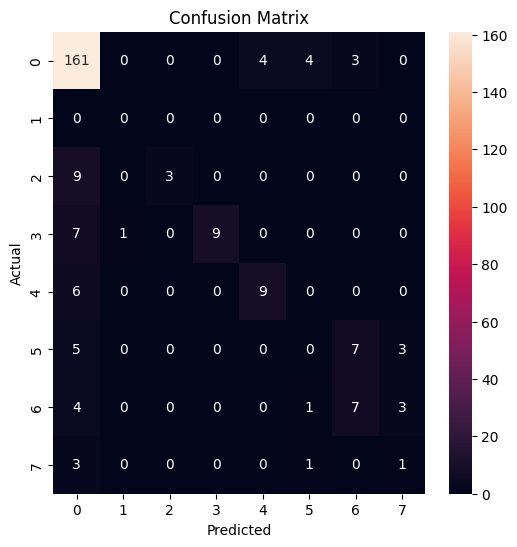

Epoch 39/50 ---> Train Accuracy: 81.00220264317181%, Validation Accuracy: 74.50980392156863%
Epoch 39/50 runtime: 0.04103641112645467 minutes


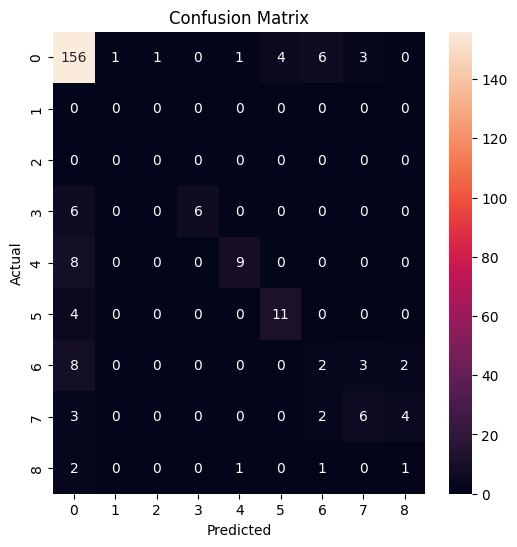

Epoch 40/50 ---> Train Accuracy: 81.00220264317181%, Validation Accuracy: 73.88235294117646%
Epoch 40/50 runtime: 0.06687056620915731 minutes


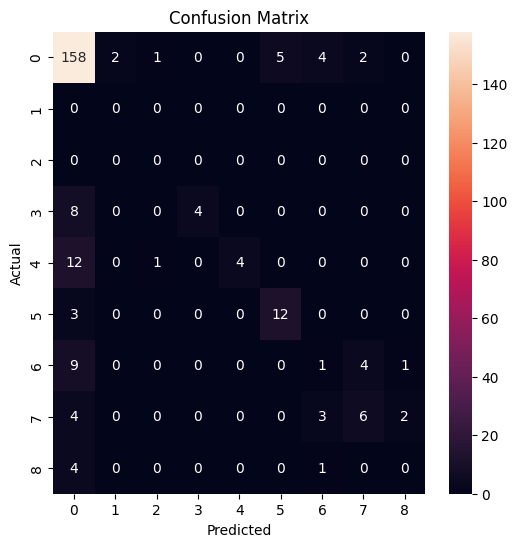

Epoch 41/50 ---> Train Accuracy: 81.77312775330397%, Validation Accuracy: 74.3529411764706%
Epoch 41/50 runtime: 0.05172572533289591 minutes


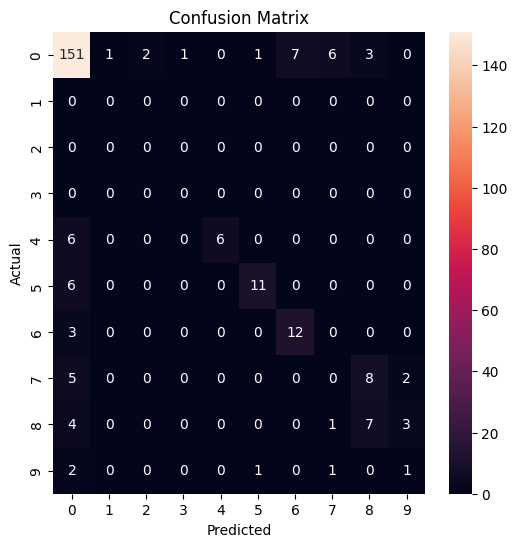

Epoch 42/50 ---> Train Accuracy: 81.82819383259911%, Validation Accuracy: 73.01960784313725%
Epoch 42/50 runtime: 0.042149301369984946 minutes


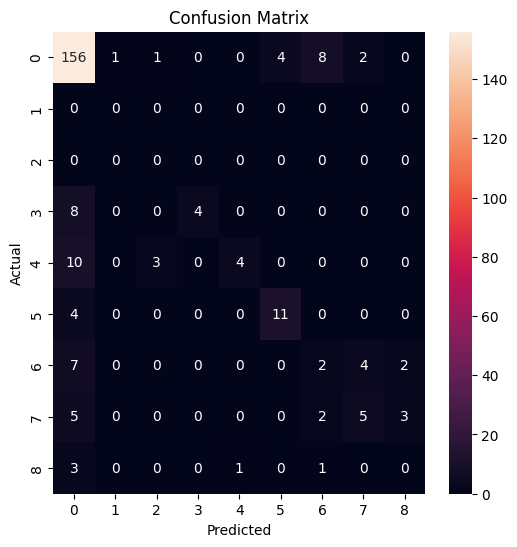

Epoch 43/50 ---> Train Accuracy: 81.38766519823788%, Validation Accuracy: 73.88235294117646%
Epoch 43/50 runtime: 0.04047899643580119 minutes


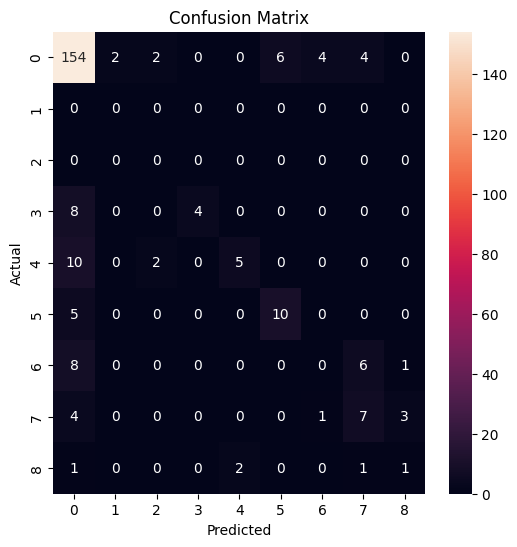

Epoch 44/50 ---> Train Accuracy: 81.91079295154185%, Validation Accuracy: 72.0%
Epoch 44/50 runtime: 0.04115515152613322 minutes


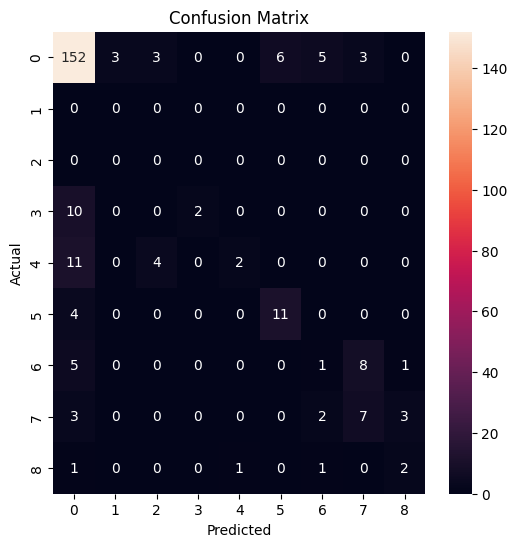

Epoch 45/50 ---> Train Accuracy: 82.29625550660793%, Validation Accuracy: 73.41176470588235%
Epoch 45/50 runtime: 0.07503553628921508 minutes


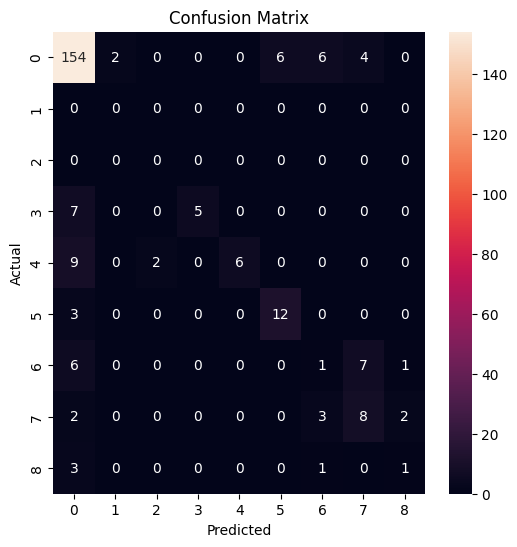

Epoch 46/50 ---> Train Accuracy: 82.13105726872247%, Validation Accuracy: 73.72549019607843%
Epoch 46/50 runtime: 0.051667900880177815 minutes


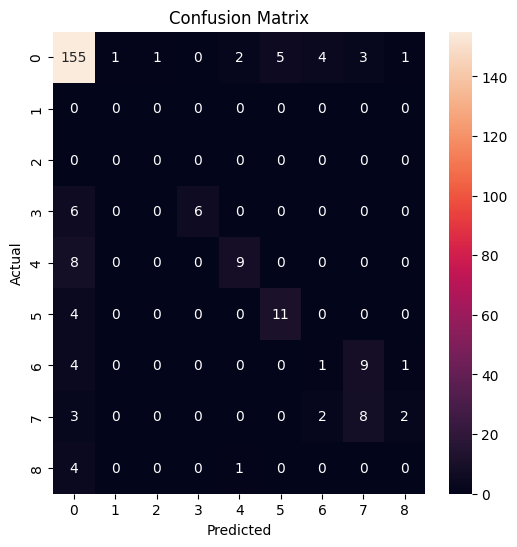

Epoch 47/50 ---> Train Accuracy: 82.79185022026432%, Validation Accuracy: 74.66666666666667%
Epoch 47/50 runtime: 0.039138046900431316 minutes


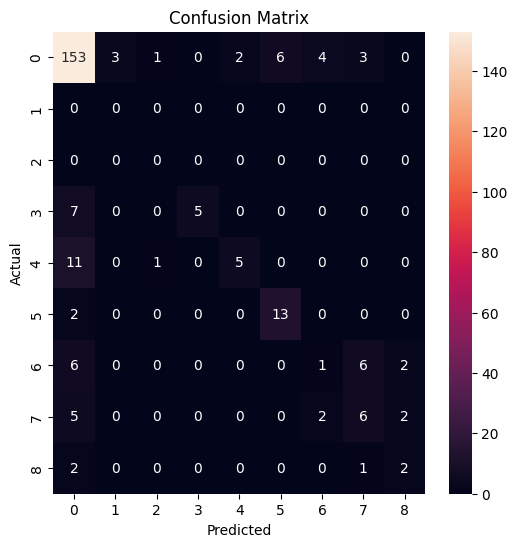

Epoch 48/50 ---> Train Accuracy: 83.4251101321586%, Validation Accuracy: 73.56862745098039%
Epoch 48/50 runtime: 0.02715257406234741 minutes


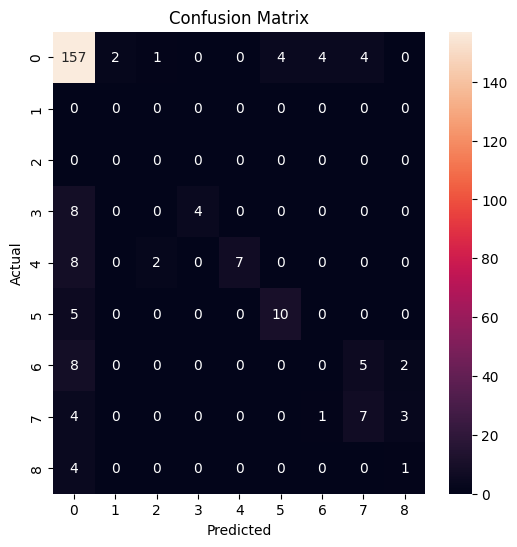

Epoch 49/50 ---> Train Accuracy: 83.03964757709251%, Validation Accuracy: 74.58823529411765%
Epoch 49/50 runtime: 0.02665841579437256 minutes


In [38]:
# Hyperparameters
input_size = X_train_unb.shape[2]
hidden_size = 256  # Number of hidden units in RNN
num_classes = 13  # For classification
epochs = 50
learning_rate = 0.001 #0.01 #
batch_size = 512 #32
landa = 0.001  # Regularization term (lambda)

# Data preparation
train_dataset = TensorDataset(t.tensor(padded_sequences_unb, dtype=t.float32), t.tensor(y_train_unb, dtype=t.long))
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TensorDataset(t.tensor(padded_sequences_test_unb, dtype=t.float32), t.tensor(y_test_unb, dtype=t.long))
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# RNN layers and additional fully connected layer
rnn_layer1 = nn.LSTM(input_size, hidden_size, batch_first=True)
dropout1 = nn.Dropout(0.3)  # Add dropout between RNN layers, changed to 0.2
# rnn_layer2 = nn.LSTM(hidden_size, hidden_size, batch_first=True)
# dropout2 = nn.Dropout(0.5)  # Add dropout between RNN layers
fc_layer1 = nn.Linear(hidden_size, hidden_size)  # Additional fully connected layer
fc_layer2 = nn.Linear(hidden_size, num_classes)  # Final output layer

# Dropout layer
dropout_fc = nn.Dropout(0.3)  # Add dropout between fully connected layers

# Activation function
relu = nn.ReLU()

# Loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
# optimizer = Adam(list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)
optimizer = Adam(list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)

# Lists to store accuracies and losses
train_accuracy_list = []
validation_accuracy_list = []
train_loss_list = []

class_report_list = []
conf_matrix_list = []

# To be used inside t.no_grad()
loss_list_train = []
loss_list_val = []


# Training loop
for epoch in range(epochs):

    st = time.time()

    if epoch % 10 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []
    for X, Y in train_data_loader:
        # Forward pass through layers
        out, _ = rnn_layer1(X)
        out = dropout1(out)  # Apply dropout between RNN layers
        # out, _ = rnn_layer2(out)
        # out = dropout2(out)  # Apply dropout between RNN layers
        out = out[:, -1, :]  # Get the last output of the sequence
        out = relu(fc_layer1(out))  # Apply activation function after first fully connected layer
        out = dropout_fc(out)  # Apply dropout between fully connected layers
        out = fc_layer2(out)

        # Regularization
        # l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
        # loss = loss_fn(out, Y) + landa * l2_term
        loss = loss_fn(out, Y)

        per_epoch_loss_list.append(loss.item())

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluation on training and validation data
    rnn_layer1.eval()
    # rnn_layer2.eval()
    fc_layer1.eval()
    fc_layer2.eval()

    with t.no_grad():
        # Training data
        train_correct, train_total = 0, 0
        for X, Y in train_data_loader:
            out, _ = rnn_layer1(X)
            out = dropout1(out)  # Apply dropout between RNN layers
            # out, _ = rnn_layer2(out)
            # out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)

            loss = loss_fn(out, Y)
            loss_list_train.append(loss.item())

            train_total += Y.size(0)
            train_correct += (predicted == Y).sum().item()
        train_accuracy = 100 * train_correct / train_total

        # Validation data
        validation_correct, validation_total = 0, 0
        for X, Y in test_data_loader:
            out, _ = rnn_layer1(X)
            out = dropout1(out)  # Apply dropout between RNN layers
            # out, _ = rnn_layer2(out)
            # out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)

            loss_val = loss_fn(out, Y)
            loss_list_val.append(loss_val.item())

            validation_total += Y.size(0)
            validation_correct += (predicted == Y).sum().item()
            #plot_cm(confusion_matrix(Y,predicted))

            conf_matrix_test, class_report_test=get_scores(Y,predicted)

        plot_cm(conf_matrix_test)

        #plot_cm(confusion_matrix(Y,predicted))
        validation_accuracy = 100 * validation_correct / validation_total

        # Print accuracy for the current epoch
        print(f'Epoch {epoch}/{epochs} ---> Train Accuracy: {train_accuracy}%, Validation Accuracy: {validation_accuracy}%')

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)
        class_report_list.append(class_report_test)
        conf_matrix_list.append(conf_matrix_test)

        et = time.time()

        print(f'Epoch {epoch}/{epochs} runtime:', str((et - st)/60), 'minutes')

    # Calculate and append the average loss for the epoch
    train_loss_list.append(sum(per_epoch_loss_list) / len(per_epoch_loss_list))

    # Set the model back to train mode
    rnn_layer1.train()
    # rnn_layer2.train()
    fc_layer1.train()
    fc_layer2.train()


In [29]:
print(f'Train loss: {np.mean(loss_list_train)}')
print(f'Validation loss: {np.mean(loss_list_val)}')

Train loss: 0.6981730838865041
Validation loss: 1.155658454100291


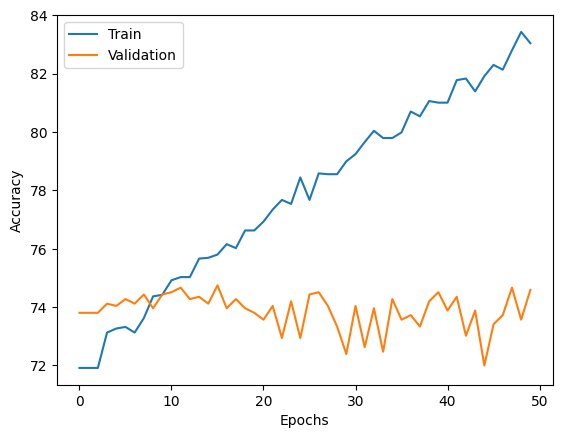

In [39]:
# Plot training and validation accuracy over epochs
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="Train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label="Validation")
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

In [40]:
class_report_list

[{'0': {'precision': 0.6852589641434262,
   'recall': 1.0,
   'f1-score': 0.8132387706855793,
   'support': 172},
  '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 12},
  '8': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 17},
  '9': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15},
  '10': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15},
  '11': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15},
  '12': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 5},
  'accuracy': 0.6852589641434262,
  'macro avg': {'precision': 0.09789413773477518,
   'recall': 0.14285714285714285,
   'f1-score': 0.11617696724079704,
   'support': 251},
  'weighted avg': {'precision': 0.4695798479389216,
   'recall': 0.6852589641434262,
   'f1-score': 0.5572791576012734,
   'support': 251}},
 {'0': {'precision': 0.6852589641434262,
   'recall': 1.0,
   'f1-score': 0.8132387706855793,
   'support': 172},
  '7': {'pr

# Full - second RNN layer, L2 and dropout layers between RNN and FC

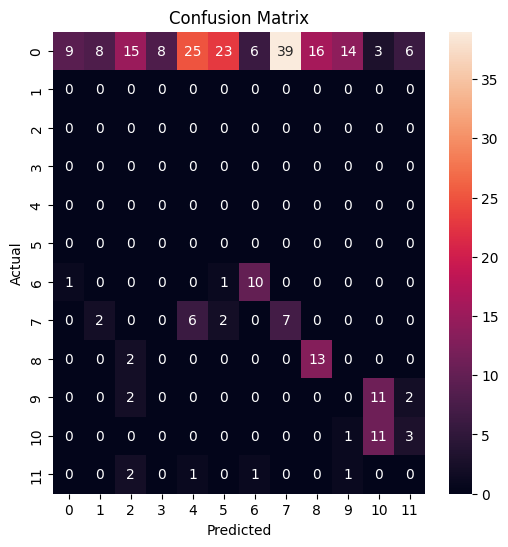

Epoch 0/50 ---> Train Accuracy: 64.60375163588775%, Validation Accuracy: 12.941176470588236%
Epoch 0/50 runtime: 0.7351028243700664 minutes


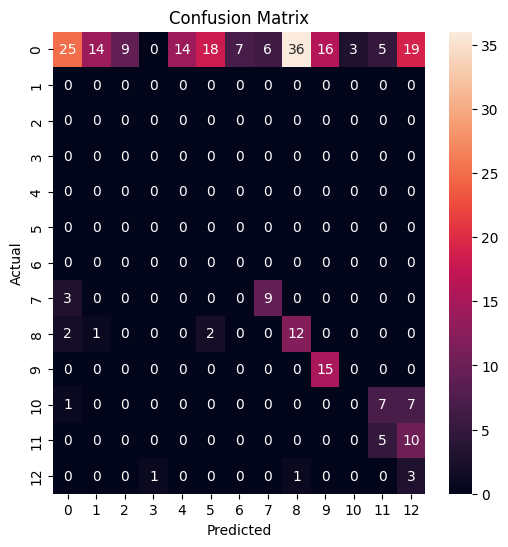

Epoch 1/50 ---> Train Accuracy: 80.54675003635306%, Validation Accuracy: 21.80392156862745%
Epoch 1/50 runtime: 0.6993441303571065 minutes


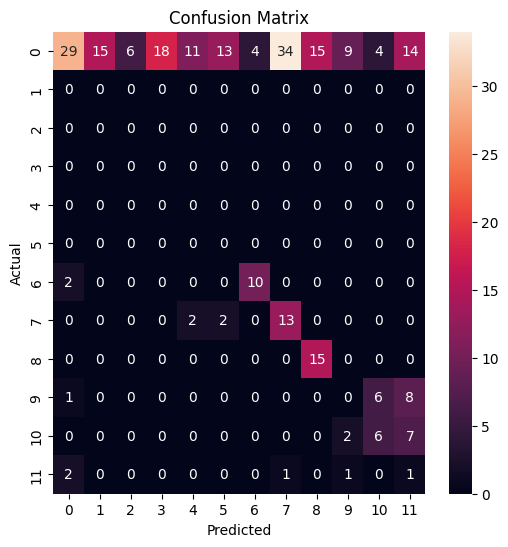

Epoch 2/50 ---> Train Accuracy: 86.52028500799767%, Validation Accuracy: 24.54901960784314%
Epoch 2/50 runtime: 0.4625872810681661 minutes


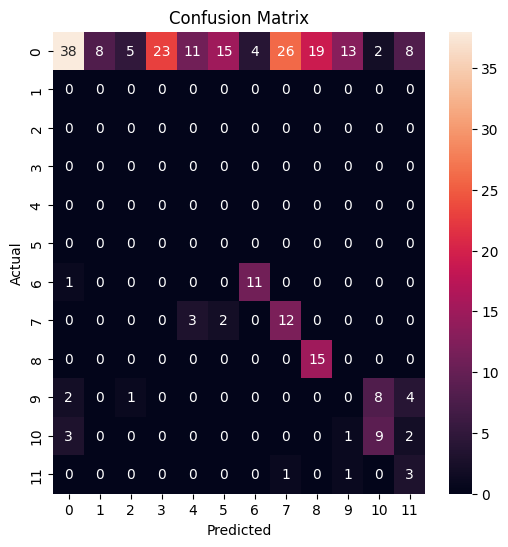

Epoch 3/50 ---> Train Accuracy: 89.06499927293878%, Validation Accuracy: 30.58823529411765%
Epoch 3/50 runtime: 0.47776749928792317 minutes


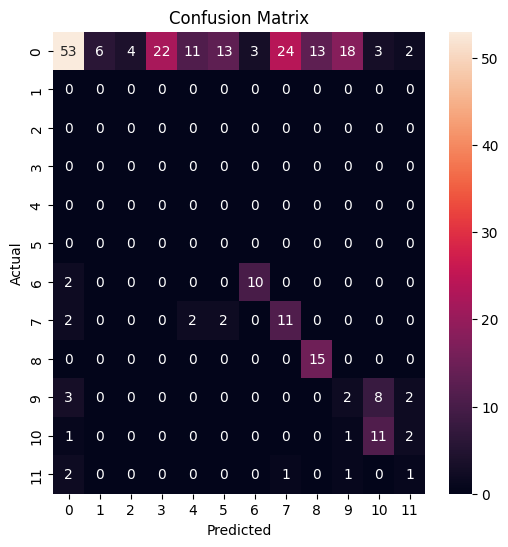

Epoch 4/50 ---> Train Accuracy: 90.94372546168387%, Validation Accuracy: 36.23529411764706%
Epoch 4/50 runtime: 0.8073126713434855 minutes


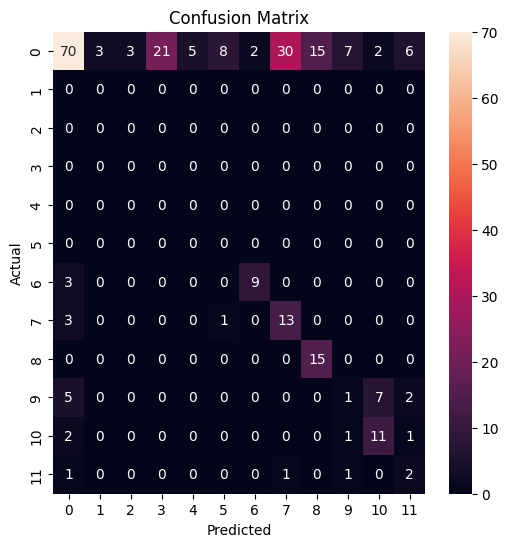

Epoch 5/50 ---> Train Accuracy: 92.54035189762978%, Validation Accuracy: 44.07843137254902%
Epoch 5/50 runtime: 0.7508916815121969 minutes


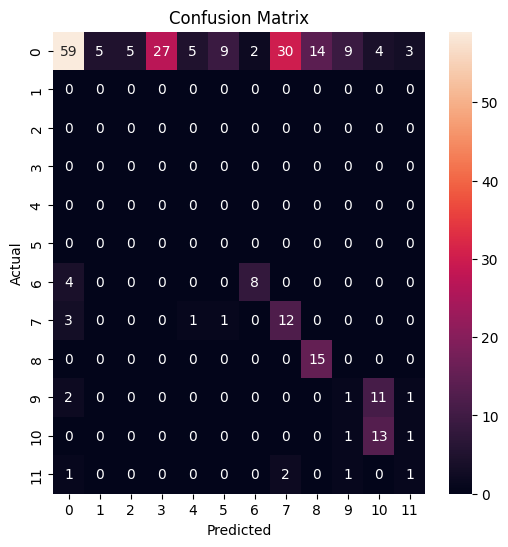

Epoch 6/50 ---> Train Accuracy: 92.22335320633998%, Validation Accuracy: 41.96078431372549%
Epoch 6/50 runtime: 0.4315044085184733 minutes


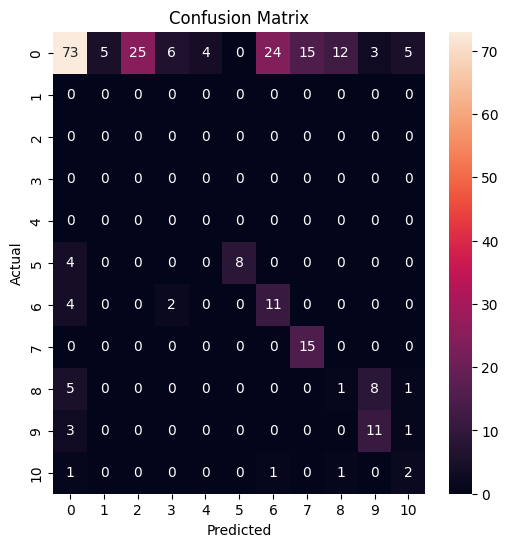

Epoch 7/50 ---> Train Accuracy: 93.24414715719064%, Validation Accuracy: 46.03921568627451%
Epoch 7/50 runtime: 0.43781398932139076 minutes


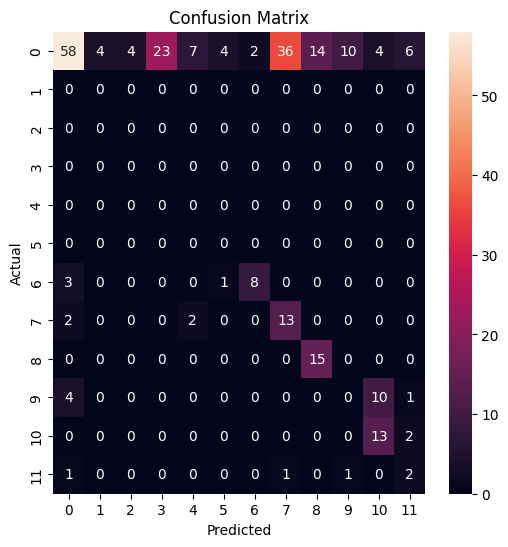

Epoch 8/50 ---> Train Accuracy: 93.02602879162426%, Validation Accuracy: 40.3921568627451%
Epoch 8/50 runtime: 0.4444862167040507 minutes


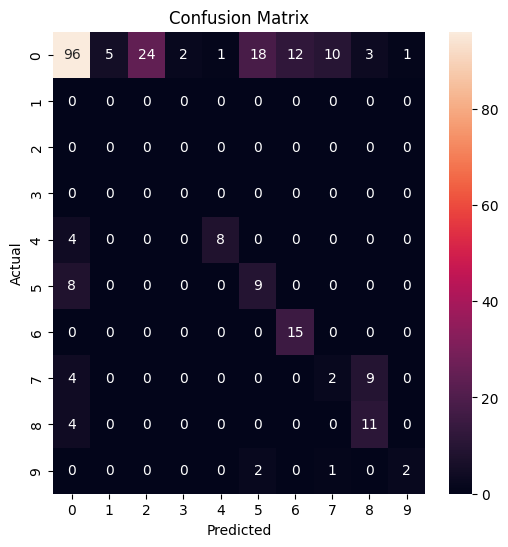

Epoch 9/50 ---> Train Accuracy: 93.25287189181329%, Validation Accuracy: 50.666666666666664%
Epoch 9/50 runtime: 0.44851694504419964 minutes


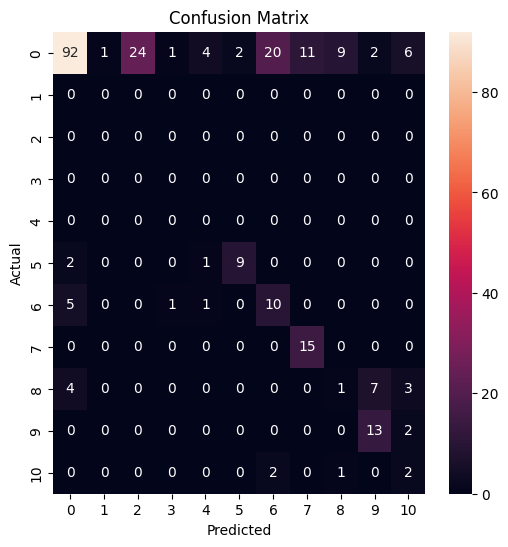

Epoch 10/50 ---> Train Accuracy: 94.57612330958267%, Validation Accuracy: 49.96078431372549%
Epoch 10/50 runtime: 0.4451740264892578 minutes


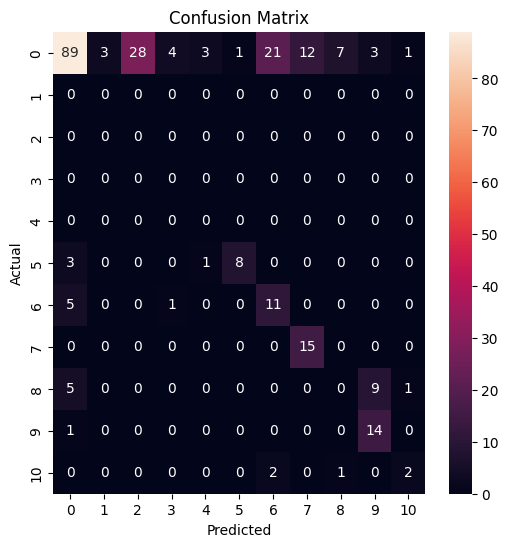

Epoch 11/50 ---> Train Accuracy: 94.21550094517958%, Validation Accuracy: 48.31372549019608%
Epoch 11/50 runtime: 0.4509368896484375 minutes


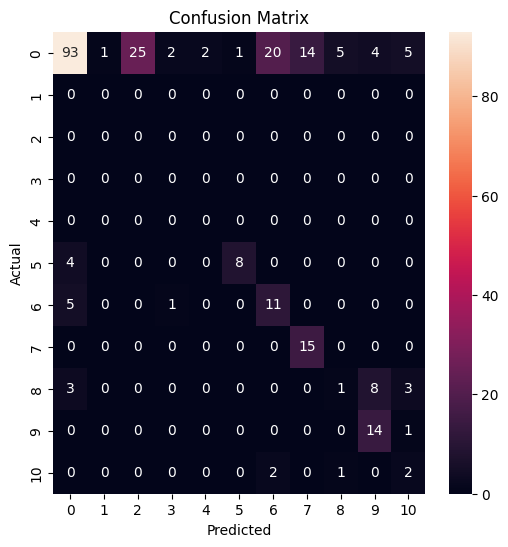

Epoch 12/50 ---> Train Accuracy: 94.56449033008579%, Validation Accuracy: 48.86274509803921%
Epoch 12/50 runtime: 0.44977097113927206 minutes


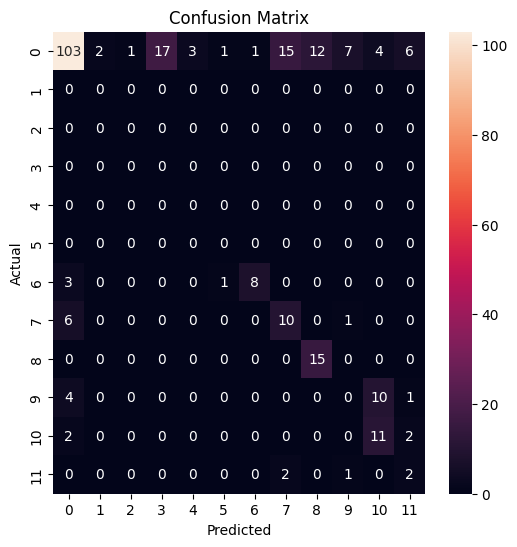

Epoch 13/50 ---> Train Accuracy: 95.00363530609278%, Validation Accuracy: 50.509803921568626%
Epoch 13/50 runtime: 0.45303524335225426 minutes


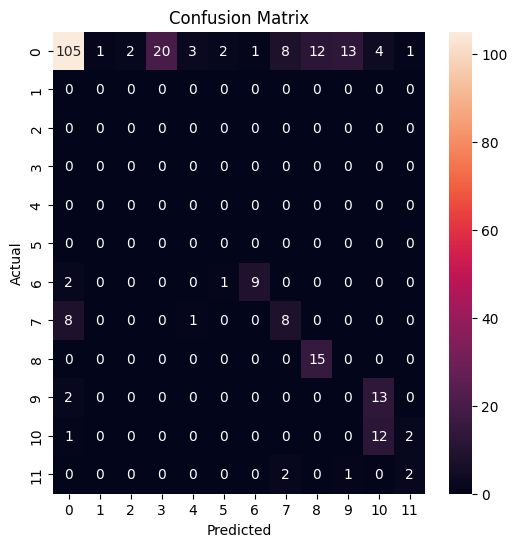

Epoch 14/50 ---> Train Accuracy: 95.05307546895449%, Validation Accuracy: 50.90196078431372%
Epoch 14/50 runtime: 0.44694270690282184 minutes


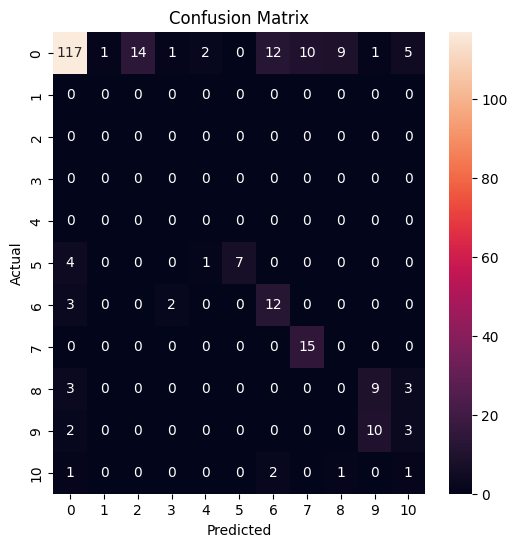

Epoch 15/50 ---> Train Accuracy: 95.07343318307402%, Validation Accuracy: 54.588235294117645%
Epoch 15/50 runtime: 0.4458184083302816 minutes


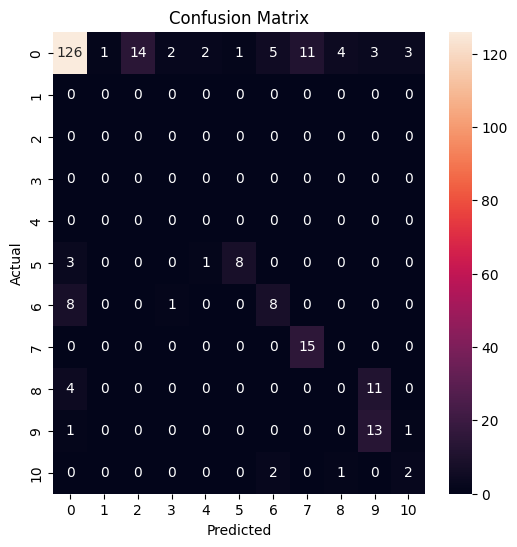

Epoch 16/50 ---> Train Accuracy: 95.35844118074742%, Validation Accuracy: 58.19607843137255%
Epoch 16/50 runtime: 0.4463102459907532 minutes


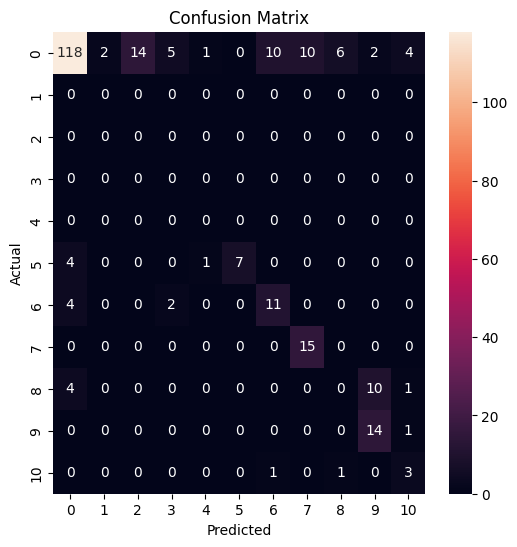

Epoch 17/50 ---> Train Accuracy: 95.57365130143958%, Validation Accuracy: 53.490196078431374%
Epoch 17/50 runtime: 0.42761566241582233 minutes


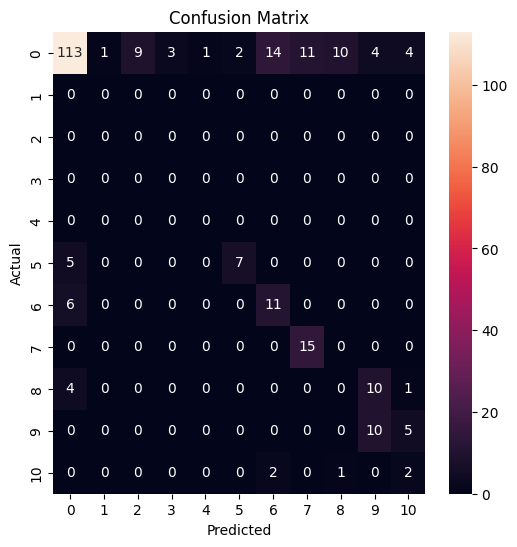

Epoch 18/50 ---> Train Accuracy: 95.67253162716301%, Validation Accuracy: 53.411764705882355%
Epoch 18/50 runtime: 0.43983627955118815 minutes


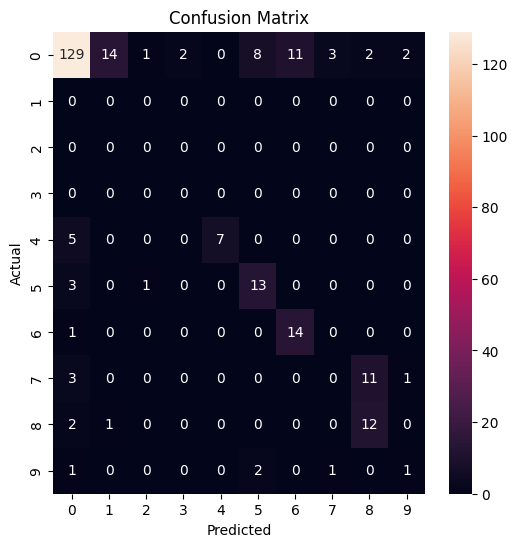

Epoch 19/50 ---> Train Accuracy: 95.50966991420678%, Validation Accuracy: 57.490196078431374%
Epoch 19/50 runtime: 0.44795482953389487 minutes


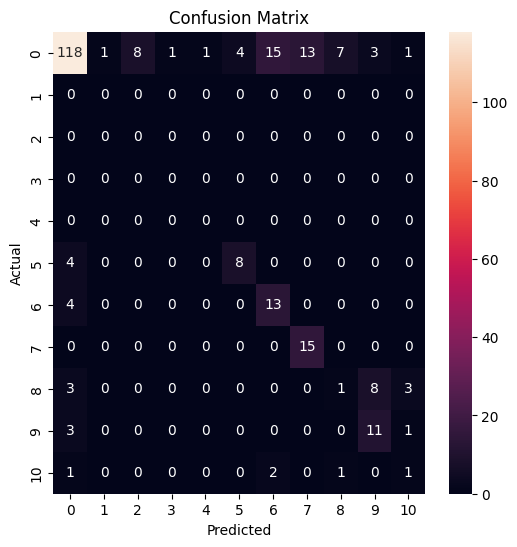

Epoch 20/50 ---> Train Accuracy: 95.83830158499346%, Validation Accuracy: 55.372549019607845%
Epoch 20/50 runtime: 0.43845012585322063 minutes


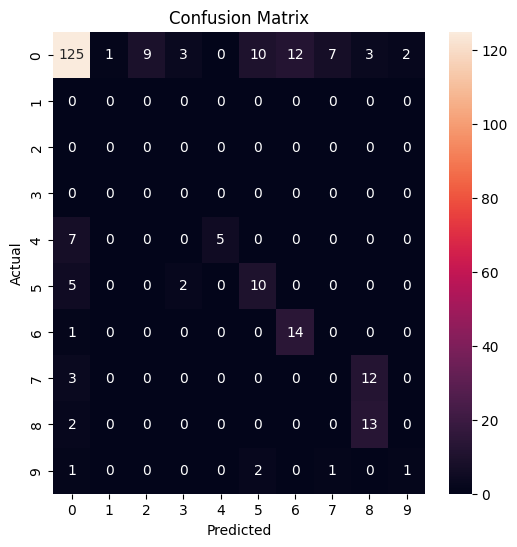

Epoch 21/50 ---> Train Accuracy: 95.69288934128254%, Validation Accuracy: 61.333333333333336%
Epoch 21/50 runtime: 0.44983121554056804 minutes


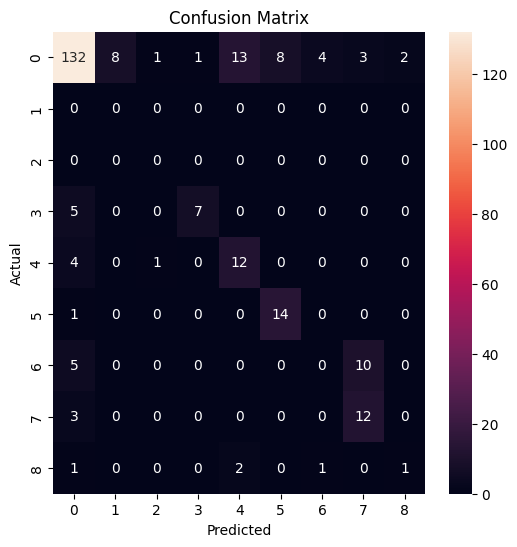

Epoch 22/50 ---> Train Accuracy: 95.53584411807473%, Validation Accuracy: 58.509803921568626%
Epoch 22/50 runtime: 0.45150410334269203 minutes


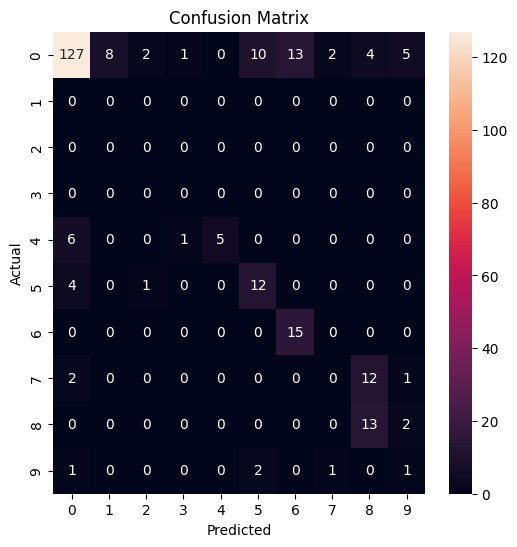

Epoch 23/50 ---> Train Accuracy: 95.81794387087393%, Validation Accuracy: 58.27450980392157%
Epoch 23/50 runtime: 0.4381703774134318 minutes


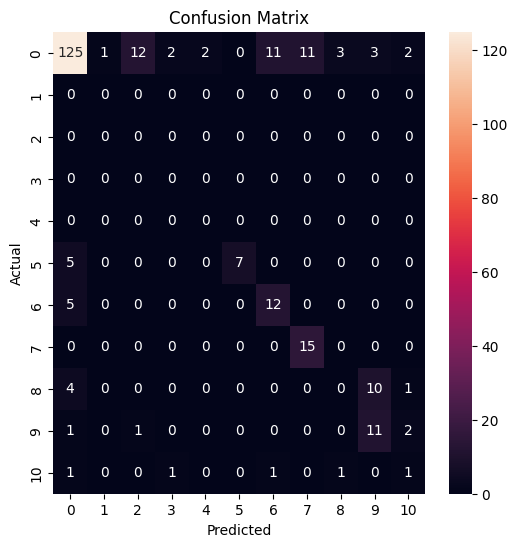

Epoch 24/50 ---> Train Accuracy: 95.81503562599971%, Validation Accuracy: 56.470588235294116%
Epoch 24/50 runtime: 0.44294400215148927 minutes


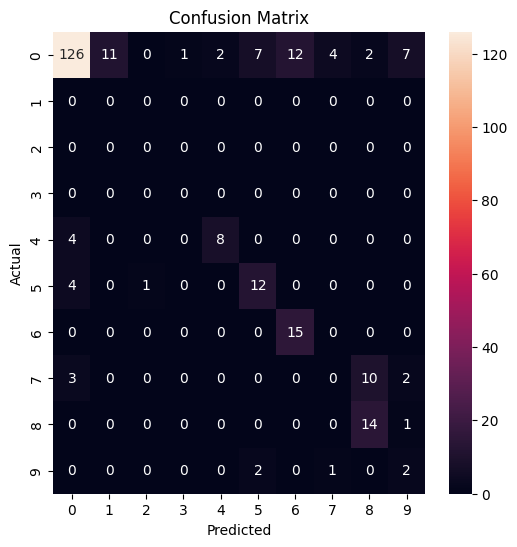

Epoch 25/50 ---> Train Accuracy: 95.92554893122%, Validation Accuracy: 56.627450980392155%
Epoch 25/50 runtime: 0.4314620534578959 minutes


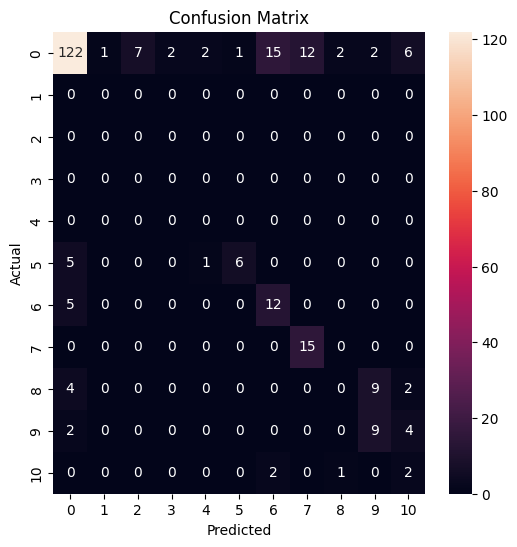

Epoch 26/50 ---> Train Accuracy: 95.63181619892394%, Validation Accuracy: 53.80392156862745%
Epoch 26/50 runtime: 0.43940282265345254 minutes


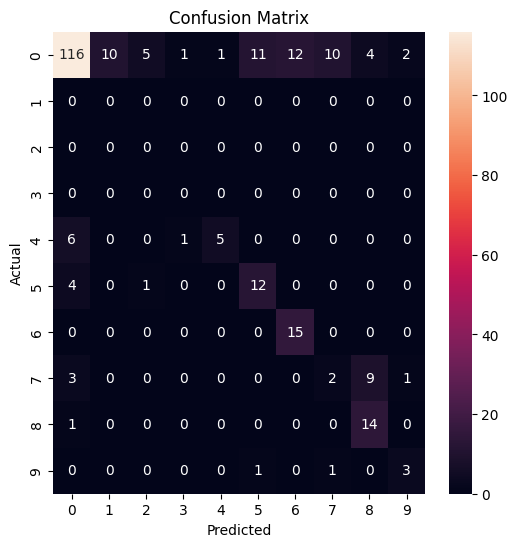

Epoch 27/50 ---> Train Accuracy: 95.96626435945906%, Validation Accuracy: 57.01960784313726%
Epoch 27/50 runtime: 0.4404771169026693 minutes


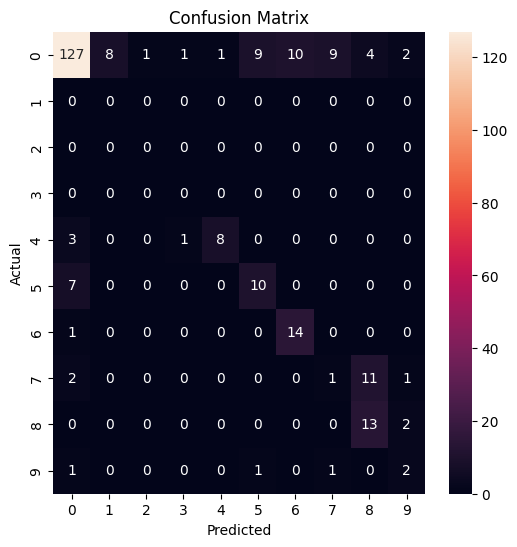

Epoch 28/50 ---> Train Accuracy: 96.11167660316998%, Validation Accuracy: 57.490196078431374%
Epoch 28/50 runtime: 0.44985642433166506 minutes


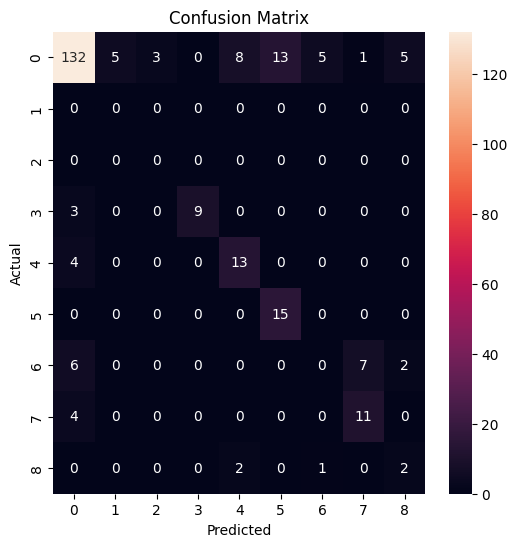

Epoch 29/50 ---> Train Accuracy: 95.98371382870438%, Validation Accuracy: 58.19607843137255%
Epoch 29/50 runtime: 0.44708653291066486 minutes


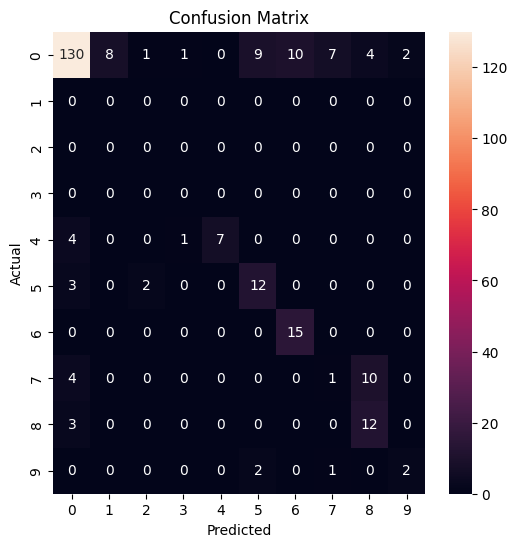

Epoch 30/50 ---> Train Accuracy: 96.31525374436528%, Validation Accuracy: 59.6078431372549%
Epoch 30/50 runtime: 0.4502558509508769 minutes


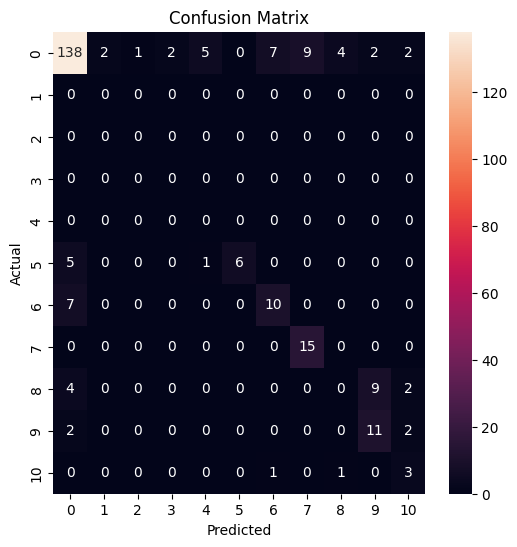

Epoch 31/50 ---> Train Accuracy: 96.05932819543406%, Validation Accuracy: 63.13725490196079%
Epoch 31/50 runtime: 0.46018709341684977 minutes


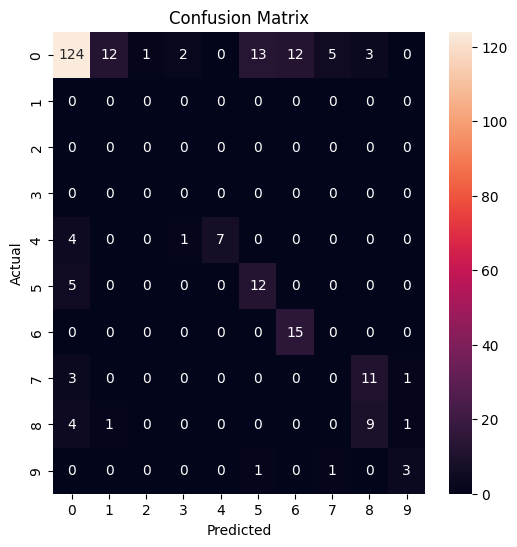

Epoch 32/50 ---> Train Accuracy: 96.3356114584848%, Validation Accuracy: 58.509803921568626%
Epoch 32/50 runtime: 0.45108197927474974 minutes


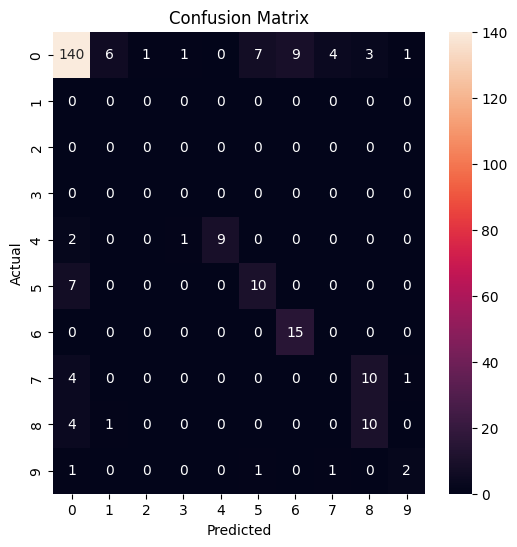

Epoch 33/50 ---> Train Accuracy: 96.51592264068634%, Validation Accuracy: 60.470588235294116%
Epoch 33/50 runtime: 0.44982908566792806 minutes


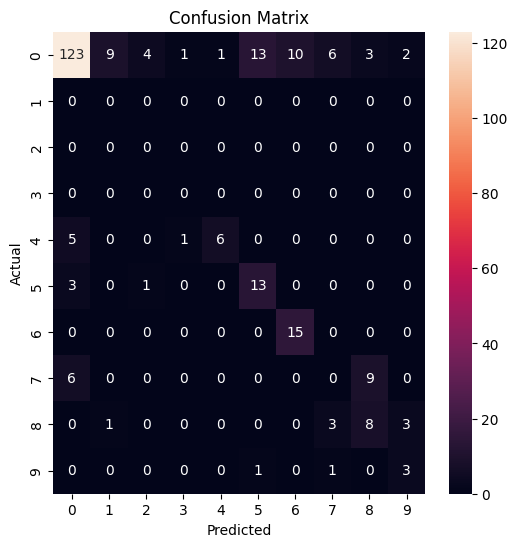

Epoch 34/50 ---> Train Accuracy: 96.08550239930202%, Validation Accuracy: 57.01960784313726%
Epoch 34/50 runtime: 0.4501880884170532 minutes


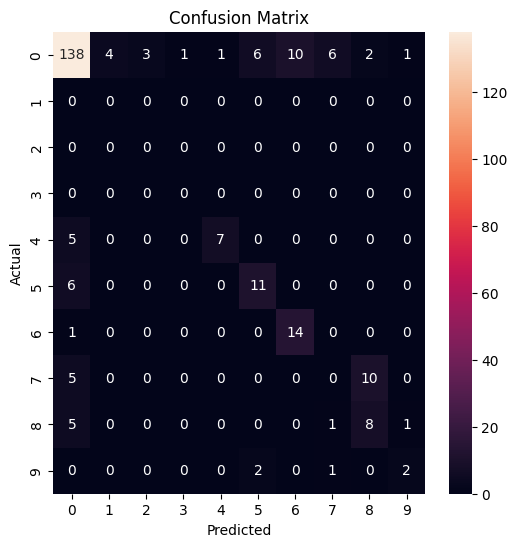

Epoch 35/50 ---> Train Accuracy: 96.50138141631525%, Validation Accuracy: 61.411764705882355%
Epoch 35/50 runtime: 0.4486791213353475 minutes


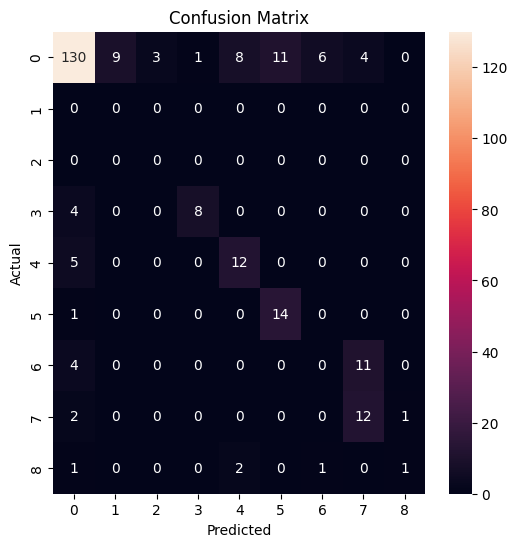

Epoch 36/50 ---> Train Accuracy: 96.19601570452232%, Validation Accuracy: 63.13725490196079%
Epoch 36/50 runtime: 0.4393317500750224 minutes


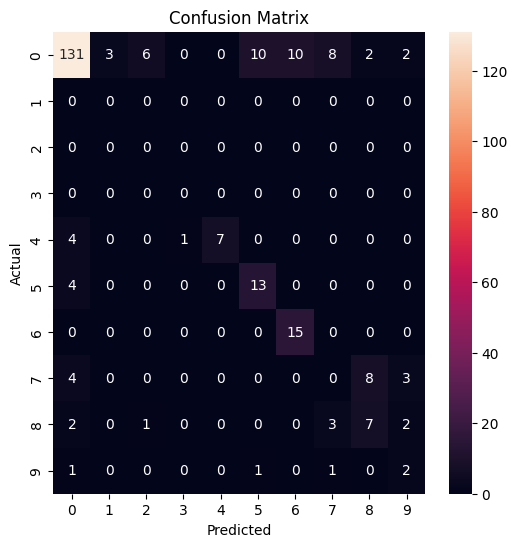

Epoch 37/50 ---> Train Accuracy: 96.29489603024575%, Validation Accuracy: 60.78431372549019%
Epoch 37/50 runtime: 0.4541262586911519 minutes


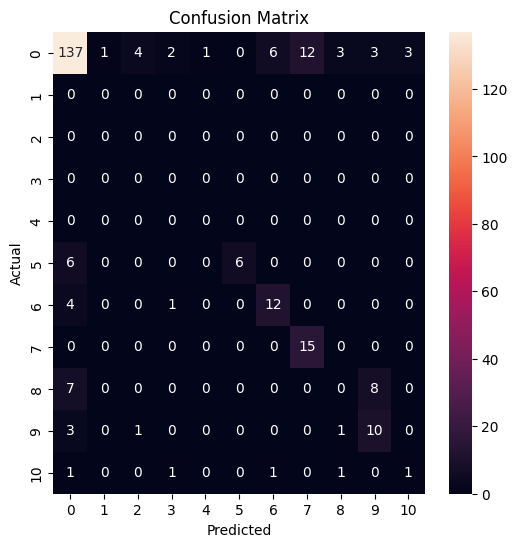

Epoch 38/50 ---> Train Accuracy: 96.41995055983713%, Validation Accuracy: 62.588235294117645%
Epoch 38/50 runtime: 0.4429075082143148 minutes


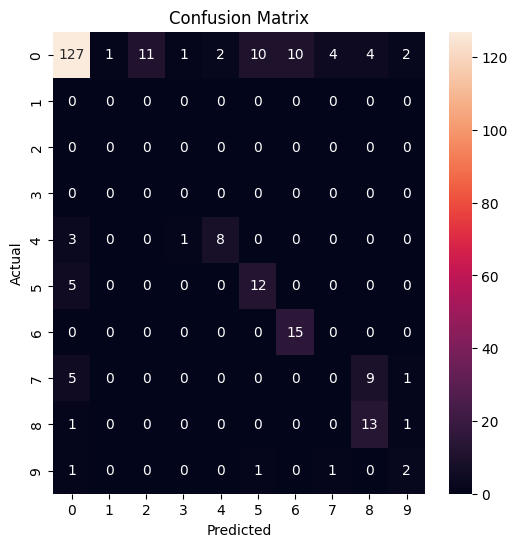

Epoch 39/50 ---> Train Accuracy: 96.29198778537153%, Validation Accuracy: 60.78431372549019%
Epoch 39/50 runtime: 0.4537461241086324 minutes


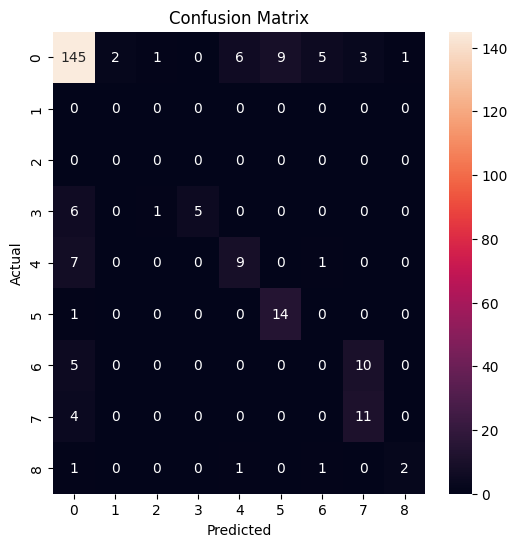

Epoch 40/50 ---> Train Accuracy: 96.5886287625418%, Validation Accuracy: 65.72549019607843%
Epoch 40/50 runtime: 0.45465105374654136 minutes


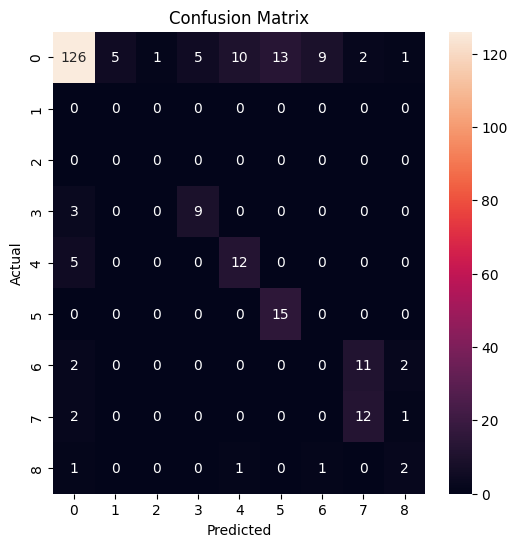

Epoch 41/50 ---> Train Accuracy: 96.53046386505744%, Validation Accuracy: 58.666666666666664%
Epoch 41/50 runtime: 0.4514344135920207 minutes


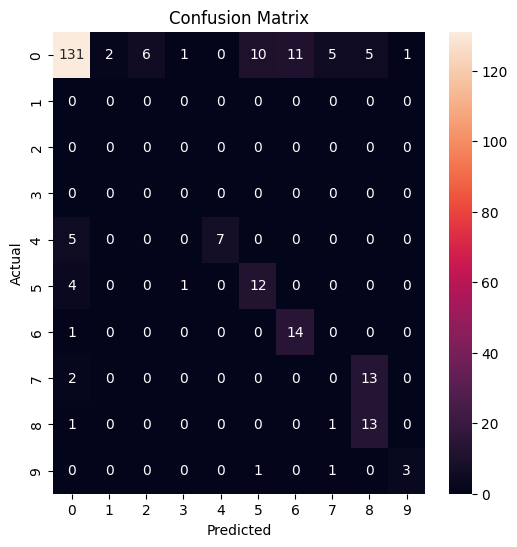

Epoch 42/50 ---> Train Accuracy: 96.43740002908245%, Validation Accuracy: 61.333333333333336%
Epoch 42/50 runtime: 0.4478438059488932 minutes


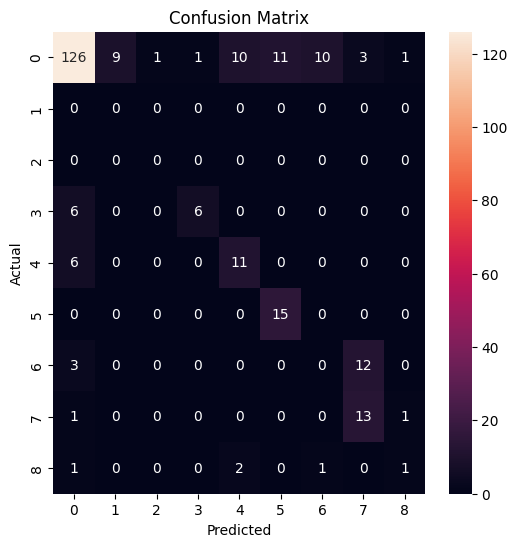

Epoch 43/50 ---> Train Accuracy: 95.73942125927003%, Validation Accuracy: 59.6078431372549%
Epoch 43/50 runtime: 0.4484533985455831 minutes


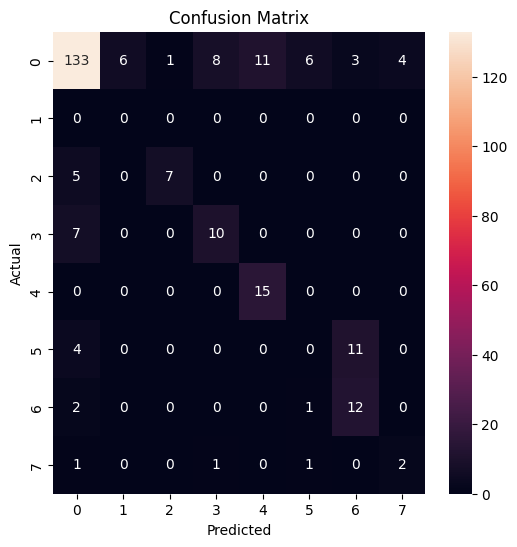

Epoch 44/50 ---> Train Accuracy: 96.51592264068634%, Validation Accuracy: 63.529411764705884%
Epoch 44/50 runtime: 0.4677125652631124 minutes


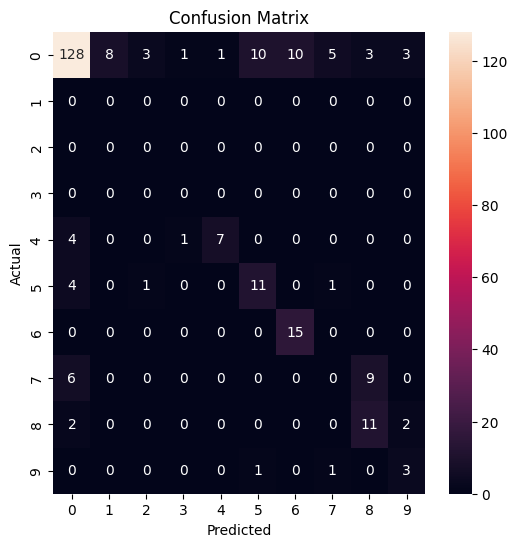

Epoch 45/50 ---> Train Accuracy: 96.53337210993166%, Validation Accuracy: 58.588235294117645%
Epoch 45/50 runtime: 0.46687931219736734 minutes


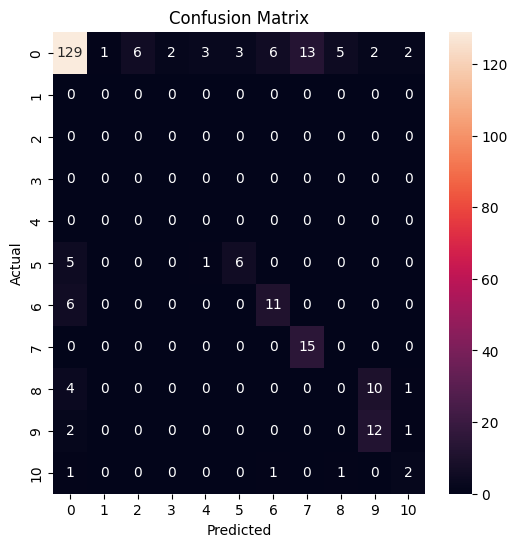

Epoch 46/50 ---> Train Accuracy: 96.40831758034027%, Validation Accuracy: 58.27450980392157%
Epoch 46/50 runtime: 0.4770220200220744 minutes


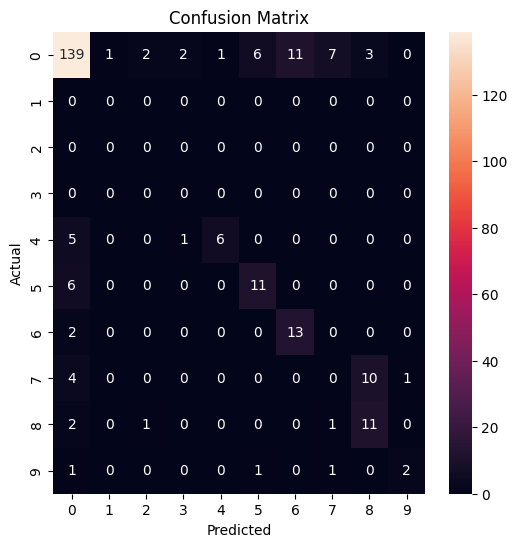

Epoch 47/50 ---> Train Accuracy: 96.37923513159808%, Validation Accuracy: 63.05882352941177%
Epoch 47/50 runtime: 0.47678321997324624 minutes


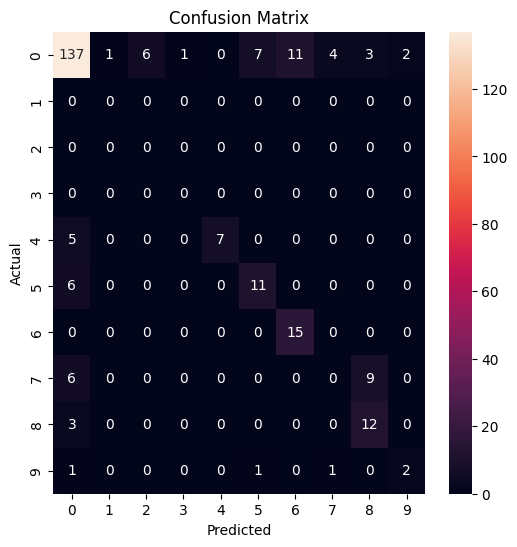

Epoch 48/50 ---> Train Accuracy: 96.20474043914497%, Validation Accuracy: 64.7843137254902%
Epoch 48/50 runtime: 0.4705561876296997 minutes


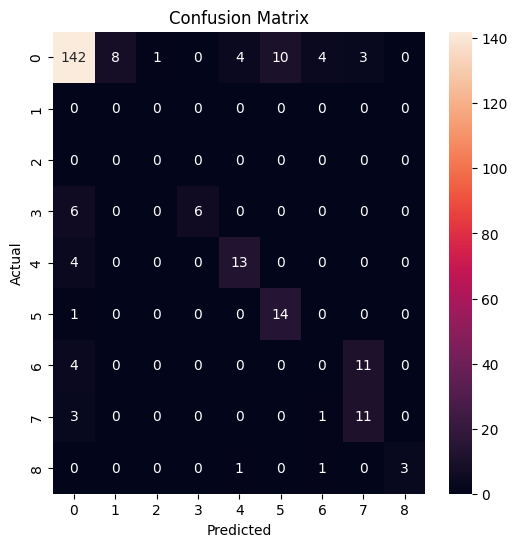

Epoch 49/50 ---> Train Accuracy: 96.4461247637051%, Validation Accuracy: 63.529411764705884%
Epoch 49/50 runtime: 0.4716663400332133 minutes


In [60]:
# Hyperparameters
input_size = X_train.shape[2]
hidden_size = 256  # Number of hidden units in RNN
num_classes = 13  # For classification
epochs = 50
learning_rate = 0.001 #0.01 #
batch_size = 512 #32
landa = 0.001  # Regularization term (lambda)

# Data preparation
train_dataset = TensorDataset(t.tensor(padded_sequences, dtype=t.float32), t.tensor(y_train, dtype=t.long))
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TensorDataset(t.tensor(padded_sequences_test, dtype=t.float32), t.tensor(y_test, dtype=t.long))
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# RNN layers and additional fully connected layer
rnn_layer1 = nn.LSTM(input_size, hidden_size, batch_first=True)
dropout1 = nn.Dropout(0.3)  # Add dropout between RNN layers, changed to 0.3
rnn_layer2 = nn.LSTM(hidden_size, hidden_size, batch_first=True)
dropout2 = nn.Dropout(0.3)  # Add dropout between RNN layers
fc_layer1 = nn.Linear(hidden_size, hidden_size)  # Additional fully connected layer
fc_layer2 = nn.Linear(hidden_size, num_classes)  # Final output layer

# Dropout layer
dropout_fc = nn.Dropout(0.3)  # Add dropout between fully connected layers

# Activation function
relu = nn.ReLU()

# Loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)
#optimizer = Adam(list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)

# Lists to store accuracies and losses
train_accuracy_list = []
validation_accuracy_list = []
train_loss_list = []

class_report_list = []
conf_matrix_list = []

# To be used inside t.no_grad()
loss_list_train = []
loss_list_val = []

# Training loop
for epoch in range(epochs):

    st = time.time()

    if epoch % 10 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []
    for X, Y in train_data_loader:
        # Forward pass through layers
        out, _ = rnn_layer1(X)
        out = dropout1(out)  # Apply dropout between RNN layers
        out, _ = rnn_layer2(out)
        out = dropout2(out)  # Apply dropout between RNN layers
        out = out[:, -1, :]  # Get the last output of the sequence
        out = relu(fc_layer1(out))  # Apply activation function after first fully connected layer
        out = dropout_fc(out)  # Apply dropout between fully connected layers
        out = fc_layer2(out)

        # Regularization
        l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
        loss = loss_fn(out, Y) + landa * l2_term
        #loss = loss_fn(out, Y)

        per_epoch_loss_list.append(loss.item())

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluation on training and validation data
    rnn_layer1.eval()
    # rnn_layer2.eval()
    fc_layer1.eval()
    fc_layer2.eval()

    with t.no_grad():
        # Training data
        train_correct, train_total = 0, 0
        for X, Y in train_data_loader:
            out, _ = rnn_layer1(X)
            out = dropout1(out)  # Apply dropout between RNN layers
            out, _ = rnn_layer2(out)
            out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)

            # Regularization
            l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
            loss = loss_fn(out, Y) + landa * l2_term
            loss_list_train.append(loss.item())

            train_total += Y.size(0)
            train_correct += (predicted == Y).sum().item()
        train_accuracy = 100 * train_correct / train_total

        # Validation data
        validation_correct, validation_total = 0, 0
        for X, Y in test_data_loader:
            out, _ = rnn_layer1(X)
            out = dropout1(out)  # Apply dropout between RNN layers
            out, _ = rnn_layer2(out)
            out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)

            # Regularization
            l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
            loss_val = loss_fn(out, Y) + landa * l2_term
            loss_list_val.append(loss_val.item())

            validation_total += Y.size(0)
            validation_correct += (predicted == Y).sum().item()

            conf_matrix_test, class_report_test=get_scores(Y,predicted)

        plot_cm(conf_matrix_test)

        validation_accuracy = 100 * validation_correct / validation_total

        # Print accuracy for the current epoch
        print(f'Epoch {epoch}/{epochs} ---> Train Accuracy: {train_accuracy}%, Validation Accuracy: {validation_accuracy}%')

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)
        class_report_list.append(class_report_test)
        conf_matrix_list.append(conf_matrix_test)

        et = time.time()

        print(f'Epoch {epoch}/{epochs} runtime:', str((et - st)/60), 'minutes')

    # Calculate and append the average loss for the epoch
    train_loss_list.append(sum(per_epoch_loss_list) / len(per_epoch_loss_list))

    # Set the model back to train mode
    rnn_layer1.train()
    rnn_layer2.train()
    fc_layer1.train()
    fc_layer2.train()


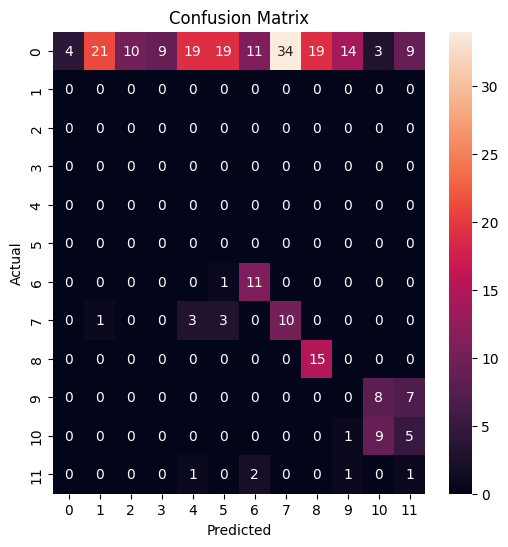

Epoch 0/50 ---> Train Accuracy: 64.65610004362367%, Validation Accuracy: 12.07843137254902%
Epoch 0/50 runtime: 0.9222875277201334 minutes


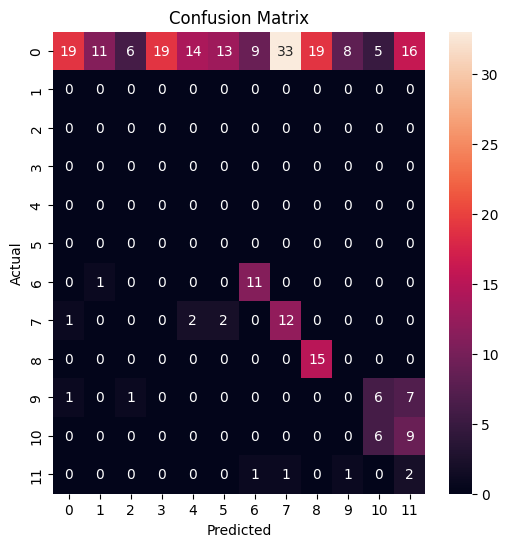

Epoch 1/50 ---> Train Accuracy: 81.2156463574233%, Validation Accuracy: 16.235294117647058%
Epoch 1/50 runtime: 0.5637280901273092 minutes


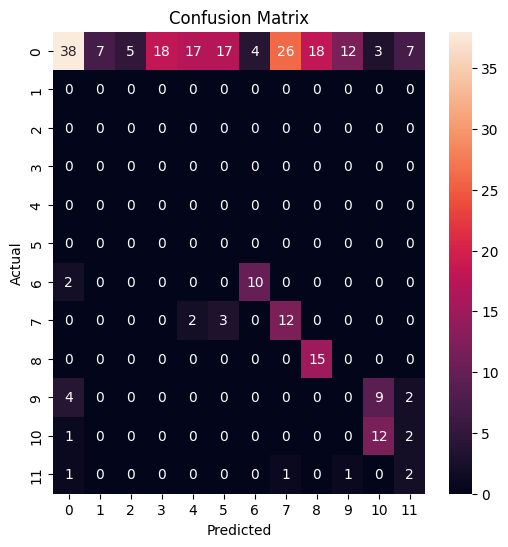

Epoch 2/50 ---> Train Accuracy: 86.2091028064563%, Validation Accuracy: 30.823529411764707%
Epoch 2/50 runtime: 0.5148205796877543 minutes


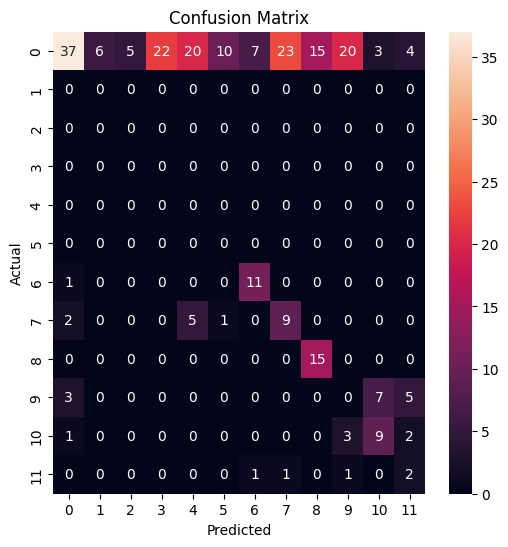

Epoch 3/50 ---> Train Accuracy: 88.89050458048568%, Validation Accuracy: 29.098039215686274%
Epoch 3/50 runtime: 0.5008903781572978 minutes


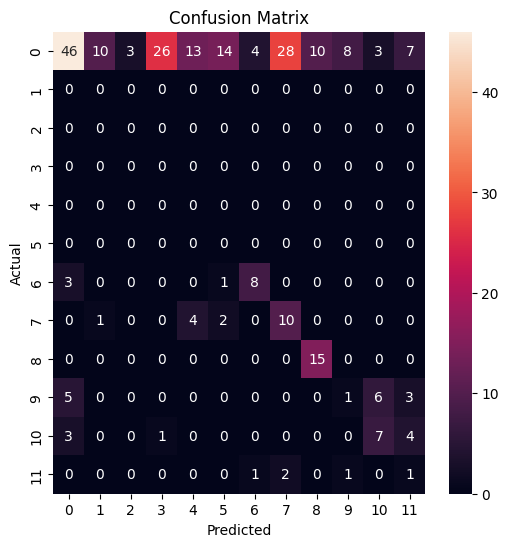

Epoch 4/50 ---> Train Accuracy: 90.31263632397848%, Validation Accuracy: 35.68627450980392%
Epoch 4/50 runtime: 0.6097042640050252 minutes


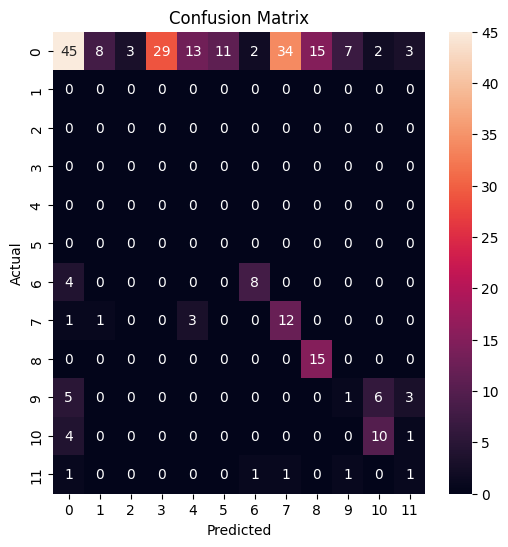

Epoch 5/50 ---> Train Accuracy: 91.83074014832049%, Validation Accuracy: 38.03921568627451%
Epoch 5/50 runtime: 0.5144600391387939 minutes


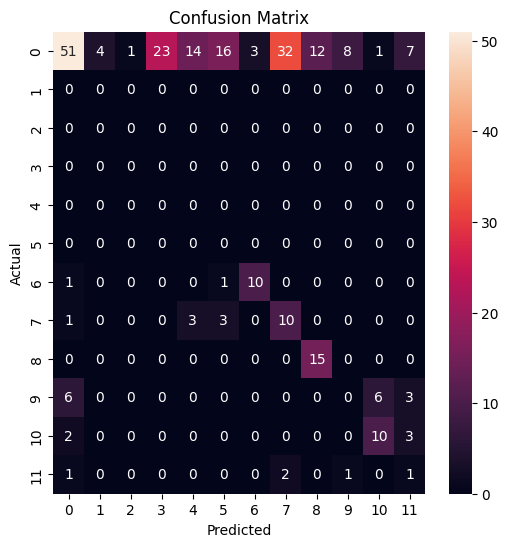

Epoch 6/50 ---> Train Accuracy: 92.15937181910716%, Validation Accuracy: 38.03921568627451%
Epoch 6/50 runtime: 0.5427454352378845 minutes


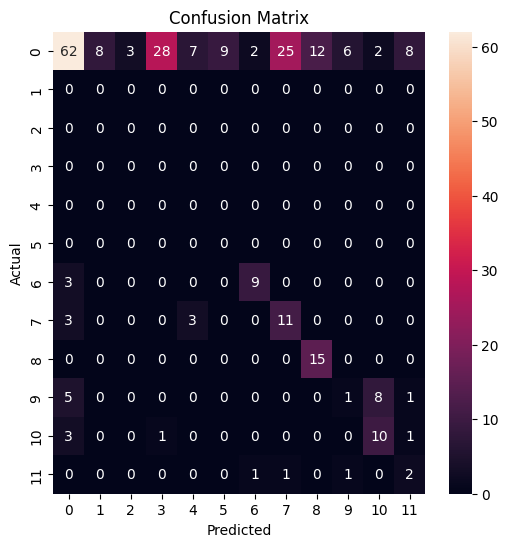

Epoch 7/50 ---> Train Accuracy: 93.54078813436091%, Validation Accuracy: 42.03921568627451%
Epoch 7/50 runtime: 0.6597113688786824 minutes


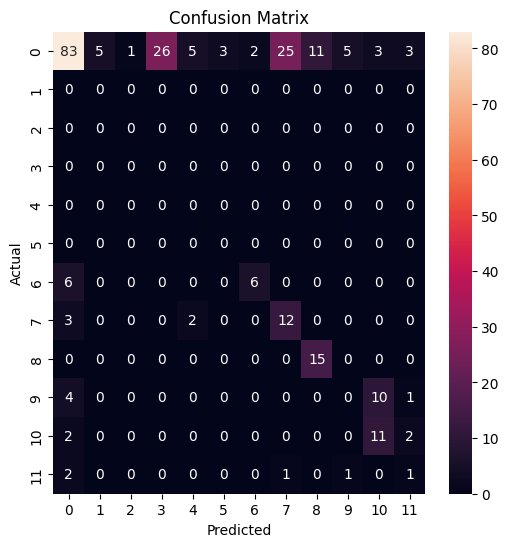

Epoch 8/50 ---> Train Accuracy: 93.79962192816635%, Validation Accuracy: 47.05882352941177%
Epoch 8/50 runtime: 0.9030134359995524 minutes


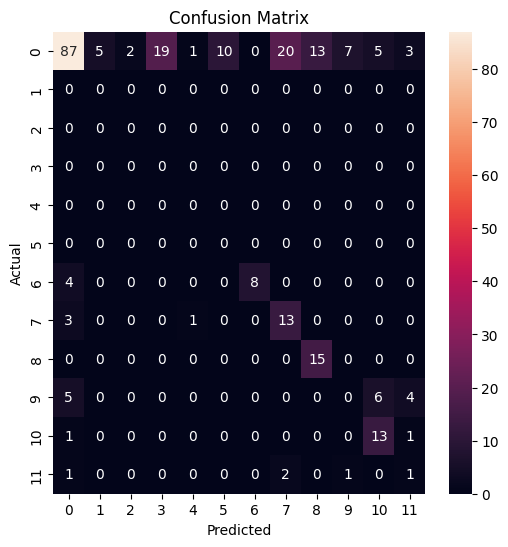

Epoch 9/50 ---> Train Accuracy: 94.19805147593428%, Validation Accuracy: 50.11764705882353%
Epoch 9/50 runtime: 0.6535885810852051 minutes


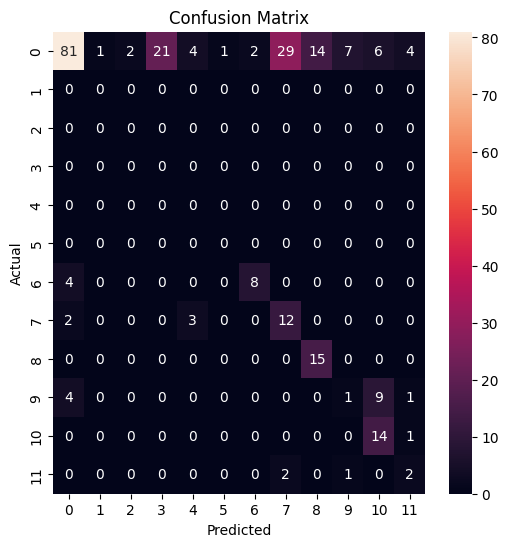

Epoch 10/50 ---> Train Accuracy: 94.17769376181475%, Validation Accuracy: 46.98039215686274%
Epoch 10/50 runtime: 0.5120212276776631 minutes


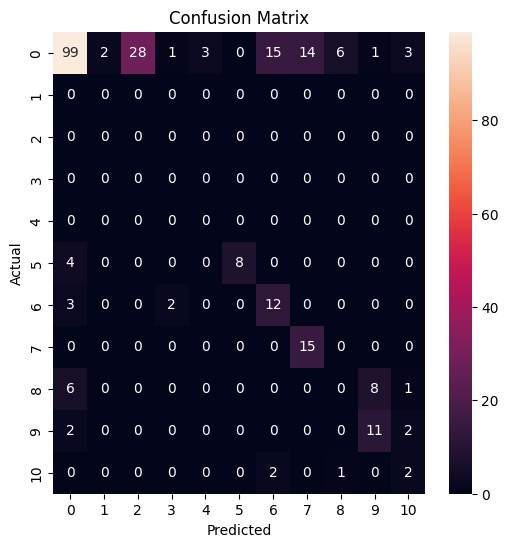

Epoch 11/50 ---> Train Accuracy: 94.42198633124909%, Validation Accuracy: 52.15686274509804%
Epoch 11/50 runtime: 0.5027262528737386 minutes


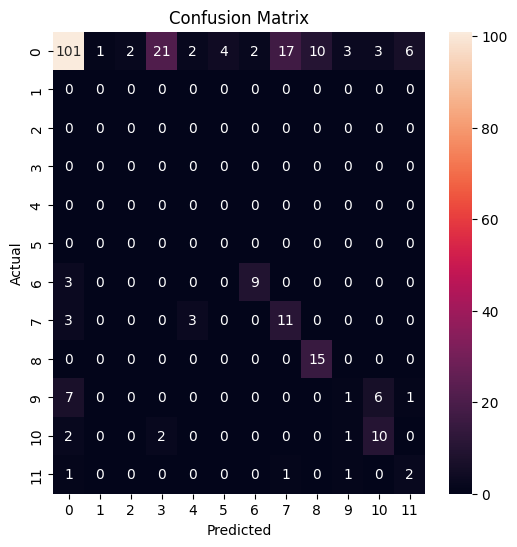

Epoch 12/50 ---> Train Accuracy: 94.52959139159518%, Validation Accuracy: 49.72549019607843%
Epoch 12/50 runtime: 0.5286868611971537 minutes


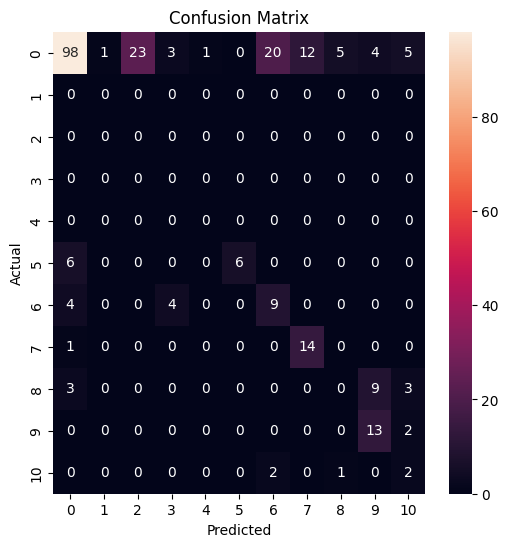

Epoch 13/50 ---> Train Accuracy: 94.85240657263341%, Validation Accuracy: 48.94117647058823%
Epoch 13/50 runtime: 0.507280957698822 minutes


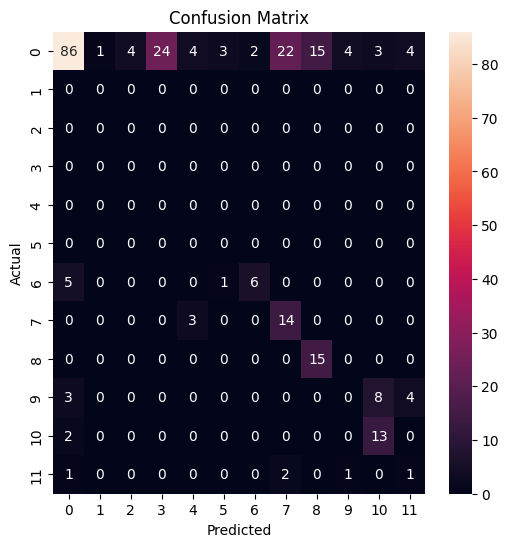

Epoch 14/50 ---> Train Accuracy: 94.62556347244438%, Validation Accuracy: 44.15686274509804%
Epoch 14/50 runtime: 0.5253291606903077 minutes


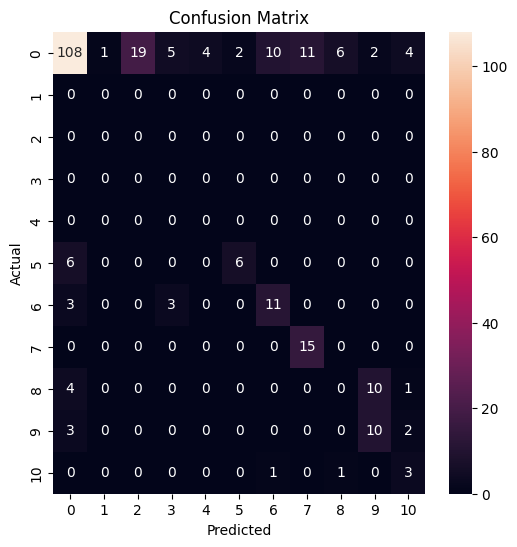

Epoch 15/50 ---> Train Accuracy: 95.19557946779119%, Validation Accuracy: 51.05882352941177%
Epoch 15/50 runtime: 0.5080103874206543 minutes


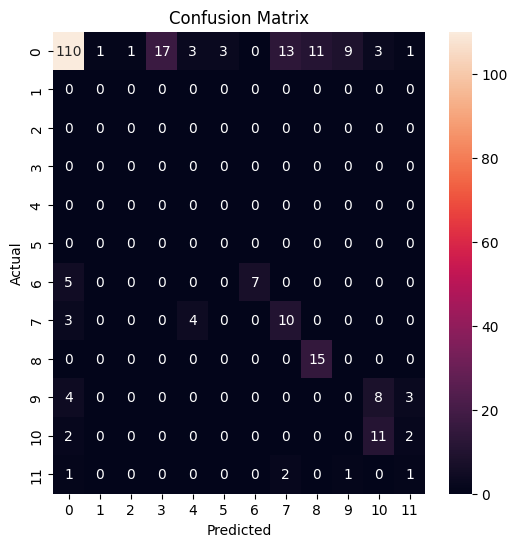

Epoch 16/50 ---> Train Accuracy: 95.53002762832631%, Validation Accuracy: 53.72549019607843%
Epoch 16/50 runtime: 0.5011689146359761 minutes


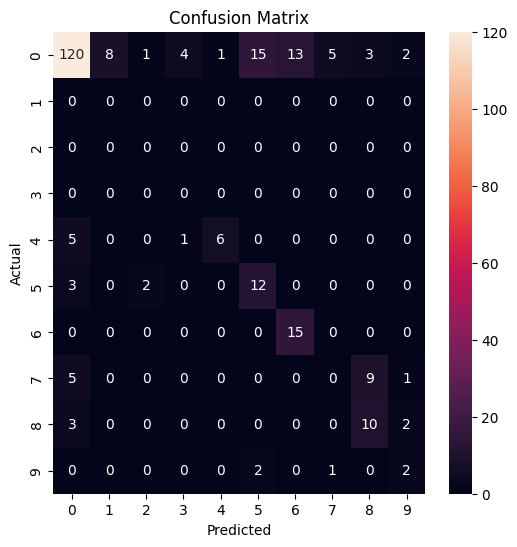

Epoch 17/50 ---> Train Accuracy: 95.44278028209975%, Validation Accuracy: 53.568627450980394%
Epoch 17/50 runtime: 0.5009783506393433 minutes


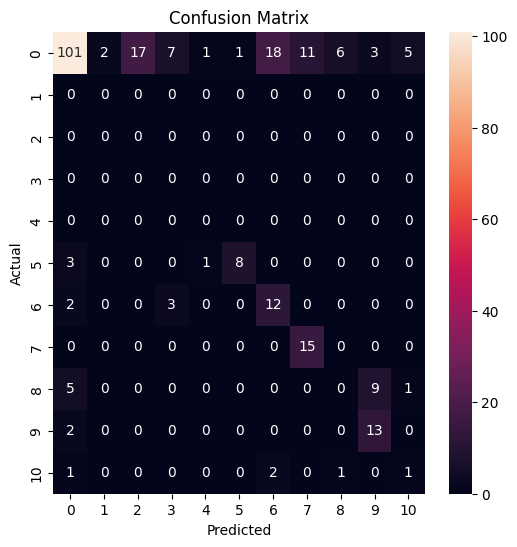

Epoch 18/50 ---> Train Accuracy: 95.61436672967864%, Validation Accuracy: 52.0%
Epoch 18/50 runtime: 0.49902393817901614 minutes


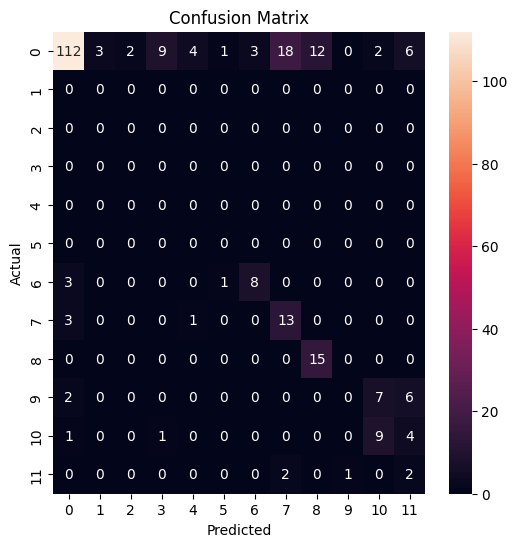

Epoch 19/50 ---> Train Accuracy: 93.98574960011634%, Validation Accuracy: 53.72549019607843%
Epoch 19/50 runtime: 0.5121802846590678 minutes


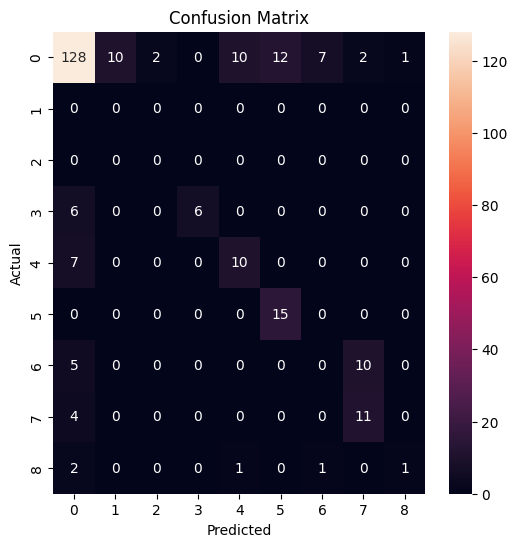

Epoch 20/50 ---> Train Accuracy: 95.94590664533953%, Validation Accuracy: 56.86274509803921%
Epoch 20/50 runtime: 0.5365480303764343 minutes


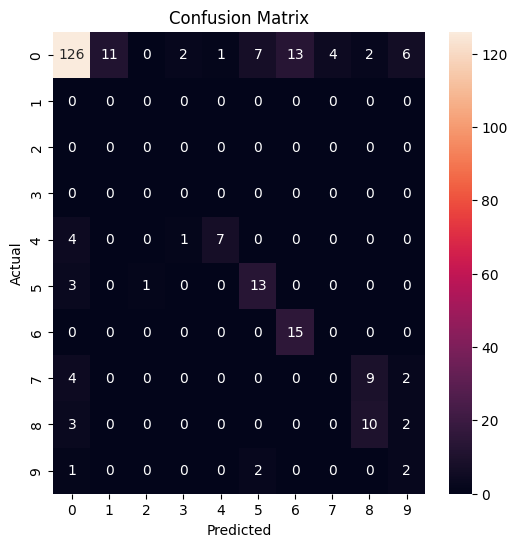

Epoch 21/50 ---> Train Accuracy: 95.63763268867238%, Validation Accuracy: 56.94117647058823%
Epoch 21/50 runtime: 0.5179547309875489 minutes


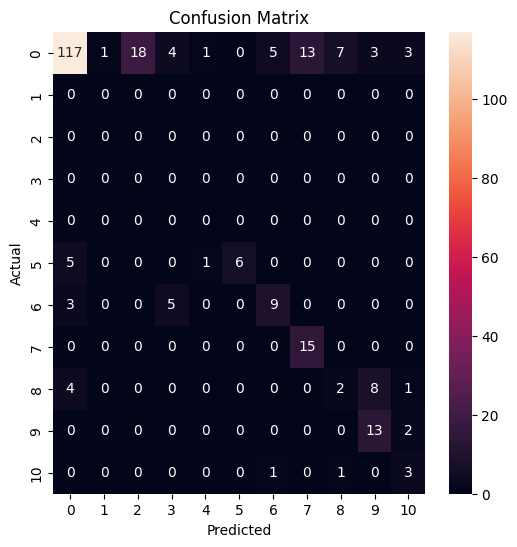

Epoch 22/50 ---> Train Accuracy: 95.71033881052784%, Validation Accuracy: 52.78431372549019%
Epoch 22/50 runtime: 0.5077870806058248 minutes


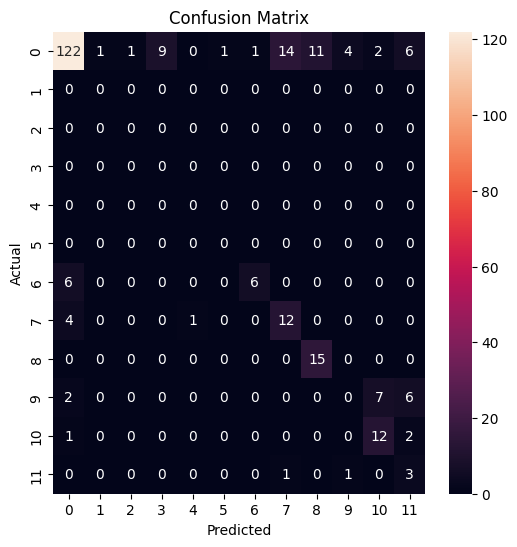

Epoch 23/50 ---> Train Accuracy: 95.7045223207794%, Validation Accuracy: 54.8235294117647%
Epoch 23/50 runtime: 0.5197938243548076 minutes


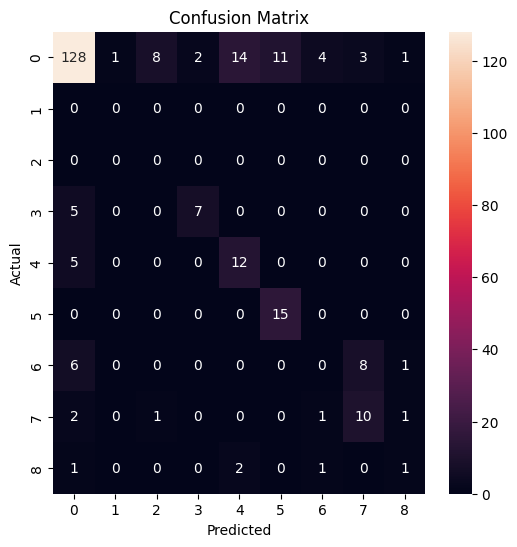

Epoch 24/50 ---> Train Accuracy: 95.89646648247782%, Validation Accuracy: 59.21568627450981%
Epoch 24/50 runtime: 0.49990415573120117 minutes


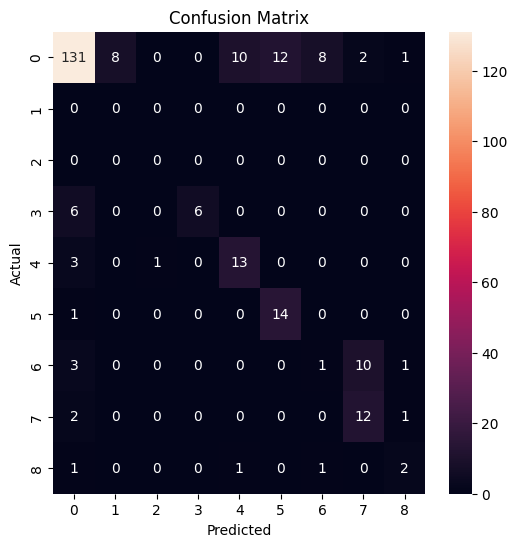

Epoch 25/50 ---> Train Accuracy: 95.74814599389269%, Validation Accuracy: 60.86274509803921%
Epoch 25/50 runtime: 0.5069682995478312 minutes


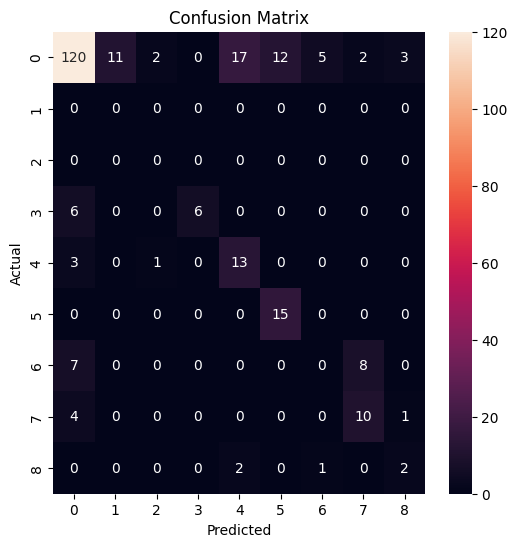

Epoch 26/50 ---> Train Accuracy: 95.90519121710048%, Validation Accuracy: 56.86274509803921%
Epoch 26/50 runtime: 0.5135666251182556 minutes


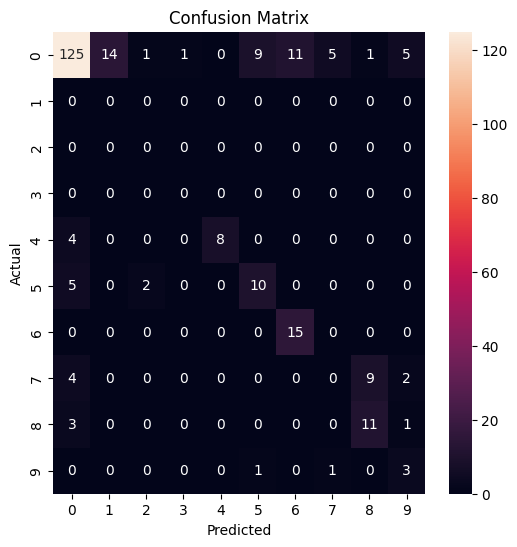

Epoch 27/50 ---> Train Accuracy: 96.20183219427076%, Validation Accuracy: 57.01960784313726%
Epoch 27/50 runtime: 0.5328810493151347 minutes


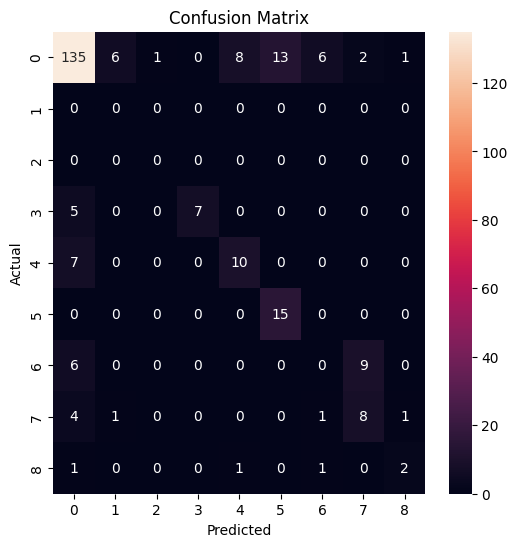

Epoch 28/50 ---> Train Accuracy: 95.24792787552713%, Validation Accuracy: 61.72549019607843%
Epoch 28/50 runtime: 0.5140582958857218 minutes


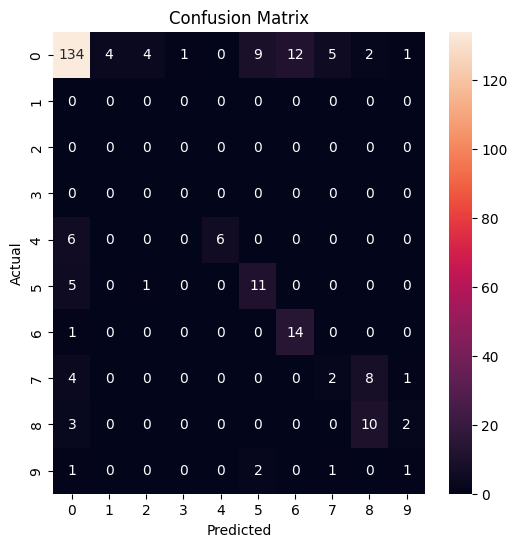

Epoch 29/50 ---> Train Accuracy: 96.28907954049731%, Validation Accuracy: 60.627450980392155%
Epoch 29/50 runtime: 0.5077759742736816 minutes


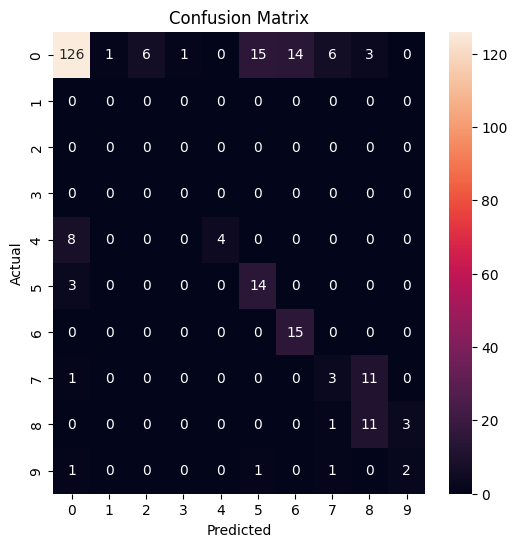

Epoch 30/50 ---> Train Accuracy: 96.08259415442781%, Validation Accuracy: 60.94117647058823%
Epoch 30/50 runtime: 0.5176215926806133 minutes


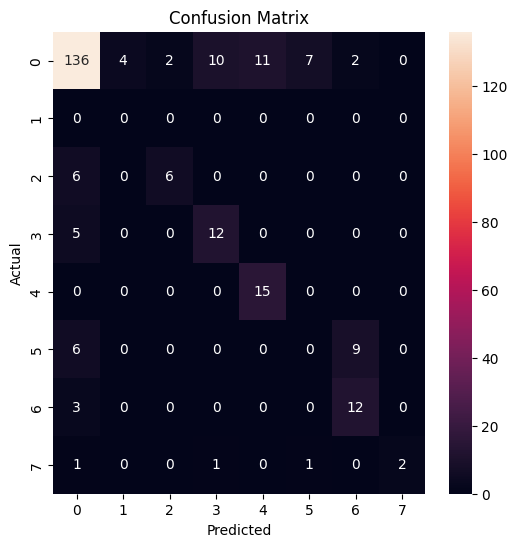

Epoch 31/50 ---> Train Accuracy: 96.10295186854734%, Validation Accuracy: 62.431372549019606%
Epoch 31/50 runtime: 0.5107190767923991 minutes


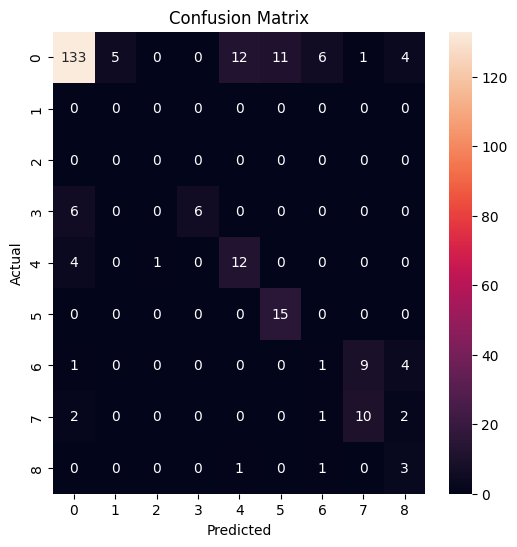

Epoch 32/50 ---> Train Accuracy: 95.84993456449033%, Validation Accuracy: 59.529411764705884%
Epoch 32/50 runtime: 0.537179168065389 minutes


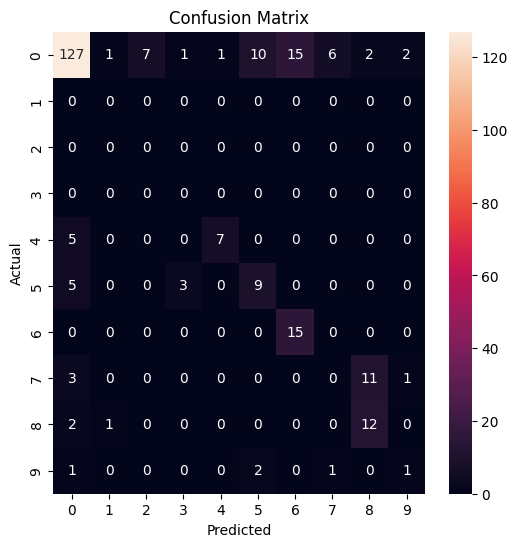

Epoch 33/50 ---> Train Accuracy: 96.3036207648684%, Validation Accuracy: 60.549019607843135%
Epoch 33/50 runtime: 0.517447559038798 minutes


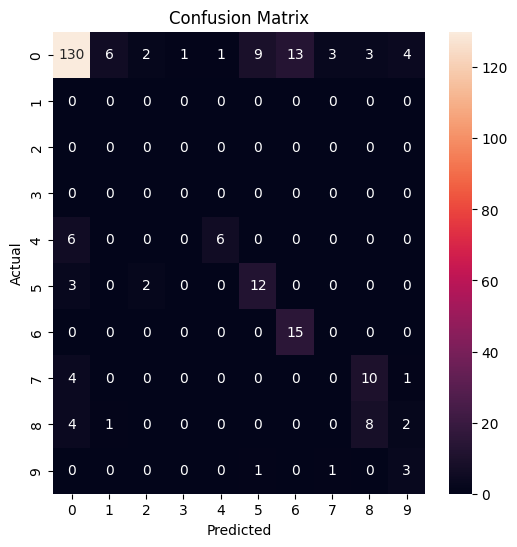

Epoch 34/50 ---> Train Accuracy: 96.25418060200668%, Validation Accuracy: 58.98039215686274%
Epoch 34/50 runtime: 0.5258416493733724 minutes


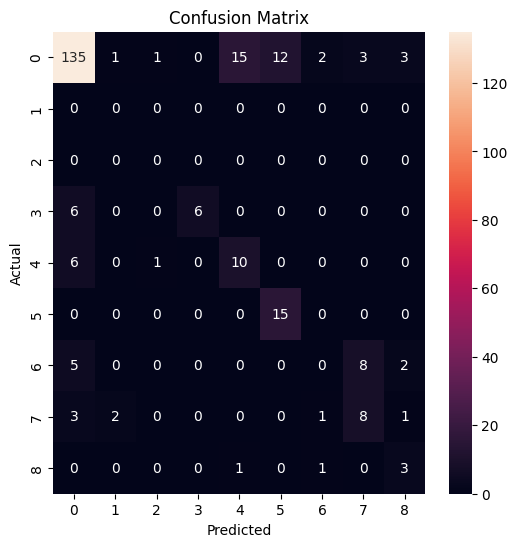

Epoch 35/50 ---> Train Accuracy: 96.05641995055984%, Validation Accuracy: 61.64705882352941%
Epoch 35/50 runtime: 0.5213208834330241 minutes


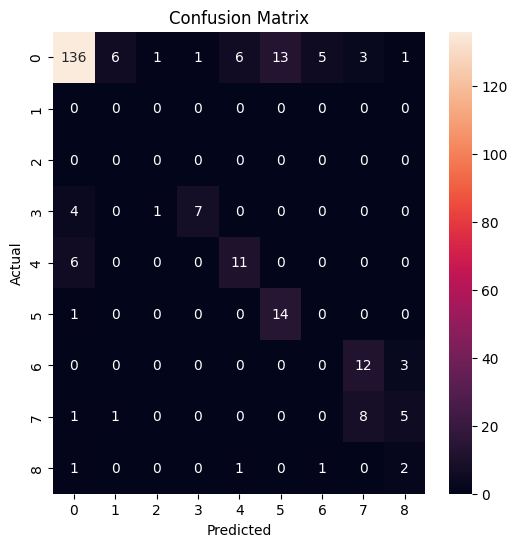

Epoch 36/50 ---> Train Accuracy: 96.13203431728951%, Validation Accuracy: 59.13725490196079%
Epoch 36/50 runtime: 0.5132264931996663 minutes


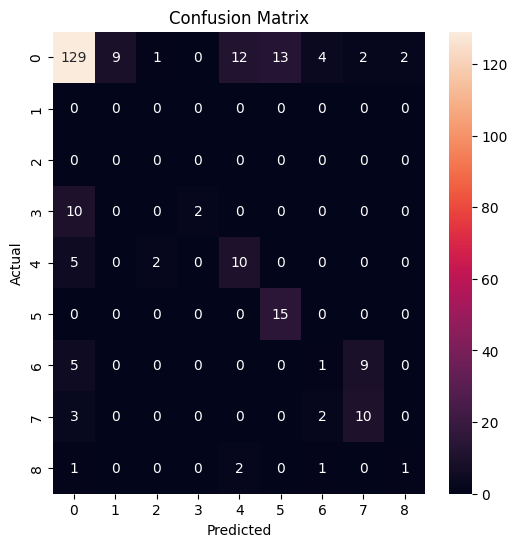

Epoch 37/50 ---> Train Accuracy: 96.21637341864185%, Validation Accuracy: 59.76470588235294%
Epoch 37/50 runtime: 0.5008232156435649 minutes


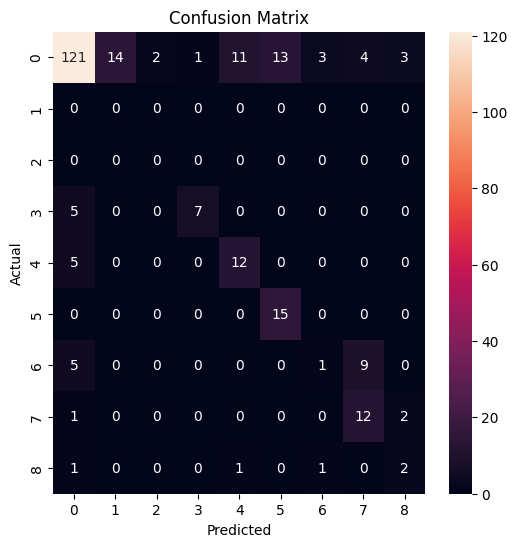

Epoch 38/50 ---> Train Accuracy: 96.33851970335903%, Validation Accuracy: 58.90196078431372%
Epoch 38/50 runtime: 0.49950972000757854 minutes


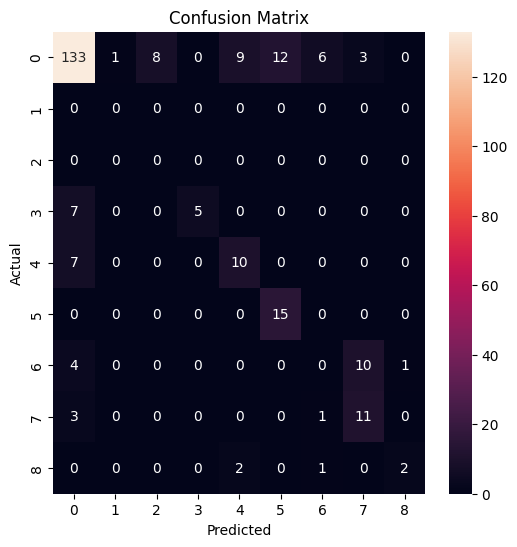

Epoch 39/50 ---> Train Accuracy: 96.30071251999418%, Validation Accuracy: 62.19607843137255%
Epoch 39/50 runtime: 0.5023308753967285 minutes


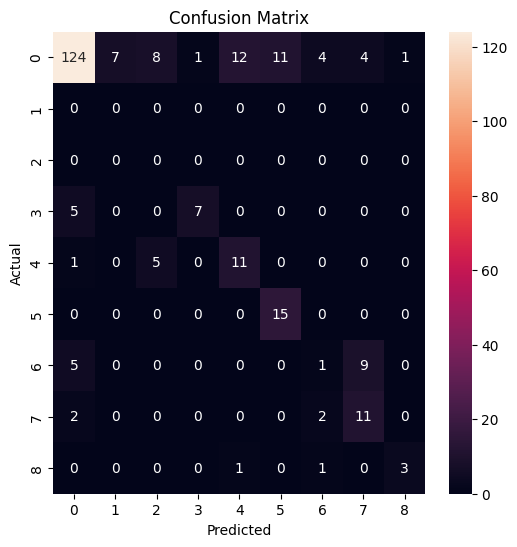

Epoch 40/50 ---> Train Accuracy: 95.89646648247782%, Validation Accuracy: 56.15686274509804%
Epoch 40/50 runtime: 0.5415388584136963 minutes


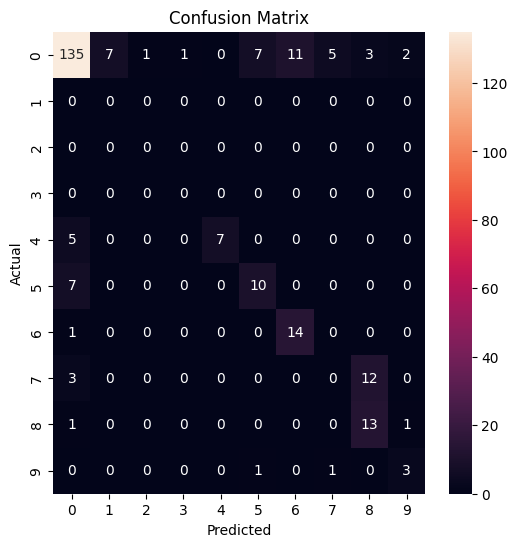

Epoch 41/50 ---> Train Accuracy: 96.7311327613785%, Validation Accuracy: 62.588235294117645%
Epoch 41/50 runtime: 0.5127126455307007 minutes


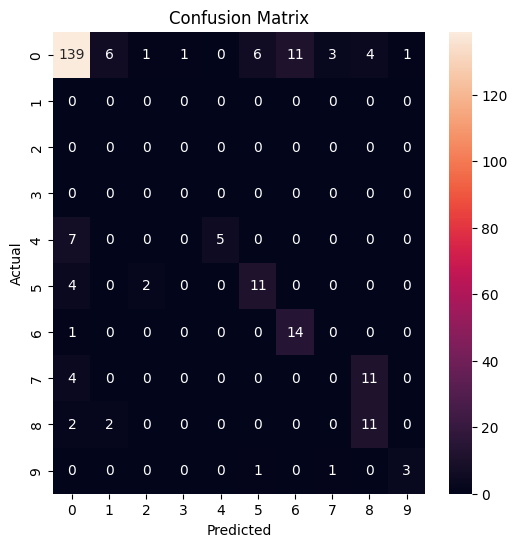

Epoch 42/50 ---> Train Accuracy: 96.7136832921332%, Validation Accuracy: 63.68627450980392%
Epoch 42/50 runtime: 0.4977420051892599 minutes


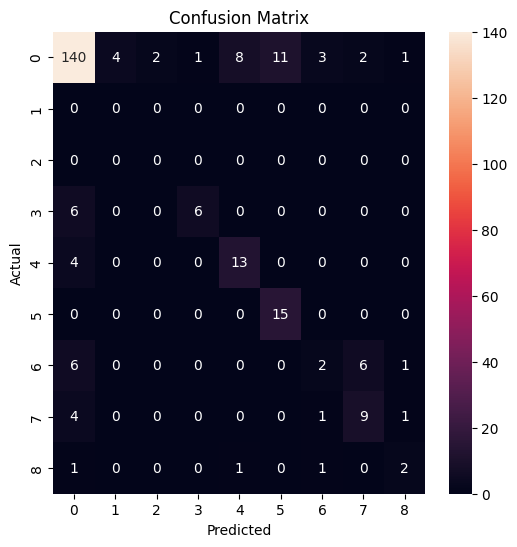

Epoch 43/50 ---> Train Accuracy: 96.58281227279338%, Validation Accuracy: 62.745098039215684%
Epoch 43/50 runtime: 0.5213403503100077 minutes


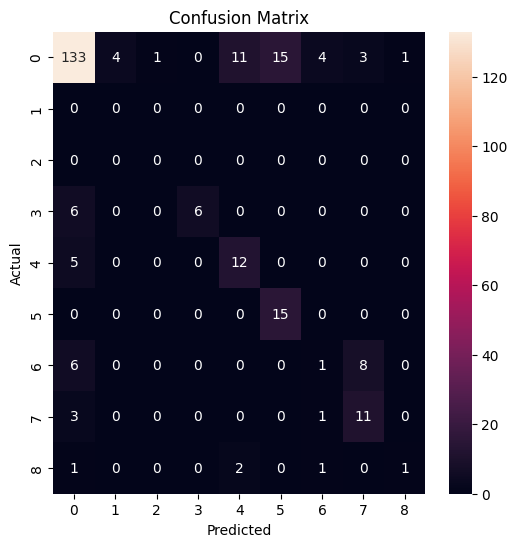

Epoch 44/50 ---> Train Accuracy: 96.67878435364257%, Validation Accuracy: 63.84313725490196%
Epoch 44/50 runtime: 0.4972332835197449 minutes


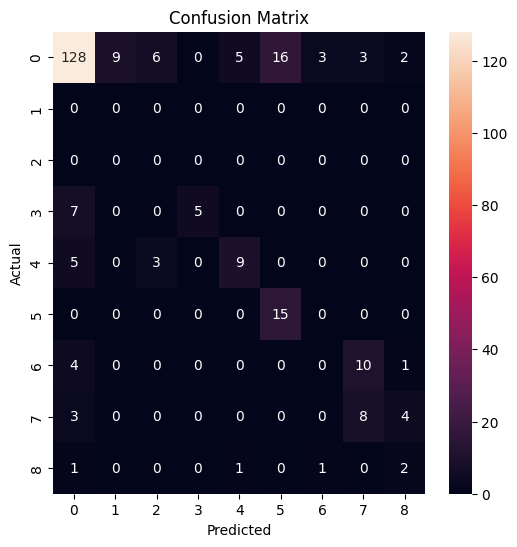

Epoch 45/50 ---> Train Accuracy: 96.33270321361059%, Validation Accuracy: 56.3921568627451%
Epoch 45/50 runtime: 0.49851940472920736 minutes


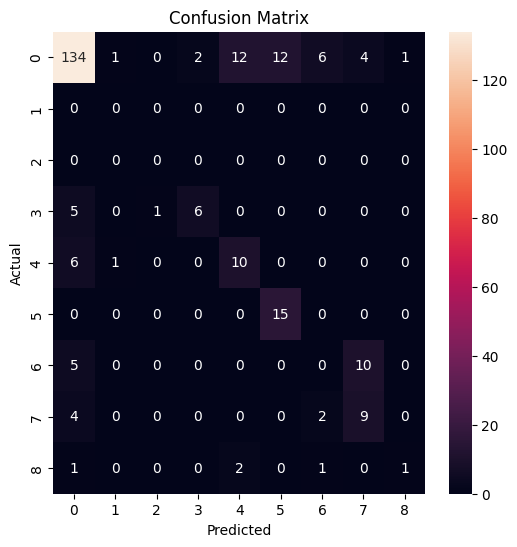

Epoch 46/50 ---> Train Accuracy: 96.67587610876836%, Validation Accuracy: 62.745098039215684%
Epoch 46/50 runtime: 0.5074749271074931 minutes


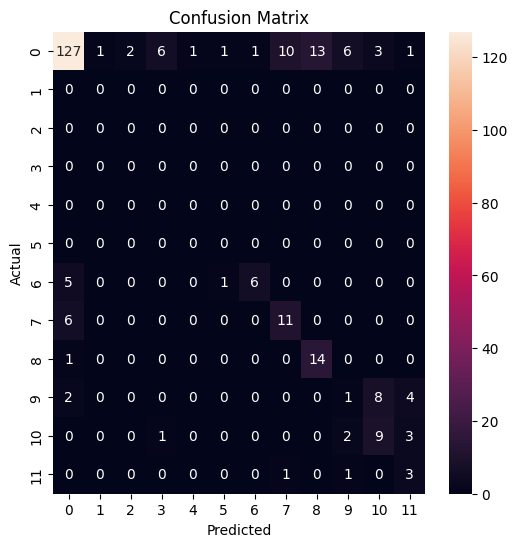

Epoch 47/50 ---> Train Accuracy: 96.35596917260433%, Validation Accuracy: 56.3921568627451%
Epoch 47/50 runtime: 0.5074052929878234 minutes


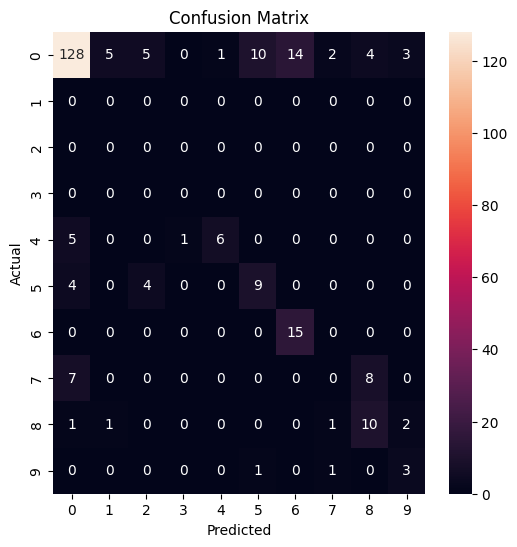

Epoch 48/50 ---> Train Accuracy: 96.45775774320198%, Validation Accuracy: 60.78431372549019%
Epoch 48/50 runtime: 0.5010424335797627 minutes


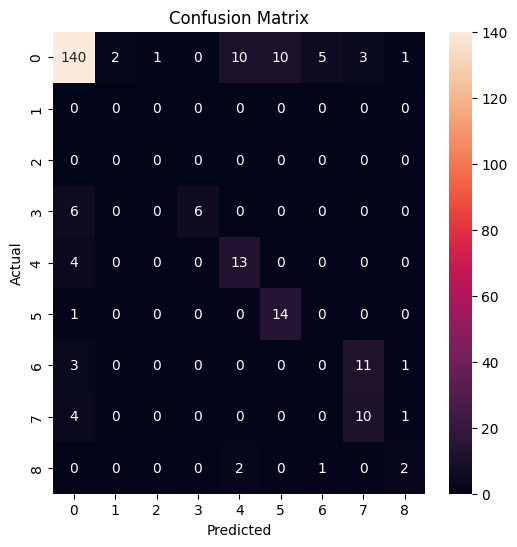

Epoch 49/50 ---> Train Accuracy: 96.90562745383161%, Validation Accuracy: 63.05882352941177%
Epoch 49/50 runtime: 0.5093591968218486 minutes


In [31]:
# Hyperparameters
input_size = X_train.shape[2]
hidden_size = 256  # Number of hidden units in RNN
num_classes = 13  # For classification
epochs = 50
learning_rate = 0.001 #0.01 #
batch_size = 512 #32
landa = 0.001  # Regularization term (lambda)

# Data preparation
train_dataset = TensorDataset(t.tensor(padded_sequences, dtype=t.float32), t.tensor(y_train, dtype=t.long))
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TensorDataset(t.tensor(padded_sequences_test, dtype=t.float32), t.tensor(y_test, dtype=t.long))
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# RNN layers and additional fully connected layer
rnn_layer1 = nn.LSTM(input_size, hidden_size, batch_first=True)
dropout1 = nn.Dropout(0.3)  # Add dropout between RNN layers, changed to 0.3
rnn_layer2 = nn.LSTM(hidden_size, hidden_size, batch_first=True)
dropout2 = nn.Dropout(0.3)  # Add dropout between RNN layers
fc_layer1 = nn.Linear(hidden_size, hidden_size)  # Additional fully connected layer
fc_layer2 = nn.Linear(hidden_size, num_classes)  # Final output layer

# Dropout layer
dropout_fc = nn.Dropout(0.3)  # Add dropout between fully connected layers

# Activation function
relu = nn.ReLU()

# Loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)
#optimizer = Adam(list(rnn_layer1.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters()), lr=learning_rate)

# Lists to store accuracies and losses
train_accuracy_list = []
validation_accuracy_list = []
train_loss_list = []

class_report_list = []
conf_matrix_list = []

# To be used inside t.no_grad()
loss_list_train = []
loss_list_val = []

# Training loop
for epoch in range(epochs):

    st = time.time()

    if epoch % 10 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []
    for X, Y in train_data_loader:
        # Forward pass through layers
        out, _ = rnn_layer1(X)
        out = dropout1(out)  # Apply dropout between RNN layers
        out, _ = rnn_layer2(out)
        out = dropout2(out)  # Apply dropout between RNN layers
        out = out[:, -1, :]  # Get the last output of the sequence
        out = relu(fc_layer1(out))  # Apply activation function after first fully connected layer
        out = dropout_fc(out)  # Apply dropout between fully connected layers
        out = fc_layer2(out)

        # Regularization
        l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
        loss = loss_fn(out, Y) + landa * l2_term
        #loss = loss_fn(out, Y)

        per_epoch_loss_list.append(loss.item())

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluation on training and validation data
    rnn_layer1.eval()
    # rnn_layer2.eval()
    fc_layer1.eval()
    fc_layer2.eval()

    with t.no_grad():
        # Training data
        train_correct, train_total = 0, 0
        for X, Y in train_data_loader:
            out, _ = rnn_layer1(X)
            out = dropout1(out)  # Apply dropout between RNN layers
            out, _ = rnn_layer2(out)
            out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)

            # Regularization
            l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
            loss = loss_fn(out, Y) + landa * l2_term
            loss_list_train.append(loss.item())

            train_total += Y.size(0)
            train_correct += (predicted == Y).sum().item()
        train_accuracy = 100 * train_correct / train_total

        # Validation data
        validation_correct, validation_total = 0, 0
        for X, Y in test_data_loader:
            out, _ = rnn_layer1(X)
            out = dropout1(out)  # Apply dropout between RNN layers
            out, _ = rnn_layer2(out)
            out = dropout2(out)  # Apply dropout between RNN layers
            out = out[:, -1, :]
            out = relu(fc_layer1(out))
            out = dropout_fc(out)  # Apply dropout between fully connected layers
            out = fc_layer2(out)
            _, predicted = t.max(out.data, 1)

            # Regularization
            l2_term = sum([(w ** 2).sum() for w in list(rnn_layer1.parameters()) + list(rnn_layer2.parameters()) + list(fc_layer1.parameters()) + list(fc_layer2.parameters())])
            loss_val = loss_fn(out, Y) + landa * l2_term
            loss_list_val.append(loss_val.item())

            validation_total += Y.size(0)
            validation_correct += (predicted == Y).sum().item()

            conf_matrix_test, class_report_test=get_scores(Y,predicted)

        plot_cm(conf_matrix_test)

        validation_accuracy = 100 * validation_correct / validation_total

        # Print accuracy for the current epoch
        print(f'Epoch {epoch}/{epochs} ---> Train Accuracy: {train_accuracy}%, Validation Accuracy: {validation_accuracy}%')

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)
        class_report_list.append(class_report_test)
        conf_matrix_list.append(conf_matrix_test)

        et = time.time()

        print(f'Epoch {epoch}/{epochs} runtime:', str((et - st)/60), 'minutes')

    # Calculate and append the average loss for the epoch
    train_loss_list.append(sum(per_epoch_loss_list) / len(per_epoch_loss_list))

    # Set the model back to train mode
    rnn_layer1.train()
    rnn_layer2.train()
    fc_layer1.train()
    fc_layer2.train()


In [32]:
print(f'Train loss: {np.mean(loss_list_train)}')
print(f'Validation loss: {np.mean(loss_list_val)}')

Train loss: 0.44428279472624554
Validation loss: 1.8000128022829691


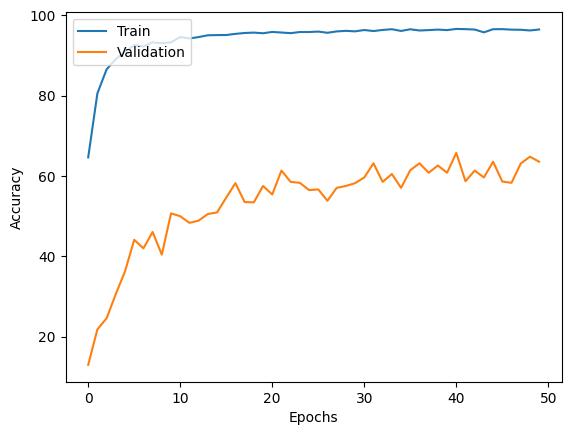

In [61]:
# Plot training and validation accuracy over epochs
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="Train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label="Validation")
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

In [62]:
class_report_list

[{'0': {'precision': 0.9,
   'recall': 0.05232558139534884,
   'f1-score': 0.09890109890109891,
   'support': 172},
  '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
  '7': {'precision': 0.5882352941176471,
   'recall': 0.8333333333333334,
   'f1-score': 0.6896551724137931,
   'support': 12},
  '8': {'precision': 0.15217391304347827,
   'recall': 0.4117647058823529,
   'f1-score': 0.2222222222222222,
   'support': 17},
  '9': {'precision': 0.4482758620689655,
   'recall': 0.8666666666666667,
   'f1-score': 0.5909090909090909,
   'support': 15},
  '10': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15},
  '11': {'precision': 0.44,
   'recall': 0.7333333333333333